In [1]:
!pip install nltk

You should consider upgrading via the 'G:\anacondapy3\python.exe -m pip install --upgrade pip' command.


In [30]:
import pandas as pd
import numpy as np

import matplotlib.colors as mcolors
from matplotlib import pyplot as plt
%matplotlib inline

import seaborn as sns

from wordcloud import WordCloud

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# t-SNE and Bokeh vis
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models

# Progress bar
from tqdm.notebook import tqdm

# Word Counter
from collections import Counter


import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import pprint
pp = pprint.PrettyPrinter(indent=4)

In [3]:
LTC_BINARY = '../data/ltc_matrices/ltc_matrix_binary_mm4.tsv'

ltc_patients = pd.read_csv(LTC_BINARY, sep = '\t')

ltc_patients.head(5)


,patient_id,dermatitis,erectile_dysfunction,OA,pri_skin,skin_ulcer,female_genital_prolapse,fracture_hip,obesity,spondylosis,...,cerebral_palsy,pri_mesothelioma,pri_brain,thala,sick_sinus,ADHD,juv_arth,downs,entero_arthro,SARS_CoV2
0,1000059,1,1,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1000062,0,0,0,0,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
2,1000077,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1000124,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1000146,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
len(ltc_patients['patient_id'].unique())



143168

In [5]:
list_of_patients = []

patients = ltc_patients['patient_id'].unique()
ltcs = ltc_patients.drop('patient_id', axis = 1)
index = 0

# Iterate through patients
for patient in patients:
    
    # Start with empty list of LTCs for each patient
    patient_ltcs = []
    
    # Iterate through each LTC for patient
    for ltc in ltcs:
        
        # Check if patient has LTC
        if ltc_patients.at[index, ltc] == 1:
            
            # If LTC present, add to list of patient LTCs
            patient_ltcs.append(ltc)   
    
    # Add list of patient LTCs to list of patients        
    list_of_patients.append(patient_ltcs)
    
    # Increment index by 1
    index+=1

In [6]:
all_len = 0

for text in list_of_patients:
    all_len += len(text)
    
avg_len = all_len/len(list_of_patients)

print("All words: {n}".format(n=all_len))
print("Average LTCs per patient: {n}".format(n=avg_len))
print("Maximum amount of LTCs: {n}".format(n= max(len(x) for x in list_of_patients)))
print("Patients in corpus: {l}".format(l=len(list_of_patients)))
print("Example of patient record:\n {n}".format(n=list_of_patients[1]))



All words: 1104514
Average LTCs per patient: 7.714810572194904
Maximum amount of LTCs: 37
Patients in corpus: 143168
Example of patient record:
 ['female_genital_prolapse', 'fracture_hip', 'obesity', 'spondylosis', 'type_2_diabetes', 'unspecified_rare_diabetes', 'urine_incont']


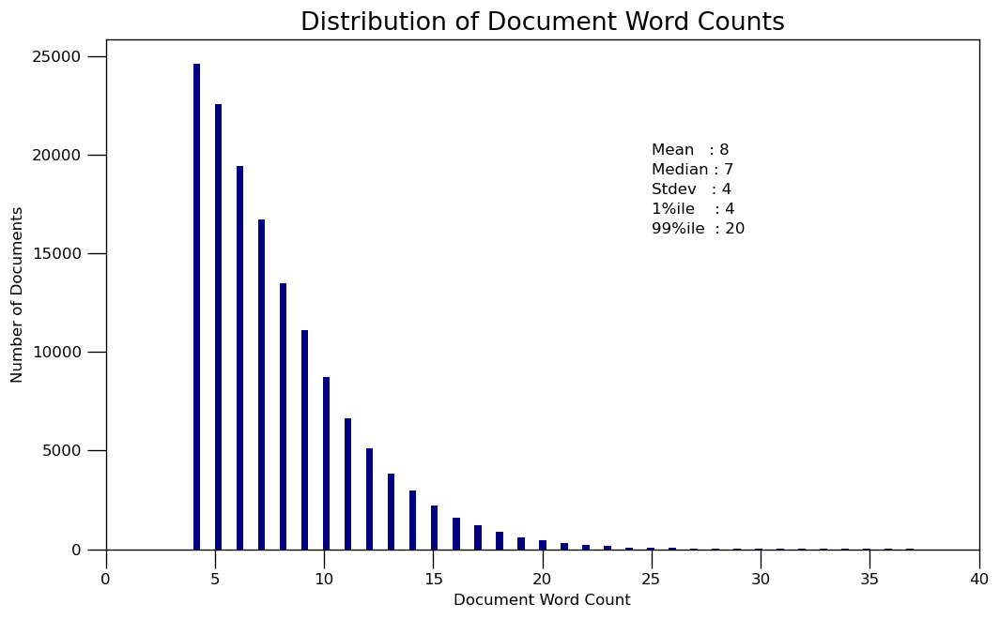

In [7]:
doc_lens = [len(d) for d in list_of_patients]

# Plot
plt.figure(figsize=(10,6), dpi=120)
plt.hist(doc_lens, bins = 100, color='navy')
plt.text(25, 20000, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(25,  19000, "Median : " + str(round(np.median(doc_lens))))
plt.text(25,  18000, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(25,  17000, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(25,  16000, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 40), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=12)
plt.xticks(np.linspace(0,40,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=16))
plt.show()

In [11]:
counter_obj = Counter()
for patient in list_of_patients:

    counter_obj += Counter(patient)
    
counter_obj.most_common(10)

[('enthesopathy', 56821),
 ('hypertension', 56254),
 ('dermatitis', 48821),
 ('depression', 47258),
 ('OA', 43201),
 ('sinusitis', 35633),
 ('allergic_rhinitis', 33200),
 ('anxiety_phobia', 28987),
 ('hearing_loss', 25926),
 ('GORD', 24745)]

In [64]:
id2word = corpora.Dictionary(list_of_patients)

corpus = []
for text in list_of_patients:
    new = id2word.doc2bow(text)
    corpus.append(new)

In [65]:
print(corpus[202][0:30])
print(id2word[202])

[(14, 1), (18, 1), (22, 1), (61, 1), (144, 1)]
SARS_CoV2


In [66]:
lda_model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=5,
                                           workers=3,
                                           random_state=100,
                                           chunksize=500,
                                           passes=10,
                                           alpha="asymmetric",
                                           eta=1.0)

# Note: num_topics attempted: 20, 15, 10, 5, 6, 4

In [67]:
# Compute Coherence Score
# Baseline Coherence Score with 4 topics, alpha = symmetric, eta = None: 0.3880742386
baseline = 0.3880742386

coherence_model_lda = CoherenceModel(model=lda_model, texts=list_of_patients, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

print("{n:0.2f}% Improvement".format(n=(coherence_lda*100/baseline)-100))


Coherence Score:  0.43784169279623864
12.82% Improvement


In [16]:
def lda_hyperparameter_tuning(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k,
                                           workers=3,
                                           random_state=100,
                                           chunksize=500,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=list_of_patients, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [19]:
grid = {}
grid['Validation_Set'] = {}

# Topics range
min_topics = 4
max_topics = 15
step_size = 1
topics_range = range(min_topics, max_topics, step_size)

# Alpha parameter
alpha = list(np.linspace(0, 1, 5))
alpha.pop(0)
alpha.append('symmetric')
alpha.append('asymmetric')

# Beta parameter
beta = list(np.linspace(0, 1, 5))
beta.pop(0)
beta.append('symmetric')

# Validation sets
num_of_docs = len(corpus)
corpus_sets = [# gensim.utils.ClippedCorpus(corpus, num_of_docs*0.25), 
               # gensim.utils.ClippedCorpus(corpus, num_of_docs*0.5), 
               #gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]

corpus_title = ['100% Corpus']
model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

# iterate through validation corpuses: 1
for i in range(len(corpus_sets)):
    # iterate through number of topics: 11
    for k in tqdm(topics_range):
        # iterate through alpha values: 6
        for a in alpha:
            # iterare through beta values: 5
            for b in beta:
                # get the coherence score for the given parameters
                cv = lda_hyperparameter_tuning(corpus=corpus_sets[i], dictionary=id2word, 
                                              k=k, a=a, b=b)
                # Save the model results
                model_results['Validation_Set'].append(corpus_title[i])
                model_results['Topics'].append(k)
                model_results['Alpha'].append(a)
                model_results['Beta'].append(b)
                model_results['Coherence'].append(cv)

pd.DataFrame(model_results).to_csv('lda_tuning_results.csv', index=False)

  0%|          | 0/11 [00:00<?, ?it/s]

NameError: name 'pbar' is not defined

In [69]:
model_tuning = pd.read_csv('lda_tuning_results.csv')

sorted_model_tuning = model_tuning.sort_values(axis=0, by=['Coherence'], ascending=False, inplace=False)

len(sorted_model_tuning)
sorted_model_tuning.head(20)

,Validation_Set,Topics,Alpha,Beta,Coherence
58,75% Corpus,5,asymmetric,1.0,0.449498
26,75% Corpus,4,asymmetric,0.5,0.448889
28,75% Corpus,4,asymmetric,1.0,0.447993
29,75% Corpus,4,asymmetric,symmetric,0.446923
27,75% Corpus,4,asymmetric,0.75,0.443063
25,75% Corpus,4,asymmetric,0.25,0.442410
57,75% Corpus,5,asymmetric,0.75,0.441327
56,75% Corpus,5,asymmetric,0.5,0.439692
59,75% Corpus,5,asymmetric,symmetric,0.436586
55,75% Corpus,5,asymmetric,0.25,0.433548


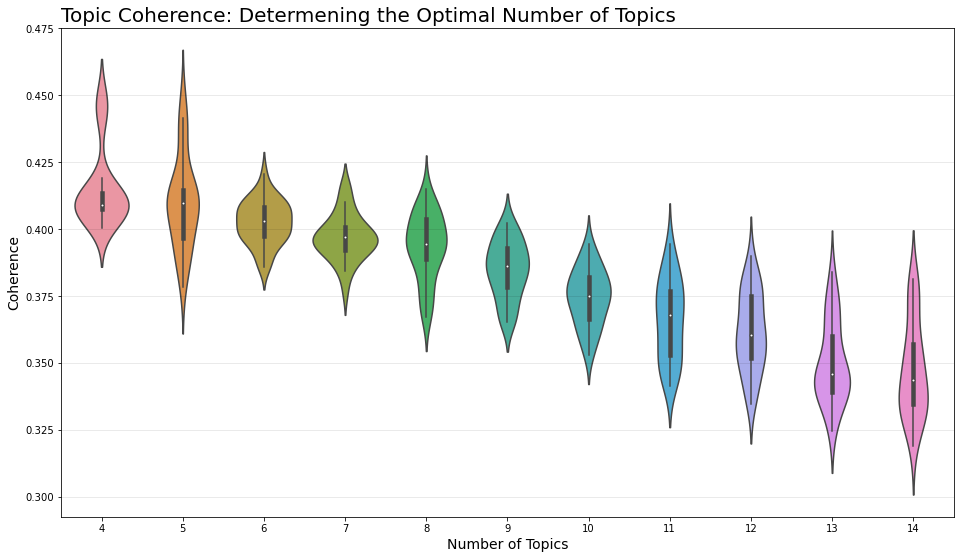

In [62]:

fig, ax = plt.subplots(figsize=(16,9))
sns.violinplot(ax=ax, data=model_tuning, x='Topics', y='Coherence')
ax.set_xlabel('Number of Topics', fontsize=14)
ax.set_ylabel('Coherence', fontsize=14)
ax.set_title('Topic Coherence: Determening the Optimal Number of Topics', loc='left', fontsize=20)
ax.yaxis.grid(color='black', which='both', alpha=0.1)

fig.savefig("../images/Violin Plot of Topic Coherence Scores.png", dpi=60)

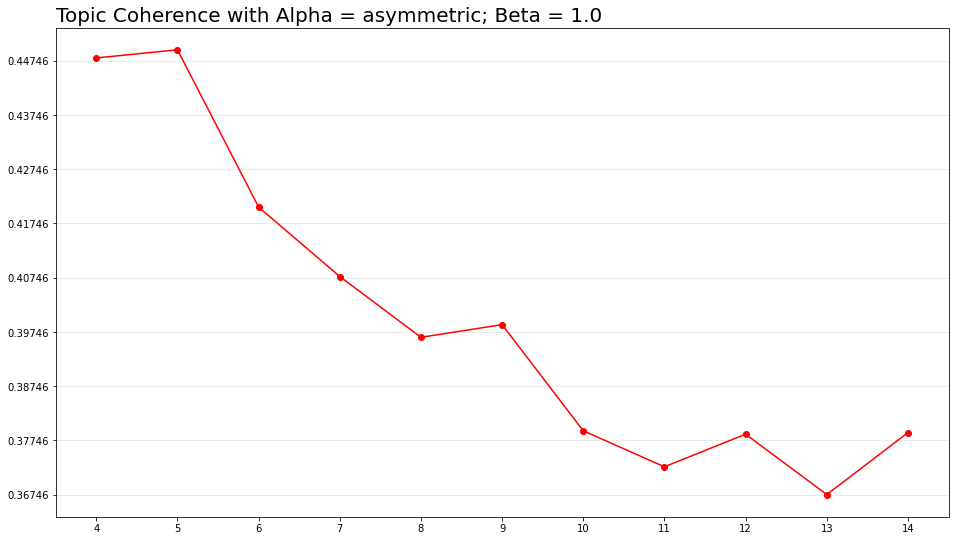

In [60]:
alpha = 'asymmetric'
beta = '1.0'
corpus = '75% Corpus'

filtered_model_tuning = model_tuning[(model_tuning['Alpha'] == alpha) 
                    & (model_tuning['Beta'] == beta)
                    & (model_tuning['Validation_Set'] == corpus)]

x = filtered_model_tuning['Topics']
y = filtered_model_tuning['Coherence']

fig, ax = plt.subplots(figsize=(16,9))

ax.plot(x, y, color='red', marker='o')
ax.set_title('Topic Coherence with Alpha = {a}; Beta = {b}'.format(a=alpha, b=beta), loc='left', fontsize=20)
ax.set_yticks(np.arange(min(y), max(y), 0.01))
plt.xticks(np.arange(min(x), max(x)+1, 1.0))
ax.yaxis.grid(color='black', which='both', alpha=0.1)


In [41]:
top_hyperp = model_tuning[(model_tuning['Topics']==4) & (model_tuning['Validation_Set']=='100% Corpus')]
top_hyperp.sort_values(axis=0, by=['Coherence'], ascending=False, inplace=True)
top_hyperp.head()

G:\anacondapy3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,Validation_Set,Topics,Alpha,Beta,Coherence
207,100% Corpus,4,asymmetric,0.61,0.444272
209,100% Corpus,4,asymmetric,symmetric,0.442410
205,100% Corpus,4,asymmetric,0.01,0.441819
206,100% Corpus,4,asymmetric,0.31,0.441680
208,100% Corpus,4,asymmetric,0.9099999999999999,0.440264


In [15]:
pp.pprint(lda_model.print_topics())

[   (   0,
        '0.072*"dermatitis" + 0.067*"enthesopathy" + 0.056*"OA" + '
        '0.053*"allergic_rhinitis" + 0.051*"sinusitis" + 0.047*"hypertension" '
        '+ 0.039*"GORD" + 0.036*"asthma" + 0.033*"hearing_loss" + '
        '0.027*"depression"'),
    (   1,
        '0.139*"anxiety_phobia" + 0.132*"depression" + 0.084*"PTSD" + '
        '0.070*"menorrhagia" + 0.045*"migraine" + 0.045*"cin_cervical" + '
        '0.042*"somatoform" + 0.038*"enthesopathy" + '
        '0.031*"irritable_bowel_syndrome" + 0.027*"obesity"'),
    (   2,
        '0.144*"type_2_diabetes" + 0.121*"obesity" + 0.094*"hypertension" + '
        '0.089*"unspecified_rare_diabetes" + 0.063*"diab_eye" + '
        '0.044*"erectile_dysfunction" + 0.032*"cholelithiasis" + 0.030*"CHD" + '
        '0.028*"NAFLD_NASH" + 0.028*"sleep_apnoea"'),
    (   3,
        '0.093*"hypertension" + 0.080*"CHD" + 0.076*"erectile_dysfunction" + '
        '0.062*"BPH" + 0.061*"gout" + 0.054*"atrial_fibrilation" + '
        '0.049*"c

In [70]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=30)
vis

G:\anacondapy3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.209613  0.148683       1        1  42.923655
1      0.015667  0.184597       2        1  23.333239
2     -0.243733 -0.143284       3        1  13.927222
3      0.119861 -0.363434       4        1  11.668597
4      0.317817  0.173438       5        1   8.147287, topic_info=                    Term          Freq         Total Category  logprob  \
66        anxiety_phobia  29835.000000  29835.000000  Default  30.0000   
72                  GORD  25686.000000  25686.000000  Default  29.0000   
9        type_2_diabetes  18576.000000  18576.000000  Default  28.0000   
62                  PTSD  18007.000000  18007.000000  Default  27.0000   
27            depression  47614.000000  47614.000000  Default  26.0000   
..                   ...           ...           ...      ...      ...   
18          enthesopathy   1199.230468  56567.003873   Topic5  -4.3180   
36  gastritis_duodenitis    727.648729  17922.881024   Topic5  -4.8176   
41                  COPD    519.549798   6608.568617   Topic5  -5.1545   
0                     OA    839.367865  42666.008508   Topic5  -4.6748   
61          urolithiasis    430.931189   5318.519458   Topic5  -5.3415   

    loglift  
66  30.0000  
72  29.0000  
9   28.0000  
62  27.0000  
27  26.0000  
..      ...  
18  -1.3463  
36  -0.6965  
41  -0.0357  
0   -1.4210  
61  -0.0055  

[261 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
198       1  0.010774      ADHD
198       2  0.021549      ADHD
198       3  0.021549      ADHD
198       4  0.344783      ADHD
198       5  0.603370      ADHD
...     ...       ...       ...
135       1  0.986238  vitiligo
135       2  0.002782  vitiligo
135       3  0.002782  vitiligo
135       4  0.002782  vitiligo
135       5  0.005564  vitiligo

[820 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5])

In [37]:
x=lda_model.show_topics(num_topics=5, num_words=40, formatted=False)
topics_words = [(tp[0], [wd[0] for wd in tp[1]]) for tp in x]

#Below Code Prints Topics and Words
for topic,words in topics_words:
    pp.pprint(str(topic)+ "::"+ str(words)+ ":: length: {n}".format(n=len(words)))
print()

# #Below Code Prints Only Words 
# for topic,words in topics_words:
#     pp.pprint(" ".join(words))

("0::['dermatitis', 'enthesopathy', 'OA', 'allergic_rhinitis', 'sinusitis', "
 "'hypertension', 'GORD', 'asthma', 'hearing_loss', 'depression', "
 "'spondylosis', 'gastritis_duodenitis', 'oesoph_ulc', 'venous_lymphatic', "
 "'oth_anaemia', 'seb_derm', 'skin_ulcer', 'thyroid', 'diverticular', "
 "'constipation_read', 'tinnitus', 'osteoporosis', 'intervert_disc', "
 "'iron_deficiency_anaemia', 'urticaria', 'irritable_bowel_syndrome', "
 "'migraine', 'pri_skin', 'alcohol_depend', 'rosacea', 'psoriasis', "
 "'urine_incont', 'periph_neuro', 'CKD', 'ulcer_peptic', 'COPD', 'glaucoma', "
 "'nasal_polyp', 'venous_thromb', 'RhA', 'vitb12_deficiency', 'urolithiasis', "
 "'neuro_bladder', 'lichen_planus', 'pri_melanoma', 'meniere', 'PMR', "
 "'bronchiectasis', 'ulc_colitis', 'hyper_nasal_turbs']:: length: 50")
("1::['anxiety_phobia', 'depression', 'PTSD', 'menorrhagia', 'migraine', "
 "'female_genital_prolapse', 'cin_cervical', 'somatoform', 'enthesopathy', "
 "'urine_incont', 'irritable_bowel_syn

In [76]:
def find_dominant_topics(ldamodel=None, corpus=corpus, texts=list_of_patients):
    
    dom_topics = pd.DataFrame()

    # Get main topic for each patient
    for i, row_list in enumerate(ldamodel[corpus]):
        
        if ldamodel.per_word_topics:
            row = row_list[0]
        else:
            row = row_list
        #print(row)
        
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution and Keywords for each patient
        for j, (topic_num, prop_topic) in enumerate(row):
            
            # If dominant topic
            if j == 0:
                
                wp = ldamodel.show_topic(topic_num)
                
                topic_keywords = ", ".join([word for word, prop in wp])
                
                dom_topics = dom_topics.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
                
    dom_topics.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original patient record to the end of the output
    contents = pd.Series(texts)
    dom_topics = pd.concat([dom_topics, contents], axis=1)
    
    return dom_topics


temp = find_dominant_topics(ldamodel=lda_model, corpus=corpus, texts=list_of_patients)

# Format
dominant_patient_topics = temp.reset_index()
dominant_patient_topics.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
dominant_patient_topics.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0.0,0.4872,"dermatitis, sinusitis, allergic_rhinitis, enth...","[dermatitis, erectile_dysfunction, OA, pri_ski..."
1,1,2.0,0.3949,"GORD, oesoph_ulc, female_genital_prolapse, irr...","[female_genital_prolapse, fracture_hip, obesit..."
2,2,1.0,0.7347,"hypertension, CHD, enthesopathy, erectile_dysf...","[pri_skin, allergic_rhinitis, atrial_fibrilati..."
3,3,0.0,0.9242,"dermatitis, sinusitis, allergic_rhinitis, enth...","[OA, enthesopathy, hypertension, thyroid, cons..."
4,4,1.0,0.8366,"hypertension, CHD, enthesopathy, erectile_dysf...","[OA, pri_skin, enthesopathy, CCD]"
5,5,0.0,0.8643,"dermatitis, sinusitis, allergic_rhinitis, enth...","[allergic_rhinitis, enthesopathy, hypertension..."
6,6,4.0,0.6934,"type_2_diabetes, unspecified_rare_diabetes, di...","[erectile_dysfunction, type_2_diabetes, allerg..."
7,7,4.0,0.5332,"type_2_diabetes, unspecified_rare_diabetes, di...","[erectile_dysfunction, pri_skin, type_2_diabet..."
8,8,0.0,0.6190,"dermatitis, sinusitis, allergic_rhinitis, enth...","[dermatitis, type_2_diabetes, enthesopathy, hy..."
9,9,0.0,0.8882,"dermatitis, sinusitis, allergic_rhinitis, enth...","[OA, allergic_rhinitis, menorrhagia, asthma, f..."


In [25]:
dominant_patient_topics.head(20)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0.0,0.6453,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[dermatitis, erectile_dysfunction, OA, pri_ski..."
1,1,2.0,0.3839,"type_2_diabetes, obesity, hypertension, unspec...","[female_genital_prolapse, fracture_hip, obesit..."
2,2,3.0,0.6678,"hypertension, CHD, erectile_dysfunction, BPH, ...","[pri_skin, allergic_rhinitis, atrial_fibrilati..."
3,3,0.0,0.5828,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[OA, enthesopathy, hypertension, thyroid, cons..."
4,4,3.0,0.6484,"hypertension, CHD, erectile_dysfunction, BPH, ...","[OA, pri_skin, enthesopathy, CCD]"
5,5,0.0,0.8749,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[allergic_rhinitis, enthesopathy, hypertension..."
6,6,2.0,0.6909,"type_2_diabetes, obesity, hypertension, unspec...","[erectile_dysfunction, type_2_diabetes, allerg..."
7,7,2.0,0.5279,"type_2_diabetes, obesity, hypertension, unspec...","[erectile_dysfunction, pri_skin, type_2_diabet..."
8,8,0.0,0.6782,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[dermatitis, type_2_diabetes, enthesopathy, hy..."
9,9,0.0,0.5421,"dermatitis, enthesopathy, OA, allergic_rhiniti...","[OA, allergic_rhinitis, menorrhagia, asthma, f..."


In [27]:

pp.pprint(dominant_patient_topics.loc[0, 'Keywords'])
pp.pprint(dominant_patient_topics.loc[17, 'Keywords'])
pp.pprint(dominant_patient_topics.loc[1, 'Keywords'])
pp.pprint(dominant_patient_topics.loc[2, 'Keywords'])


('dermatitis, enthesopathy, OA, allergic_rhinitis, sinusitis, hypertension, '
 'GORD, asthma, hearing_loss, depression')
('anxiety_phobia, depression, PTSD, menorrhagia, migraine, '
 'female_genital_prolapse, cin_cervical, somatoform, enthesopathy, '
 'urine_incont')
('type_2_diabetes, obesity, hypertension, unspecified_rare_diabetes, diab_eye, '
 'erectile_dysfunction, CHD, cholelithiasis, NAFLD_NASH, sleep_apnoea')
('hypertension, CHD, erectile_dysfunction, BPH, gout, atrial_fibrilation, '
 'cerebrovascular_dz, CKD, enthesopathy, OA')


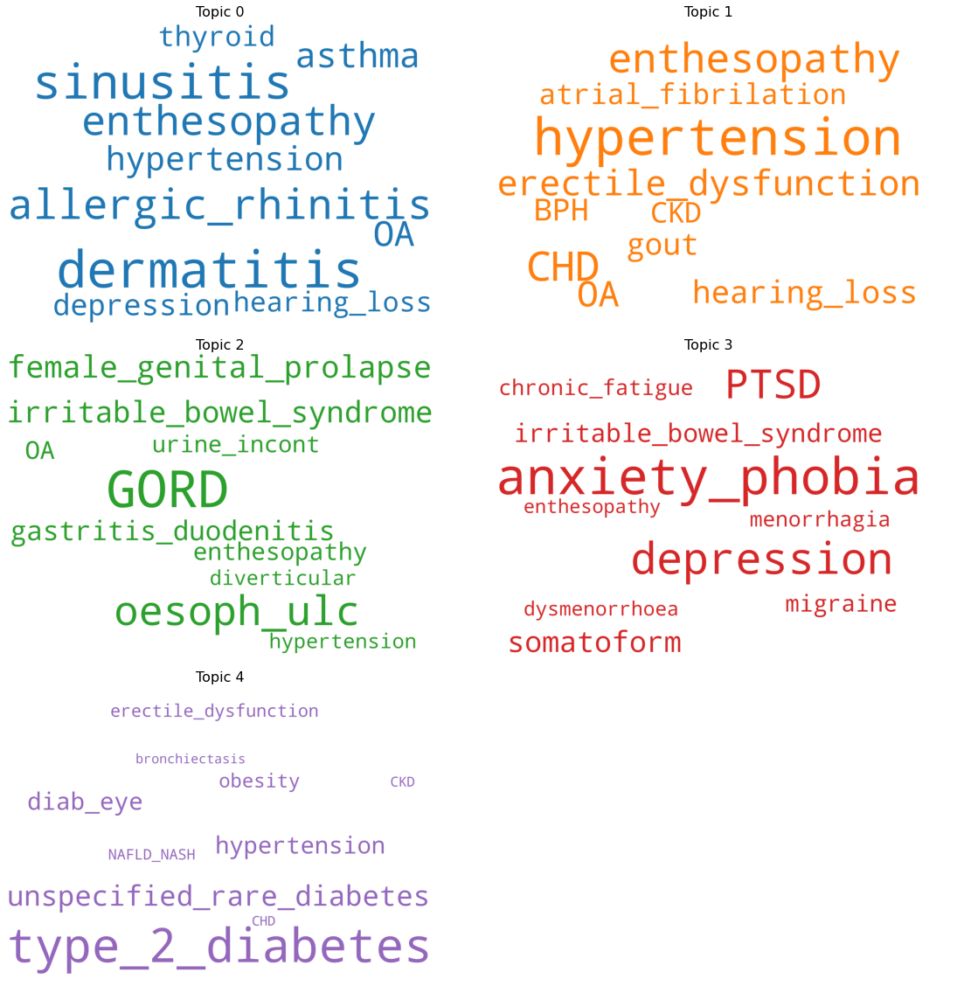

In [71]:
# Wordcloud of Top N LTCs for each topic

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

cloud = WordCloud(background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(3, 2, figsize=(16,16), sharex=True, sharey=True)
axes[-1, -1].axis('off')

for i, ax in enumerate(axes.flatten()):
    if i < 5:
        fig.add_subplot(ax)
        topic_words = dict(topics[i][1])
        cloud.generate_from_frequencies(topic_words, max_font_size=300)
        plt.gca().imshow(cloud)
        plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()
fig.savefig("../images/Optimized 4 Topics WordCloud.png", dpi=60)

In [72]:
test1 = lda_model[corpus]
for topic in test1:
    print(topic)

[(0, 0.4881044), (1, 0.43892887), (2, 0.029372834), (3, 0.02369123), (4, 0.019902702)]
[(0, 0.043967694), (1, 0.19139934), (2, 0.3948674), (3, 0.01777747), (4, 0.3519881)]
[(0, 0.23783617), (1, 0.734708), (2, 0.011100584)]
[(0, 0.92421174), (1, 0.026854381), (2, 0.019790942), (3, 0.015874514), (4, 0.01326844)]
[(0, 0.07567354), (1, 0.836627), (2, 0.03538237), (3, 0.02844421), (4, 0.023872897)]
[(0, 0.8643485), (1, 0.04790544), (2, 0.035409987), (3, 0.028444272), (4, 0.023891842)]
[(0, 0.22724031), (1, 0.033900157), (2, 0.02517767), (3, 0.020307928), (4, 0.6933739)]
[(0, 0.04314299), (1, 0.38393828), (2, 0.021979045), (3, 0.017767482), (4, 0.5331722)]
[(0, 0.6191508), (1, 0.024476346), (2, 0.017898569), (3, 0.01423561), (4, 0.32423866)]
[(0, 0.88822544), (1, 0.038739238), (2, 0.029372938), (3, 0.023770241), (4, 0.019892195)]
[(0, 0.54321975), (1, 0.024611928), (2, 0.3250133), (3, 0.0952159), (4, 0.011939163)]
[(0, 0.5487097), (1, 0.4145422), (2, 0.014890667), (3, 0.011903144)]
[(0, 0.74

[(0, 0.059020165), (1, 0.60208863), (2, 0.16449606), (3, 0.017777482), (4, 0.15661767)]
[(0, 0.3373864), (1, 0.2594572), (2, 0.25655302), (3, 0.13665737)]
[(0, 0.3095327), (1, 0.32248062), (2, 0.20682201), (3, 0.14624558), (4, 0.014919066)]
[(0, 0.3196069), (1, 0.2333067), (2, 0.41439852), (3, 0.017768795), (4, 0.014919052)]
[(0, 0.6616816), (1, 0.029194629), (2, 0.022039043), (3, 0.27216572), (4, 0.014919031)]
[(0, 0.41266778), (1, 0.538457), (2, 0.019742604), (3, 0.015862796), (4, 0.013269809)]
[(0, 0.21721512), (1, 0.025770383), (2, 0.4029623), (3, 0.34079102), (4, 0.013261205)]
[(0, 0.07201667), (1, 0.046140462), (2, 0.47389492), (3, 0.38407296), (4, 0.023874965)]
[(0, 0.42851973), (1, 0.25268292), (2, 0.014686112), (3, 0.29415745)]
[(0, 0.4389781), (1, 0.033309), (2, 0.025198098), (3, 0.4854442), (4, 0.01707058)]
[(0, 0.08028423), (1, 0.8318543), (2, 0.03550347), (3, 0.028454969), (4, 0.023903007)]
[(0, 0.56864953), (1, 0.038831115), (2, 0.029394861), (3, 0.34323072), (4, 0.019893

[(0, 0.6228273), (1, 0.19379708), (2, 0.1542644), (3, 0.015845738), (4, 0.013265477)]
[(0, 0.9249982), (1, 0.026297139), (2, 0.019641194), (3, 0.015798667), (4, 0.013264806)]
[(0, 0.74058586), (1, 0.018390996), (2, 0.013716752), (3, 0.21812254)]
[(0, 0.34753695), (1, 0.016041052), (2, 0.23064144), (4, 0.3962928)]
[(0, 0.74620473), (1, 0.020564986), (2, 0.014786215), (3, 0.011849308), (4, 0.20659472)]
[(0, 0.86438006), (1, 0.04790975), (2, 0.035330582), (3, 0.028491668), (4, 0.023887934)]
[(0, 0.29305997), (1, 0.3004852), (2, 0.16158718), (4, 0.23597409)]
[(0, 0.9515765), (1, 0.016941367), (2, 0.01275839), (3, 0.010193492)]
[(0, 0.5794494), (1, 0.02146773), (2, 0.20918061), (3, 0.17904356), (4, 0.01085872)]
[(0, 0.8863401), (1, 0.040787492), (2, 0.029285194), (3, 0.02369523), (4, 0.01989194)]
[(0, 0.5578273), (1, 0.39829782), (2, 0.017665608), (3, 0.014266255), (4, 0.011942999)]
[(0, 0.18910155), (1, 0.67053944), (2, 0.120239966), (3, 0.010936435)]
[(0, 0.45140854), (1, 0.047002103), (2

[(0, 0.9033327), (1, 0.034131758), (2, 0.0251702), (3, 0.02031503), (4, 0.017050296)]
[(0, 0.051913965), (1, 0.8855955), (2, 0.025120933), (3, 0.02030725), (4, 0.017062325)]
[(0, 0.92473656), (1, 0.02643101), (2, 0.019741004), (3, 0.015825052), (4, 0.013266297)]
[(0, 0.2799822), (1, 0.42258888), (2, 0.010387152), (3, 0.098665886), (4, 0.18837588)]
[(0, 0.4999094), (1, 0.023406258), (2, 0.45052186), (3, 0.01421973), (4, 0.011942733)]
[(0, 0.39546052), (1, 0.046873033), (2, 0.035505086), (3, 0.49827942), (4, 0.023881946)]
[(0, 0.86538005), (1, 0.04678535), (2, 0.035338636), (3, 0.028621087), (4, 0.023874845)]
[(0, 0.3972784), (1, 0.24816236), (2, 0.019624626), (3, 0.32165864), (4, 0.013275941)]
[(0, 0.49253622), (1, 0.027498089), (2, 0.36792397), (3, 0.09877412), (4, 0.013267545)]
[(0, 0.86444587), (1, 0.047711466), (2, 0.035344996), (3, 0.028607331), (4, 0.02389035)]
[(0, 0.18581966), (1, 0.18042381), (2, 0.014694004), (3, 0.01189002), (4, 0.60717255)]
[(0, 0.6482544), (1, 0.030764502),

[(0, 0.027377347), (1, 0.5546338), (2, 0.317528), (4, 0.09095273)]
[(0, 0.30417594), (1, 0.0123146195), (2, 0.0957878), (3, 0.3545194), (4, 0.23320225)]
[(0, 0.41255826), (1, 0.018416015), (2, 0.013644606), (3, 0.1450322), (4, 0.4103489)]
[(0, 0.33113807), (1, 0.046367034), (2, 0.5701549), (3, 0.028470693), (4, 0.023869304)]
[(0, 0.042870298), (1, 0.6770474), (2, 0.019571578), (3, 0.015803931), (4, 0.24470676)]
[(0, 0.052312367), (1, 0.36851415), (2, 0.54165596), (3, 0.020424843), (4, 0.017092688)]
[(0, 0.6061409), (1, 0.35006273), (2, 0.01764294), (3, 0.01421791), (4, 0.011935527)]
[(0, 0.3828888), (1, 0.4313125), (2, 0.15668349), (3, 0.015849078), (4, 0.013266173)]
[(0, 0.38944095), (1, 0.23195991), (2, 0.022122279), (3, 0.3415579), (4, 0.014919006)]
[(0, 0.2519561), (1, 0.71157056), (2, 0.014675715), (3, 0.011847463)]
[(0, 0.94275), (1, 0.020614265), (2, 0.014798988), (3, 0.011883668)]
[(0, 0.49016112), (1, 0.04611616), (2, 0.03548354), (3, 0.4043613), (4, 0.023877848)]
[(0, 0.36614

[(0, 0.16045243), (1, 0.81213385), (2, 0.011063745)]
[(0, 0.042753063), (1, 0.023615262), (2, 0.39335126), (3, 0.3212195), (4, 0.21906087)]
[(0, 0.46535745), (1, 0.026061587), (2, 0.019727461), (3, 0.47559237), (4, 0.013261085)]
[(0, 0.18729766), (1, 0.6703669), (2, 0.01613667), (3, 0.115345955), (4, 0.010852845)]
[(0, 0.34053), (1, 0.2304664), (2, 0.39992288), (3, 0.015801756), (4, 0.013278993)]
[(0, 0.86187166), (1, 0.050318666), (2, 0.03538802), (3, 0.028522892), (4, 0.023898754)]
[(0, 0.4639307), (1, 0.4484526), (2, 0.035301965), (3, 0.028443584), (4, 0.023871167)]
[(0, 0.7768468), (1, 0.023514343), (2, 0.017664528), (3, 0.17003775), (4, 0.011936611)]
[(0, 0.7893764), (1, 0.17084666), (2, 0.015997734), (3, 0.01292442), (4, 0.010854855)]
[(0, 0.05075182), (1, 0.88664633), (2, 0.02523717), (3, 0.020309215), (4, 0.017055461)]
[(0, 0.14779064), (1, 0.27173546), (2, 0.5512479), (3, 0.015965054), (4, 0.013260938)]
[(0, 0.20961863), (1, 0.014072118), (2, 0.010446455), (3, 0.09973056), (4,

[(0, 0.3041518), (1, 0.04776869), (2, 0.5957709), (3, 0.028432721), (4, 0.023875898)]
[(0, 0.49734223), (1, 0.029514527), (2, 0.21165001), (3, 0.24656783), (4, 0.014925393)]
[(0, 0.06955106), (1, 0.5485971), (2, 0.02931635), (3, 0.023693446), (4, 0.32884207)]
[(0, 0.6653012), (1, 0.27202955), (2, 0.02520528), (3, 0.02041137), (4, 0.017052572)]
[(0, 0.51042837), (1, 0.017834133), (2, 0.12191492), (3, 0.34064156)]
[(0, 0.9033271), (1, 0.03405165), (2, 0.02525611), (3, 0.02031482), (4, 0.017050289)]
[(0, 0.7008155), (1, 0.038732484), (2, 0.21685319), (3, 0.023707764), (4, 0.019891065)]
[(0, 0.43900886), (1, 0.19151258), (2, 0.02010807), (3, 0.33610645), (4, 0.013264022)]
[(0, 0.0728351), (1, 0.55043364), (2, 0.32440203), (3, 0.028446399), (4, 0.023882853)]
[(0, 0.86518), (1, 0.04737651), (2, 0.035142835), (3, 0.02842977), (4, 0.023870844)]
[(0, 0.58550745), (1, 0.033581696), (2, 0.025264764), (3, 0.3385946), (4, 0.017051553)]
[(0, 0.86592823), (1, 0.046444863), (2, 0.03530795), (3, 0.0284

[(0, 0.26270851), (1, 0.45573857), (2, 0.022030048), (3, 0.24459825), (4, 0.014924598)]
[(0, 0.36905274), (1, 0.04599845), (2, 0.035161927), (3, 0.52591735), (4, 0.02386947)]
[(0, 0.64988214), (1, 0.2769321), (2, 0.029437246), (3, 0.023828026), (4, 0.019920502)]
[(0, 0.33704534), (1, 0.046570804), (2, 0.035387363), (3, 0.55712533), (4, 0.023871165)]
[(0, 0.62201834), (1, 0.047534302), (2, 0.27812305), (3, 0.028435448), (4, 0.023888873)]
[(0, 0.5179328), (1, 0.0141608585), (2, 0.35958356), (3, 0.10128965)]
[(0, 0.039369736), (1, 0.91179335), (2, 0.019769432), (3, 0.01579588), (4, 0.013271639)]
[(0, 0.63039523), (1, 0.039047323), (2, 0.029491808), (3, 0.28115135), (4, 0.019914258)]
[(0, 0.32361904), (1, 0.26224512), (2, 0.20961206), (3, 0.19599293)]
[(0, 0.05627305), (1, 0.55447245), (2, 0.029558724), (3, 0.023690013), (4, 0.33600575)]
[(0, 0.5198778), (1, 0.039730333), (2, 0.029742232), (3, 0.3907575), (4, 0.019892117)]
[(0, 0.048380632), (1, 0.38939452), (2, 0.025122397), (3, 0.0203056

[(0, 0.043603886), (1, 0.90149975), (2, 0.02219579), (3, 0.017770607), (4, 0.014929978)]
[(0, 0.6527697), (1, 0.03390677), (2, 0.025282478), (3, 0.2709895), (4, 0.017051557)]
[(0, 0.8522957), (1, 0.018127546), (2, 0.01365591), (3, 0.106736556)]
[(0, 0.88707846), (1, 0.039943837), (2, 0.029389534), (3, 0.023690931), (4, 0.019897228)]
[(0, 0.45268622), (1, 0.04036952), (2, 0.24692555), (3, 0.24012583), (4, 0.019892843)]
[(0, 0.6277443), (1, 0.04838954), (2, 0.2715516), (3, 0.028443208), (4, 0.023871303)]
[(0, 0.57995784), (1, 0.033328645), (2, 0.34935), (3, 0.020313168), (4, 0.01705034)]
[(0, 0.057259496), (1, 0.8798333), (2, 0.025388362), (3, 0.02045887), (4, 0.017059967)]
[(0, 0.4479778), (1, 0.26864746), (2, 0.014744957), (3, 0.2586806)]
[(0, 0.22986351), (1, 0.57469153), (2, 0.022277348), (3, 0.15823708), (4, 0.014930518)]
[(0, 0.34600726), (1, 0.04708774), (2, 0.5543363), (3, 0.028694522), (4, 0.023874154)]
[(0, 0.34734735), (1, 0.49136114), (2, 0.019556), (3, 0.1284715), (4, 0.0132

[(0, 0.685347), (1, 0.026066914), (2, 0.019698586), (3, 0.25562617), (4, 0.013261279)]
[(0, 0.71894073), (1, 0.026485015), (2, 0.2254927), (3, 0.01580294), (4, 0.013278591)]
[(0, 0.16454414), (1, 0.8017204), (2, 0.01358334), (3, 0.010967606)]
[(0, 0.90347564), (1, 0.033886526), (2, 0.025192704), (3, 0.020391947), (4, 0.017053166)]
[(0, 0.78286135), (1, 0.16239557), (2, 0.022024611), (3, 0.017798329), (4, 0.014920186)]
[(0, 0.06039196), (1, 0.690476), (2, 0.029493023), (3, 0.1997102), (4, 0.019928874)]
[(0, 0.043474466), (1, 0.90168273), (2, 0.02215043), (3, 0.017773256), (4, 0.014919149)]
[(0, 0.07032872), (1, 0.8420537), (2, 0.035310965), (3, 0.02842788), (4, 0.023878766)]
[(0, 0.037424553), (1, 0.6949988), (2, 0.017685113), (3, 0.23794279), (4, 0.011948732)]
[(0, 0.86407626), (1, 0.048228055), (2, 0.035325985), (3, 0.028498758), (4, 0.023870934)]
[(0, 0.40787372), (1, 0.53724194), (2, 0.022179235), (3, 0.017774144), (4, 0.014930951)]
[(0, 0.20003171), (1, 0.03362346), (2, 0.57829076)

[(0, 0.44837725), (1, 0.5202586), (2, 0.012648255), (3, 0.010179789)]
[(0, 0.52749944), (1, 0.025952842), (2, 0.019567365), (3, 0.41371316), (4, 0.013267273)]
[(0, 0.34144944), (1, 0.025941525), (2, 0.60344243), (3, 0.015902631), (4, 0.013263972)]
[(0, 0.05063477), (1, 0.8866592), (2, 0.02531336), (3, 0.020321267), (4, 0.017071387)]
[(0, 0.59423286), (1, 0.017185573), (2, 0.1452053), (3, 0.010197288), (4, 0.23317903)]
[(0, 0.8665124), (1, 0.045998916), (2, 0.0351402), (3, 0.02847898), (4, 0.02386954)]
[(0, 0.2934979), (1, 0.03885381), (2, 0.62405336), (3, 0.023701482), (4, 0.0198935)]
[(0, 0.88683057), (1, 0.040027313), (2, 0.029517934), (3, 0.023700368), (4, 0.019923829)]
[(0, 0.903577), (1, 0.033717047), (2, 0.025231766), (3, 0.020422757), (4, 0.017051386)]
[(0, 0.86589295), (1, 0.046308402), (2, 0.035243478), (3, 0.028681958), (4, 0.023873264)]
[(0, 0.59119266), (1, 0.346082), (2, 0.025270049), (3, 0.020403307), (4, 0.017051965)]
[(0, 0.046883747), (1, 0.68161064), (2, 0.020248681),

[(0, 0.7497588), (1, 0.034227803), (2, 0.025655666), (3, 0.17330377), (4, 0.017053954)]
[(0, 0.27283585), (1, 0.32514957), (2, 0.24189284), (3, 0.1468581), (4, 0.013263641)]
[(0, 0.48891062), (1, 0.42357114), (2, 0.035207152), (3, 0.028429871), (4, 0.023881186)]
[(0, 0.3426177), (1, 0.24552697), (2, 0.035141356), (3, 0.35284397), (4, 0.023870084)]
[(0, 0.035436142), (1, 0.02369169), (2, 0.22039028), (3, 0.2678359), (4, 0.45264608)]
[(0, 0.33053133), (1, 0.6207801), (2, 0.019627996), (3, 0.015793806), (4, 0.013266754)]
[(0, 0.68553805), (1, 0.16205183), (2, 0.011174867), (3, 0.13377361)]
[(0, 0.9150754), (1, 0.029813077), (2, 0.022331355), (3, 0.017843189), (4, 0.014936949)]
[(0, 0.09734562), (1, 0.8150486), (2, 0.03529384), (3, 0.028431233), (4, 0.023880748)]
[(0, 0.9144027), (1, 0.030326845), (2, 0.022538794), (3, 0.017797256), (4, 0.014934363)]
[(0, 0.24559826), (1, 0.022457255), (2, 0.21685952), (3, 0.012944541), (4, 0.5021404)]
[(0, 0.20591447), (1, 0.750214), (2, 0.017698597), (3,

[(0, 0.7246034), (1, 0.019816315), (2, 0.23376222), (3, 0.011863772)]
[(0, 0.060748164), (1, 0.46917778), (2, 0.42625254), (3, 0.023908356), (4, 0.019913182)]
[(0, 0.0629576), (1, 0.8639501), (2, 0.029473914), (3, 0.0237165), (4, 0.019901976)]
[(0, 0.17649624), (1, 0.56226546), (2, 0.2374125), (3, 0.012963852), (4, 0.010861968)]
[(0, 0.31603584), (1, 0.6473738), (2, 0.014791759), (3, 0.011847481)]
[(0, 0.50067157), (1, 0.023535635), (2, 0.44963077), (3, 0.014226159), (4, 0.011935863)]
[(0, 0.078380175), (1, 0.036055084), (2, 0.02554716), (3, 0.020472046), (4, 0.83954555)]
[(0, 0.29829776), (1, 0.51446694), (2, 0.022120569), (3, 0.15018682), (4, 0.014927918)]
[(0, 0.345408), (1, 0.046390943), (2, 0.55568147), (3, 0.028644063), (4, 0.023875525)]
[(0, 0.886416), (1, 0.040388055), (2, 0.029558158), (3, 0.023736425), (4, 0.019901326)]
[(0, 0.44258016), (1, 0.01597145), (2, 0.011917158), (3, 0.21548574), (4, 0.3140455)]
[(0, 0.31994528), (1, 0.026133401), (2, 0.3550607), (3, 0.16752183), (4,

[(0, 0.223605), (1, 0.026581002), (2, 0.5930162), (3, 0.14352821), (4, 0.013269583)]
[(0, 0.9019808), (1, 0.035092056), (2, 0.025466044), (3, 0.020408869), (4, 0.017052202)]
[(0, 0.33190116), (1, 0.033599045), (2, 0.59685445), (3, 0.020582989), (4, 0.017062329)]
[(0, 0.26790768), (1, 0.4493578), (2, 0.0705817), (3, 0.11861427), (4, 0.09353852)]
[(0, 0.5892243), (1, 0.026532134), (2, 0.01967555), (3, 0.35130623), (4, 0.0132618295)]
[(0, 0.3730521), (1, 0.023365075), (2, 0.27634785), (3, 0.3152994), (4, 0.011935594)]
[(0, 0.6627437), (1, 0.048748277), (2, 0.035148337), (3, 0.02843389), (4, 0.22492585)]
[(0, 0.5823855), (1, 0.34445062), (2, 0.029437562), (3, 0.02383195), (4, 0.019894384)]
[(0, 0.9473773), (1, 0.018792741), (2, 0.013666475), (3, 0.010973156)]
[(0, 0.70464146), (1, 0.23263979), (2, 0.025202863), (3, 0.02046326), (4, 0.017052615)]
[(0, 0.07790652), (1, 0.04841177), (2, 0.035393372), (3, 0.81440735), (4, 0.023880996)]
[(0, 0.28669623), (1, 0.040717483), (2, 0.02949354), (3, 0

[(0, 0.2804991), (1, 0.3307263), (2, 0.19235685), (3, 0.18448173), (4, 0.011935975)]
[(0, 0.26281846), (1, 0.27746972), (2, 0.019710667), (3, 0.015897252), (4, 0.4241039)]
[(0, 0.065258145), (1, 0.8721055), (2, 0.025269924), (3, 0.020307276), (4, 0.017059173)]
[(0, 0.37947395), (1, 0.32944813), (2, 0.01612781), (3, 0.108790696), (4, 0.1661594)]
[(0, 0.23427181), (1, 0.57646257), (2, 0.16013493), (3, 0.015863707), (4, 0.013266962)]
[(0, 0.32734022), (1, 0.3067751), (2, 0.3331263), (3, 0.017830385), (4, 0.01492802)]
[(0, 0.050823856), (1, 0.88647604), (2, 0.025341025), (3, 0.02030588), (4, 0.01705323)]
[(0, 0.4284381), (1, 0.40626478), (2, 0.01261182), (3, 0.14415728)]
[(0, 0.7165618), (1, 0.038753755), (2, 0.029564686), (3, 0.0236913), (4, 0.19142848)]
[(0, 0.81958264), (1, 0.01564424), (2, 0.011826272), (3, 0.14498702)]
[(0, 0.7518418), (1, 0.02630578), (2, 0.19277956), (3, 0.015797315), (4, 0.013275614)]
[(0, 0.048256725), (1, 0.0267859), (2, 0.019733088), (3, 0.01581347), (4, 0.88941

[(0, 0.22580326), (1, 0.7302499), (2, 0.017731147), (3, 0.0142732), (4, 0.011942512)]
[(0, 0.3508816), (1, 0.015580246), (2, 0.3888695), (4, 0.23518981)]
[(0, 0.88717383), (1, 0.039338835), (2, 0.029900642), (3, 0.023691574), (4, 0.01989513)]
[(0, 0.44899288), (1, 0.046448182), (2, 0.23586528), (3, 0.24482386), (4, 0.023869773)]
[(0, 0.3326512), (1, 0.22404051), (2, 0.41951114), (3, 0.012944797), (4, 0.01085234)]
[(0, 0.24392669), (1, 0.7011086), (2, 0.022166159), (3, 0.01786549), (4, 0.014933108)]
[(0, 0.25973982), (1, 0.2071035), (2, 0.50404006), (3, 0.015853927), (4, 0.013262647)]
[(0, 0.07365597), (1, 0.8387149), (2, 0.035311554), (3, 0.028431363), (4, 0.023886194)]
[(0, 0.34030983), (1, 0.35987926), (2, 0.029864877), (3, 0.023703517), (4, 0.24624254)]
[(0, 0.025350243), (1, 0.2040208), (2, 0.48599723), (3, 0.010159674), (4, 0.27447206)]
[(0, 0.30543774), (1, 0.047809053), (2, 0.5944437), (3, 0.028429214), (4, 0.023880284)]
[(0, 0.5725696), (1, 0.37258613), (2, 0.022069417), (3, 0.

[(0, 0.07756944), (1, 0.46398088), (2, 0.4061356), (3, 0.028429704), (4, 0.023884438)]
[(0, 0.51771176), (1, 0.4092827), (2, 0.029398466), (3, 0.023700919), (4, 0.01990614)]
[(0, 0.64196163), (1, 0.047700167), (2, 0.036516458), (3, 0.24994132), (4, 0.023880385)]
[(0, 0.93243617), (1, 0.023667721), (2, 0.017728489), (3, 0.014223541), (4, 0.011944055)]
[(0, 0.039962653), (1, 0.91122305), (2, 0.01964871), (3, 0.015898475), (4, 0.013267171)]
[(0, 0.25442484), (1, 0.33900672), (2, 0.24615777), (3, 0.012983011), (4, 0.14742762)]
[(0, 0.25684962), (1, 0.12483353), (2, 0.457914), (3, 0.15187137)]
[(0, 0.94335645), (1, 0.0198691), (2, 0.014919795), (3, 0.011902479)]
[(0, 0.7508989), (1, 0.015824314), (2, 0.011983871), (3, 0.21333186)]
[(0, 0.053392872), (1, 0.8838032), (2, 0.02543501), (3, 0.020313643), (4, 0.017055267)]
[(0, 0.8860778), (1, 0.040679276), (2, 0.029566918), (3, 0.023762476), (4, 0.019913526)]
[(0, 0.08511427), (1, 0.046871856), (2, 0.5909502), (3, 0.25319415), (4, 0.023869485)]


[(0, 0.72776514), (1, 0.021169454), (2, 0.01622116), (3, 0.22399405), (4, 0.010850225)]
[(0, 0.057894066), (1, 0.038371865), (2, 0.029679554), (3, 0.854163), (4, 0.019891554)]
[(0, 0.22989812), (1, 0.03838158), (2, 0.029299615), (3, 0.68252885), (4, 0.019891797)]
[(0, 0.67047524), (1, 0.0219986), (2, 0.2837431), (3, 0.012929349), (4, 0.010853653)]
[(0, 0.26391843), (1, 0.49786916), (2, 0.15275481), (4, 0.07756008)]
[(0, 0.066568434), (1, 0.6459777), (2, 0.23515156), (3, 0.02842787), (4, 0.023874402)]
[(0, 0.36096558), (1, 0.25746486), (2, 0.34879363), (3, 0.017855417), (4, 0.014920511)]
[(0, 0.46474093), (1, 0.36549556), (2, 0.14962196), (3, 0.010958627)]
[(0, 0.4888577), (1, 0.01628065), (2, 0.31970862), (3, 0.16719213)]
[(0, 0.7397527), (1, 0.030892046), (2, 0.022066675), (3, 0.19235633), (4, 0.01493225)]
[(0, 0.53165406), (1, 0.33607137), (2, 0.011102516), (3, 0.11369694)]
[(0, 0.5186776), (1, 0.031525362), (2, 0.21367243), (3, 0.21772754), (4, 0.018397057)]
[(0, 0.041566648), (1, 0

[(0, 0.050513513), (1, 0.47423226), (2, 0.025376271), (3, 0.43282017), (4, 0.017057797)]
[(0, 0.8646812), (1, 0.04766227), (2, 0.03527864), (3, 0.028499078), (4, 0.023878809)]
[(0, 0.9008376), (1, 0.036410697), (2, 0.025375314), (3, 0.02030787), (4, 0.017068505)]
[(0, 0.6925489), (1, 0.20154764), (2, 0.0895406)]
[(0, 0.39893132), (1, 0.03072135), (2, 0.34625804), (3, 0.20915893), (4, 0.014930398)]
[(0, 0.59531915), (1, 0.033865713), (2, 0.025361428), (3, 0.32840207), (4, 0.017051596)]
[(0, 0.2688115), (1, 0.033979543), (2, 0.39151403), (3, 0.28862426), (4, 0.017070698)]
[(0, 0.042131454), (1, 0.22694622), (2, 0.7018444), (3, 0.015806897), (4, 0.013271001)]
[(0, 0.0733344), (1, 0.53804344), (2, 0.3362964), (3, 0.028446686), (4, 0.023879107)]
[(0, 0.052978896), (1, 0.37157536), (2, 0.53806347), (3, 0.02032062), (4, 0.017061658)]
[(0, 0.6210393), (1, 0.04022703), (2, 0.2950748), (3, 0.02376756), (4, 0.019891378)]
[(0, 0.5909179), (1, 0.33573434), (2, 0.02975114), (3, 0.02369052), (4, 0.01

[(0, 0.5124613), (1, 0.02615945), (2, 0.019577648), (3, 0.4285296), (4, 0.013272011)]
[(0, 0.06525718), (1, 0.5573255), (2, 0.029787919), (3, 0.32773525), (4, 0.019894175)]
[(0, 0.8646423), (1, 0.047432587), (2, 0.03561884), (3, 0.028431429), (4, 0.023874836)]
[(0, 0.19599469), (1, 0.4921927), (2, 0.017652435), (3, 0.014225769), (4, 0.2799344)]
[(0, 0.26648775), (1, 0.04818973), (2, 0.23237453), (3, 0.028428165), (4, 0.42451984)]
[(0, 0.8659583), (1, 0.046445157), (2, 0.03522961), (3, 0.028496036), (4, 0.0238709)]
[(0, 0.056856386), (1, 0.8700962), (2, 0.029440157), (3, 0.023705658), (4, 0.01990164)]
[(0, 0.8627435), (1, 0.049454506), (2, 0.03546326), (3, 0.028432483), (4, 0.023906242)]
[(0, 0.79061264), (1, 0.029479513), (2, 0.14717631), (3, 0.017813016), (4, 0.014918528)]
[(0, 0.238906), (1, 0.44158366), (2, 0.16235766), (3, 0.015800107), (4, 0.14135256)]
[(0, 0.40359157), (1, 0.021171797), (2, 0.338468), (3, 0.22591594), (4, 0.010852689)]
[(0, 0.88740414), (1, 0.039601397), (2, 0.02

[(0, 0.56348014), (1, 0.39666632), (2, 0.016074568), (3, 0.0129248155), (4, 0.010854136)]
[(0, 0.38387322), (1, 0.032855906), (2, 0.02515636), (3, 0.39838225), (4, 0.15973227)]
[(0, 0.93235505), (1, 0.0237639), (2, 0.017724514), (3, 0.014218172), (4, 0.011938377)]
[(0, 0.86405784), (1, 0.04785038), (2, 0.035529703), (3, 0.028688697), (4, 0.02387335)]
[(0, 0.05899559), (1, 0.86799896), (2, 0.029386269), (3, 0.023696605), (4, 0.019922538)]
[(0, 0.71277577), (1, 0.013974778), (2, 0.010546386), (3, 0.25567695)]
[(0, 0.40459695), (1, 0.48574412), (2, 0.010383525), (4, 0.0908863)]
[(0, 0.3750365), (1, 0.0207102), (2, 0.4036356), (3, 0.1906671)]
[(0, 0.7449822), (1, 0.033113323), (2, 0.18447094), (3, 0.020383839), (4, 0.017049689)]
[(0, 0.19309454), (1, 0.023394907), (2, 0.75730455), (3, 0.014269215), (4, 0.011936816)]
[(0, 0.49200016), (1, 0.27369222), (2, 0.01472105), (3, 0.2096387)]
[(0, 0.5577468), (1, 0.029267227), (2, 0.022074223), (3, 0.37597936), (4, 0.014932354)]
[(0, 0.071358256), (

[(0, 0.2833106), (1, 0.046251718), (2, 0.407291), (3, 0.028428229), (4, 0.23471844)]
[(0, 0.037739996), (1, 0.4015499), (2, 0.29630786), (3, 0.25245947), (4, 0.0119427545)]
[(0, 0.30295062), (1, 0.30782428), (2, 0.36542562), (3, 0.01293735), (4, 0.010862133)]
[(0, 0.7579237), (1, 0.027436236), (2, 0.18550931), (3, 0.015851218), (4, 0.013279457)]
[(0, 0.91472805), (1, 0.030532217), (2, 0.022044525), (3, 0.017769484), (4, 0.014925751)]
[(0, 0.07417507), (1, 0.42306352), (2, 0.4501713), (3, 0.02871451), (4, 0.023875607)]
[(0, 0.8659728), (1, 0.04630964), (2, 0.035243757), (3, 0.028600398), (4, 0.02387341)]
[(0, 0.5661811), (1, 0.021270892), (2, 0.16839176), (3, 0.23329967), (4, 0.010856514)]
[(0, 0.9484368), (1, 0.017871238), (2, 0.013566717), (3, 0.010944503)]
[(0, 0.91437143), (1, 0.03078092), (2, 0.022090426), (3, 0.017828235), (4, 0.014928996)]
[(0, 0.40769857), (1, 0.040513374), (2, 0.029411754), (3, 0.5024734), (4, 0.019902937)]
[(0, 0.22698021), (1, 0.519554), (3, 0.066369176), (4,

[(0, 0.488831), (1, 0.13643129), (2, 0.35926488)]
[(0, 0.2626572), (1, 0.18402933), (2, 0.19467922), (4, 0.3502455)]
[(0, 0.29258066), (1, 0.5700504), (2, 0.0135845775), (3, 0.010936407), (4, 0.1128479)]
[(0, 0.5009021), (1, 0.035057012), (2, 0.025338275), (3, 0.42163554), (4, 0.017067073)]
[(0, 0.4978512), (1, 0.03361522), (2, 0.21221782), (3, 0.020411411), (4, 0.23590435)]
[(0, 0.6448266), (1, 0.04748979), (2, 0.03536351), (3, 0.24844104), (4, 0.023879122)]
[(0, 0.8644536), (1, 0.04770686), (2, 0.03534473), (3, 0.028604468), (4, 0.023890292)]
[(0, 0.21584919), (1, 0.18477191), (2, 0.022157209), (3, 0.5622852), (4, 0.014936561)]
[(0, 0.38952005), (1, 0.03383405), (2, 0.539252), (3, 0.020342639), (4, 0.01705125)]
[(0, 0.6445653), (1, 0.02969218), (2, 0.022337273), (3, 0.28847483), (4, 0.014930442)]
[(0, 0.42509946), (1, 0.15405111), (2, 0.39900345), (3, 0.011897164)]
[(0, 0.5833045), (1, 0.046449814), (2, 0.03526583), (3, 0.3111105), (4, 0.023869306)]
[(0, 0.8880903), (1, 0.03900168), 

[(0, 0.9144549), (1, 0.030596575), (2, 0.022166213), (3, 0.017856022), (4, 0.014926327)]
[(0, 0.6411636), (1, 0.03941262), (2, 0.2757522), (3, 0.023771055), (4, 0.019900521)]
[(0, 0.049884867), (1, 0.8874992), (2, 0.025243385), (3, 0.020305986), (4, 0.017066535)]
[(0, 0.053929392), (1, 0.7327523), (2, 0.17585425), (3, 0.020403586), (4, 0.017060451)]
[(0, 0.6564687), (1, 0.047017656), (2, 0.035334438), (3, 0.2373099), (4, 0.02386931)]
[(0, 0.05003039), (1, 0.62962997), (2, 0.15937293), (3, 0.14604229), (4, 0.014924413)]
[(0, 0.83008647), (1, 0.02147669), (2, 0.0160396), (3, 0.012929362), (4, 0.119467854)]
[(0, 0.104837656), (1, 0.04666962), (2, 0.5865072), (3, 0.23810713), (4, 0.023878403)]
[(0, 0.04622588), (1, 0.31445515), (2, 0.37424362), (3, 0.2501544), (4, 0.01492097)]
[(0, 0.6440437), (1, 0.2321463), (2, 0.011037658), (3, 0.10531266)]
[(0, 0.064562514), (1, 0.52713686), (2, 0.025516713), (3, 0.36573222), (4, 0.017051702)]
[(0, 0.8866652), (1, 0.0401951), (2, 0.029544774), (3, 0.02

[(0, 0.073305786), (1, 0.047962688), (2, 0.036434095), (3, 0.028431233), (4, 0.8138662)]
[(0, 0.2182374), (1, 0.30617198), (2, 0.18665208), (3, 0.13549024), (4, 0.15344825)]
[(0, 0.53410786), (1, 0.027764268), (2, 0.019769518), (3, 0.40508708), (4, 0.013271327)]
[(0, 0.44334236), (1, 0.033340953), (2, 0.48593214), (3, 0.020331496), (4, 0.017053068)]
[(0, 0.7791322), (1, 0.026497006), (2, 0.019813435), (3, 0.16129556), (4, 0.013261777)]
[(0, 0.29694742), (1, 0.4261451), (2, 0.016107311), (3, 0.012926905), (4, 0.24787323)]
[(0, 0.7940245), (1, 0.021570425), (2, 0.01629368), (3, 0.15725951), (4, 0.010851832)]
[(0, 0.07946043), (1, 0.84755135), (2, 0.02938893), (3, 0.023703355), (4, 0.019895962)]
[(0, 0.056224383), (1, 0.03842892), (2, 0.029315231), (3, 0.36267218), (4, 0.51335925)]
[(0, 0.59082764), (1, 0.039393768), (2, 0.029862605), (3, 0.32002354), (4, 0.019892422)]
[(0, 0.1075707), (1, 0.80485284), (2, 0.035254028), (3, 0.028451081), (4, 0.023871358)]
[(0, 0.027520088), (1, 0.44526955

[(0, 0.904003), (1, 0.03339866), (2, 0.025241846), (3, 0.020306246), (4, 0.017050229)]
[(0, 0.6325271), (1, 0.3049091), (2, 0.025194947), (3, 0.020309038), (4, 0.017059809)]
[(0, 0.21756451), (1, 0.7426285), (2, 0.016024727), (3, 0.012923978), (4, 0.010858221)]
[(0, 0.693261), (1, 0.032986045), (2, 0.2363437), (3, 0.020358728), (4, 0.017050492)]
[(0, 0.077416316), (1, 0.6027628), (2, 0.0355321), (3, 0.2603728), (4, 0.023915976)]
[(0, 0.5196322), (1, 0.040266637), (2, 0.029682137), (3, 0.023863336), (4, 0.3865557)]
[(0, 0.53484786), (1, 0.021699084), (2, 0.22631635), (3, 0.20628451), (4, 0.010852148)]
[(0, 0.2664582), (1, 0.24586977), (2, 0.035139814), (3, 0.42866248), (4, 0.023869678)]
[(0, 0.2584881), (1, 0.6977225), (2, 0.017631885), (3, 0.014218975), (4, 0.011938569)]
[(0, 0.15230402), (1, 0.023204867), (2, 0.017663686), (3, 0.014217277), (4, 0.79261017)]
[(0, 0.4608251), (1, 0.17869829), (2, 0.32297593), (3, 0.020444924), (4, 0.017055813)]
[(0, 0.3652956), (1, 0.43226796), (2, 0.01

[(0, 0.46620107), (1, 0.085683264), (2, 0.37169895), (4, 0.068033144)]
[(0, 0.42106622), (1, 0.033428244), (2, 0.025344217), (3, 0.50311065), (4, 0.017050657)]
[(0, 0.5134359), (1, 0.30541676), (2, 0.15495265), (3, 0.014254795), (4, 0.011939904)]
[(0, 0.54581654), (1, 0.28147843), (2, 0.1435883), (3, 0.01585174), (4, 0.013265056)]
[(0, 0.7616022), (1, 0.032855615), (2, 0.1681584), (3, 0.02033425), (4, 0.017049504)]
[(0, 0.6480639), (1, 0.024173774), (2, 0.017614849), (3, 0.014230521), (4, 0.295917)]
[(0, 0.23170578), (1, 0.040534306), (2, 0.49264398), (3, 0.21521257), (4, 0.019903364)]
[(0, 0.39972642), (1, 0.52687234), (2, 0.029801106), (3, 0.023690412), (4, 0.01990977)]
[(0, 0.6816004), (1, 0.026317345), (2, 0.019659137), (3, 0.25915176), (4, 0.013271426)]
[(0, 0.42528498), (1, 0.042354103), (2, 0.029568838), (3, 0.48286158), (4, 0.019930469)]
[(0, 0.06308405), (1, 0.8638918), (2, 0.029436503), (3, 0.023695465), (4, 0.019892171)]
[(0, 0.4105618), (1, 0.5407682), (2, 0.019602293), (3,

[(0, 0.20723936), (1, 0.19472262), (2, 0.36599278), (3, 0.22010502), (4, 0.011940228)]
[(0, 0.4784792), (1, 0.01942226), (2, 0.13275518), (3, 0.27372703), (4, 0.095616385)]
[(0, 0.16919799), (1, 0.24587888), (2, 0.27374795), (3, 0.011852541), (4, 0.2993226)]
[(0, 0.24800608), (1, 0.39970088), (2, 0.3149184), (3, 0.020306347), (4, 0.017068323)]
[(0, 0.6030179), (1, 0.33444285), (2, 0.025170276), (3, 0.020307954), (4, 0.017060928)]
[(0, 0.36661935), (1, 0.38245675), (2, 0.01176369), (4, 0.22968169)]
[(0, 0.35717604), (1, 0.187792), (2, 0.27900296), (3, 0.16275388), (4, 0.013275086)]
[(0, 0.07619152), (1, 0.8359718), (2, 0.03550635), (3, 0.028444076), (4, 0.023886317)]
[(0, 0.5543395), (1, 0.35801855), (2, 0.03521314), (3, 0.028544193), (4, 0.023884628)]
[(0, 0.6183473), (1, 0.3418442), (2, 0.016006352), (3, 0.012926015), (4, 0.010876096)]
[(0, 0.5564581), (1, 0.040390596), (2, 0.3595225), (3, 0.023722107), (4, 0.019906687)]
[(0, 0.5662443), (1, 0.13666062), (2, 0.26802072), (3, 0.0158134

[(0, 0.085519806), (1, 0.24387734), (2, 0.035452116), (3, 0.611263), (4, 0.023887731)]
[(0, 0.42284572), (1, 0.03410992), (2, 0.02525748), (3, 0.020370785), (4, 0.4974161)]
[(0, 0.55729353), (1, 0.28473383), (2, 0.017594477), (3, 0.12843262), (4, 0.011945531)]
[(0, 0.86576873), (1, 0.04668678), (2, 0.035231132), (3, 0.02844237), (4, 0.023871023)]
[(0, 0.06279997), (1, 0.5639991), (2, 0.025537243), (3, 0.3306118), (4, 0.01705186)]
[(0, 0.38234022), (1, 0.5550397), (2, 0.025246644), (3, 0.020314395), (4, 0.017059043)]
[(0, 0.6890271), (1, 0.2621553), (2, 0.019656537), (3, 0.015892165), (4, 0.013268885)]
[(0, 0.064522065), (1, 0.37930048), (2, 0.030027576), (3, 0.5062485), (4, 0.01990138)]
[(0, 0.06713917), (1, 0.5243328), (2, 0.029365458), (3, 0.35925236), (4, 0.019910181)]
[(0, 0.4047912), (1, 0.022230567), (2, 0.4341374), (3, 0.12798661), (4, 0.010854249)]
[(0, 0.07981774), (1, 0.8317222), (2, 0.036118127), (3, 0.028444445), (4, 0.02389746)]
[(0, 0.2977139), (1, 0.038398396), (2, 0.029

[(0, 0.05023434), (1, 0.6253585), (2, 0.022102319), (3, 0.28738183), (4, 0.014922976)]
[(0, 0.8858594), (1, 0.041104082), (2, 0.029438954), (3, 0.023692612), (4, 0.019904964)]
[(0, 0.28220934), (1, 0.018327923), (2, 0.6793094), (3, 0.010969264)]
[(0, 0.20992471), (1, 0.03890458), (2, 0.029284446), (3, 0.02369082), (4, 0.6981954)]
[(0, 0.39266083), (1, 0.5343759), (2, 0.029371403), (3, 0.02369137), (4, 0.019900497)]
[(0, 0.50892705), (1, 0.24055748), (4, 0.23281999)]
[(0, 0.06471227), (1, 0.69462013), (2, 0.21683782), (3, 0.012976548), (4, 0.010853224)]
[(0, 0.057396438), (1, 0.038452104), (2, 0.029308446), (3, 0.023711732), (4, 0.8511313)]
[(0, 0.56052715), (1, 0.031022474), (2, 0.022182276), (3, 0.19443949), (4, 0.19182864)]
[(0, 0.66177756), (1, 0.04963377), (2, 0.035357047), (3, 0.2293388), (4, 0.023892853)]
[(0, 0.39396104), (1, 0.5330565), (2, 0.029388681), (3, 0.023700869), (4, 0.01989289)]
[(0, 0.88791317), (1, 0.039166596), (2, 0.0292839), (3, 0.023745013), (4, 0.019891337)]
[(

[(0, 0.060966015), (1, 0.040331885), (2, 0.588207), (3, 0.023713611), (4, 0.28678146)]
[(0, 0.10516334), (1, 0.8065737), (2, 0.035938833), (3, 0.028447594), (4, 0.023876527)]
[(0, 0.80372053), (1, 0.015926696), (2, 0.1628883)]
[(0, 0.5179152), (1, 0.029134966), (2, 0.022130962), (3, 0.2878545), (4, 0.14296441)]
[(0, 0.049169865), (1, 0.89604634), (2, 0.022086397), (3, 0.01777426), (4, 0.0149231125)]
[(0, 0.745873), (1, 0.03382631), (2, 0.025390498), (3, 0.17785661), (4, 0.017053565)]
[(0, 0.41751772), (1, 0.017204778), (2, 0.37204716), (3, 0.010183091), (4, 0.18304728)]
[(0, 0.22557679), (1, 0.019633085), (2, 0.014867169), (3, 0.011851723), (4, 0.7280713)]
[(0, 0.56082463), (1, 0.05129677), (2, 0.035637658), (3, 0.3283432), (4, 0.02389774)]
[(0, 0.45132783), (1, 0.033452272), (2, 0.4778584), (3, 0.020307824), (4, 0.017053654)]
[(0, 0.044368688), (1, 0.9007981), (2, 0.022140302), (3, 0.01776954), (4, 0.014923396)]
[(0, 0.067692176), (1, 0.8448095), (2, 0.035185054), (3, 0.028428135), (4

[(0, 0.45319554), (1, 0.038331315), (2, 0.029554667), (3, 0.45902744), (4, 0.01989105)]
[(0, 0.74800426), (1, 0.019964822), (2, 0.21020277), (3, 0.011879917)]
[(0, 0.915033), (1, 0.029806223), (2, 0.02246158), (3, 0.017779363), (4, 0.014919837)]
[(0, 0.03412746), (1, 0.39747763), (2, 0.15823045), (3, 0.01422205), (4, 0.39594236)]
[(0, 0.92423856), (1, 0.026894422), (2, 0.019780258), (3, 0.01581883), (4, 0.013267927)]
[(0, 0.619106), (1, 0.024767937), (2, 0.22547863), (3, 0.11870426), (4, 0.011943224)]
[(0, 0.91559494), (1, 0.029515535), (2, 0.022114892), (3, 0.017853783), (4, 0.014920849)]
[(0, 0.8867983), (1, 0.03997976), (2, 0.0295139), (3, 0.023801992), (4, 0.019906068)]
[(0, 0.43908414), (1, 0.014927393), (2, 0.2746182), (3, 0.26390752)]
[(0, 0.6457982), (1, 0.15709135), (2, 0.17087159), (3, 0.014301313), (4, 0.011937557)]
[(0, 0.29067403), (1, 0.47847146), (2, 0.20469971), (3, 0.014214351), (4, 0.011940501)]
[(0, 0.70530075), (1, 0.029423354), (2, 0.022126425), (3, 0.2282288), (4,

[(0, 0.62956184), (1, 0.023689495), (2, 0.32058707), (3, 0.014218156), (4, 0.011943435)]
[(0, 0.5649998), (1, 0.22440754), (2, 0.025280133), (3, 0.02031548), (4, 0.16499703)]
[(0, 0.052025698), (1, 0.8854258), (2, 0.02517236), (3, 0.020310545), (4, 0.017065626)]
[(0, 0.06525994), (1, 0.8617315), (2, 0.029395793), (3, 0.023707304), (4, 0.019905407)]
[(0, 0.566264), (1, 0.02634658), (2, 0.37832454), (3, 0.015799949), (4, 0.013264964)]
[(0, 0.9039207), (1, 0.03355354), (2, 0.02513454), (3, 0.020339895), (4, 0.017051365)]
[(0, 0.37625918), (1, 0.3583975), (2, 0.019727038), (3, 0.015832609), (4, 0.22978362)]
[(0, 0.53847873), (1, 0.027273681), (2, 0.2918716), (3, 0.12910914), (4, 0.013266873)]
[(0, 0.057927895), (1, 0.039903913), (2, 0.8585814), (3, 0.023690127), (4, 0.019896619)]
[(0, 0.6926099), (1, 0.023491716), (2, 0.01764035), (3, 0.2543229), (4, 0.011935119)]
[(0, 0.47409967), (1, 0.03355793), (2, 0.02533736), (3, 0.02030614), (4, 0.4466989)]
[(0, 0.4523436), (1, 0.034631215), (2, 0.0

[(0, 0.03453712), (1, 0.016771901), (2, 0.7006671), (3, 0.23949629)]
[(0, 0.52462655), (1, 0.42066982), (2, 0.021998785), (3, 0.017769312), (4, 0.014935467)]
[(0, 0.8865294), (1, 0.04035962), (2, 0.029477453), (3, 0.02370646), (4, 0.019927107)]
[(0, 0.4411149), (1, 0.37344536), (2, 0.017629094), (3, 0.014217678), (4, 0.15359296)]
[(0, 0.7505587), (1, 0.03075816), (2, 0.02217305), (3, 0.1815909), (4, 0.014919217)]
[(0, 0.3485792), (1, 0.36184913), (2, 0.035477545), (3, 0.028488146), (4, 0.22560598)]
[(0, 0.90367615), (1, 0.033615734), (2, 0.025235053), (3, 0.02038837), (4, 0.017084679)]
[(0, 0.26168275), (1, 0.45518214), (2, 0.24571395), (3, 0.020355783), (4, 0.01706537)]
[(0, 0.046150748), (1, 0.495316), (2, 0.022228528), (3, 0.4213772), (4, 0.014927538)]
[(0, 0.6623379), (1, 0.04604333), (2, 0.035405423), (3, 0.02858021), (4, 0.22763315)]
[(0, 0.45857525), (1, 0.019665772), (2, 0.014734172), (3, 0.108746134), (4, 0.39827865)]
[(0, 0.6037049), (1, 0.040117122), (2, 0.029432131), (3, 0.

[(0, 0.72290474), (1, 0.033326983), (2, 0.025477597), (3, 0.20123358), (4, 0.017057106)]
[(0, 0.48795092), (1, 0.03039909), (2, 0.022075497), (3, 0.22226185), (4, 0.23731263)]
[(0, 0.6816703), (1, 0.038887113), (2, 0.029355455), (3, 0.23019476), (4, 0.019892342)]
[(0, 0.8861111), (1, 0.040641945), (2, 0.029656442), (3, 0.023690369), (4, 0.019900117)]
[(0, 0.020977592), (1, 0.36638597), (2, 0.010372151), (3, 0.09594057), (4, 0.5063237)]
[(0, 0.067041144), (1, 0.046059635), (2, 0.035159986), (3, 0.8278691), (4, 0.02387011)]
[(0, 0.85374355), (1, 0.010724864), (3, 0.122648604)]
[(0, 0.062541686), (1, 0.87485933), (2, 0.025226302), (3, 0.020314865), (4, 0.017057775)]
[(0, 0.17654517), (1, 0.3621875), (2, 0.19419876), (3, 0.257117)]
[(0, 0.5630361), (1, 0.047001634), (2, 0.035309512), (3, 0.028520457), (4, 0.3261323)]
[(0, 0.065881886), (1, 0.44939584), (2, 0.26675862), (3, 0.023749849), (4, 0.19421385)]
[(0, 0.43393138), (1, 0.027049422), (2, 0.50994295), (3, 0.015799817), (4, 0.013276371)

[(0, 0.5839706), (1, 0.3534078), (2, 0.02524815), (3, 0.020316418), (4, 0.017057037)]
[(0, 0.04915044), (1, 0.8960123), (2, 0.02213497), (3, 0.017773308), (4, 0.0149290105)]
[(0, 0.06976497), (1, 0.048879635), (2, 0.035187677), (3, 0.028470209), (4, 0.81769747)]
[(0, 0.13648154), (1, 0.03960205), (2, 0.02963266), (3, 0.023728), (4, 0.77055573)]
[(0, 0.02369241), (1, 0.18826161), (2, 0.3491473), (4, 0.42941242)]
[(0, 0.03910848), (1, 0.561483), (2, 0.01997225), (3, 0.36616752), (4, 0.013268699)]
[(0, 0.24654065), (1, 0.62601906), (2, 0.013810594), (3, 0.10444476)]
[(0, 0.060022805), (1, 0.5708746), (2, 0.025428243), (3, 0.32659844), (4, 0.017075919)]
[(0, 0.93230915), (1, 0.023670802), (2, 0.017859144), (3, 0.014224752), (4, 0.0119361635)]
[(0, 0.4008233), (1, 0.03872959), (2, 0.029304488), (3, 0.5112508), (4, 0.019891856)]
[(0, 0.86456466), (1, 0.047962096), (2, 0.035142314), (3, 0.028438926), (4, 0.023892)]
[(0, 0.46650684), (1, 0.045997627), (2, 0.03562935), (3, 0.42799693), (4, 0.02

[(0, 0.35447183), (1, 0.03291938), (2, 0.24895728), (3, 0.34660122), (4, 0.017050277)]
[(0, 0.060396023), (1, 0.6965133), (2, 0.029387383), (3, 0.193805), (4, 0.0198983)]
[(0, 0.70843345), (1, 0.018107215), (2, 0.013679755), (3, 0.25059828)]
[(0, 0.02354321), (1, 0.71051276), (2, 0.2484997)]
[(0, 0.497146), (1, 0.012968691), (2, 0.21717486), (3, 0.19548716), (4, 0.0772233)]
[(0, 0.86386204), (1, 0.048303396), (2, 0.03552354), (3, 0.028436206), (4, 0.023874857)]
[(0, 0.6814376), (1, 0.020031897), (2, 0.27669126), (3, 0.011887727)]
[(0, 0.45639902), (1, 0.29144764), (2, 0.012789578), (3, 0.23083277)]
[(0, 0.5678644), (1, 0.14226034), (2, 0.2637049), (3, 0.014234117), (4, 0.01193625)]
[(0, 0.66980034), (1, 0.0421532), (2, 0.030175194), (3, 0.23796439), (4, 0.019906828)]
[(0, 0.54220355), (1, 0.013234445), (2, 0.09015906), (4, 0.346491)]
[(0, 0.07468464), (1, 0.04767817), (2, 0.82529604), (3, 0.028459093), (4, 0.023882033)]
[(0, 0.474489), (1, 0.47030708), (2, 0.022392), (3, 0.017884694), 

[(0, 0.044487115), (1, 0.9006432), (2, 0.022069184), (3, 0.017878309), (4, 0.014922139)]
[(0, 0.049574327), (1, 0.8956855), (2, 0.022047825), (3, 0.017768765), (4, 0.0149236135)]
[(0, 0.40654808), (1, 0.019673854), (2, 0.0147071555), (3, 0.0118506625), (4, 0.5472203)]
[(0, 0.46628115), (1, 0.50935626)]
[(0, 0.19684273), (1, 0.026061064), (2, 0.5094307), (3, 0.25440207), (4, 0.013263453)]
[(0, 0.068174094), (1, 0.27792028), (2, 0.035213076), (3, 0.23492198), (4, 0.3837706)]
[(0, 0.9036579), (1, 0.03342638), (2, 0.025524797), (3, 0.020340627), (4, 0.017050287)]
[(0, 0.51852155), (1, 0.030485038), (2, 0.41821113), (3, 0.017839717), (4, 0.014942589)]
[(0, 0.9238986), (1, 0.027313199), (2, 0.019721543), (3, 0.015799299), (4, 0.013267442)]
[(0, 0.5369797), (1, 0.40040734), (2, 0.025198149), (3, 0.020353094), (4, 0.017061727)]
[(0, 0.044859353), (1, 0.27184424), (2, 0.65418524), (3, 0.01584132), (4, 0.013269792)]
[(0, 0.066039085), (1, 0.040940568), (2, 0.029448003), (3, 0.023697434), (4, 0.8

[(0, 0.04520836), (1, 0.026543586), (2, 0.40523425), (3, 0.5097351), (4, 0.013278671)]
[(0, 0.34232134), (1, 0.21118832), (2, 0.017644767), (3, 0.4168963), (4, 0.011949251)]
[(0, 0.42932636), (1, 0.04687209), (2, 0.03531306), (3, 0.028452216), (4, 0.4600363)]
[(0, 0.50988936), (1, 0.04612055), (2, 0.03518219), (3, 0.38493708), (4, 0.023870843)]
[(0, 0.6428311), (1, 0.029468818), (2, 0.29497084), (3, 0.017809652), (4, 0.014919607)]
[(0, 0.54939115), (1, 0.014973944), (2, 0.41926432)]
[(0, 0.41179413), (1, 0.047111444), (2, 0.48876208), (3, 0.028461248), (4, 0.023871075)]
[(0, 0.030009542), (1, 0.113836266), (2, 0.49646077), (3, 0.23755518), (4, 0.12213825)]
[(0, 0.6082416), (1, 0.01744347), (2, 0.2756731), (3, 0.010198342), (4, 0.08844346)]
[(0, 0.9043303), (1, 0.033164993), (2, 0.025142103), (3, 0.020312328), (4, 0.017050229)]
[(0, 0.86331785), (1, 0.048698645), (2, 0.035492472), (3, 0.028598983), (4, 0.023892)]
[(0, 0.7138867), (1, 0.014730143), (2, 0.114699386), (3, 0.14922222)]
[(0,

[(0, 0.08918451), (1, 0.040454067), (2, 0.5461174), (3, 0.3043515), (4, 0.019892488)]
[(0, 0.30551845), (1, 0.3214689), (2, 0.029431038), (3, 0.32367843), (4, 0.01990319)]
[(0, 0.63046736), (1, 0.03477992), (2, 0.29737762), (3, 0.020324957), (4, 0.017050106)]
[(0, 0.6713366), (1, 0.04133602), (2, 0.029523132), (3, 0.023711272), (4, 0.23409304)]
[(0, 0.06304213), (1, 0.54961085), (2, 0.1913999), (3, 0.17888126), (4, 0.0170659)]
[(0, 0.86539024), (1, 0.046950676), (2, 0.035360098), (3, 0.028428009), (4, 0.02387096)]
[(0, 0.5093075), (1, 0.14941718), (2, 0.2168291), (3, 0.11698516)]
[(0, 0.5398176), (1, 0.37194735), (2, 0.035918072), (3, 0.02843071), (4, 0.023886317)]
[(0, 0.058727708), (1, 0.86813116), (2, 0.029532854), (3, 0.023708716), (4, 0.019899532)]
[(0, 0.79801935), (1, 0.019919055), (2, 0.014843185), (3, 0.15727186)]
[(0, 0.8866105), (1, 0.0400268), (2, 0.02976235), (3, 0.023699854), (4, 0.019900449)]
[(0, 0.667523), (1, 0.24491116), (2, 0.035251692), (3, 0.02843652), (4, 0.02387

[(0, 0.07597706), (1, 0.047277525), (2, 0.035393376), (3, 0.8174778), (4, 0.023874195)]
[(0, 0.5324326), (1, 0.03841296), (2, 0.029660333), (3, 0.37960193), (4, 0.01989216)]
[(0, 0.48145136), (1, 0.014530221), (2, 0.25500953), (3, 0.24154939)]
[(0, 0.73081124), (1, 0.018503165), (2, 0.013598345), (3, 0.22789821)]
[(0, 0.07253886), (1, 0.30456793), (2, 0.029566124), (3, 0.023931703), (4, 0.56939536)]
[(0, 0.5672749), (1, 0.3592447), (2, 0.029826542), (3, 0.023753136), (4, 0.019900717)]
[(0, 0.41215676), (1, 0.04953323), (2, 0.4859802), (3, 0.028433645), (4, 0.02389616)]
[(0, 0.05045612), (1, 0.56372184), (2, 0.019766677), (3, 0.35279033), (4, 0.013265047)]
[(0, 0.8863603), (1, 0.04069885), (2, 0.029332226), (3, 0.023692302), (4, 0.019916387)]
[(0, 0.061386082), (1, 0.61934274), (2, 0.27565163), (3, 0.023702579), (4, 0.019916931)]
[(0, 0.5735508), (1, 0.013407341), (3, 0.17353179), (4, 0.22966808)]
[(0, 0.86412394), (1, 0.048215114), (2, 0.035330765), (3, 0.028442223), (4, 0.02388791)]
[

[(0, 0.038523592), (1, 0.023960695), (2, 0.68525845), (3, 0.24031265), (4, 0.011944571)]
[(0, 0.48013574), (1, 0.029779328), (2, 0.25488776), (3, 0.01784249), (4, 0.2173547)]
[(0, 0.9027995), (1, 0.03433042), (2, 0.025447685), (3, 0.02036305), (4, 0.017059363)]
[(0, 0.7374406), (1, 0.030224074), (2, 0.022098515), (3, 0.19530347), (4, 0.014933368)]
[(0, 0.88742024), (1, 0.039356038), (2, 0.029500721), (3, 0.023828227), (4, 0.019894768)]
[(0, 0.22470744), (1, 0.23092547), (2, 0.022019144), (3, 0.5074167), (4, 0.014931214)]
[(0, 0.8075645), (1, 0.026173642), (2, 0.019650107), (3, 0.13334958), (4, 0.013262161)]
[(0, 0.11126987), (1, 0.6490194), (2, 0.20228685), (3, 0.02037345), (4, 0.017050385)]
[(0, 0.38025805), (1, 0.035513915), (2, 0.025265288), (3, 0.020443736), (4, 0.538519)]
[(0, 0.69950974), (1, 0.03978776), (2, 0.029283367), (3, 0.21152788), (4, 0.019891193)]
[(0, 0.5460891), (1, 0.33080345), (2, 0.01179288), (4, 0.10183254)]
[(0, 0.0530412), (1, 0.8839769), (2, 0.025590045), (3, 0

[(0, 0.9037693), (1, 0.03359872), (2, 0.025188671), (3, 0.02038652), (4, 0.017056772)]
[(0, 0.30140665), (1, 0.53433394), (2, 0.1404842), (3, 0.012922029), (4, 0.0108532505)]
[(0, 0.52301055), (1, 0.017172545), (2, 0.012826348), (3, 0.4384614)]
[(0, 0.02454091), (1, 0.6112539), (2, 0.1506778), (3, 0.084694244), (4, 0.12883316)]
[(0, 0.026779657), (1, 0.6628895), (2, 0.29164034), (3, 0.010164293)]
[(0, 0.80876), (1, 0.020736292), (2, 0.14865035), (3, 0.0118986275)]
[(0, 0.8071987), (1, 0.02600677), (2, 0.13765003), (3, 0.015882615), (4, 0.013261925)]
[(0, 0.334387), (1, 0.6168184), (2, 0.01973719), (3, 0.015793988), (4, 0.013263402)]
[(0, 0.073229834), (1, 0.8389614), (2, 0.03544704), (3, 0.028475218), (4, 0.023886465)]
[(0, 0.229907), (1, 0.12967734), (3, 0.30141732), (4, 0.33011422)]
[(0, 0.25888017), (1, 0.030501427), (2, 0.022195382), (3, 0.017779494), (4, 0.6706435)]
[(0, 0.049844887), (1, 0.32292783), (2, 0.33646864), (3, 0.27583852), (4, 0.014920149)]
[(0, 0.06679908), (1, 0.6646

[(0, 0.8651651), (1, 0.047150567), (2, 0.03537103), (3, 0.02844079), (4, 0.023872485)]
[(0, 0.39884576), (1, 0.5130885), (2, 0.03557394), (3, 0.028583914), (4, 0.023907859)]
[(0, 0.38844097), (1, 0.027645307), (2, 0.019711096), (3, 0.015801074), (4, 0.54840153)]
[(0, 0.91524416), (1, 0.029720722), (2, 0.022340497), (3, 0.017767554), (4, 0.014927073)]
[(0, 0.31116915), (1, 0.53393894), (2, 0.016177302), (3, 0.12785229), (4, 0.010862303)]
[(0, 0.6647216), (1, 0.018431438), (2, 0.15425847), (3, 0.15340278)]
[(0, 0.49207956), (1, 0.018032089), (2, 0.17899701), (3, 0.30170834)]
[(0, 0.25112495), (1, 0.31092742), (2, 0.41178918), (3, 0.014216092), (4, 0.011942389)]
[(0, 0.494029), (1, 0.24046174), (2, 0.23281974), (3, 0.017768078), (4, 0.014921446)]
[(0, 0.08353986), (1, 0.49183175), (2, 0.035420474), (3, 0.028460244), (4, 0.3607477)]
[(0, 0.5581863), (1, 0.3789952), (2, 0.02533453), (3, 0.020417681), (4, 0.017066272)]
[(0, 0.86246413), (1, 0.04954883), (2, 0.035496768), (3, 0.028599849), (4

[(0, 0.06130016), (1, 0.03951449), (2, 0.6073162), (3, 0.27197507), (4, 0.019894077)]
[(0, 0.56785643), (1, 0.04893244), (2, 0.035429936), (3, 0.32388425), (4, 0.023896942)]
[(0, 0.8624019), (1, 0.04906353), (2, 0.03601205), (3, 0.028635554), (4, 0.023887042)]
[(0, 0.6345406), (1, 0.048856463), (2, 0.035512675), (3, 0.2571892), (4, 0.023901064)]
[(0, 0.08249922), (1, 0.8299399), (2, 0.035245467), (3, 0.028435221), (4, 0.02388018)]
[(0, 0.8657754), (1, 0.046445496), (2, 0.035345577), (3, 0.028562287), (4, 0.023871172)]
[(0, 0.9024022), (1, 0.034931533), (2, 0.025256358), (3, 0.02035068), (4, 0.017059239)]
[(0, 0.046154685), (1, 0.37074292), (2, 0.5539687), (3, 0.01586634), (4, 0.013267285)]
[(0, 0.60709774), (1, 0.018637434), (2, 0.013716754), (3, 0.35136095)]
[(0, 0.031127557), (1, 0.69363433), (2, 0.014710506), (3, 0.011852597), (4, 0.248675)]
[(0, 0.35022697), (1, 0.37265572), (3, 0.26151472)]
[(0, 0.06651226), (1, 0.86017966), (2, 0.029703686), (3, 0.02370569), (4, 0.019898716)]
[(0

[(0, 0.23682524), (1, 0.030885208), (2, 0.18096946), (3, 0.017867176), (4, 0.5334529)]
[(0, 0.5920792), (1, 0.029299384), (2, 0.34584916), (3, 0.0178475), (4, 0.014924739)]
[(0, 0.19969688), (1, 0.019448256), (2, 0.42946276), (3, 0.011870744), (4, 0.33952132)]
[(0, 0.4960857), (1, 0.02635083), (2, 0.31969377), (3, 0.14460789), (4, 0.013261854)]
[(0, 0.5703175), (1, 0.015970612), (2, 0.22654337), (3, 0.17921032)]
[(0, 0.728873), (1, 0.023036296), (2, 0.017582472), (3, 0.21857305), (4, 0.011935145)]
[(0, 0.6221878), (1, 0.02366026), (2, 0.01768114), (3, 0.32453004), (4, 0.011940749)]
[(0, 0.52176625), (1, 0.29337898), (2, 0.01478406), (3, 0.16012435)]
[(0, 0.075241484), (1, 0.32793266), (2, 0.35046166), (3, 0.22248538), (4, 0.02387881)]
[(0, 0.2769141), (1, 0.64981276), (2, 0.029478697), (3, 0.023888633), (4, 0.019905824)]
[(0, 0.61913764), (1, 0.02651692), (2, 0.019737883), (3, 0.2005671), (4, 0.13404047)]
[(0, 0.06656851), (1, 0.8459916), (2, 0.0351389), (3, 0.028427895), (4, 0.0238730

[(0, 0.6208337), (1, 0.027429065), (2, 0.3226143), (3, 0.015850056), (4, 0.013272946)]
[(0, 0.04222541), (1, 0.6834345), (2, 0.019584507), (3, 0.24148872), (4, 0.013266806)]
[(0, 0.8874743), (1, 0.039452918), (2, 0.029357212), (3, 0.023807151), (4, 0.019908385)]
[(0, 0.08665084), (1, 0.8402037), (2, 0.029520411), (3, 0.02370927), (4, 0.019915778)]
[(0, 0.16731104), (1, 0.029932559), (2, 0.021981524), (3, 0.017768072), (4, 0.7630068)]
[(0, 0.0578745), (1, 0.03296627), (2, 0.3883003), (3, 0.50380427), (4, 0.01705466)]
[(0, 0.8639173), (1, 0.048385534), (2, 0.0353824), (3, 0.028428508), (4, 0.023886306)]
[(0, 0.28850326), (1, 0.6566535), (2, 0.022141695), (3, 0.017771289), (4, 0.014930195)]
[(0, 0.15125686), (1, 0.8121791), (2, 0.014762588), (3, 0.0118514355)]
[(0, 0.07130529), (1, 0.046812184), (2, 0.82956296), (3, 0.028446816), (4, 0.023872744)]
[(0, 0.044848446), (1, 0.57787865), (2, 0.022193741), (3, 0.017782032), (4, 0.33729714)]
[(0, 0.05004408), (1, 0.8873862), (2, 0.025171597), (3

[(0, 0.09797757), (1, 0.8128101), (2, 0.03687714), (3, 0.028429193), (4, 0.023905957)]
[(0, 0.5713285), (1, 0.017567566), (2, 0.012656725), (3, 0.010166806), (4, 0.38828042)]
[(0, 0.09894177), (1, 0.04843233), (2, 0.035571404), (3, 0.028487083), (4, 0.7885674)]
[(0, 0.86407906), (1, 0.048138246), (2, 0.035459552), (3, 0.028431289), (4, 0.023891872)]
[(0, 0.059972733), (1, 0.86701787), (2, 0.029412484), (3, 0.023693293), (4, 0.019903645)]
[(0, 0.06269601), (1, 0.8885631), (2, 0.019677453), (3, 0.015801752), (4, 0.013261694)]
[(0, 0.041148946), (1, 0.9101892), (2, 0.019598078), (3, 0.015798008), (4, 0.013265746)]
[(0, 0.052816376), (1, 0.884544), (2, 0.025270112), (3, 0.020310298), (4, 0.017059175)]
[(0, 0.049248572), (1, 0.029108735), (2, 0.36239657), (3, 0.5443261), (4, 0.014919955)]
[(0, 0.56544477), (1, 0.029627478), (2, 0.1730179), (3, 0.2169814), (4, 0.014928451)]
[(0, 0.032505527), (1, 0.143203), (2, 0.52288544), (3, 0.29144996)]
[(0, 0.66877455), (1, 0.01673858), (2, 0.29578322),

[(0, 0.4167649), (1, 0.51018745), (2, 0.029450897), (3, 0.02369025), (4, 0.019906515)]
[(0, 0.77815485), (1, 0.016716814), (2, 0.18639393), (3, 0.01019814)]
[(0, 0.54757094), (1, 0.03885463), (2, 0.029283615), (3, 0.3643994), (4, 0.019891424)]
[(0, 0.91515523), (1, 0.029659621), (2, 0.022419797), (3, 0.017840786), (4, 0.014924581)]
[(0, 0.2150346), (1, 0.033650458), (2, 0.50954705), (3, 0.22471543), (4, 0.017052457)]
[(0, 0.52899134), (1, 0.04886217), (2, 0.03543871), (3, 0.02843017), (4, 0.3582776)]
[(0, 0.71809584), (1, 0.037089646), (2, 0.20742202), (3, 0.020312594), (4, 0.017079918)]
[(0, 0.876927), (1, 0.016840532), (2, 0.012681814), (3, 0.010184267), (4, 0.08336635)]
[(0, 0.37520552), (1, 0.36799353), (2, 0.013560996), (3, 0.09057884), (4, 0.15266114)]
[(0, 0.62778294), (1, 0.2297497), (2, 0.12609759)]
[(0, 0.887418), (1, 0.039632842), (2, 0.029343836), (3, 0.023711933), (4, 0.019893399)]
[(0, 0.5153248), (1, 0.41168046), (2, 0.029379414), (3, 0.023696171), (4, 0.01991916)]
[(0, 

[(0, 0.86411786), (1, 0.048329104), (2, 0.03522175), (3, 0.02843916), (4, 0.02389212)]
[(0, 0.3421531), (1, 0.018259091), (2, 0.61943734), (3, 0.010966494)]
[(0, 0.47934815), (1, 0.013937302), (2, 0.42193684), (3, 0.07775581)]
[(0, 0.6568358), (1, 0.022287602), (2, 0.16407992), (3, 0.14593512), (4, 0.010861586)]
[(0, 0.932153), (1, 0.023976626), (2, 0.017701752), (3, 0.014230767), (4, 0.011937866)]
[(0, 0.7255254), (1, 0.21978672), (2, 0.021996504), (3, 0.017772434), (4, 0.014918974)]
[(0, 0.5585559), (1, 0.31517622), (2, 0.013655112), (3, 0.10342908)]
[(0, 0.64485717), (1, 0.035033323), (2, 0.02518008), (3, 0.27783638), (4, 0.017092984)]
[(0, 0.41479415), (1, 0.38233143), (2, 0.10498618), (3, 0.08870188)]
[(0, 0.7544453), (1, 0.19078413), (2, 0.022033256), (3, 0.01779208), (4, 0.01494517)]
[(0, 0.4620352), (1, 0.026497534), (2, 0.3600558), (3, 0.1381501), (4, 0.013261342)]
[(0, 0.44567004), (1, 0.40575603), (2, 0.017678294), (3, 0.118957296), (4, 0.011938386)]
[(0, 0.701687), (1, 0.03

[(0, 0.30304807), (1, 0.39988896), (4, 0.28322694)]
[(0, 0.7451314), (1, 0.21838613), (2, 0.014687852), (3, 0.011846653)]
[(0, 0.32411563), (1, 0.047990352), (2, 0.03552823), (3, 0.028621405), (4, 0.56374437)]
[(0, 0.80082685), (1, 0.1717562), (2, 0.011062694)]
[(0, 0.6313608), (1, 0.04820881), (2, 0.03571714), (3, 0.26084158), (4, 0.023871677)]
[(0, 0.6360128), (1, 0.02917466), (2, 0.022097873), (3, 0.29779372), (4, 0.014920927)]
[(0, 0.3952128), (1, 0.53174996), (2, 0.029429214), (3, 0.023700332), (4, 0.019907713)]
[(0, 0.29746333), (1, 0.032905966), (2, 0.025427366), (3, 0.4812239), (4, 0.16297942)]
[(0, 0.03567276), (1, 0.5917449), (2, 0.18589161), (3, 0.17475107), (4, 0.01193965)]
[(0, 0.8884949), (1, 0.03862706), (2, 0.029282687), (3, 0.0237043), (4, 0.01989107)]
[(0, 0.20705904), (1, 0.029793162), (2, 0.46539995), (3, 0.28282946), (4, 0.014918357)]
[(0, 0.42858535), (1, 0.2811062), (2, 0.035139527), (3, 0.23127076), (4, 0.023898149)]
[(0, 0.04420429), (1, 0.90091693), (2, 0.0221

[(0, 0.316621), (1, 0.040855683), (2, 0.24400339), (3, 0.023711804), (4, 0.3748081)]
[(0, 0.16707478), (1, 0.021459544), (2, 0.6508195), (3, 0.14978406), (4, 0.01086212)]
[(0, 0.3983808), (1, 0.040072374), (2, 0.51792246), (3, 0.023730736), (4, 0.019893616)]
[(0, 0.54838014), (1, 0.023640059), (2, 0.401754), (3, 0.014283043), (4, 0.0119427135)]
[(0, 0.8631215), (1, 0.048655536), (2, 0.035905834), (3, 0.028435672), (4, 0.023881452)]
[(0, 0.41247725), (1, 0.19718961), (2, 0.38130063)]
[(0, 0.04166153), (1, 0.5225466), (2, 0.40672046), (3, 0.015797155), (4, 0.01327432)]
[(0, 0.68707645), (1, 0.030356495), (2, 0.02237522), (3, 0.017840168), (4, 0.24235165)]
[(0, 0.8874027), (1, 0.03958614), (2, 0.029412672), (3, 0.023696167), (4, 0.019902306)]
[(0, 0.28492713), (1, 0.39589438), (2, 0.029588781), (3, 0.023691203), (4, 0.2658985)]
[(0, 0.33898163), (1, 0.21139432), (2, 0.029310854), (3, 0.4004208), (4, 0.019892365)]
[(0, 0.34406933), (1, 0.3723386), (2, 0.23999228), (3, 0.02369556), (4, 0.01

[(0, 0.622589), (1, 0.0753373), (2, 0.17388608), (3, 0.12221978)]
[(0, 0.75797224), (1, 0.03424349), (2, 0.025329005), (3, 0.16539289), (4, 0.017062373)]
[(0, 0.38019192), (1, 0.018334018), (2, 0.21721697), (3, 0.010947523), (4, 0.37330955)]
[(0, 0.7110784), (1, 0.022082819), (2, 0.016053423), (3, 0.012931039), (4, 0.2378543)]
[(0, 0.6000363), (1, 0.018359667), (2, 0.013851763), (3, 0.35856628)]
[(0, 0.21352766), (1, 0.5669678), (2, 0.19333714), (3, 0.014225365), (4, 0.011942011)]
[(0, 0.21440078), (1, 0.5605103), (2, 0.025269907), (3, 0.18275663), (4, 0.017062383)]
[(0, 0.4923747), (1, 0.38638464), (2, 0.013640591), (3, 0.09841578)]
[(0, 0.86630785), (1, 0.04620233), (2, 0.035140328), (3, 0.028480249), (4, 0.023869261)]
[(0, 0.6089937), (1, 0.029614849), (2, 0.022537526), (3, 0.3239322), (4, 0.014921742)]
[(0, 0.4487479), (1, 0.02061867), (2, 0.014742667), (3, 0.505934)]
[(0, 0.70889455), (1, 0.038682025), (2, 0.029354602), (3, 0.20317642), (4, 0.019892417)]
[(0, 0.035925567), (1, 0.9

[(0, 0.20906442), (1, 0.021010797), (2, 0.22869423), (3, 0.4303608), (4, 0.110869735)]
[(0, 0.5098526), (1, 0.04612035), (2, 0.035182092), (3, 0.38497424), (4, 0.0238708)]
[(0, 0.42994368), (1, 0.029738007), (2, 0.022242732), (3, 0.50315595), (4, 0.014919632)]
[(0, 0.40631655), (1, 0.013903735), (2, 0.45409167), (4, 0.1177718)]
[(0, 0.32862), (1, 0.28979367), (2, 0.019952163), (3, 0.34835905), (4, 0.013275112)]
[(0, 0.15977298), (1, 0.5271561), (2, 0.2869107), (3, 0.014216488), (4, 0.011943743)]
[(0, 0.050257955), (1, 0.4763475), (2, 0.025176646), (3, 0.43116102), (4, 0.017056864)]
[(0, 0.64062047), (1, 0.27181178), (2, 0.035252992), (3, 0.028437402), (4, 0.023877328)]
[(0, 0.7825066), (1, 0.030502023), (2, 0.022151208), (3, 0.14991425), (4, 0.014925898)]
[(0, 0.33829245), (1, 0.5886602), (2, 0.029446406), (3, 0.023700168), (4, 0.019900793)]
[(0, 0.037377097), (1, 0.16685985), (2, 0.45350206), (3, 0.33031556), (4, 0.011945399)]
[(0, 0.23120841), (1, 0.47370878), (2, 0.016058318), (3, 0

[(0, 0.8866389), (1, 0.040300936), (2, 0.029462744), (3, 0.023690464), (4, 0.019907027)]
[(0, 0.70250183), (1, 0.015983848), (2, 0.011948635), (3, 0.11308593), (4, 0.15647976)]
[(0, 0.47371456), (1, 0.0344595), (2, 0.4544693), (3, 0.020307077), (4, 0.017049557)]
[(0, 0.21554466), (1, 0.5559848), (2, 0.016067691), (3, 0.2015467), (4, 0.010856191)]
[(0, 0.8856553), (1, 0.041295134), (2, 0.029449321), (3, 0.023701886), (4, 0.019898333)]
[(0, 0.039625235), (1, 0.33648553), (2, 0.5947921), (3, 0.015835816), (4, 0.013261269)]
[(0, 0.5051035), (1, 0.046245344), (2, 0.3961827), (3, 0.028596804), (4, 0.023871636)]
[(0, 0.47942936), (1, 0.025557), (2, 0.35011953), (3, 0.1316328), (4, 0.013261338)]
[(0, 0.8637905), (1, 0.048254736), (2, 0.035567544), (3, 0.028511865), (4, 0.023875372)]
[(0, 0.8619894), (1, 0.05018727), (2, 0.035508957), (3, 0.028429775), (4, 0.023884567)]
[(0, 0.16743314), (1, 0.18506563), (2, 0.5204981), (3, 0.11614521), (4, 0.0108579025)]
[(0, 0.04312884), (1, 0.030398019), (2,

[(0, 0.062118944), (1, 0.8649765), (2, 0.029313346), (3, 0.02369227), (4, 0.019898951)]
[(0, 0.64202416), (1, 0.034006048), (2, 0.025405876), (3, 0.28151342), (4, 0.017050495)]
[(0, 0.77030414), (1, 0.021448156), (2, 0.016047318), (3, 0.18134077), (4, 0.010859606)]
[(0, 0.04686601), (1, 0.8983339), (2, 0.022092117), (3, 0.01778321), (4, 0.014924751)]
[(0, 0.6808924), (1, 0.015159495), (2, 0.2875729)]
[(0, 0.44820538), (1, 0.036138617), (2, 0.025177674), (3, 0.02031674), (4, 0.47016156)]
[(0, 0.38477275), (1, 0.0237219), (2, 0.017745283), (3, 0.5618226), (4, 0.011937493)]
[(0, 0.037627988), (1, 0.7678872), (2, 0.019610055), (3, 0.015793286), (4, 0.15908152)]
[(0, 0.65761954), (1, 0.02460647), (2, 0.017611964), (3, 0.28820223), (4, 0.011959786)]
[(0, 0.06658035), (1, 0.8599638), (2, 0.029813845), (3, 0.023727298), (4, 0.019914705)]
[(0, 0.51169926), (1, 0.039062098), (2, 0.405657), (3, 0.023690514), (4, 0.01989114)]
[(0, 0.47313225), (1, 0.3015413), (2, 0.19626853), (3, 0.015796643), (4,

[(0, 0.38705257), (1, 0.040567342), (2, 0.029283298), (3, 0.023692368), (4, 0.5194045)]
[(0, 0.66273373), (1, 0.27435872), (2, 0.025493586), (3, 0.020358821), (4, 0.017055087)]
[(0, 0.90394413), (1, 0.033485215), (2, 0.025207339), (3, 0.020312287), (4, 0.017050983)]
[(0, 0.7803561), (1, 0.029264076), (2, 0.022095919), (3, 0.017838432), (4, 0.15044549)]
[(0, 0.047176216), (1, 0.5090073), (2, 0.02206707), (3, 0.40682325), (4, 0.014926198)]
[(0, 0.6859129), (1, 0.01421338), (2, 0.010526663), (3, 0.2823236)]
[(0, 0.62077934), (1, 0.02727318), (2, 0.17050123), (3, 0.16818458), (4, 0.013261664)]
[(0, 0.35795727), (1, 0.38622043), (2, 0.14733616), (3, 0.010169681), (4, 0.09831645)]
[(0, 0.044777486), (1, 0.32162106), (2, 0.022062907), (3, 0.017779259), (4, 0.5937593)]
[(0, 0.22785293), (1, 0.45283633), (2, 0.029775467), (3, 0.023692807), (4, 0.26584247)]
[(0, 0.88382095), (1, 0.043158513), (2, 0.029409323), (3, 0.023694927), (4, 0.019916316)]
[(0, 0.057839144), (1, 0.86917126), (2, 0.02939491

[(0, 0.34078074), (1, 0.023477234), (2, 0.017640924), (3, 0.19452032), (4, 0.42358083)]
[(0, 0.92442614), (1, 0.02671419), (2, 0.019771468), (3, 0.015815115), (4, 0.0132731)]
[(0, 0.22870049), (1, 0.016604371), (2, 0.3517095), (3, 0.31950945), (4, 0.08347618)]
[(0, 0.03195262), (1, 0.42958003), (2, 0.014863381), (3, 0.51365423)]
[(0, 0.6708498), (1, 0.040765565), (2, 0.24478835), (3, 0.023692561), (4, 0.01990372)]
[(0, 0.38027218), (1, 0.033545744), (2, 0.02526587), (3, 0.020450335), (4, 0.5404659)]
[(0, 0.6609474), (1, 0.029378101), (2, 0.022066964), (3, 0.27266207), (4, 0.01494546)]
[(0, 0.7204776), (1, 0.022551378), (2, 0.016062368), (3, 0.23004425), (4, 0.010864442)]
[(0, 0.2695253), (1, 0.01466792), (2, 0.32818672), (4, 0.37871683)]
[(0, 0.6544403), (1, 0.040975634), (2, 0.26085365), (3, 0.02382645), (4, 0.019903995)]
[(0, 0.6145609), (1, 0.3123236), (2, 0.029465042), (3, 0.023754226), (4, 0.019896207)]
[(0, 0.77870613), (1, 0.021563223), (2, 0.17588729), (3, 0.012992233), (4, 0.0

[(0, 0.054865982), (1, 0.39428735), (2, 0.52171165), (3, 0.015863601), (4, 0.013271353)]
[(0, 0.31363392), (1, 0.42996395), (2, 0.22722241), (3, 0.01590198), (4, 0.013277749)]
[(0, 0.5449944), (1, 0.021567963), (2, 0.016315067), (3, 0.40627202), (4, 0.010850522)]
[(0, 0.04484685), (1, 0.49289015), (2, 0.42954665), (3, 0.017785825), (4, 0.014930478)]
[(0, 0.5888264), (1, 0.03419514), (2, 0.18710703), (3, 0.17282085), (4, 0.017050562)]
[(0, 0.7743317), (1, 0.02716409), (2, 0.019595861), (3, 0.16563505), (4, 0.013273312)]
[(0, 0.08195257), (1, 0.82997346), (2, 0.035458557), (3, 0.028737422), (4, 0.023878008)]
[(0, 0.91539866), (1, 0.029678984), (2, 0.022171792), (3, 0.017830268), (4, 0.014920274)]
[(0, 0.4732023), (1, 0.2178662), (2, 0.016135136), (3, 0.2819253), (4, 0.010871093)]
[(0, 0.570339), (1, 0.012410343), (2, 0.19259326), (3, 0.11350488), (4, 0.111152515)]
[(0, 0.44928554), (1, 0.3057954), (2, 0.017736508), (3, 0.21524107), (4, 0.011941473)]
[(0, 0.24572296), (1, 0.5137802), (2, 

[(0, 0.70335484), (1, 0.24797562), (2, 0.019571409), (3, 0.015813248), (4, 0.013284899)]
[(0, 0.55547), (1, 0.015693218), (2, 0.29726094), (3, 0.123604216)]
[(0, 0.5270852), (1, 0.41818607), (2, 0.02203978), (3, 0.01776756), (4, 0.014921458)]
[(0, 0.36049274), (1, 0.029523412), (2, 0.4243642), (3, 0.01787836), (4, 0.16774127)]
[(0, 0.33200243), (1, 0.6054156), (2, 0.025212375), (3, 0.020311143), (4, 0.017058458)]
[(0, 0.6717552), (1, 0.26534584), (2, 0.0254249), (3, 0.020412577), (4, 0.01706148)]
[(0, 0.59267384), (1, 0.03998425), (2, 0.32362399), (3, 0.023824329), (4, 0.019893605)]
[(0, 0.05620332), (1, 0.8708896), (2, 0.029312415), (3, 0.023689892), (4, 0.019904792)]
[(0, 0.6806116), (1, 0.26470283), (2, 0.021997739), (3, 0.017769208), (4, 0.014918647)]
[(0, 0.46914142), (1, 0.04086834), (2, 0.029886037), (3, 0.44019654), (4, 0.01990764)]
[(0, 0.42416444), (1, 0.51301503), (2, 0.025461296), (3, 0.020306526), (4, 0.017052693)]
[(0, 0.6396776), (1, 0.27232182), (2, 0.035691403), (3, 0.

[(0, 0.51205283), (1, 0.45416543), (2, 0.013626112), (3, 0.0109673105)]
[(0, 0.8880168), (1, 0.038844258), (2, 0.029412912), (3, 0.023831166), (4, 0.019894866)]
[(0, 0.20996775), (1, 0.0291098), (2, 0.022144267), (3, 0.33412555), (4, 0.40465263)]
[(0, 0.37627494), (1, 0.021399796), (2, 0.16765545), (3, 0.42381352), (4, 0.010856262)]
[(0, 0.8649103), (1, 0.047403105), (2, 0.035371695), (3, 0.0284423), (4, 0.023872627)]
[(0, 0.27973908), (1, 0.37388927), (2, 0.02230578), (3, 0.30913928), (4, 0.014926584)]
[(0, 0.03883941), (1, 0.64647233), (2, 0.17492686), (3, 0.12649614), (4, 0.0132652875)]
[(0, 0.28644562), (1, 0.34063378), (2, 0.33552727), (3, 0.020334415), (4, 0.017058915)]
[(0, 0.21428943), (1, 0.029492369), (2, 0.022170126), (3, 0.71910185), (4, 0.0149462335)]
[(0, 0.4650784), (1, 0.023813564), (2, 0.276926), (3, 0.22224592), (4, 0.011936105)]
[(0, 0.048850484), (1, 0.46841824), (2, 0.02218767), (3, 0.2699189), (4, 0.19062468)]
[(0, 0.6864844), (1, 0.2737374), (2, 0.015999092), (3,

[(0, 0.2191918), (1, 0.19788681), (2, 0.30129883), (3, 0.26454931), (4, 0.017073222)]
[(0, 0.4609963), (1, 0.039594866), (2, 0.45578718), (3, 0.023728104), (4, 0.019893559)]
[(0, 0.05698237), (1, 0.038671616), (2, 0.52685547), (3, 0.02371854), (4, 0.35377198)]
[(0, 0.028905444), (1, 0.45252478), (2, 0.49676484), (3, 0.011853958)]
[(0, 0.49280044), (1, 0.33053756), (2, 0.08948289), (3, 0.07922039)]
[(0, 0.30840877), (1, 0.0228046), (2, 0.016061077), (3, 0.15537967), (4, 0.49734586)]
[(0, 0.66426754), (1, 0.046277378), (2, 0.03513922), (3, 0.23044667), (4, 0.023869222)]
[(0, 0.6417412), (1, 0.045997623), (2, 0.03523267), (3, 0.028503885), (4, 0.24852464)]
[(0, 0.52060914), (1, 0.40639687), (2, 0.029410068), (3, 0.02369156), (4, 0.019892378)]
[(0, 0.8882082), (1, 0.038677983), (2, 0.02935186), (3, 0.023868116), (4, 0.01989385)]
[(0, 0.41793475), (1, 0.39411268), (2, 0.15526025), (3, 0.017768936), (4, 0.014923395)]
[(0, 0.5533857), (1, 0.013058311), (3, 0.41710225)]
[(0, 0.53050876), (1, 0

[(0, 0.18495302), (1, 0.27597648), (2, 0.37396002), (3, 0.15425794), (4, 0.01085252)]
[(0, 0.03884661), (1, 0.54145783), (2, 0.22079544), (3, 0.18804926), (4, 0.010850851)]
[(0, 0.3125442), (1, 0.014983727), (2, 0.46265304), (3, 0.20235324)]
[(0, 0.7896385), (1, 0.02927066), (2, 0.021986246), (3, 0.14418629), (4, 0.014918305)]
[(0, 0.047095276), (1, 0.029809967), (2, 0.89028174), (3, 0.01787581), (4, 0.014937262)]
[(0, 0.3906874), (1, 0.029295841), (2, 0.33859935), (3, 0.22649816), (4, 0.014919188)]
[(0, 0.24898116), (1, 0.28522176), (2, 0.01259842), (3, 0.010183479), (4, 0.44301516)]
[(0, 0.07647825), (1, 0.4596511), (2, 0.035572894), (3, 0.40441632), (4, 0.02388143)]
[(0, 0.86437005), (1, 0.048101094), (2, 0.03522036), (3, 0.028429711), (4, 0.023878792)]
[(0, 0.044860642), (1, 0.5236983), (2, 0.39873427), (3, 0.017772041), (4, 0.014934765)]
[(0, 0.91517985), (1, 0.0298733), (2, 0.022182843), (3, 0.017834466), (4, 0.014929549)]
[(0, 0.521427), (1, 0.024928214), (2, 0.20797807), (3, 0.

[(0, 0.078695394), (1, 0.8482307), (2, 0.029462354), (3, 0.02369918), (4, 0.019912353)]
[(0, 0.67947716), (1, 0.02363191), (2, 0.01771647), (3, 0.26722786), (4, 0.0119466465)]
[(0, 0.74591446), (1, 0.029253654), (2, 0.022653436), (3, 0.18725744), (4, 0.014921039)]
[(0, 0.5619595), (1, 0.02228555), (2, 0.27428803), (3, 0.012930531), (4, 0.1285364)]
[(0, 0.05588882), (1, 0.25806564), (2, 0.025336195), (3, 0.6436582), (4, 0.017051142)]
[(0, 0.5098255), (1, 0.046120454), (2, 0.035182167), (3, 0.38500103), (4, 0.023870844)]
[(0, 0.30573508), (1, 0.5043113), (2, 0.08575512), (4, 0.09531369)]
[(0, 0.34218228), (1, 0.029905023), (2, 0.44340584), (3, 0.16958548), (4, 0.014921414)]
[(0, 0.60418373), (1, 0.034574505), (2, 0.025314817), (3, 0.31886318), (4, 0.017063811)]
[(0, 0.6382968), (1, 0.018295202), (2, 0.32328075), (3, 0.010942768)]
[(0, 0.74473614), (1, 0.033605907), (2, 0.025200637), (3, 0.1793943), (4, 0.017062994)]
[(0, 0.017575756), (1, 0.5832583), (2, 0.16489594), (4, 0.22749591)]
[(0

[(0, 0.07185681), (1, 0.040592536), (2, 0.2507965), (3, 0.6168599), (4, 0.01989424)]
[(0, 0.03664827), (1, 0.6978751), (2, 0.23931341), (3, 0.014221731), (4, 0.011941497)]
[(0, 0.043078795), (1, 0.9021442), (2, 0.022083554), (3, 0.017773103), (4, 0.014920386)]
[(0, 0.27823186), (1, 0.033432696), (2, 0.4211482), (3, 0.020344881), (4, 0.24684237)]
[(0, 0.44114637), (1, 0.019516869), (2, 0.014764467), (3, 0.5146262)]
[(0, 0.90418446), (1, 0.03316498), (2, 0.025242953), (3, 0.020357179), (4, 0.01705041)]
[(0, 0.0338146), (1, 0.66141975), (2, 0.014777102), (3, 0.28003636)]
[(0, 0.03362732), (1, 0.021405676), (2, 0.5968221), (3, 0.33728668), (4, 0.010858213)]
[(0, 0.036750417), (1, 0.5477258), (2, 0.21704715), (3, 0.18653747), (4, 0.011939156)]
[(0, 0.07192912), (1, 0.04694253), (2, 0.6287474), (3, 0.22850418), (4, 0.023876773)]
[(0, 0.2994487), (1, 0.038947944), (2, 0.5539621), (3, 0.087704115), (4, 0.01993714)]
[(0, 0.04650373), (1, 0.026573112), (2, 0.39838392), (3, 0.51527727), (4, 0.013

[(0, 0.14042418), (1, 0.23878679), (2, 0.2529344), (3, 0.010156157), (4, 0.3576985)]
[(0, 0.8625385), (1, 0.049073096), (2, 0.036074158), (3, 0.02844119), (4, 0.023873027)]
[(0, 0.61955976), (1, 0.02142827), (2, 0.016223425), (3, 0.01293442), (4, 0.3298541)]
[(0, 0.9237048), (1, 0.027400717), (2, 0.019788211), (3, 0.01582626), (4, 0.013280051)]
[(0, 0.033108313), (1, 0.23745689), (2, 0.31112137), (3, 0.123747006), (4, 0.2945664)]
[(0, 0.6715561), (1, 0.038549565), (2, 0.2463128), (3, 0.023690188), (4, 0.019891331)]
[(0, 0.05118897), (1, 0.41097695), (2, 0.17542256), (3, 0.34535345), (4, 0.01705806)]
[(0, 0.6914531), (1, 0.030200472), (2, 0.24556148), (3, 0.017857878), (4, 0.014927087)]
[(0, 0.08731954), (1, 0.050307576), (2, 0.8100014), (3, 0.028446015), (4, 0.023925519)]
[(0, 0.31410155), (1, 0.04114067), (2, 0.029703565), (3, 0.023710253), (4, 0.591344)]
[(0, 0.8657049), (1, 0.046627484), (2, 0.03536149), (3, 0.028431311), (4, 0.023874821)]
[(0, 0.90344507), (1, 0.033903565), (2, 0.0

[(0, 0.7891445), (1, 0.014716187), (2, 0.01042569), (3, 0.17868893)]
[(0, 0.26281235), (1, 0.03410327), (2, 0.31996232), (3, 0.020311493), (4, 0.36281058)]
[(0, 0.31124526), (1, 0.2686396), (2, 0.2588843), (3, 0.1479509), (4, 0.013279939)]
[(0, 0.084016584), (1, 0.26978606), (2, 0.22791459), (3, 0.40335122), (4, 0.014931558)]
[(0, 0.5384243), (1, 0.047290355), (2, 0.36182758), (3, 0.028556278), (4, 0.023901494)]
[(0, 0.57571936), (1, 0.040705383), (2, 0.029556433), (3, 0.33408332), (4, 0.019935466)]
[(0, 0.4505647), (1, 0.4616423), (2, 0.035436086), (3, 0.028468069), (4, 0.02388882)]
[(0, 0.4724987), (1, 0.026753621), (2, 0.019963933), (3, 0.4675125), (4, 0.013271283)]
[(0, 0.37918264), (1, 0.12488215), (2, 0.2224357), (3, 0.26431808)]
[(0, 0.6792456), (1, 0.26596177), (2, 0.022025434), (3, 0.017846806), (4, 0.014920388)]
[(0, 0.083135925), (1, 0.43622038), (2, 0.03530544), (3, 0.42146242), (4, 0.023875874)]
[(0, 0.886987), (1, 0.039796963), (2, 0.029587362), (3, 0.023729485), (4, 0.01

[(0, 0.86504936), (1, 0.046688966), (2, 0.035957534), (3, 0.028428433), (4, 0.023875732)]
[(0, 0.91542804), (1, 0.029836005), (2, 0.022045666), (3, 0.017771699), (4, 0.014918563)]
[(0, 0.042944927), (1, 0.531456), (2, 0.23886044), (3, 0.015796008), (4, 0.17094266)]
[(0, 0.05407955), (1, 0.8910135), (2, 0.02220385), (3, 0.017780356), (4, 0.014922765)]
[(0, 0.86560434), (1, 0.046902247), (2, 0.035140324), (3, 0.02848376), (4, 0.023869311)]
[(0, 0.9383782), (1, 0.021732213), (2, 0.01608666), (3, 0.012947548), (4, 0.010855417)]
[(0, 0.88727957), (1, 0.03947045), (2, 0.029600661), (3, 0.023739692), (4, 0.019909585)]
[(0, 0.54960066), (1, 0.038804922), (2, 0.029411508), (3, 0.36229137), (4, 0.019891508)]
[(0, 0.34429455), (1, 0.37171388), (2, 0.24039273), (3, 0.02369512), (4, 0.019903678)]
[(0, 0.47719112), (1, 0.48616904), (2, 0.014808457), (3, 0.011880129)]
[(0, 0.051921386), (1, 0.8932662), (2, 0.022116574), (3, 0.017774785), (4, 0.014921009)]
[(0, 0.035502024), (1, 0.45620325), (2, 0.216

[(0, 0.71392745), (1, 0.2312225), (2, 0.022140997), (3, 0.017789437), (4, 0.014919621)]
[(0, 0.36029035), (1, 0.5847981), (2, 0.022131158), (3, 0.017859232), (4, 0.0149211725)]
[(0, 0.23337728), (1, 0.033634987), (2, 0.5526449), (3, 0.16329136), (4, 0.017051464)]
[(0, 0.07589012), (1, 0.039854795), (2, 0.3998533), (3, 0.4644737), (4, 0.0199281)]
[(0, 0.617519), (1, 0.019987175), (2, 0.014759395), (3, 0.33778277)]
[(0, 0.93238413), (1, 0.023586327), (2, 0.017818304), (3, 0.014271432), (4, 0.011939801)]
[(0, 0.86492914), (1, 0.046819147), (2, 0.035922576), (3, 0.028459746), (4, 0.023869349)]
[(0, 0.88617164), (1, 0.040356662), (2, 0.029773261), (3, 0.023803338), (4, 0.01989513)]
[(0, 0.5098322), (1, 0.024370058), (2, 0.017865043), (3, 0.43598947), (4, 0.011943236)]
[(0, 0.388489), (1, 0.018377513), (2, 0.013529195), (3, 0.010969896), (4, 0.5686344)]
[(0, 0.53412944), (1, 0.13658324), (2, 0.30307585), (3, 0.014275523), (4, 0.011935928)]
[(0, 0.79871947), (1, 0.01812232), (2, 0.16301066), 

[(0, 0.659381), (1, 0.02225184), (2, 0.1892158), (3, 0.118293434), (4, 0.010857927)]
[(0, 0.20672843), (1, 0.4838518), (2, 0.22095677), (3, 0.08050245)]
[(0, 0.060965832), (1, 0.86594516), (2, 0.029462121), (3, 0.023706883), (4, 0.019919984)]
[(0, 0.055781297), (1, 0.87134224), (2, 0.029284278), (3, 0.023691019), (4, 0.019901184)]
[(0, 0.49923837), (1, 0.018537356), (2, 0.013595754), (3, 0.45943913)]
[(0, 0.78646904), (1, 0.01966255), (2, 0.014709442), (3, 0.16920768)]
[(0, 0.19702), (1, 0.29730535), (2, 0.19279441), (4, 0.30738243)]
[(0, 0.027414946), (1, 0.32699433), (2, 0.4252672), (3, 0.21113701)]
[(0, 0.5495619), (1, 0.36283675), (2, 0.03528054), (3, 0.028429667), (4, 0.023891147)]
[(0, 0.60567474), (1, 0.15536146), (2, 0.014713608), (3, 0.21430388)]
[(0, 0.22075191), (1, 0.74796027), (2, 0.012605107), (3, 0.010153964)]
[(0, 0.3023221), (1, 0.6247007), (2, 0.02937885), (3, 0.023691319), (4, 0.019906985)]
[(0, 0.865462), (1, 0.046814263), (2, 0.03541487), (3, 0.02843325), (4, 0.023

[(0, 0.08142605), (1, 0.8308659), (2, 0.035390556), (3, 0.028432203), (4, 0.023885308)]
[(0, 0.038492788), (1, 0.6339351), (2, 0.15104198), (3, 0.015793579), (4, 0.1607366)]
[(0, 0.33195388), (1, 0.62815154), (2, 0.016078547), (3, 0.012954689), (4, 0.010861345)]
[(0, 0.8658415), (1, 0.046444338), (2, 0.03532536), (3, 0.028517837), (4, 0.023870926)]
[(0, 0.5939542), (1, 0.31745493), (2, 0.036175203), (3, 0.02851569), (4, 0.02389991)]
[(0, 0.1919155), (1, 0.020140704), (2, 0.28188214), (3, 0.2220776), (4, 0.28398404)]
[(0, 0.4032396), (1, 0.5091936), (2, 0.035247374), (3, 0.028443431), (4, 0.023876032)]
[(0, 0.5767246), (1, 0.3867551), (2, 0.014717888), (3, 0.011855141)]
[(0, 0.90242094), (1, 0.034882795), (2, 0.025328679), (3, 0.02030738), (4, 0.017060192)]
[(0, 0.041670423), (1, 0.613056), (2, 0.01953775), (3, 0.12796412), (4, 0.19777168)]
[(0, 0.31376752), (1, 0.3232165), (2, 0.011109162), (3, 0.26440516), (4, 0.08750169)]
[(0, 0.22327028), (1, 0.36611065), (2, 0.016065648), (3, 0.012

[(0, 0.65203303), (1, 0.29323724), (2, 0.02202516), (3, 0.017773574), (4, 0.014930993)]
[(0, 0.4379012), (1, 0.1679114), (2, 0.3680379), (3, 0.014214229), (4, 0.011935225)]
[(0, 0.5776247), (1, 0.013887201), (2, 0.13016045), (3, 0.27130336)]
[(0, 0.06808978), (1, 0.869239), (2, 0.025279809), (3, 0.020321606), (4, 0.017069807)]
[(0, 0.3017122), (1, 0.0209583), (2, 0.014725117), (3, 0.1388487), (4, 0.5237557)]
[(0, 0.3663109), (1, 0.016852343), (2, 0.2537811), (3, 0.010213697), (4, 0.35284197)]
[(0, 0.93277735), (1, 0.023413485), (2, 0.017638976), (3, 0.01423298), (4, 0.011937254)]
[(0, 0.04578278), (1, 0.5282872), (2, 0.39323267), (3, 0.017773727), (4, 0.01492367)]
[(0, 0.49716353), (1, 0.03914501), (2, 0.029370222), (3, 0.023759304), (4, 0.41056195)]
[(0, 0.06692912), (1, 0.039212365), (2, 0.8502539), (3, 0.02370641), (4, 0.01989822)]
[(0, 0.4518911), (1, 0.48548198), (2, 0.02525869), (3, 0.020313462), (4, 0.017054768)]
[(0, 0.047969602), (1, 0.5331857), (2, 0.021983657), (3, 0.0177714

[(0, 0.6339707), (1, 0.026222784), (2, 0.19298272), (3, 0.13356118), (4, 0.013262667)]
[(0, 0.23652543), (1, 0.019826341), (2, 0.01477687), (3, 0.15157257), (4, 0.57729876)]
[(0, 0.8653834), (1, 0.046974037), (2, 0.035335414), (3, 0.028430702), (4, 0.02387643)]
[(0, 0.3903544), (1, 0.04758804), (2, 0.50973934), (3, 0.028444955), (4, 0.023873273)]
[(0, 0.041548867), (1, 0.28880262), (2, 0.019636467), (3, 0.015887674), (4, 0.6341244)]
[(0, 0.41712695), (1, 0.29278213), (4, 0.27331695)]
[(0, 0.0507839), (1, 0.3445794), (2, 0.022217687), (3, 0.5674883), (4, 0.014930698)]
[(0, 0.6911417), (1, 0.026562897), (2, 0.2532364), (3, 0.01579411), (4, 0.0132648535)]
[(0, 0.65411884), (1, 0.030505845), (2, 0.28265113), (3, 0.017803717), (4, 0.014920547)]
[(0, 0.8341427), (1, 0.02257628), (2, 0.016106514), (3, 0.116320334), (4, 0.010854213)]
[(0, 0.35305777), (1, 0.029205227), (2, 0.4564286), (3, 0.017775541), (4, 0.14353286)]
[(0, 0.8855329), (1, 0.041307367), (2, 0.02953113), (3, 0.023698812), (4, 0

[(0, 0.51980066), (1, 0.39259174), (2, 0.03524926), (3, 0.028429702), (4, 0.02392865)]
[(0, 0.3711631), (1, 0.026785709), (2, 0.38109204), (3, 0.20769759), (4, 0.013261587)]
[(0, 0.8654907), (1, 0.046904195), (2, 0.035283484), (3, 0.028440524), (4, 0.023881126)]
[(0, 0.0380981), (1, 0.6655949), (2, 0.017772632), (3, 0.26659745), (4, 0.011936993)]
[(0, 0.34326103), (1, 0.025809655), (2, 0.2927991), (3, 0.2071383), (4, 0.13099195)]
[(0, 0.8864333), (1, 0.0403862), (2, 0.029546378), (3, 0.023731383), (4, 0.019902706)]
[(0, 0.68843293), (1, 0.24849014), (2, 0.025680726), (3, 0.020336282), (4, 0.017059883)]
[(0, 0.9041458), (1, 0.03331067), (2, 0.025180334), (3, 0.020312363), (4, 0.017050872)]
[(0, 0.046555966), (1, 0.90455586), (2, 0.019728985), (3, 0.015889984), (4, 0.013269132)]
[(0, 0.9154407), (1, 0.029753163), (2, 0.022107556), (3, 0.017772414), (4, 0.014926242)]
[(0, 0.6238874), (1, 0.048238344), (2, 0.27543983), (3, 0.028542811), (4, 0.023891548)]
[(0, 0.3663643), (1, 0.22991902), (

[(0, 0.8663573), (1, 0.046204362), (2, 0.035139628), (3, 0.028429313), (4, 0.023869345)]
[(0, 0.3285147), (1, 0.501046), (2, 0.016093059), (3, 0.0129258735), (4, 0.14142042)]
[(0, 0.82098067), (1, 0.02141567), (2, 0.016046144), (3, 0.13070405), (4, 0.010853463)]
[(0, 0.43258494), (1, 0.50477314), (2, 0.025166158), (3, 0.02041512), (4, 0.017060598)]
[(0, 0.86491936), (1, 0.046754315), (2, 0.035929546), (3, 0.028525872), (4, 0.023870906)]
[(0, 0.05490641), (1, 0.5854653), (2, 0.025274867), (3, 0.020464148), (4, 0.31388927)]
[(0, 0.42977658), (1, 0.4311572), (2, 0.01180282), (3, 0.1193002)]
[(0, 0.05609203), (1, 0.030376691), (2, 0.022285948), (3, 0.39928585), (4, 0.49195945)]
[(0, 0.053837452), (1, 0.27707607), (2, 0.6315971), (3, 0.020436093), (4, 0.017053297)]
[(0, 0.059262633), (1, 0.45859087), (2, 0.029460162), (3, 0.4327896), (4, 0.019896695)]
[(0, 0.27052334), (1, 0.65652496), (2, 0.029355453), (3, 0.023700405), (4, 0.01989583)]
[(0, 0.6298448), (1, 0.034066036), (2, 0.29858863), (

[(0, 0.6124348), (1, 0.021616174), (2, 0.34216097), (3, 0.012932587), (4, 0.010855481)]
[(0, 0.35318837), (1, 0.0213222), (2, 0.49194905), (3, 0.12268961), (4, 0.0108507555)]
[(0, 0.864058), (1, 0.04815904), (2, 0.035459746), (3, 0.0284313), (4, 0.02389189)]
[(0, 0.6724482), (1, 0.025905173), (2, 0.27254498), (3, 0.0158404), (4, 0.013261172)]
[(0, 0.91490155), (1, 0.030166522), (2, 0.022242388), (3, 0.017769143), (4, 0.014920377)]
[(0, 0.82011795), (1, 0.13606457), (2, 0.017622031), (3, 0.014251897), (4, 0.011943521)]
[(0, 0.2929359), (1, 0.31162947), (2, 0.22828855), (3, 0.15222096), (4, 0.014925116)]
[(0, 0.044058803), (1, 0.77593315), (2, 0.022361677), (3, 0.14271909), (4, 0.014927269)]
[(0, 0.67672265), (1, 0.026348908), (2, 0.019668994), (3, 0.13668482), (4, 0.1405746)]
[(0, 0.060478874), (1, 0.23047082), (2, 0.66537684), (3, 0.023782158), (4, 0.019891312)]
[(0, 0.77530104), (1, 0.015932346), (2, 0.10806546), (3, 0.09274151)]
[(0, 0.72089374), (1, 0.033892237), (2, 0.20778537), (3

[(0, 0.050605483), (1, 0.7068522), (2, 0.025279842), (3, 0.20020568), (4, 0.017056843)]
[(0, 0.82837516), (1, 0.13167308), (2, 0.016141057), (3, 0.01295975), (4, 0.010850973)]
[(0, 0.050864793), (1, 0.6387738), (2, 0.02226647), (3, 0.2731675), (4, 0.014927455)]
[(0, 0.887093), (1, 0.039872464), (2, 0.029440427), (3, 0.023690732), (4, 0.019903358)]
[(0, 0.19033858), (1, 0.5574936), (2, 0.21480693), (3, 0.020305706), (4, 0.017055169)]
[(0, 0.028932618), (1, 0.52561253), (2, 0.14316617), (3, 0.010939437), (4, 0.29134923)]
[(0, 0.43289694), (1, 0.02345349), (2, 0.23792158), (3, 0.29377162), (4, 0.01195631)]
[(0, 0.651856), (1, 0.19492382), (2, 0.13448602), (3, 0.010206259)]
[(0, 0.040602434), (1, 0.91070485), (2, 0.019631624), (3, 0.015793983), (4, 0.013267122)]
[(0, 0.4193562), (1, 0.51803005), (2, 0.02525631), (3, 0.02030656), (4, 0.017050903)]
[(0, 0.9329144), (1, 0.023176592), (2, 0.017737398), (3, 0.014235734), (4, 0.011935867)]
[(0, 0.88760555), (1, 0.039182343), (2, 0.029515104), (3

[(0, 0.90358716), (1, 0.033487447), (2, 0.025445884), (3, 0.020428203), (4, 0.017051347)]
[(0, 0.2722903), (1, 0.29621094), (2, 0.40534118), (3, 0.01421435), (4, 0.01194322)]
[(0, 0.03511798), (1, 0.5521142), (2, 0.017610673), (3, 0.014214066), (4, 0.38094312)]
[(0, 0.055650264), (1, 0.59926885), (2, 0.025319377), (3, 0.3027067), (4, 0.017054837)]
[(0, 0.38210097), (1, 0.06537605), (2, 0.016013088), (3, 0.012927839), (4, 0.52358204)]
[(0, 0.45084786), (1, 0.5004676), (2, 0.019620165), (3, 0.015797708), (4, 0.013266642)]
[(0, 0.86616975), (1, 0.046238553), (2, 0.035233505), (3, 0.028486995), (4, 0.02387117)]
[(0, 0.13889474), (1, 0.5044359), (2, 0.17041147), (3, 0.06247713), (4, 0.12378075)]
[(0, 0.062199615), (1, 0.39659885), (2, 0.36235288), (3, 0.020306414), (4, 0.15854226)]
[(0, 0.49849218), (1, 0.029180165), (2, 0.29548115), (3, 0.16192688), (4, 0.014919643)]
[(0, 0.56662124), (1, 0.0405772), (2, 0.029507529), (3, 0.34338152), (4, 0.019912483)]
[(0, 0.9034459), (1, 0.033862527), (2

[(0, 0.311863), (1, 0.6250879), (2, 0.025682807), (3, 0.020313254), (4, 0.017053043)]
[(0, 0.86514485), (1, 0.04715102), (2, 0.03537131), (3, 0.028460335), (4, 0.023872517)]
[(0, 0.9252931), (1, 0.025955504), (2, 0.019649666), (3, 0.015839478), (4, 0.013262306)]
[(0, 0.54152673), (1, 0.038744792), (2, 0.029783884), (3, 0.37005204), (4, 0.019892538)]
[(0, 0.8653694), (1, 0.047049623), (2, 0.03527462), (3, 0.028433217), (4, 0.02387319)]
[(0, 0.023549236), (1, 0.5383367), (2, 0.011057339), (3, 0.114958175), (4, 0.31209856)]
[(0, 0.6354666), (1, 0.012668147), (2, 0.25912642), (3, 0.08645222)]
[(0, 0.44272727), (1, 0.039300613), (2, 0.029763129), (3, 0.46831498), (4, 0.019894008)]
[(0, 0.86645585), (1, 0.04602005), (2, 0.035216812), (3, 0.02843187), (4, 0.023875382)]
[(0, 0.55394), (2, 0.24099073), (3, 0.19028257)]
[(0, 0.73879945), (1, 0.029624995), (2, 0.1988759), (3, 0.017776141), (4, 0.01492349)]
[(0, 0.8661537), (1, 0.046279505), (2, 0.035218805), (3, 0.028478645), (4, 0.023869295)]
[(

[(0, 0.34537625), (1, 0.16225398), (2, 0.47219387), (3, 0.0109904185)]
[(0, 0.60416484), (1, 0.04081043), (2, 0.029457722), (3, 0.30567294), (4, 0.019894084)]
[(0, 0.4450063), (1, 0.013800299), (2, 0.32053664), (3, 0.13299952), (4, 0.08765725)]
[(0, 0.049595505), (1, 0.73992807), (2, 0.17311268), (3, 0.020305907), (4, 0.017057879)]
[(0, 0.06783646), (1, 0.04693923), (2, 0.03516008), (3, 0.82618743), (4, 0.023876855)]
[(0, 0.08591909), (1, 0.3797525), (2, 0.48188096), (3, 0.028578086), (4, 0.023869352)]
[(0, 0.26314852), (1, 0.45279384), (2, 0.25782698), (3, 0.014288751), (4, 0.011941875)]
[(0, 0.6105983), (1, 0.334583), (2, 0.022103608), (3, 0.017785078), (4, 0.014929988)]
[(0, 0.31171817), (1, 0.033400122), (2, 0.45539996), (3, 0.02042521), (4, 0.17905656)]
[(0, 0.3128384), (1, 0.64723474), (2, 0.016112056), (3, 0.012955618), (4, 0.010859158)]
[(0, 0.54394054), (1, 0.048062634), (2, 0.355609), (3, 0.028498348), (4, 0.02388944)]
[(0, 0.34631553), (1, 0.19684236), (2, 0.25923008), (3, 0

[(0, 0.46181744), (1, 0.040309906), (2, 0.029935304), (3, 0.44801748), (4, 0.019919852)]
[(0, 0.88801545), (1, 0.03873217), (2, 0.029556146), (3, 0.023802325), (4, 0.01989386)]
[(0, 0.056243498), (1, 0.03916312), (2, 0.029314008), (3, 0.023689887), (4, 0.8515895)]
[(0, 0.70610046), (1, 0.03610655), (2, 0.22042142), (3, 0.020307446), (4, 0.017064098)]
[(0, 0.59227896), (1, 0.04141473), (2, 0.029630005), (3, 0.31676602), (4, 0.019910341)]
[(0, 0.49725023), (1, 0.11181783), (2, 0.37638336)]
[(0, 0.49661013), (1, 0.040695094), (2, 0.4191132), (3, 0.023690248), (4, 0.019891346)]
[(0, 0.4390593), (1, 0.37632477), (2, 0.014773185), (3, 0.011858555), (4, 0.15798421)]
[(0, 0.6742452), (1, 0.039610334), (2, 0.24247715), (3, 0.02377509), (4, 0.019892272)]
[(0, 0.64304656), (1, 0.025029479), (2, 0.017661255), (3, 0.30230936), (4, 0.011953371)]
[(0, 0.50427336), (1, 0.2417098), (2, 0.029415172), (3, 0.20468602), (4, 0.019915618)]
[(0, 0.039417457), (1, 0.5725677), (2, 0.019603193), (3, 0.01579511),

[(0, 0.2144114), (1, 0.17290407), (2, 0.5888504), (3, 0.012976803), (4, 0.010857361)]
[(0, 0.93772566), (1, 0.0222582), (2, 0.016184216), (3, 0.012974526), (4, 0.010857394)]
[(0, 0.57763684), (1, 0.015166715), (2, 0.011020137), (3, 0.1952953), (4, 0.200881)]
[(0, 0.029232604), (1, 0.8469125), (2, 0.014683787), (3, 0.09922263)]
[(0, 0.60072315), (1, 0.042000763), (2, 0.029405203), (3, 0.3079704), (4, 0.019900441)]
[(0, 0.41278017), (1, 0.53858864), (2, 0.01956979), (3, 0.015794322), (4, 0.0132670235)]
[(0, 0.24702686), (1, 0.028785884), (2, 0.235258), (3, 0.4740104), (4, 0.014918846)]
[(0, 0.7195089), (1, 0.03417546), (2, 0.20886335), (3, 0.02039963), (4, 0.017052643)]
[(0, 0.027062317), (1, 0.17073679), (2, 0.34962916), (3, 0.0102155665), (4, 0.44235614)]
[(0, 0.5031712), (1, 0.32902935), (2, 0.019676132), (3, 0.13484374), (4, 0.013279616)]
[(0, 0.3164916), (1, 0.4983004), (2, 0.016031953), (3, 0.15832095), (4, 0.010855129)]
[(0, 0.86384547), (1, 0.04829436), (2, 0.035527315), (3, 0.02

[(0, 0.55799717), (1, 0.030826127), (2, 0.022379145), (3, 0.37387052), (4, 0.014927052)]
[(0, 0.28581938), (1, 0.02966988), (2, 0.3768823), (3, 0.29270828), (4, 0.014920145)]
[(0, 0.47281712), (1, 0.025582442), (2, 0.019550972), (3, 0.46878842), (4, 0.013261084)]
[(0, 0.62116027), (1, 0.2185241), (2, 0.019629957), (3, 0.12740988), (4, 0.0132757975)]
[(0, 0.55427504), (1, 0.038501315), (2, 0.030237617), (3, 0.3570827), (4, 0.01990331)]
[(0, 0.74849373), (1, 0.029536942), (2, 0.022091482), (3, 0.18495812), (4, 0.01491976)]
[(0, 0.5370453), (1, 0.026868096), (2, 0.25849816), (3, 0.16431989), (4, 0.013268588)]
[(0, 0.8875185), (1, 0.039430648), (2, 0.029464193), (3, 0.023693973), (4, 0.019892693)]
[(0, 0.027972257), (1, 0.2506025), (2, 0.5675373), (3, 0.14470297)]
[(0, 0.07025177), (1, 0.46675226), (2, 0.03527602), (3, 0.4038179), (4, 0.023902055)]
[(0, 0.032656215), (1, 0.68465334), (2, 0.01610672), (3, 0.012925554), (4, 0.25365812)]
[(0, 0.7423108), (1, 0.19517791), (2, 0.025145674), (3,

[(0, 0.5225757), (1, 0.25536728), (2, 0.18935758), (3, 0.017774876), (4, 0.014924629)]
[(0, 0.63298255), (1, 0.030426089), (2, 0.30386382), (3, 0.017801378), (4, 0.014926172)]
[(0, 0.4527525), (1, 0.02684081), (2, 0.01966285), (3, 0.48747632), (4, 0.013267469)]
[(0, 0.07399546), (1, 0.83833283), (2, 0.035357717), (3, 0.028428283), (4, 0.023885733)]
[(0, 0.9150237), (1, 0.030136386), (2, 0.022128124), (3, 0.01779233), (4, 0.014919465)]
[(0, 0.6804174), (1, 0.019982552), (2, 0.014713569), (3, 0.27493703)]
[(0, 0.028501434), (1, 0.57859045), (2, 0.29607126), (3, 0.089375995)]
[(0, 0.52820593), (1, 0.051875208), (2, 0.0353134), (3, 0.36069348), (4, 0.023912001)]
[(0, 0.053009138), (1, 0.88392043), (2, 0.025559714), (3, 0.020450572), (4, 0.017060127)]
[(0, 0.06267976), (1, 0.86423194), (2, 0.029470228), (3, 0.023698555), (4, 0.019919476)]
[(0, 0.5595214), (1, 0.41309246), (2, 0.011034955)]
[(0, 0.0722473), (1, 0.8401229), (2, 0.035299655), (3, 0.028443975), (4, 0.023886213)]
[(0, 0.30889082

[(0, 0.9036657), (1, 0.033703882), (2, 0.025234109), (3, 0.020338114), (4, 0.017058207)]
[(0, 0.47500968), (1, 0.33211926), (2, 0.019631408), (3, 0.015892453), (4, 0.15734723)]
[(0, 0.8878234), (1, 0.039019793), (2, 0.029413339), (3, 0.023848673), (4, 0.019894743)]
[(0, 0.59412503), (1, 0.3429782), (2, 0.025398996), (3, 0.020433549), (4, 0.0170642)]
[(0, 0.445866), (1, 0.4486916), (2, 0.09166888)]
[(0, 0.0483921), (1, 0.24880469), (2, 0.02512239), (3, 0.020305632), (4, 0.65737516)]
[(0, 0.88696903), (1, 0.039946552), (2, 0.029489635), (3, 0.023691215), (4, 0.019903587)]
[(0, 0.90333515), (1, 0.03381134), (2, 0.025454687), (3, 0.020342676), (4, 0.017056195)]
[(0, 0.26599225), (1, 0.026297048), (2, 0.67857754), (3, 0.01584038), (4, 0.013292817)]
[(0, 0.55786234), (1, 0.039401967), (2, 0.029394988), (3, 0.3534471), (4, 0.019893628)]
[(0, 0.32044837), (1, 0.19352809), (2, 0.035405684), (3, 0.42670095), (4, 0.02391693)]
[(0, 0.0508672), (1, 0.034732506), (2, 0.16744378), (3, 0.16320814), (4

[(0, 0.20586061), (1, 0.7452585), (2, 0.01972845), (3, 0.015885739), (4, 0.013266748)]
[(0, 0.29392666), (1, 0.4303781), (2, 0.095338665), (4, 0.17144024)]
[(0, 0.59984773), (1, 0.016814586), (2, 0.27106175), (3, 0.103745595)]
[(0, 0.39437315), (1, 0.03422191), (2, 0.53402543), (3, 0.020319173), (4, 0.017060291)]
[(0, 0.72359174), (1, 0.033686835), (2, 0.025351869), (3, 0.20031673), (4, 0.01705282)]
[(0, 0.75450116), (1, 0.02990093), (2, 0.021995347), (3, 0.01776904), (4, 0.17583348)]
[(0, 0.13553536), (1, 0.021167623), (2, 0.6298862), (3, 0.1084326), (4, 0.104978204)]
[(0, 0.407419), (1, 0.34212613), (3, 0.23479086)]
[(0, 0.3562804), (1, 0.047427233), (2, 0.5439725), (3, 0.028448412), (4, 0.023871459)]
[(0, 0.38051203), (1, 0.53165007), (2, 0.035460126), (3, 0.028488806), (4, 0.023888988)]
[(0, 0.15537517), (1, 0.07857512), (2, 0.4162885), (3, 0.22060321), (4, 0.12915799)]
[(0, 0.5162591), (1, 0.047301944), (2, 0.384122), (3, 0.0284439), (4, 0.023873039)]
[(0, 0.14180037), (1, 0.55791

[(0, 0.88604957), (1, 0.04076836), (2, 0.029548476), (3, 0.023732409), (4, 0.019901184)]
[(0, 0.636178), (1, 0.31507173), (2, 0.019661987), (3, 0.01582017), (4, 0.013268107)]
[(0, 0.048353102), (1, 0.24271779), (2, 0.6762086), (3, 0.017792119), (4, 0.014928372)]
[(0, 0.33384523), (1, 0.49835446), (2, 0.14164554), (3, 0.014218061), (4, 0.011936715)]
[(0, 0.32151768), (1, 0.6159345), (2, 0.025164563), (3, 0.020323075), (4, 0.017060233)]
[(0, 0.4849135), (1, 0.023638302), (2, 0.19468056), (3, 0.284824), (4, 0.011943593)]
[(0, 0.07792609), (1, 0.04839616), (2, 0.035393354), (3, 0.8144034), (4, 0.023880994)]
[(0, 0.30000028), (1, 0.63738763), (2, 0.025235767), (3, 0.020317342), (4, 0.017058983)]
[(0, 0.085446216), (1, 0.6172293), (2, 0.035534292), (3, 0.02842802), (4, 0.2333622)]
[(0, 0.039168194), (1, 0.020218782), (2, 0.572055), (3, 0.35860616)]
[(0, 0.36299625), (1, 0.58198756), (2, 0.0223178), (3, 0.017770933), (4, 0.014927418)]
[(0, 0.074676834), (1, 0.8376536), (2, 0.03534585), (3, 0.

[(0, 0.8860897), (1, 0.04074439), (2, 0.029406145), (3, 0.023853732), (4, 0.019906012)]
[(0, 0.31851706), (1, 0.42158625), (2, 0.016217602), (3, 0.01292377), (4, 0.23075528)]
[(0, 0.25690565), (1, 0.0383829), (2, 0.029524602), (3, 0.6552952), (4, 0.019891689)]
[(0, 0.1393361), (1, 0.3661845), (2, 0.19415599), (3, 0.010155397), (4, 0.29016805)]
[(0, 0.061346415), (1, 0.40725246), (2, 0.019880535), (3, 0.49825472), (4, 0.013265843)]
[(0, 0.86540115), (1, 0.04667777), (2, 0.035362702), (3, 0.028665006), (4, 0.023893379)]
[(0, 0.041572593), (1, 0.90957433), (2, 0.019697333), (3, 0.015877675), (4, 0.013278147)]
[(0, 0.0693022), (1, 0.18898925), (2, 0.02946755), (3, 0.023691723), (4, 0.6885493)]
[(0, 0.4552505), (1, 0.2858848), (2, 0.21527392), (3, 0.023689961), (4, 0.019900825)]
[(0, 0.3604011), (1, 0.039590742), (2, 0.029711172), (3, 0.19350845), (4, 0.37678853)]
[(0, 0.074935816), (1, 0.24441953), (2, 0.03516804), (3, 0.6216062), (4, 0.02387043)]
[(0, 0.8219861), (1, 0.022426825), (2, 0.1

[(0, 0.47183624), (1, 0.026818074), (2, 0.28018454), (3, 0.20789365), (4, 0.013267478)]
[(0, 0.8663087), (1, 0.046202492), (2, 0.035139374), (3, 0.028480198), (4, 0.02386927)]
[(0, 0.6660337), (1, 0.046392232), (2, 0.035250578), (3, 0.22845405), (4, 0.02386945)]
[(0, 0.8616676), (1, 0.0506305), (2, 0.035276968), (3, 0.02853298), (4, 0.023891922)]
[(0, 0.48855793), (1, 0.039721012), (2, 0.42812485), (3, 0.023691708), (4, 0.019904556)]
[(0, 0.6070428), (1, 0.038427237), (2, 0.029315775), (3, 0.30532193), (4, 0.019892262)]
[(0, 0.75526375), (1, 0.2109278), (2, 0.013671457), (3, 0.01095389)]
[(0, 0.25223166), (1, 0.025982833), (2, 0.56128097), (3, 0.14724192), (4, 0.013262613)]
[(0, 0.046137333), (1, 0.43849653), (2, 0.019837243), (3, 0.36484784), (4, 0.13068101)]
[(0, 0.7448888), (1, 0.01676685), (2, 0.2196264), (3, 0.010192469)]
[(0, 0.33256036), (1, 0.23845658), (2, 0.122706555), (3, 0.011854435), (4, 0.29442206)]
[(0, 0.5092421), (1, 0.046121147), (2, 0.03533424), (3, 0.38543147), (4, 

[(0, 0.07571782), (1, 0.8361633), (2, 0.035453852), (3, 0.02878008), (4, 0.023884976)]
[(0, 0.5517995), (1, 0.01796489), (2, 0.22199291), (3, 0.19906124)]
[(0, 0.86591417), (1, 0.04630811), (2, 0.035244208), (3, 0.02866027), (4, 0.023873232)]
[(0, 0.69279945), (1, 0.24459682), (2, 0.025197363), (3, 0.020341828), (4, 0.017064534)]
[(0, 0.056280613), (1, 0.24327864), (2, 0.029315487), (3, 0.023689901), (4, 0.6474353)]
[(0, 0.48436034), (1, 0.23721747), (2, 0.011234408), (3, 0.17086479), (4, 0.09632299)]
[(0, 0.38428193), (1, 0.038688544), (2, 0.30398086), (3, 0.2531576), (4, 0.019891057)]
[(0, 0.046193406), (1, 0.7104184), (2, 0.01969271), (3, 0.21042795), (4, 0.013267509)]
[(0, 0.024011806), (1, 0.34510213), (2, 0.22780554), (3, 0.13586028), (4, 0.2672202)]
[(0, 0.26811337), (1, 0.27430427), (3, 0.11300358), (4, 0.33569363)]
[(0, 0.7958711), (1, 0.020624502), (2, 0.01486845), (3, 0.15868063)]
[(0, 0.066134885), (1, 0.2600216), (2, 0.34055415), (3, 0.023696423), (4, 0.30959293)]
[(0, 0.8

[(0, 0.43420216), (1, 0.4926452), (2, 0.02945971), (3, 0.023801416), (4, 0.019891506)]
[(0, 0.081453346), (1, 0.047031853), (2, 0.42512897), (3, 0.42250806), (4, 0.02387781)]
[(0, 0.92478824), (1, 0.026376098), (2, 0.019725267), (3, 0.015839), (4, 0.013271416)]
[(0, 0.5725035), (1, 0.33985162), (2, 0.03531872), (3, 0.028428318), (4, 0.023897812)]
[(0, 0.75049365), (1, 0.035050575), (2, 0.025554461), (3, 0.17184101), (4, 0.01706034)]
[(0, 0.4155936), (1, 0.034571655), (2, 0.3588694), (3, 0.17390306), (4, 0.017062297)]
[(0, 0.8218298), (1, 0.020241182), (2, 0.014736871), (3, 0.13324063)]
[(0, 0.1927424), (1, 0.021351645), (2, 0.61652), (3, 0.15853174), (4, 0.010854204)]
[(0, 0.5412261), (1, 0.024530938), (2, 0.16429314), (3, 0.014248339), (4, 0.25570148)]
[(0, 0.8650535), (1, 0.047323223), (2, 0.03529099), (3, 0.028461285), (4, 0.023871044)]
[(0, 0.4618363), (1, 0.30468488), (2, 0.022380147), (3, 0.19617948), (4, 0.014919163)]
[(0, 0.6714504), (1, 0.14460692), (2, 0.16382141), (3, 0.0109

[(0, 0.051104985), (1, 0.52428406), (2, 0.38709435), (3, 0.020463817), (4, 0.017052783)]
[(0, 0.09268485), (1, 0.8195853), (2, 0.035377767), (3, 0.028448805), (4, 0.023903226)]
[(0, 0.41914612), (1, 0.011800784), (2, 0.21352436), (3, 0.34956074)]
[(0, 0.8637506), (1, 0.048437566), (2, 0.035417415), (3, 0.02850785), (4, 0.023886519)]
[(0, 0.46199813), (1, 0.21144207), (2, 0.025185496), (3, 0.28430358), (4, 0.017070685)]
[(0, 0.056243263), (1, 0.039234467), (2, 0.029313961), (3, 0.023689864), (4, 0.85151845)]
[(0, 0.42739788), (1, 0.023316447), (2, 0.2613276), (3, 0.27602297), (4, 0.011935111)]
[(0, 0.5705302), (1, 0.012278724), (3, 0.4016177)]
[(0, 0.30516493), (1, 0.29329914), (2, 0.37532106), (3, 0.014274811), (4, 0.011940052)]
[(0, 0.47796395), (1, 0.25651887), (2, 0.22193453), (3, 0.023691513), (4, 0.01989117)]
[(0, 0.6012851), (1, 0.02600349), (2, 0.34364393), (3, 0.015798448), (4, 0.01326903)]
[(0, 0.26550475), (1, 0.24552701), (2, 0.035143256), (3, 0.42995435), (4, 0.023870625)]


[(0, 0.6954276), (1, 0.039440107), (2, 0.22142193), (3, 0.023818843), (4, 0.01989153)]
[(0, 0.72747344), (1, 0.03428336), (2, 0.20088026), (3, 0.020312535), (4, 0.01705043)]
[(0, 0.5665674), (1, 0.04646422), (2, 0.33463153), (3, 0.028467368), (4, 0.023869444)]
[(0, 0.05158825), (1, 0.89360094), (2, 0.022115542), (3, 0.01777438), (4, 0.014920895)]
[(0, 0.48510787), (1, 0.4419462), (2, 0.02935304), (3, 0.023700241), (4, 0.019892637)]
[(0, 0.49801373), (1, 0.025707075), (2, 0.019647978), (3, 0.44337013), (4, 0.01326111)]
[(0, 0.2772235), (1, 0.6789201), (2, 0.017703656), (3, 0.0142168915), (4, 0.011935906)]
[(0, 0.8660726), (1, 0.046202376), (2, 0.035308897), (3, 0.028543029), (4, 0.023873126)]
[(0, 0.46360865), (1, 0.029812912), (2, 0.022023017), (3, 0.4696321), (4, 0.0149233285)]
[(0, 0.9239738), (1, 0.027173383), (2, 0.01973844), (3, 0.015847007), (4, 0.013267348)]
[(0, 0.12849766), (1, 0.38309374), (2, 0.43608618), (3, 0.028434204), (4, 0.02388817)]
[(0, 0.079324834), (1, 0.8329885), 

[(0, 0.044587336), (1, 0.13153344), (2, 0.017633947), (3, 0.79430854), (4, 0.011936708)]
[(0, 0.26063994), (1, 0.40176043), (2, 0.28527892), (3, 0.028431654), (4, 0.02388906)]
[(0, 0.3215694), (1, 0.3142427), (2, 0.1839487), (3, 0.17395346)]
[(0, 0.049709845), (1, 0.5541387), (2, 0.35875872), (3, 0.020332744), (4, 0.017059991)]
[(0, 0.9035114), (1, 0.033670872), (2, 0.02538098), (3, 0.020385668), (4, 0.017051062)]
[(0, 0.86536705), (1, 0.047128335), (2, 0.035201214), (3, 0.028429726), (4, 0.023873713)]
[(0, 0.39577636), (1, 0.34934548), (2, 0.029488025), (3, 0.20549594), (4, 0.019894222)]
[(0, 0.3594548), (1, 0.4428138), (2, 0.16860078), (3, 0.015862336), (4, 0.01326822)]
[(0, 0.86394733), (1, 0.048350967), (2, 0.03537435), (3, 0.028446872), (4, 0.02388044)]
[(0, 0.059286825), (1, 0.70220166), (2, 0.20113738), (3, 0.020308016), (4, 0.017066112)]
[(0, 0.20594451), (1, 0.5259564), (2, 0.013563174), (3, 0.010937531), (4, 0.24359837)]
[(0, 0.023723247), (1, 0.52364594), (2, 0.2719123), (3,

[(0, 0.29379216), (1, 0.024339026), (2, 0.017878452), (3, 0.014216579), (4, 0.6497738)]
[(0, 0.9012647), (1, 0.036141247), (2, 0.02521132), (3, 0.020308156), (4, 0.017074533)]
[(0, 0.54922867), (1, 0.04940198), (2, 0.035482276), (3, 0.028448185), (4, 0.33743888)]
[(0, 0.3822936), (1, 0.3595566), (2, 0.012689479), (3, 0.23693283)]
[(0, 0.083503544), (1, 0.049124725), (2, 0.6088862), (3, 0.23458156), (4, 0.023904007)]
[(0, 0.565673), (1, 0.029738927), (2, 0.37185472), (3, 0.017803513), (4, 0.014929814)]
[(0, 0.37397444), (1, 0.5384638), (2, 0.035253584), (3, 0.028428402), (4, 0.023879804)]
[(0, 0.36189014), (1, 0.3786313), (2, 0.22212225), (3, 0.020305911), (4, 0.017050408)]
[(0, 0.299243), (1, 0.19742104), (2, 0.32263303), (3, 0.17151937)]
[(0, 0.92416227), (1, 0.026902676), (2, 0.019873885), (3, 0.015794143), (4, 0.013267042)]
[(0, 0.46153438), (1, 0.43281654), (2, 0.012653732), (3, 0.08446783)]
[(0, 0.060310725), (1, 0.49730676), (2, 0.02943502), (3, 0.023706647), (4, 0.38924086)]
[(0

[(0, 0.09174927), (1, 0.5744307), (2, 0.29014358), (3, 0.023777934), (4, 0.019898525)]
[(0, 0.7514846), (1, 0.034365334), (2, 0.025288342), (3, 0.17180066), (4, 0.01706106)]
[(0, 0.29602003), (1, 0.021196777), (2, 0.4110623), (3, 0.26087067), (4, 0.010850276)]
[(0, 0.8657163), (1, 0.046446305), (2, 0.03546812), (3, 0.02849813), (4, 0.023871114)]
[(0, 0.5951972), (1, 0.36483002), (2, 0.016193422), (3, 0.012923892), (4, 0.010855437)]
[(0, 0.40252742), (1, 0.029505037), (2, 0.213503), (3, 0.1678597), (4, 0.18660483)]
[(0, 0.7453307), (1, 0.034557033), (2, 0.025290802), (3, 0.17775452), (4, 0.017066944)]
[(0, 0.90238816), (1, 0.03499121), (2, 0.025250137), (3, 0.020306563), (4, 0.017063959)]
[(0, 0.93248874), (1, 0.023647994), (2, 0.01763785), (3, 0.014282855), (4, 0.011942557)]
[(0, 0.69679606), (1, 0.039894383), (2, 0.21971773), (3, 0.023699608), (4, 0.019892273)]
[(0, 0.45888665), (1, 0.034951445), (2, 0.025578052), (3, 0.25403216), (4, 0.22655167)]
[(0, 0.038454656), (1, 0.7279308), (2

[(0, 0.5829596), (1, 0.25203478), (2, 0.01965602), (3, 0.1320822), (4, 0.013267397)]
[(0, 0.38486734), (1, 0.49814183), (2, 0.013610184), (3, 0.09419754)]
[(0, 0.47589335), (1, 0.013873135), (2, 0.49484226)]
[(0, 0.8601407), (1, 0.052222896), (2, 0.035140187), (3, 0.028605808), (4, 0.023890397)]
[(0, 0.5693998), (1, 0.03489083), (2, 0.35827133), (3, 0.020386575), (4, 0.017051516)]
[(0, 0.43342388), (1, 0.048739348), (2, 0.035660587), (3, 0.45829925), (4, 0.023876907)]
[(0, 0.03398413), (1, 0.020105164), (2, 0.61214024), (3, 0.32381904)]
[(0, 0.065025225), (1, 0.0304044), (2, 0.6784364), (3, 0.21121009), (4, 0.014923896)]
[(0, 0.15855019), (1, 0.017889088), (2, 0.47056055), (3, 0.34381908)]
[(0, 0.04353608), (1, 0.18838623), (2, 0.46615902), (3, 0.28698495), (4, 0.014933713)]
[(0, 0.90235436), (1, 0.035011925), (2, 0.025151085), (3, 0.020430349), (4, 0.017052235)]
[(0, 0.0565915), (1, 0.8704542), (2, 0.029362626), (3, 0.02369543), (4, 0.01989622)]
[(0, 0.48117602), (1, 0.023982545), (2,

[(0, 0.042078003), (1, 0.35427558), (2, 0.017785499), (3, 0.11655595), (4, 0.46930498)]
[(0, 0.46384662), (1, 0.03286434), (2, 0.025564412), (3, 0.4606737), (4, 0.017050985)]
[(0, 0.58443904), (1, 0.030051962), (2, 0.35278428), (3, 0.017795892), (4, 0.0149288075)]
[(0, 0.06735359), (1, 0.62059087), (2, 0.25964394), (3, 0.028532336), (4, 0.023879254)]
[(0, 0.8218731), (1, 0.02380866), (2, 0.01765128), (3, 0.12472763), (4, 0.01193929)]
[(0, 0.9246525), (1, 0.026521891), (2, 0.01969504), (3, 0.015846273), (4, 0.013284235)]
[(0, 0.60601765), (1, 0.04708804), (2, 0.29459375), (3, 0.028429536), (4, 0.023870999)]
[(0, 0.91562515), (1, 0.029658237), (2, 0.022022376), (3, 0.017772077), (4, 0.014922151)]
[(0, 0.06025385), (1, 0.8664617), (2, 0.029487647), (3, 0.023898572), (4, 0.019898228)]
[(0, 0.43884566), (1, 0.22669992), (2, 0.029504312), (3, 0.02387607), (4, 0.28107405)]
[(0, 0.052195713), (1, 0.033844545), (2, 0.7004882), (3, 0.19641986), (4, 0.017051712)]
[(0, 0.3399307), (1, 0.030735781)

[(0, 0.37605688), (1, 0.016629329), (2, 0.5886003), (3, 0.010180591)]
[(0, 0.087577276), (1, 0.4413473), (2, 0.036102172), (3, 0.028428396), (4, 0.40654486)]
[(0, 0.71290386), (1, 0.23839132), (2, 0.019621164), (3, 0.015820093), (4, 0.013263591)]
[(0, 0.56272423), (1, 0.019940559), (2, 0.014772118), (3, 0.39261246)]
[(0, 0.051973503), (1, 0.230851), (2, 0.025151713), (3, 0.020308012), (4, 0.67171574)]
[(0, 0.8645356), (1, 0.047419), (2, 0.03567889), (3, 0.028491583), (4, 0.02387489)]
[(0, 0.70086783), (1, 0.02737866), (2, 0.019937217), (3, 0.23854858), (4, 0.0132677145)]
[(0, 0.8872829), (1, 0.039683316), (2, 0.029440418), (3, 0.023689963), (4, 0.019903427)]
[(0, 0.04310533), (1, 0.698052), (2, 0.019602811), (3, 0.2259736), (4, 0.013266297)]
[(0, 0.8651608), (1, 0.046976622), (2, 0.035385326), (3, 0.028602418), (4, 0.023874855)]
[(0, 0.3234562), (1, 0.024630092), (2, 0.01771367), (3, 0.4331475), (4, 0.20105258)]
[(0, 0.039116953), (1, 0.3681123), (2, 0.019594567), (3, 0.015801882), (4,

[(0, 0.24972175), (1, 0.033317324), (2, 0.67958677), (3, 0.020323915), (4, 0.017050272)]
[(0, 0.52053887), (1, 0.43078268), (2, 0.019606534), (3, 0.015799914), (4, 0.013272011)]
[(0, 0.8871802), (1, 0.039408658), (2, 0.029798781), (3, 0.023708504), (4, 0.019903816)]
[(0, 0.059586946), (1, 0.6200494), (2, 0.025160773), (3, 0.2781466), (4, 0.017056258)]
[(0, 0.7420589), (1, 0.023877082), (2, 0.01785547), (3, 0.20427264), (4, 0.011935939)]
[(0, 0.6182345), (1, 0.033001542), (2, 0.31137142), (3, 0.0203431), (4, 0.017049447)]
[(0, 0.86656183), (1, 0.045999493), (2, 0.03514073), (3, 0.028428327), (4, 0.023869647)]
[(0, 0.6955335), (1, 0.03445047), (2, 0.2325617), (3, 0.020393873), (4, 0.017060442)]
[(0, 0.04221995), (1, 0.6186093), (2, 0.16824672), (3, 0.01580886), (4, 0.15511513)]
[(0, 0.38993955), (1, 0.024891922), (2, 0.27348936), (3, 0.2997341), (4, 0.011945035)]
[(0, 0.6343667), (1, 0.035599004), (2, 0.29257897), (3, 0.02039055), (4, 0.017064797)]
[(0, 0.0734347), (1, 0.4840963), (2, 0.

[(0, 0.2909708), (1, 0.4468762), (2, 0.2330594), (3, 0.015830707), (4, 0.013262863)]
[(0, 0.24912222), (1, 0.21967593), (2, 0.13889503), (3, 0.3814508), (4, 0.010856053)]
[(0, 0.4307003), (1, 0.27624223), (2, 0.098123096), (3, 0.18697444)]
[(0, 0.35524482), (1, 0.5717307), (2, 0.029415071), (3, 0.02369422), (4, 0.019915184)]
[(0, 0.68424577), (1, 0.14045428), (2, 0.15350021), (3, 0.011851387)]
[(0, 0.8648299), (1, 0.04728707), (2, 0.035505097), (3, 0.0284877), (4, 0.023890235)]
[(0, 0.072452545), (1, 0.048772585), (2, 0.036545653), (3, 0.028428419), (4, 0.8138008)]
[(0, 0.86265045), (1, 0.049451567), (2, 0.035567433), (3, 0.028440908), (4, 0.023889609)]
[(0, 0.033762995), (1, 0.62274206), (2, 0.016223421), (3, 0.17259343), (4, 0.15467812)]
[(0, 0.030976973), (1, 0.31536067), (2, 0.14682393), (3, 0.27466267), (4, 0.23217572)]
[(0, 0.3400198), (1, 0.5972403), (2, 0.025252206), (3, 0.020429844), (4, 0.017057827)]
[(0, 0.2677466), (1, 0.38410437), (2, 0.012854869), (3, 0.3267641)]
[(0, 0.6

[(0, 0.029462686), (1, 0.5178288), (2, 0.013570413), (3, 0.10072668), (4, 0.33841142)]
[(0, 0.8662278), (1, 0.046295114), (2, 0.03517608), (3, 0.028431246), (4, 0.0238698)]
[(0, 0.062067524), (1, 0.54388887), (2, 0.35026318), (3, 0.023876702), (4, 0.019903727)]
[(0, 0.6504652), (1, 0.033663057), (2, 0.025274267), (3, 0.273545), (4, 0.01705246)]
[(0, 0.8848954), (1, 0.04207021), (2, 0.029342962), (3, 0.023785401), (4, 0.019906074)]
[(0, 0.7464035), (1, 0.027509922), (2, 0.019591413), (3, 0.19322905), (4, 0.01326611)]
[(0, 0.6698727), (1, 0.2812608), (2, 0.019788094), (3, 0.015811447), (4, 0.013267007)]
[(0, 0.42426863), (1, 0.3882495), (2, 0.16126633), (3, 0.01427655), (4, 0.011938982)]
[(0, 0.058209572), (1, 0.54102623), (2, 0.3634057), (3, 0.020308267), (4, 0.017050225)]
[(0, 0.053996347), (1, 0.8834632), (2, 0.025179295), (3, 0.020307219), (4, 0.017053919)]
[(0, 0.24378906), (1, 0.24879797), (2, 0.34526664), (3, 0.14888439), (4, 0.013262012)]
[(0, 0.059245836), (1, 0.45488945), (2, 0

[(0, 0.8661195), (1, 0.046205424), (2, 0.03531857), (3, 0.028486626), (4, 0.023869874)]
[(0, 0.88746524), (1, 0.039545335), (2, 0.029397652), (3, 0.023700647), (4, 0.019891113)]
[(0, 0.268061), (1, 0.034540325), (2, 0.025377963), (3, 0.0204429), (4, 0.6515778)]
[(0, 0.50475407), (1, 0.021651478), (2, 0.016061133), (3, 0.44667628), (4, 0.01085707)]
[(0, 0.31303167), (1, 0.029635562), (2, 0.021982726), (3, 0.01776914), (4, 0.6175809)]
[(0, 0.4031433), (1, 0.22340986), (2, 0.34728542), (3, 0.014226337), (4, 0.01193514)]
[(0, 0.38435775), (1, 0.15410176), (2, 0.20990303), (4, 0.24326876)]
[(0, 0.84573966), (1, 0.016239777), (2, 0.011751643), (3, 0.11830479)]
[(0, 0.7923905), (1, 0.013800675), (2, 0.17925228)]
[(0, 0.41428152), (1, 0.02172006), (2, 0.4203171), (3, 0.13282694), (4, 0.01085437)]
[(0, 0.9243375), (1, 0.02668912), (2, 0.019844888), (3, 0.015859928), (4, 0.013268602)]
[(0, 0.5185705), (1, 0.02754003), (2, 0.42477456), (3, 0.01585035), (4, 0.01326458)]
[(0, 0.0448517), (1, 0.0291

[(0, 0.06536615), (1, 0.20093913), (2, 0.029487533), (3, 0.68428344), (4, 0.019923737)]
[(0, 0.30639496), (1, 0.033828266), (2, 0.025503518), (3, 0.6172187), (4, 0.017054573)]
[(0, 0.024566663), (1, 0.33662522), (2, 0.11600578), (3, 0.010153868), (4, 0.51264846)]
[(0, 0.4076772), (1, 0.029774183), (2, 0.39745232), (3, 0.15016627), (4, 0.014930036)]
[(0, 0.30608362), (1, 0.033281073), (2, 0.025189947), (3, 0.618394), (4, 0.01705135)]
[(0, 0.38841864), (1, 0.5234011), (2, 0.035873264), (3, 0.028431967), (4, 0.023875074)]
[(0, 0.75178516), (1, 0.03297347), (2, 0.025139928), (3, 0.02030838), (4, 0.16979305)]
[(0, 0.55122536), (1, 0.038562857), (2, 0.029283702), (3, 0.361037), (4, 0.01989103)]
[(0, 0.17358376), (1, 0.22020017), (2, 0.017717507), (3, 0.17644031), (4, 0.41205826)]
[(0, 0.084893875), (1, 0.048769176), (2, 0.81393325), (3, 0.028509595), (4, 0.023894137)]
[(0, 0.054438997), (1, 0.5640311), (2, 0.19268286), (3, 0.17392476), (4, 0.0149222175)]
[(0, 0.43969527), (1, 0.2683243), (2,

[(0, 0.56680715), (1, 0.15410858), (2, 0.016111081), (3, 0.25211677), (4, 0.010856412)]
[(0, 0.91557854), (1, 0.029624715), (2, 0.022048589), (3, 0.017828448), (4, 0.014919706)]
[(0, 0.030594653), (1, 0.28977346), (2, 0.54944277), (3, 0.010941242), (4, 0.119247854)]
[(0, 0.8320105), (1, 0.014179406), (2, 0.13839857)]
[(0, 0.36504075), (1, 0.033801276), (2, 0.025129052), (3, 0.020305619), (4, 0.5557233)]
[(0, 0.64462334), (1, 0.2679076), (2, 0.035139278), (3, 0.028429512), (4, 0.023900298)]
[(0, 0.742765), (1, 0.03002204), (2, 0.022084614), (3, 0.017771376), (4, 0.18735696)]
[(0, 0.58383816), (1, 0.024796985), (2, 0.017586088), (3, 0.22231445), (4, 0.15146427)]
[(0, 0.41966558), (1, 0.34718102), (2, 0.019798469), (3, 0.015898159), (4, 0.19745676)]
[(0, 0.8637225), (1, 0.04832364), (2, 0.035587527), (3, 0.028457047), (4, 0.02390927)]
[(0, 0.06658149), (1, 0.8706757), (2, 0.025382502), (3, 0.020308463), (4, 0.017051864)]
[(0, 0.17639568), (1, 0.02900688), (2, 0.15359789), (3, 0.017767478)

[(0, 0.515028), (1, 0.047807436), (2, 0.3847851), (3, 0.028506545), (4, 0.023872973)]
[(0, 0.72661436), (1, 0.2185035), (2, 0.022137417), (3, 0.017815877), (4, 0.014928823)]
[(0, 0.70900476), (1, 0.029832546), (2, 0.022077221), (3, 0.22414713), (4, 0.014938331)]
[(0, 0.88829124), (1, 0.038774665), (2, 0.02934277), (3, 0.023699261), (4, 0.019892063)]
[(0, 0.6473806), (1, 0.04903338), (2, 0.035424132), (3, 0.24422972), (4, 0.023932215)]
[(0, 0.04556962), (1, 0.5089176), (2, 0.019602844), (3, 0.13369513), (4, 0.2922148)]
[(0, 0.052865203), (1, 0.6162611), (2, 0.29816443), (3, 0.017775133), (4, 0.014934101)]
[(0, 0.8046322), (1, 0.026867287), (2, 0.019627023), (3, 0.13561176), (4, 0.013261707)]
[(0, 0.8648133), (1, 0.04750096), (2, 0.035371155), (3, 0.02844201), (4, 0.023872536)]
[(0, 0.59559625), (1, 0.034771558), (2, 0.025211362), (3, 0.3273713), (4, 0.017049577)]
[(0, 0.54233634), (1, 0.039002), (2, 0.029366322), (3, 0.36940274), (4, 0.019892586)]
[(0, 0.073451996), (1, 0.53685766), (2,

[(0, 0.5541026), (1, 0.4060384), (2, 0.016054165), (3, 0.012949954), (4, 0.010854902)]
[(0, 0.4911056), (1, 0.03932489), (2, 0.029588088), (3, 0.4200887), (4, 0.019892694)]
[(0, 0.63371694), (1, 0.046899833), (2, 0.035362087), (3, 0.2601444), (4, 0.023876673)]
[(0, 0.08164273), (1, 0.8306191), (2, 0.035429426), (3, 0.028431242), (4, 0.023877483)]
[(0, 0.38328484), (1, 0.047329824), (2, 0.5170462), (3, 0.028469872), (4, 0.023869265)]
[(0, 0.37262174), (1, 0.019438082), (2, 0.014779603), (3, 0.58321446)]
[(0, 0.86391926), (1, 0.048523933), (2, 0.0352372), (3, 0.028433261), (4, 0.023886401)]
[(0, 0.06465092), (1, 0.8621544), (2, 0.029565543), (3, 0.02372016), (4, 0.019908957)]
[(0, 0.453647), (1, 0.48366776), (2, 0.025317412), (3, 0.020309003), (4, 0.017058853)]
[(0, 0.18656467), (1, 0.77965444), (2, 0.013645285), (3, 0.010944214)]
[(0, 0.5117673), (1, 0.4254125), (2, 0.025436498), (3, 0.020328475), (4, 0.017055186)]
[(0, 0.48882127), (1, 0.02416631), (2, 0.18202761), (3, 0.2930417), (4, 

[(0, 0.3470688), (1, 0.030833408), (2, 0.42464453), (3, 0.017848022), (4, 0.17960526)]
[(0, 0.556117), (1, 0.35634887), (2, 0.03521887), (3, 0.028430467), (4, 0.023884783)]
[(0, 0.28869575), (1, 0.6382995), (2, 0.029409578), (3, 0.02368992), (4, 0.019905256)]
[(0, 0.44030404), (1, 0.04770194), (2, 0.035365354), (3, 0.4527135), (4, 0.023915239)]
[(0, 0.08630336), (1, 0.5754778), (2, 0.035141032), (3, 0.279191), (4, 0.023886815)]
[(0, 0.8637095), (1, 0.0485948), (2, 0.035378795), (3, 0.028428987), (4, 0.023887943)]
[(0, 0.6794769), (1, 0.029141495), (2, 0.25862017), (3, 0.017841477), (4, 0.014919931)]
[(0, 0.07227979), (1, 0.84014505), (2, 0.03525384), (3, 0.028444754), (4, 0.023876622)]
[(0, 0.49896783), (1, 0.01024453), (2, 0.34642655), (4, 0.13817456)]
[(0, 0.0625223), (1, 0.8641372), (2, 0.029511582), (3, 0.023908045), (4, 0.019920878)]
[(0, 0.86224055), (1, 0.050098356), (2, 0.035332114), (3, 0.028440969), (4, 0.023887973)]
[(0, 0.33840466), (1, 0.03544809), (2, 0.02547834), (3, 0.0

[(0, 0.9028194), (1, 0.03446585), (2, 0.025344916), (3, 0.020312866), (4, 0.01705698)]
[(0, 0.3762202), (1, 0.30760577), (2, 0.017639732), (3, 0.28659335), (4, 0.011940904)]
[(0, 0.1045535), (1, 0.5670379), (2, 0.013521947), (3, 0.010934299), (4, 0.30395237)]
[(0, 0.22680065), (1, 0.019368766), (2, 0.12472759), (3, 0.25981978), (4, 0.3692832)]
[(0, 0.6411382), (1, 0.29629734), (2, 0.025182603), (3, 0.020313106), (4, 0.017068766)]
[(0, 0.37304908), (1, 0.18847623), (2, 0.20276034), (3, 0.22077882), (4, 0.014935537)]
[(0, 0.6698774), (1, 0.034654066), (2, 0.025621861), (3, 0.25279495), (4, 0.017051764)]
[(0, 0.053350862), (1, 0.8917569), (2, 0.022088459), (3, 0.017876746), (4, 0.014927038)]
[(0, 0.70593435), (1, 0.04027322), (2, 0.029580599), (3, 0.20430797), (4, 0.01990387)]
[(0, 0.40395853), (1, 0.42067122), (2, 0.017727613), (3, 0.014234887), (4, 0.14340779)]
[(0, 0.4606494), (1, 0.23223837), (2, 0.02200073), (3, 0.27018616), (4, 0.014925325)]
[(0, 0.25162804), (1, 0.32126242), (2, 0.

[(0, 0.61080384), (1, 0.31588784), (2, 0.029550055), (3, 0.023863517), (4, 0.019894786)]
[(0, 0.37489447), (1, 0.4113711), (2, 0.017652169), (3, 0.014267593), (4, 0.18181469)]
[(0, 0.054830067), (1, 0.8823228), (2, 0.025322935), (3, 0.020451486), (4, 0.017072696)]
[(0, 0.4550709), (1, 0.033553638), (2, 0.025266074), (3, 0.4690578), (4, 0.017051551)]
[(0, 0.6378472), (1, 0.021740638), (2, 0.24098057), (3, 0.08858149), (4, 0.010850115)]
[(0, 0.8856542), (1, 0.041118238), (2, 0.029413989), (3, 0.023904806), (4, 0.019908737)]
[(0, 0.051571433), (1, 0.62549967), (2, 0.025218237), (3, 0.28064996), (4, 0.017060706)]
[(0, 0.91592854), (1, 0.029135877), (2, 0.022123726), (3, 0.017892148), (4, 0.014919719)]
[(0, 0.61299324), (1, 0.039447904), (2, 0.0294592), (3, 0.023695404), (4, 0.2944042)]
[(0, 0.65482175), (1, 0.29630056), (2, 0.01981093), (3, 0.015796626), (4, 0.0132701285)]
[(0, 0.55825114), (1, 0.28802902), (2, 0.016066747), (3, 0.12679763), (4, 0.010855469)]
[(0, 0.6715504), (1, 0.0334978

[(0, 0.040887527), (1, 0.28310725), (2, 0.65216583), (3, 0.012971115), (4, 0.01086829)]
[(0, 0.050162923), (1, 0.35699427), (2, 0.022073148), (3, 0.01790501), (4, 0.5528647)]
[(0, 0.6287065), (1, 0.016129583), (2, 0.22326548), (4, 0.12242211)]
[(0, 0.7574636), (1, 0.025756333), (2, 0.18771394), (3, 0.015804939), (4, 0.0132612055)]
[(0, 0.4805979), (1, 0.26494694), (2, 0.21087278), (3, 0.023690913), (4, 0.01989148)]
[(0, 0.86449295), (1, 0.047529344), (2, 0.035484243), (3, 0.028616967), (4, 0.023876525)]
[(0, 0.75825167), (1, 0.020353206), (2, 0.1995884), (3, 0.011857949)]
[(0, 0.90282094), (1, 0.034418236), (2, 0.02530797), (3, 0.0203919), (4, 0.017060932)]
[(0, 0.713621), (1, 0.0343841), (2, 0.025495574), (3, 0.020347213), (4, 0.20615211)]
[(0, 0.08451438), (1, 0.6251563), (2, 0.03553797), (3, 0.23090665), (4, 0.023884695)]
[(0, 0.37824112), (1, 0.5484747), (2, 0.029590238), (3, 0.023794712), (4, 0.019899186)]
[(0, 0.86456984), (1, 0.04774316), (2, 0.0353713), (3, 0.028443221), (4, 0.

[(0, 0.66444355), (1, 0.04627878), (2, 0.035140235), (3, 0.23025711), (4, 0.023880292)]
[(0, 0.7212083), (1, 0.038924973), (2, 0.029490305), (3, 0.19048509), (4, 0.01989135)]
[(0, 0.07799877), (1, 0.048418388), (2, 0.035393357), (3, 0.8143085), (4, 0.023880996)]
[(0, 0.123203516), (1, 0.6179069), (4, 0.24366468)]
[(0, 0.55816585), (1, 0.046783436), (2, 0.03531675), (3, 0.3358504), (4, 0.023883592)]
[(0, 0.7790697), (1, 0.022164958), (2, 0.1749374), (3, 0.012967306), (4, 0.010860669)]
[(0, 0.46943653), (1, 0.38145405), (2, 0.014719198), (3, 0.12444357)]
[(0, 0.021847181), (1, 0.6391424), (2, 0.011016377), (4, 0.31910792)]
[(0, 0.8886679), (1, 0.038467035), (2, 0.02928322), (3, 0.023690788), (4, 0.01989108)]
[(0, 0.8613674), (1, 0.050881095), (2, 0.035312966), (3, 0.028546691), (4, 0.023891868)]
[(0, 0.4731735), (1, 0.026233932), (2, 0.18294615), (3, 0.30436498), (4, 0.013281411)]
[(0, 0.23834999), (1, 0.6887304), (2, 0.029321777), (3, 0.023692483), (4, 0.019905305)]
[(0, 0.53171545), (1

[(0, 0.29338223), (1, 0.6440254), (2, 0.025204422), (3, 0.020317938), (4, 0.01707002)]
[(0, 0.88837695), (1, 0.038535517), (2, 0.029351879), (3, 0.023842005), (4, 0.01989369)]
[(0, 0.31903923), (1, 0.28371656), (2, 0.37852448), (3, 0.010189228)]
[(0, 0.17520875), (1, 0.56301737), (2, 0.014919378), (3, 0.2369064)]
[(0, 0.25491807), (1, 0.21411337), (2, 0.4934827), (3, 0.020433769), (4, 0.017052101)]
[(0, 0.3979555), (1, 0.018452965), (2, 0.44636196), (3, 0.12802993)]
[(0, 0.06966422), (1, 0.7077246), (2, 0.17900841), (3, 0.0236911), (4, 0.019911718)]
[(0, 0.06776128), (1, 0.048236575), (2, 0.035187252), (3, 0.028427813), (4, 0.8203871)]
[(0, 0.2159919), (1, 0.028781066), (2, 0.18617173), (3, 0.5541366), (4, 0.014918726)]
[(0, 0.64357233), (1, 0.026119538), (2, 0.30122113), (3, 0.015819304), (4, 0.013267649)]
[(0, 0.040279813), (1, 0.74248), (2, 0.019659458), (3, 0.015793795), (4, 0.18178694)]
[(0, 0.88670945), (1, 0.040312394), (2, 0.029383672), (3, 0.023702335), (4, 0.019892158)]
[(0, 

[(0, 0.3538527), (1, 0.59746677), (2, 0.019607913), (3, 0.015806358), (4, 0.013266198)]
[(0, 0.6294041), (1, 0.33060044), (2, 0.016193835), (3, 0.012940193), (4, 0.010861406)]
[(0, 0.39162543), (1, 0.2747266), (2, 0.31183428), (3, 0.011863072)]
[(0, 0.52334696), (1, 0.38910654), (2, 0.035245076), (3, 0.028431984), (4, 0.023869382)]
[(0, 0.046636894), (1, 0.67807484), (2, 0.24248344), (3, 0.017871803), (4, 0.014933006)]
[(0, 0.33756244), (1, 0.017980684), (2, 0.41223422), (3, 0.22304133)]
[(0, 0.37540022), (1, 0.30686352), (2, 0.2653455), (3, 0.028493172), (4, 0.023897627)]
[(0, 0.7856921), (1, 0.021929802), (2, 0.01609082), (3, 0.16543345), (4, 0.010853786)]
[(0, 0.90199816), (1, 0.0352091), (2, 0.02542168), (3, 0.02031354), (4, 0.017057538)]
[(0, 0.5461265), (1, 0.029621765), (2, 0.39154783), (3, 0.017778048), (4, 0.014925912)]
[(0, 0.34338295), (1, 0.4405875), (2, 0.025625193), (3, 0.17334314), (4, 0.017061178)]
[(0, 0.6598963), (1, 0.0412566), (2, 0.25522456), (3, 0.023708591), (4, 

[(0, 0.6755475), (1, 0.029543582), (2, 0.26219895), (3, 0.017783416), (4, 0.014926576)]
[(0, 0.26862475), (1, 0.2384286), (2, 0.1711683), (3, 0.088174924), (4, 0.2336034)]
[(0, 0.32068068), (1, 0.2931061), (2, 0.029461522), (3, 0.33684734), (4, 0.019904334)]
[(0, 0.43552446), (1, 0.22724536), (2, 0.293567), (3, 0.023749629), (4, 0.019913519)]
[(0, 0.5838346), (1, 0.014998535), (2, 0.22809927), (3, 0.07412909), (4, 0.09893852)]
[(0, 0.7802672), (1, 0.029499555), (2, 0.022105118), (3, 0.15320548), (4, 0.01492264)]
[(0, 0.40264288), (1, 0.018486772), (2, 0.013686764), (3, 0.5560026)]
[(0, 0.77031666), (1, 0.019704705), (2, 0.1881761), (3, 0.011851762)]
[(0, 0.5377514), (1, 0.03995217), (2, 0.37870726), (3, 0.023690425), (4, 0.019898748)]
[(0, 0.42242843), (1, 0.23878151), (3, 0.11607654), (4, 0.21562868)]
[(0, 0.48371315), (1, 0.1015116), (2, 0.011015682), (3, 0.14528975), (4, 0.25846982)]
[(0, 0.07797849), (1, 0.83424264), (2, 0.035366803), (3, 0.028494293), (4, 0.023917751)]
[(0, 0.2131

[(0, 0.41194037), (1, 0.51442415), (2, 0.02999773), (3, 0.023707058), (4, 0.019930724)]
[(0, 0.2514672), (1, 0.5028056), (2, 0.017705021), (3, 0.21608403), (4, 0.011938136)]
[(0, 0.60834515), (1, 0.20458536), (2, 0.019624528), (3, 0.1541792), (4, 0.0132658295)]
[(0, 0.6211218), (1, 0.040731497), (2, 0.29442814), (3, 0.023824405), (4, 0.019894106)]
[(0, 0.26670304), (1, 0.02335268), (2, 0.337492), (3, 0.36051726), (4, 0.011935048)]
[(0, 0.8860319), (1, 0.040958907), (2, 0.02938662), (3, 0.023690792), (4, 0.01993179)]
[(0, 0.20806383), (1, 0.019336734), (2, 0.014716059), (3, 0.40828314), (4, 0.3496002)]
[(0, 0.57501507), (1, 0.020267008), (2, 0.3828894), (3, 0.011874728)]
[(0, 0.23970142), (1, 0.040097848), (2, 0.67654073), (3, 0.023753343), (4, 0.01990666)]
[(0, 0.9253368), (1, 0.025865322), (2, 0.019685892), (3, 0.015846822), (4, 0.013265208)]
[(0, 0.88802296), (1, 0.038739428), (2, 0.029492537), (3, 0.02384844), (4, 0.019896653)]
[(0, 0.07036622), (1, 0.5935071), (2, 0.28380865), (3, 

[(0, 0.9152542), (1, 0.02986876), (2, 0.022116816), (3, 0.017833445), (4, 0.014926827)]
[(0, 0.32751396), (1, 0.32439405), (2, 0.011866603), (3, 0.19559397), (4, 0.14063144)]
[(0, 0.90295196), (1, 0.034042336), (2, 0.025565116), (3, 0.020386508), (4, 0.017054105)]
[(0, 0.17714122), (1, 0.52784914), (2, 0.01171929), (3, 0.27532038)]
[(0, 0.29737586), (1, 0.61516833), (2, 0.03514189), (3, 0.028428517), (4, 0.023885436)]
[(0, 0.0319432), (1, 0.5966989), (2, 0.2527327), (3, 0.10777277), (4, 0.010852457)]
[(0, 0.051683735), (1, 0.54479504), (2, 0.022006374), (3, 0.36658877), (4, 0.0149260815)]
[(0, 0.042533703), (1, 0.029241556), (2, 0.022002196), (3, 0.25423783), (4, 0.6519847)]
[(0, 0.32087368), (1, 0.6241673), (2, 0.02213028), (3, 0.017892223), (4, 0.014936483)]
[(0, 0.86299795), (1, 0.04885853), (2, 0.03583627), (3, 0.028434701), (4, 0.023872497)]
[(0, 0.41661432), (1, 0.0236826), (2, 0.53346574), (3, 0.0142968455), (4, 0.0119404895)]
[(0, 0.03325078), (1, 0.01976491), (2, 0.7665327), (

[(0, 0.3254952), (1, 0.017875507), (2, 0.23824948), (3, 0.40984768)]
[(0, 0.4239315), (1, 0.22962159), (2, 0.30904713), (3, 0.020330004), (4, 0.017069798)]
[(0, 0.6143759), (1, 0.02933064), (2, 0.32359162), (3, 0.017781261), (4, 0.014920574)]
[(0, 0.18982714), (1, 0.5811527), (2, 0.019662268), (3, 0.015882934), (4, 0.19347498)]
[(0, 0.07149892), (1, 0.84087455), (2, 0.035299458), (3, 0.028443955), (4, 0.023883095)]
[(0, 0.86627674), (1, 0.046204038), (2, 0.035220746), (3, 0.028429179), (4, 0.023869269)]
[(0, 0.47980103), (1, 0.4654216), (2, 0.022075), (3, 0.017770335), (4, 0.014932017)]
[(0, 0.14750534), (1, 0.018160028), (2, 0.013577238), (3, 0.19695382), (4, 0.6238036)]
[(0, 0.15524805), (1, 0.038331777), (2, 0.029772466), (3, 0.7567432), (4, 0.019904485)]
[(0, 0.37645614), (1, 0.016947918), (2, 0.1311715), (3, 0.46689242)]
[(0, 0.07310673), (1, 0.83928525), (2, 0.035308905), (3, 0.0284283), (4, 0.023870748)]
[(0, 0.074724995), (1, 0.83782536), (2, 0.03513918), (3, 0.028430408), (4, 

[(0, 0.7428715), (1, 0.025820581), (2, 0.019568084), (3, 0.19847795), (4, 0.013261882)]
[(0, 0.865465), (1, 0.04696063), (2, 0.035213817), (3, 0.02848733), (4, 0.023873255)]
[(0, 0.06496605), (1, 0.040863704), (2, 0.8504253), (3, 0.0238341), (4, 0.019910812)]
[(0, 0.8650905), (1, 0.047136527), (2, 0.03545236), (3, 0.028444229), (4, 0.02387639)]
[(0, 0.2765752), (1, 0.026104176), (2, 0.66824853), (3, 0.015801964), (4, 0.013270171)]
[(0, 0.6857478), (1, 0.25942844), (2, 0.022123879), (3, 0.017772546), (4, 0.014927338)]
[(0, 0.924689), (1, 0.026408387), (2, 0.019820645), (3, 0.015812656), (4, 0.013269288)]
[(0, 0.32734087), (1, 0.033874754), (2, 0.60141665), (3, 0.02030575), (4, 0.017061925)]
[(0, 0.26996362), (1, 0.018125918), (2, 0.2311982), (3, 0.010946775), (4, 0.4697655)]
[(0, 0.076035514), (1, 0.83559895), (2, 0.035684388), (3, 0.028774725), (4, 0.023906434)]
[(0, 0.3198211), (1, 0.14207596), (2, 0.011823634), (3, 0.18543825), (4, 0.34084105)]
[(0, 0.076638676), (1, 0.8354806), (2, 

[(0, 0.05344188), (1, 0.89171875), (2, 0.022128532), (3, 0.017778307), (4, 0.014932521)]
[(0, 0.4688238), (1, 0.3520107), (2, 0.012661199), (3, 0.157977)]
[(0, 0.62232906), (1, 0.047543004), (2, 0.2778068), (3, 0.028429238), (4, 0.023891909)]
[(0, 0.30740702), (1, 0.01586746), (2, 0.15688667), (4, 0.5103591)]
[(0, 0.046790507), (1, 0.6518695), (2, 0.022129014), (3, 0.26428336), (4, 0.0149276685)]
[(0, 0.29765815), (1, 0.04144125), (2, 0.029401198), (3, 0.023882762), (4, 0.60761666)]
[(0, 0.8868246), (1, 0.039958835), (2, 0.029620953), (3, 0.023695296), (4, 0.01990032)]
[(0, 0.4593323), (1, 0.029986368), (2, 0.02219839), (3, 0.47356203), (4, 0.014920886)]
[(0, 0.044261537), (1, 0.029041622), (2, 0.4499822), (3, 0.230024), (4, 0.24669065)]
[(0, 0.90416163), (1, 0.033254534), (2, 0.025200203), (3, 0.020331576), (4, 0.017052047)]
[(0, 0.7414501), (1, 0.030463232), (2, 0.02214114), (3, 0.19099814), (4, 0.014947437)]
[(0, 0.77343196), (1, 0.023589553), (2, 0.017888026), (3, 0.17314714), (4, 

[(0, 0.06617996), (1, 0.039718915), (2, 0.6837792), (3, 0.19042951), (4, 0.019892415)]
[(0, 0.25139278), (1, 0.1833244), (2, 0.45322838), (3, 0.10608186)]
[(0, 0.8636161), (1, 0.048715144), (2, 0.03533333), (3, 0.028443163), (4, 0.02389225)]
[(0, 0.94414526), (1, 0.01936534), (2, 0.014662617), (3, 0.011872683)]
[(0, 0.75526595), (1, 0.035867497), (2, 0.02514778), (3, 0.16664968), (4, 0.017069101)]
[(0, 0.07735794), (1, 0.047291163), (2, 0.8227931), (3, 0.028679855), (4, 0.02387792)]
[(0, 0.40682495), (1, 0.26867545), (2, 0.022222072), (3, 0.017823633), (4, 0.2844539)]
[(0, 0.39707908), (1, 0.54799575), (2, 0.022219565), (3, 0.017785043), (4, 0.014920582)]
[(0, 0.74958396), (1, 0.023631461), (2, 0.01768343), (3, 0.1971546), (4, 0.011946546)]
[(0, 0.6593915), (1, 0.03867307), (2, 0.25829327), (3, 0.023743343), (4, 0.019898806)]
[(0, 0.5285932), (1, 0.026515659), (2, 0.019858846), (3, 0.4117641), (4, 0.013268254)]
[(0, 0.5039168), (1, 0.27730876), (2, 0.18971354), (3, 0.015794367), (4, 0.

[(0, 0.045123484), (1, 0.6605662), (2, 0.019819552), (3, 0.2612272), (4, 0.013263607)]
[(0, 0.038315624), (1, 0.8122366), (2, 0.017634328), (3, 0.119875215), (4, 0.011938204)]
[(0, 0.92524564), (1, 0.026073067), (2, 0.019606633), (3, 0.01580784), (4, 0.013266849)]
[(0, 0.6290075), (1, 0.09095529), (2, 0.20402461), (3, 0.068552986)]
[(0, 0.41627368), (1, 0.033823755), (2, 0.02543754), (3, 0.5074148), (4, 0.017050153)]
[(0, 0.65385765), (1, 0.048259508), (2, 0.035407923), (3, 0.028428875), (4, 0.23404603)]
[(0, 0.8663587), (1, 0.046203047), (2, 0.035139907), (3, 0.0284291), (4, 0.023869187)]
[(0, 0.3972597), (1, 0.013660434), (2, 0.19730128), (4, 0.383869)]
[(0, 0.04275189), (1, 0.22823924), (2, 0.019812), (3, 0.69591385), (4, 0.013283054)]
[(0, 0.9151834), (1, 0.029864684), (2, 0.022202171), (3, 0.017829414), (4, 0.014920319)]
[(0, 0.21498238), (1, 0.5796616), (2, 0.019525344), (3, 0.015795203), (4, 0.17003547)]
[(0, 0.9249221), (1, 0.026394615), (2, 0.019626206), (3, 0.015793946), (4, 

[(0, 0.90363157), (1, 0.033860706), (2, 0.025139412), (3, 0.020307891), (4, 0.017060453)]
[(0, 0.6173724), (1, 0.21519433), (2, 0.14726983), (3, 0.010980003)]
[(0, 0.07342729), (1, 0.8382383), (2, 0.03601933), (3, 0.028428188), (4, 0.023886904)]
[(0, 0.31711802), (1, 0.36487746), (2, 0.2852859), (3, 0.01777901), (4, 0.014939618)]
[(0, 0.51538926), (1, 0.45721197), (2, 0.011046628)]
[(0, 0.8650604), (1, 0.047086753), (2, 0.03544608), (3, 0.028509425), (4, 0.023897322)]
[(0, 0.72001535), (1, 0.03908199), (2, 0.029397942), (3, 0.19161229), (4, 0.019892387)]
[(0, 0.34087417), (1, 0.43681136), (2, 0.022075305), (3, 0.017768476), (4, 0.18247072)]
[(0, 0.06137825), (1, 0.033329453), (2, 0.4396306), (3, 0.44860435), (4, 0.017057367)]
[(0, 0.865384), (1, 0.046785265), (2, 0.0353379), (3, 0.028618028), (4, 0.023874812)]
[(0, 0.044911694), (1, 0.49234727), (2, 0.019757506), (3, 0.42969975), (4, 0.013283734)]
[(0, 0.68582344), (1, 0.035422508), (2, 0.24138851), (3, 0.020314092), (4, 0.017051455)]


[(0, 0.03840782), (1, 0.26753807), (2, 0.017687716), (3, 0.1175641), (4, 0.55880225)]
[(0, 0.6388186), (1, 0.049450327), (2, 0.03539852), (3, 0.25243708), (4, 0.023895452)]
[(0, 0.6442669), (1, 0.029177124), (2, 0.02203009), (3, 0.28959495), (4, 0.01493099)]
[(0, 0.9026841), (1, 0.034671362), (2, 0.025195384), (3, 0.020393256), (4, 0.017055897)]
[(0, 0.8657982), (1, 0.046626292), (2, 0.035276875), (3, 0.028427834), (4, 0.02387085)]
[(0, 0.8865086), (1, 0.03981172), (2, 0.030086396), (3, 0.023698127), (4, 0.019895196)]
[(0, 0.25269267), (1, 0.02641724), (2, 0.57513654), (3, 0.01579892), (4, 0.12995467)]
[(0, 0.061659075), (1, 0.3200481), (2, 0.029548576), (3, 0.56883115), (4, 0.01991317)]
[(0, 0.39026278), (1, 0.13346073), (2, 0.27238995), (3, 0.1964253)]
[(0, 0.36534324), (1, 0.4199795), (2, 0.09454753), (3, 0.10926131), (4, 0.010868403)]
[(0, 0.90255374), (1, 0.03468737), (2, 0.025362099), (3, 0.020326147), (4, 0.017070685)]
[(0, 0.6016712), (1, 0.27189258), (2, 0.013612159), (3, 0.01

[(0, 0.86497945), (1, 0.04702679), (2, 0.035436854), (3, 0.028682088), (4, 0.023874832)]
[(0, 0.6357951), (1, 0.32420242), (2, 0.016189316), (3, 0.012960658), (4, 0.010852489)]
[(0, 0.06953091), (1, 0.25259587), (2, 0.035264626), (3, 0.6187207), (4, 0.023887899)]
[(0, 0.0516845), (1, 0.4730617), (2, 0.025366617), (3, 0.43282256), (4, 0.01706464)]
[(0, 0.6321621), (1, 0.012563431), (3, 0.33964238)]
[(0, 0.0428268), (1, 0.6374074), (2, 0.28706485), (3, 0.017767588), (4, 0.014933327)]
[(0, 0.90364116), (1, 0.03381433), (2, 0.025175484), (3, 0.020315025), (4, 0.017053943)]
[(0, 0.91540027), (1, 0.029800104), (2, 0.022101063), (3, 0.017779019), (4, 0.014919557)]
[(0, 0.48797777), (1, 0.034183834), (2, 0.025544846), (3, 0.4352241), (4, 0.017069468)]
[(0, 0.068026215), (1, 0.5982594), (2, 0.030030904), (3, 0.023916872), (4, 0.27976665)]
[(0, 0.07081772), (1, 0.8557236), (2, 0.029665584), (3, 0.023890894), (4, 0.019902151)]
[(0, 0.9159612), (1, 0.029122492), (2, 0.02212341), (3, 0.017872637), 

[(0, 0.6454973), (1, 0.021873986), (2, 0.01610629), (3, 0.30566743), (4, 0.010854991)]
[(0, 0.06724131), (1, 0.5053415), (2, 0.02947185), (3, 0.37805042), (4, 0.019894939)]
[(0, 0.68788075), (1, 0.026435876), (2, 0.019682469), (3, 0.25273964), (4, 0.013261246)]
[(0, 0.3868439), (1, 0.5764313), (2, 0.014903966), (3, 0.01186486)]
[(0, 0.61929613), (1, 0.03468597), (2, 0.025223661), (3, 0.020323504), (4, 0.3004707)]
[(0, 0.9033857), (1, 0.03390477), (2, 0.02525266), (3, 0.020397263), (4, 0.017059607)]
[(0, 0.43555325), (1, 0.026037203), (2, 0.01956745), (3, 0.50558025), (4, 0.013261907)]
[(0, 0.36199173), (1, 0.02901306), (2, 0.022284703), (3, 0.571791), (4, 0.014919519)]
[(0, 0.5124072), (1, 0.040061817), (2, 0.029433697), (3, 0.39819857), (4, 0.019898714)]
[(0, 0.04750868), (1, 0.026940553), (2, 0.2805229), (3, 0.26156467), (4, 0.38346317)]
[(0, 0.037606146), (1, 0.7376178), (2, 0.017733624), (3, 0.19509877), (4, 0.011943724)]
[(0, 0.30189428), (1, 0.3356616), (2, 0.035204433), (3, 0.02

[(0, 0.67494714), (1, 0.28491008), (2, 0.016329046), (3, 0.01294809), (4, 0.010865632)]
[(0, 0.86289346), (1, 0.049341224), (2, 0.0354142), (3, 0.028438214), (4, 0.023912946)]
[(0, 0.40505627), (1, 0.3716158), (2, 0.1859546), (3, 0.020313557), (4, 0.01705981)]
[(0, 0.5845762), (1, 0.09943444), (2, 0.20837371), (4, 0.10191796)]
[(0, 0.0678266), (1, 0.4790924), (2, 0.035189915), (3, 0.028427927), (4, 0.38946322)]
[(0, 0.9034667), (1, 0.033563416), (2, 0.025518019), (3, 0.020395579), (4, 0.01705628)]
[(0, 0.37676594), (1, 0.033388227), (2, 0.025155295), (3, 0.020309716), (4, 0.54438084)]
[(0, 0.5838865), (1, 0.016147988), (2, 0.011751062), (4, 0.37873626)]
[(0, 0.88553554), (1, 0.041254766), (2, 0.029585248), (3, 0.023708606), (4, 0.01991583)]
[(0, 0.11259042), (1, 0.7996822), (2, 0.03539178), (3, 0.028453356), (4, 0.023882225)]
[(0, 0.08833322), (1, 0.8240894), (2, 0.035265088), (3, 0.028433949), (4, 0.02387834)]
[(0, 0.4986873), (1, 0.039499525), (2, 0.41816342), (3, 0.023695512), (4, 0

[(0, 0.2534721), (1, 0.25676516), (2, 0.2014249), (3, 0.08620342), (4, 0.20213448)]
[(0, 0.47391632), (1, 0.30114147), (2, 0.012698596), (3, 0.010161129), (4, 0.2020825)]
[(0, 0.91580856), (1, 0.029313669), (2, 0.022097867), (3, 0.0178491), (4, 0.014930856)]
[(0, 0.06503964), (1, 0.49749333), (2, 0.17656142), (3, 0.24099621), (4, 0.019909391)]
[(0, 0.061601553), (1, 0.8653678), (2, 0.029409934), (3, 0.023716988), (4, 0.019903725)]
[(0, 0.29763398), (1, 0.63966393), (2, 0.025311898), (3, 0.020321228), (4, 0.017068954)]
[(0, 0.64245814), (1, 0.048773352), (2, 0.03525365), (3, 0.24964349), (4, 0.023871342)]
[(0, 0.5225737), (1, 0.21473595), (2, 0.22988623), (3, 0.017883966), (4, 0.01492012)]
[(0, 0.020379433), (1, 0.102746144), (2, 0.39753678), (3, 0.16911514), (4, 0.31022248)]
[(0, 0.5356486), (1, 0.03435079), (2, 0.025443258), (3, 0.38750675), (4, 0.017050605)]
[(0, 0.500636), (1, 0.4368123), (2, 0.025180908), (3, 0.02031326), (4, 0.017057553)]
[(0, 0.60911727), (1, 0.032855563), (2, 0.

[(0, 0.41546214), (1, 0.029360626), (2, 0.022169638), (3, 0.51808923), (4, 0.014918384)]
[(0, 0.17436552), (1, 0.28719595), (2, 0.5181266), (3, 0.011127052)]
[(0, 0.3838403), (1, 0.025776766), (2, 0.31421286), (3, 0.26290816), (4, 0.0132619515)]
[(0, 0.635849), (1, 0.29118434), (2, 0.029385312), (3, 0.023690317), (4, 0.019891076)]
[(0, 0.8883054), (1, 0.03862417), (2, 0.029404957), (3, 0.023773301), (4, 0.019892137)]
[(0, 0.4715138), (1, 0.017329348), (2, 0.39497945), (3, 0.10765063)]
[(0, 0.25134644), (1, 0.3226213), (2, 0.33531427), (3, 0.08218669)]
[(0, 0.5067077), (1, 0.25361615), (2, 0.19609252), (3, 0.023692543), (4, 0.019891122)]
[(0, 0.88807213), (1, 0.03890228), (2, 0.029429855), (3, 0.02370359), (4, 0.019892164)]
[(0, 0.28786412), (1, 0.3697606), (2, 0.014877762), (3, 0.31754595)]
[(0, 0.3302793), (1, 0.3767091), (2, 0.2556455), (3, 0.0203071), (4, 0.017058946)]
[(0, 0.5135534), (1, 0.03894575), (2, 0.40391722), (3, 0.023689948), (4, 0.019893672)]
[(0, 0.4935902), (1, 0.43332

[(0, 0.93782675), (1, 0.022121577), (2, 0.01627113), (3, 0.012925128), (4, 0.010855481)]
[(0, 0.26526862), (1, 0.6799294), (2, 0.022095868), (3, 0.017775206), (4, 0.014930978)]
[(0, 0.902594), (1, 0.034667086), (2, 0.025311166), (3, 0.020368341), (4, 0.017059447)]
[(0, 0.28645757), (1, 0.40143338), (2, 0.017634122), (3, 0.12859382), (4, 0.16588108)]
[(0, 0.7766594), (1, 0.029130248), (2, 0.022258827), (3, 0.017868808), (4, 0.15408267)]
[(0, 0.3226244), (1, 0.024040334), (2, 0.1950579), (3, 0.01424341), (4, 0.44403398)]
[(0, 0.6221099), (1, 0.021660468), (2, 0.33243936), (3, 0.012923581), (4, 0.010866703)]
[(0, 0.79276305), (1, 0.027529716), (2, 0.15063223), (3, 0.015797647), (4, 0.013277329)]
[(0, 0.70732945), (1, 0.034296304), (2, 0.02531017), (3, 0.21601264), (4, 0.017051414)]
[(0, 0.39673162), (1, 0.026265377), (2, 0.019539924), (3, 0.015859928), (4, 0.54160315)]
[(0, 0.8863422), (1, 0.040542938), (2, 0.029460626), (3, 0.023761798), (4, 0.019892419)]
[(0, 0.06017123), (1, 0.8668206)

[(0, 0.5217549), (1, 0.09166772), (2, 0.15077014), (3, 0.22877905)]
[(0, 0.23270904), (1, 0.7124354), (2, 0.022145111), (3, 0.017771238), (4, 0.014939208)]
[(0, 0.7393881), (1, 0.019364528), (2, 0.014706641), (3, 0.21659382)]
[(0, 0.34961358), (1, 0.18288678), (2, 0.43471238), (3, 0.017858425), (4, 0.014928846)]
[(0, 0.049226128), (1, 0.90195256), (2, 0.019757066), (3, 0.015799271), (4, 0.013265022)]
[(0, 0.3870596), (1, 0.046815716), (2, 0.51380664), (3, 0.028444884), (4, 0.023873186)]
[(0, 0.7810463), (1, 0.01965081), (2, 0.1775057), (3, 0.011851342)]
[(0, 0.6799641), (1, 0.2575691), (2, 0.025103865), (3, 0.020308672), (4, 0.01705421)]
[(0, 0.59008753), (1, 0.12849933), (2, 0.25523418), (3, 0.01424014), (4, 0.0119387815)]
[(0, 0.38538155), (1, 0.5705035), (2, 0.017927416), (3, 0.014242986), (4, 0.011944492)]
[(0, 0.52540696), (1, 0.013092915), (2, 0.3037687), (3, 0.1511004)]
[(0, 0.053299077), (1, 0.52766985), (2, 0.022095194), (3, 0.15751888), (4, 0.239417)]
[(0, 0.7817065), (1, 0.0

[(0, 0.07652971), (1, 0.40709612), (2, 0.035989564), (3, 0.45650658), (4, 0.023878066)]
[(0, 0.24927624), (1, 0.010812379), (2, 0.3980979), (3, 0.07622587), (4, 0.26558766)]
[(0, 0.77263784), (1, 0.017584164), (2, 0.10322916), (3, 0.09801575)]
[(0, 0.37026286), (1, 0.03285648), (2, 0.025141617), (3, 0.55468935), (4, 0.017049659)]
[(0, 0.4202857), (1, 0.02169786), (2, 0.43616366), (3, 0.11099625), (4, 0.010856488)]
[(0, 0.060321294), (1, 0.65413916), (2, 0.24194811), (3, 0.023693625), (4, 0.0198978)]
[(0, 0.05285724), (1, 0.8841805), (2, 0.025588477), (3, 0.020318655), (4, 0.017055089)]
[(0, 0.65321475), (1, 0.038978543), (2, 0.030129662), (3, 0.2577802), (4, 0.019896816)]
[(0, 0.031708933), (1, 0.59169704), (2, 0.2529012), (3, 0.112839065), (4, 0.010853689)]
[(0, 0.6288222), (1, 0.32251376), (2, 0.019601358), (3, 0.015797747), (4, 0.013264876)]
[(0, 0.5553313), (1, 0.37151858), (2, 0.029558798), (3, 0.023694398), (4, 0.01989698)]
[(0, 0.050827574), (1, 0.8864441), (2, 0.025341056), (3,

[(0, 0.028648024), (1, 0.1511525), (2, 0.29876274), (3, 0.34136403), (4, 0.18007268)]
[(0, 0.9249314), (1, 0.02641189), (2, 0.019587785), (3, 0.015804684), (4, 0.013264265)]
[(0, 0.8884241), (1, 0.03865883), (2, 0.0293352), (3, 0.023690784), (4, 0.019891083)]
[(0, 0.20647532), (1, 0.02627248), (2, 0.44525823), (3, 0.15168609), (4, 0.1703079)]
[(0, 0.45071915), (1, 0.04226193), (2, 0.029449927), (3, 0.4576456), (4, 0.019923454)]
[(0, 0.86570597), (1, 0.04662708), (2, 0.035368063), (3, 0.02842797), (4, 0.023870906)]
[(0, 0.4061785), (1, 0.2332827), (2, 0.26444057), (4, 0.08860601)]
[(0, 0.88693833), (1, 0.03986492), (2, 0.029604116), (3, 0.023699373), (4, 0.019893318)]
[(0, 0.886973), (1, 0.040005513), (2, 0.029396582), (3, 0.02373275), (4, 0.019892164)]
[(0, 0.31440958), (1, 0.39687347), (2, 0.23634031), (3, 0.028499138), (4, 0.023877496)]
[(0, 0.04689605), (1, 0.7138599), (2, 0.21015786), (3, 0.015813267), (4, 0.013272854)]
[(0, 0.6013403), (1, 0.021350842), (2, 0.016123576), (3, 0.350

[(0, 0.040793817), (1, 0.91047335), (2, 0.019663861), (3, 0.015799316), (4, 0.013269646)]
[(0, 0.45709157), (1, 0.4205221), (2, 0.012616996), (3, 0.010195257), (4, 0.0995741)]
[(0, 0.9038199), (1, 0.033520624), (2, 0.025296904), (3, 0.02031234), (4, 0.017050218)]
[(0, 0.6235086), (1, 0.27164918), (2, 0.09105982)]
[(0, 0.073901966), (1, 0.83865917), (2, 0.035139132), (3, 0.02843044), (4, 0.023869319)]
[(0, 0.86456376), (1, 0.04777629), (2, 0.03536055), (3, 0.028428353), (4, 0.023871116)]
[(0, 0.5969701), (1, 0.032919783), (2, 0.02512117), (3, 0.3279386), (4, 0.017050385)]
[(0, 0.29602858), (1, 0.017028918), (2, 0.01257852), (3, 0.010183401), (4, 0.6641806)]
[(0, 0.047142282), (1, 0.029870031), (2, 0.6605417), (3, 0.24751176), (4, 0.01493423)]
[(0, 0.9383952), (1, 0.02172359), (2, 0.016068706), (3, 0.012956633), (4, 0.010855805)]
[(0, 0.8863457), (1, 0.040570684), (2, 0.029491622), (3, 0.023698688), (4, 0.019893331)]
[(0, 0.47499213), (1, 0.022185748), (2, 0.016013207), (3, 0.012926827),

[(0, 0.41808176), (1, 0.01556128), (2, 0.30853277), (3, 0.24986671)]
[(0, 0.070431724), (1, 0.85645425), (2, 0.029518738), (3, 0.023702824), (4, 0.019892467)]
[(0, 0.056135114), (1, 0.8812082), (2, 0.025287604), (3, 0.020314842), (4, 0.017054278)]
[(0, 0.29298085), (1, 0.39962012), (2, 0.022297392), (3, 0.2701579), (4, 0.014943756)]
[(0, 0.6016855), (1, 0.043064557), (2, 0.029316086), (3, 0.3060067), (4, 0.019927146)]
[(0, 0.8650074), (1, 0.046754878), (2, 0.03582835), (3, 0.028538324), (4, 0.023871018)]
[(0, 0.035810266), (1, 0.7713857), (2, 0.013596071), (3, 0.17002489)]
[(0, 0.19358827), (1, 0.6552389), (2, 0.016078224), (3, 0.0129234465), (4, 0.122171104)]
[(0, 0.050677363), (1, 0.034703232), (2, 0.49629903), (3, 0.020327562), (4, 0.39799285)]
[(0, 0.6007141), (1, 0.31167716), (2, 0.035280034), (3, 0.028457707), (4, 0.023871064)]
[(0, 0.66443986), (1, 0.041984808), (2, 0.24991459), (3, 0.023735318), (4, 0.019925417)]
[(0, 0.35570097), (1, 0.5713843), (2, 0.02932423), (3, 0.02369212

[(0, 0.40842047), (1, 0.038885508), (2, 0.029402047), (3, 0.5033984), (4, 0.019893613)]
[(0, 0.7549597), (1, 0.024029866), (2, 0.017717564), (3, 0.014237175), (4, 0.18905565)]
[(0, 0.93155134), (1, 0.02455006), (2, 0.017709604), (3, 0.014245663), (4, 0.011943335)]
[(0, 0.22663757), (1, 0.5678963), (2, 0.1727705), (3, 0.017767785), (4, 0.014927828)]
[(0, 0.3657678), (1, 0.047962707), (2, 0.035518315), (3, 0.028447816), (4, 0.52230334)]
[(0, 0.03475085), (1, 0.444783), (2, 0.014774529), (3, 0.011897162), (4, 0.49379444)]
[(0, 0.6320303), (1, 0.32394227), (2, 0.01784339), (3, 0.0142473625), (4, 0.011936687)]
[(0, 0.71937275), (1, 0.018179761), (2, 0.013707729), (3, 0.23955217)]
[(0, 0.73424363), (1, 0.02989565), (2, 0.022057276), (3, 0.017769558), (4, 0.19603388)]
[(0, 0.53552634), (1, 0.03323517), (2, 0.39385855), (3, 0.020330427), (4, 0.017049508)]
[(0, 0.30866435), (1, 0.02736011), (2, 0.019822966), (3, 0.51419485), (4, 0.12995774)]
[(0, 0.36952224), (1, 0.04696139), (2, 0.33125862), (

[(0, 0.86455226), (1, 0.04792674), (2, 0.03519853), (3, 0.02845309), (4, 0.023869393)]
[(0, 0.7412333), (1, 0.033631913), (2, 0.02551627), (3, 0.18256885), (4, 0.01704965)]
[(0, 0.04198328), (1, 0.029229205), (2, 0.02197895), (3, 0.37466437), (4, 0.5321442)]
[(0, 0.9026584), (1, 0.034559242), (2, 0.025328152), (3, 0.02039405), (4, 0.017060138)]
[(0, 0.8649806), (1, 0.04755945), (2, 0.03514463), (3, 0.02843511), (4, 0.023880271)]
[(0, 0.05870244), (1, 0.86832047), (2, 0.029376905), (3, 0.023700578), (4, 0.019899594)]
[(0, 0.5813024), (1, 0.033136915), (2, 0.025176264), (3, 0.34333357), (4, 0.017050866)]
[(0, 0.38226318), (1, 0.033491734), (2, 0.02528719), (3, 0.5419066), (4, 0.017051315)]
[(0, 0.34211254), (1, 0.51497924), (2, 0.121063784), (3, 0.011883002)]
[(0, 0.040292997), (1, 0.14483482), (2, 0.5922482), (3, 0.20935912), (4, 0.01326489)]
[(0, 0.34583086), (1, 0.039298397), (2, 0.02965659), (3, 0.56532127), (4, 0.019892883)]
[(0, 0.37197), (1, 0.33717206), (2, 0.27073997), (3, 0.010

[(0, 0.03870688), (1, 0.7530394), (2, 0.017675381), (3, 0.17864247), (4, 0.011935818)]
[(0, 0.6034157), (1, 0.026706502), (2, 0.17002885), (3, 0.18658744), (4, 0.013261439)]
[(0, 0.060401663), (1, 0.44402134), (2, 0.45197234), (3, 0.023702266), (4, 0.019902404)]
[(0, 0.3137385), (1, 0.64249617), (2, 0.017605528), (3, 0.014218422), (4, 0.011941364)]
[(0, 0.5723904), (1, 0.023605952), (2, 0.017780414), (3, 0.37428492), (4, 0.011938314)]
[(0, 0.068154216), (1, 0.64432234), (2, 0.035139605), (3, 0.22851443), (4, 0.023869403)]
[(0, 0.072272845), (1, 0.84010863), (2, 0.035295878), (3, 0.02845248), (4, 0.023870165)]
[(0, 0.67568165), (1, 0.0157075), (2, 0.2911445)]
[(0, 0.86429024), (1, 0.04773056), (2, 0.0354823), (3, 0.028618094), (4, 0.02387879)]
[(0, 0.6011905), (1, 0.029202018), (2, 0.33691922), (3, 0.01776994), (4, 0.014918302)]
[(0, 0.21594526), (1, 0.32957295), (2, 0.41083792), (3, 0.023734108), (4, 0.01990977)]
[(0, 0.8655956), (1, 0.04691491), (2, 0.03514009), (3, 0.02848004), (4, 0

[(0, 0.6401891), (1, 0.039978415), (2, 0.029461933), (3, 0.02369122), (4, 0.26667932)]
[(0, 0.60536456), (1, 0.039837837), (2, 0.029315852), (3, 0.30558798), (4, 0.019893806)]
[(0, 0.6162978), (1, 0.029353999), (2, 0.18879595), (3, 0.1506326), (4, 0.014919703)]
[(0, 0.16551444), (1, 0.27966407), (2, 0.37986168), (3, 0.16749984)]
[(0, 0.6303932), (1, 0.047913495), (2, 0.03534381), (3, 0.2624781), (4, 0.023871366)]
[(0, 0.09416836), (1, 0.32290134), (2, 0.029305695), (3, 0.53371716), (4, 0.019907445)]
[(0, 0.7061521), (1, 0.029626852), (2, 0.02248713), (3, 0.22680779), (4, 0.014926156)]
[(0, 0.6557098), (1, 0.046845328), (2, 0.035329293), (3, 0.23823091), (4, 0.023884656)]
[(0, 0.5170854), (1, 0.047734603), (2, 0.38288257), (3, 0.028428037), (4, 0.023869481)]
[(0, 0.90367305), (1, 0.033696573), (2, 0.025234066), (3, 0.020338114), (4, 0.017058207)]
[(0, 0.25932756), (1, 0.45408434), (2, 0.015997184), (3, 0.25971755), (4, 0.010873387)]
[(0, 0.57786363), (1, 0.013012678), (2, 0.28643417), (

[(0, 0.61295074), (1, 0.03985912), (2, 0.30359933), (3, 0.023691293), (4, 0.019899493)]
[(0, 0.55785996), (1, 0.015360733), (2, 0.011135736), (3, 0.09656041), (4, 0.31908312)]
[(0, 0.90321636), (1, 0.03415541), (2, 0.025254589), (3, 0.020313585), (4, 0.017060066)]
[(0, 0.07281261), (1, 0.5502336), (2, 0.3246129), (3, 0.028446175), (4, 0.023894727)]
[(0, 0.03815083), (1, 0.52470416), (2, 0.12174916), (3, 0.30343217), (4, 0.011963746)]
[(0, 0.9034009), (1, 0.033958666), (2, 0.025270099), (3, 0.020312699), (4, 0.01705766)]
[(0, 0.02361079), (1, 0.798455), (2, 0.011097704), (4, 0.15792583)]
[(0, 0.1821683), (1, 0.43552735), (2, 0.111058526), (3, 0.26328763)]
[(0, 0.60471165), (1, 0.026244272), (2, 0.019693326), (3, 0.33607984), (4, 0.013270963)]
[(0, 0.051229518), (1, 0.8861592), (2, 0.025225854), (3, 0.020317754), (4, 0.017067693)]
[(0, 0.8878382), (1, 0.038944762), (2, 0.029558733), (3, 0.02376361), (4, 0.019894712)]
[(0, 0.31249198), (1, 0.02327574), (2, 0.017720973), (3, 0.5332637), (4

[(0, 0.07840693), (1, 0.43874022), (2, 0.035364676), (3, 0.42359442), (4, 0.023893727)]
[(0, 0.8861305), (1, 0.04086166), (2, 0.029396247), (3, 0.023696862), (4, 0.0199147)]
[(0, 0.3876113), (1, 0.019937819), (2, 0.014724244), (3, 0.14656581), (4, 0.4311608)]
[(0, 0.05040945), (1, 0.46938658), (2, 0.44748786), (3, 0.017791051), (4, 0.014925043)]
[(0, 0.903943), (1, 0.033485156), (2, 0.025207961), (3, 0.020312652), (4, 0.017051267)]
[(0, 0.70413333), (1, 0.03367015), (2, 0.025279758), (3, 0.21986449), (4, 0.01705227)]
[(0, 0.5524104), (1, 0.015625995), (2, 0.20385142), (3, 0.085421756), (4, 0.14269046)]
[(0, 0.51531327), (1, 0.033657383), (2, 0.41366252), (3, 0.020316416), (4, 0.017050413)]
[(0, 0.035969764), (1, 0.24166407), (2, 0.69619304), (3, 0.01421825), (4, 0.011954901)]
[(0, 0.733172), (1, 0.023704039), (2, 0.21696626), (3, 0.014216446), (4, 0.011941185)]
[(0, 0.19660474), (1, 0.18559955), (2, 0.4076563), (3, 0.19306564), (4, 0.01707376)]
[(0, 0.550516), (1, 0.15174319), (2, 0.01

[(0, 0.071369976), (1, 0.049744286), (2, 0.46561313), (3, 0.38938496), (4, 0.023887644)]
[(0, 0.047927033), (1, 0.60368663), (2, 0.3109993), (3, 0.020322787), (4, 0.017064268)]
[(0, 0.3390098), (1, 0.028790915), (2, 0.21446171), (3, 0.40281868), (4, 0.014918914)]
[(0, 0.6140916), (1, 0.34598508), (2, 0.016133612), (3, 0.012934679), (4, 0.010855057)]
[(0, 0.24743009), (1, 0.38876775), (2, 0.34002292), (3, 0.012925843), (4, 0.010853454)]
[(0, 0.81924313), (1, 0.019635653), (2, 0.13930318), (3, 0.011870445)]
[(0, 0.25644585), (1, 0.709736), (2, 0.013656976), (3, 0.010975316)]
[(0, 0.14717601), (1, 0.016967095), (2, 0.33342376), (3, 0.11423515), (4, 0.388198)]
[(0, 0.47327745), (1, 0.2776949), (2, 0.017759144), (3, 0.2193269), (4, 0.011941591)]
[(0, 0.23962955), (1, 0.2613504), (2, 0.36756366), (3, 0.012975228), (4, 0.11848115)]
[(0, 0.040363975), (1, 0.38973403), (2, 0.019638792), (3, 0.015804019), (4, 0.5344591)]
[(0, 0.03582805), (1, 0.44079024), (2, 0.2979765), (3, 0.21346982), (4, 0.0

[(0, 0.2587603), (1, 0.6785783), (2, 0.025175434), (3, 0.020431018), (4, 0.017054927)]
[(0, 0.55492383), (1, 0.39618075), (2, 0.019833034), (3, 0.01579915), (4, 0.013263269)]
[(0, 0.07338973), (1, 0.8389832), (2, 0.03529722), (3, 0.028444408), (4, 0.02388549)]
[(0, 0.7790572), (1, 0.18107617), (2, 0.0160708), (3, 0.012938119), (4, 0.01085766)]
[(0, 0.021256274), (1, 0.51905566), (2, 0.3890677), (3, 0.06398241)]
[(0, 0.54765785), (1, 0.12563878), (2, 0.3065474), (3, 0.010971128)]
[(0, 0.058194228), (1, 0.87869465), (2, 0.025594374), (3, 0.020455047), (4, 0.01706165)]
[(0, 0.053895798), (1, 0.8834305), (2, 0.02528738), (3, 0.020317702), (4, 0.017068623)]
[(0, 0.4778667), (1, 0.01949982), (2, 0.48078942), (3, 0.011892449)]
[(0, 0.062092397), (1, 0.86483496), (2, 0.029473383), (3, 0.023700565), (4, 0.019898685)]
[(0, 0.90279603), (1, 0.03418564), (2, 0.025583142), (3, 0.02035811), (4, 0.017077077)]
[(0, 0.04028376), (1, 0.7812319), (2, 0.019697998), (3, 0.14551763), (4, 0.013268754)]
[(0, 

[(0, 0.044784598), (1, 0.75118375), (2, 0.022218857), (3, 0.16688596), (4, 0.014926838)]
[(0, 0.5400217), (1, 0.023702491), (2, 0.01767229), (3, 0.40666798), (4, 0.0119355945)]
[(0, 0.6422501), (1, 0.029517164), (2, 0.29549384), (3, 0.017819937), (4, 0.0149189755)]
[(0, 0.7514416), (1, 0.025940837), (2, 0.019588068), (3, 0.18975957), (4, 0.01326994)]
[(0, 0.2692234), (1, 0.1455819), (2, 0.5560455), (3, 0.01587785), (4, 0.0132713765)]
[(0, 0.04464816), (1, 0.78827745), (2, 0.01967287), (3, 0.13413492), (4, 0.013266567)]
[(0, 0.50446206), (1, 0.16770047), (2, 0.2501015), (4, 0.06982479)]
[(0, 0.88812506), (1, 0.03880972), (2, 0.029409038), (3, 0.023765137), (4, 0.019891048)]
[(0, 0.42817953), (1, 0.013548784), (2, 0.076482795), (3, 0.21312505), (4, 0.26866385)]
[(0, 0.8662559), (1, 0.046203934), (2, 0.035214357), (3, 0.02845271), (4, 0.023873178)]
[(0, 0.885105), (1, 0.041868094), (2, 0.029347783), (3, 0.023762774), (4, 0.019916335)]
[(0, 0.83204275), (1, 0.0173276), (2, 0.01278396), (3,

[(0, 0.7514025), (1, 0.19379327), (2, 0.022087729), (3, 0.017796878), (4, 0.014919596)]
[(0, 0.50451744), (1, 0.040129464), (2, 0.029663378), (3, 0.023849746), (4, 0.40183994)]
[(0, 0.07400434), (1, 0.6253403), (2, 0.24834505), (3, 0.028428886), (4, 0.023881469)]
[(0, 0.61327136), (1, 0.047500927), (2, 0.035671916), (3, 0.2796656), (4, 0.023890162)]
[(0, 0.36697406), (1, 0.3676011), (2, 0.013661504), (3, 0.24258058)]
[(0, 0.23181184), (1, 0.5204968), (2, 0.21858697), (3, 0.015837397), (4, 0.01326698)]
[(0, 0.88715255), (1, 0.039836694), (2, 0.029414717), (3, 0.02370421), (4, 0.019891806)]
[(0, 0.034923024), (1, 0.43725502), (2, 0.50164956), (3, 0.014235025), (4, 0.011937391)]
[(0, 0.6208656), (1, 0.034113914), (2, 0.02530308), (3, 0.02045158), (4, 0.2992658)]
[(0, 0.06859218), (1, 0.046059288), (2, 0.03522909), (3, 0.8262494), (4, 0.02386998)]
[(0, 0.5960947), (1, 0.039097983), (2, 0.029539704), (3, 0.3153698), (4, 0.019897804)]
[(0, 0.46590784), (1, 0.0342857), (2, 0.271651), (3, 0.21

[(0, 0.3917131), (1, 0.32010224), (2, 0.03538497), (3, 0.22890086), (4, 0.023898797)]
[(0, 0.043906536), (1, 0.22959521), (2, 0.3757409), (3, 0.33583307), (4, 0.014924309)]
[(0, 0.06293016), (1, 0.029208897), (2, 0.40359682), (3, 0.22853017), (4, 0.27573392)]
[(0, 0.9037441), (1, 0.033696737), (2, 0.025189012), (3, 0.020311845), (4, 0.017058311)]
[(0, 0.060781002), (1, 0.03972572), (2, 0.029421035), (3, 0.023694662), (4, 0.8463776)]
[(0, 0.06656803), (1, 0.04842361), (2, 0.03513876), (3, 0.02842781), (4, 0.82144177)]
[(0, 0.044101916), (1, 0.5962532), (2, 0.019737342), (3, 0.32664627), (4, 0.013261295)]
[(0, 0.42880693), (1, 0.038931355), (2, 0.029672973), (3, 0.023861216), (4, 0.4787275)]
[(0, 0.5224051), (1, 0.019939806), (2, 0.23271258), (3, 0.21497254)]
[(0, 0.24176696), (1, 0.030188816), (2, 0.45161733), (3, 0.26149514), (4, 0.014931728)]
[(0, 0.09025946), (1, 0.44474152), (2, 0.24340956), (3, 0.20168853), (4, 0.0199009)]
[(0, 0.3764999), (1, 0.42427614), (2, 0.1730256), (3, 0.014

[(0, 0.19891162), (1, 0.4678743), (2, 0.22451735), (3, 0.09949577)]
[(0, 0.34066808), (1, 0.33458397), (2, 0.29204303), (3, 0.017777078), (4, 0.014927818)]
[(0, 0.9150807), (1, 0.029964233), (2, 0.022209391), (3, 0.017826691), (4, 0.014918917)]
[(0, 0.80087614), (1, 0.017265018), (2, 0.012747535), (3, 0.1605833)]
[(0, 0.3860481), (1, 0.42873153), (2, 0.019555572), (3, 0.015793595), (4, 0.14987122)]
[(0, 0.045543697), (1, 0.25088918), (2, 0.022018317), (3, 0.017781999), (4, 0.6637668)]
[(0, 0.6721501), (1, 0.033066634), (2, 0.025125924), (3, 0.25260687), (4, 0.017050486)]
[(0, 0.57153994), (1, 0.21490419), (2, 0.1844068), (3, 0.015882319), (4, 0.013266749)]
[(0, 0.14263116), (1, 0.57085174), (2, 0.014763209), (3, 0.011853493), (4, 0.25990042)]
[(0, 0.7178209), (1, 0.039420214), (2, 0.029429248), (3, 0.19342053), (4, 0.019909134)]
[(0, 0.047012858), (1, 0.030715313), (2, 0.59292465), (3, 0.31441644), (4, 0.014930707)]
[(0, 0.48173645), (1, 0.023762709), (2, 0.4683076), (3, 0.01425655), (

[(0, 0.9319655), (1, 0.024105012), (2, 0.017717503), (3, 0.014267099), (4, 0.01194493)]
[(0, 0.6196201), (1, 0.16096035), (2, 0.016042378), (3, 0.19252667), (4, 0.010850519)]
[(0, 0.63251275), (1, 0.140793), (2, 0.019570634), (3, 0.1938604), (4, 0.0132631855)]
[(0, 0.024031118), (1, 0.7599908), (2, 0.0117575545), (4, 0.19474119)]
[(0, 0.07080674), (1, 0.84147656), (2, 0.035382852), (3, 0.0284517), (4, 0.023882104)]
[(0, 0.3397417), (1, 0.038390107), (2, 0.029715655), (3, 0.5722607), (4, 0.019891877)]
[(0, 0.046758913), (1, 0.8983783), (2, 0.02216852), (3, 0.01777338), (4, 0.014920899)]
[(0, 0.22018568), (1, 0.5107753), (2, 0.14183065), (3, 0.11725889)]
[(0, 0.21665871), (1, 0.47844198), (2, 0.0149765415), (3, 0.27997422)]
[(0, 0.06193273), (1, 0.03983739), (2, 0.029448746), (3, 0.84888107), (4, 0.019900104)]
[(0, 0.7247223), (1, 0.029477976), (2, 0.21308462), (3, 0.017796151), (4, 0.014918924)]
[(0, 0.66472423), (1, 0.03977986), (2, 0.25190493), (3, 0.023691012), (4, 0.019899968)]
[(0,

[(0, 0.26048258), (1, 0.4463716), (2, 0.2669886), (3, 0.014220283), (4, 0.011936941)]
[(0, 0.42655072), (1, 0.039336674), (2, 0.029458363), (3, 0.4847569), (4, 0.01989739)]
[(0, 0.33508024), (1, 0.62108266), (2, 0.01768022), (3, 0.014218868), (4, 0.011937969)]
[(0, 0.685508), (1, 0.2412798), (2, 0.029547943), (3, 0.023773102), (4, 0.019891175)]
[(0, 0.46557426), (1, 0.047377303), (2, 0.43474796), (3, 0.028430957), (4, 0.023869473)]
[(0, 0.35743523), (1, 0.014202192), (2, 0.36952534), (3, 0.08038394), (4, 0.17845325)]
[(0, 0.91562104), (1, 0.029638782), (2, 0.022019034), (3, 0.017792752), (4, 0.014928355)]
[(0, 0.8879862), (1, 0.038761944), (2, 0.029645147), (3, 0.023713017), (4, 0.019893726)]
[(0, 0.6687578), (1, 0.02040201), (2, 0.014840676), (3, 0.28605118)]
[(0, 0.566742), (1, 0.18808103), (2, 0.14491223), (3, 0.09108216)]
[(0, 0.42561138), (1, 0.03104473), (2, 0.02207577), (3, 0.017810097), (4, 0.503458)]
[(0, 0.04229782), (1, 0.025988454), (2, 0.65663195), (3, 0.26181766), (4, 0.0

[(0, 0.047889583), (1, 0.3809448), (2, 0.4687498), (3, 0.08749155), (4, 0.014924257)]
[(0, 0.24412376), (1, 0.19124566), (2, 0.27966303), (3, 0.16180564), (4, 0.12316189)]
[(0, 0.8622763), (1, 0.049500942), (2, 0.035902794), (3, 0.02843839), (4, 0.023881543)]
[(0, 0.06080037), (1, 0.46289974), (2, 0.43265575), (3, 0.02374829), (4, 0.019895846)]
[(0, 0.066569425), (1, 0.6460763), (2, 0.2350568), (3, 0.028428039), (4, 0.023869362)]
[(0, 0.863277), (1, 0.048349533), (2, 0.03606514), (3, 0.028431691), (4, 0.023876596)]
[(0, 0.40845272), (1, 0.3619024), (2, 0.02530611), (3, 0.18726128), (4, 0.0170775)]
[(0, 0.34483323), (1, 0.19517419), (2, 0.16001078), (3, 0.29003367)]
[(0, 0.3388906), (1, 0.29670903), (2, 0.017583098), (3, 0.014214854), (4, 0.33260238)]
[(0, 0.69004214), (1, 0.15148188), (2, 0.014699441), (3, 0.13382718)]
[(0, 0.15811305), (1, 0.2278801), (2, 0.28558037), (3, 0.22659904), (4, 0.10182749)]
[(0, 0.23671637), (1, 0.7192447), (2, 0.017875742), (3, 0.014218559), (4, 0.01194464

[(0, 0.72027826), (1, 0.21685801), (2, 0.02539991), (3, 0.020400943), (4, 0.017062891)]
[(0, 0.39715993), (1, 0.5151705), (2, 0.03531926), (3, 0.028438475), (4, 0.023911837)]
[(0, 0.42654964), (1, 0.010680721), (2, 0.2674038), (3, 0.074995026), (4, 0.22037081)]
[(0, 0.39968374), (1, 0.37998793), (2, 0.1965377), (3, 0.012935025), (4, 0.01085559)]
[(0, 0.054707963), (1, 0.8825495), (2, 0.025378717), (3, 0.020308143), (4, 0.017055666)]
[(0, 0.4413525), (1, 0.2010425), (2, 0.19527793), (3, 0.15689875)]
[(0, 0.0425027), (1, 0.33289063), (2, 0.019726528), (3, 0.13002689), (4, 0.47485322)]
[(0, 0.18167844), (1, 0.15616564), (2, 0.32008243), (3, 0.13398428), (4, 0.20808917)]
[(0, 0.8650979), (1, 0.047350917), (2, 0.03523681), (3, 0.028428013), (4, 0.023886345)]
[(0, 0.4561138), (1, 0.1871723), (2, 0.33054227), (3, 0.01423576), (4, 0.011935929)]
[(0, 0.91604936), (1, 0.029209854), (2, 0.022042047), (3, 0.017779244), (4, 0.01491945)]
[(0, 0.7060865), (1, 0.021568906), (2, 0.24855205), (3, 0.0129

[(0, 0.016217893), (1, 0.552179), (2, 0.084597364), (3, 0.21381575), (4, 0.13319002)]
[(0, 0.5080371), (1, 0.04738386), (2, 0.03607349), (3, 0.3846315), (4, 0.023874037)]
[(0, 0.0924745), (1, 0.43983492), (2, 0.035509493), (3, 0.028428044), (4, 0.40375307)]
[(0, 0.045180243), (1, 0.25984758), (2, 0.3690005), (3, 0.31269985), (4, 0.013271801)]
[(0, 0.04872053), (1, 0.57179946), (2, 0.17835763), (3, 0.18406115), (4, 0.017061224)]
[(0, 0.42422244), (1, 0.32350397), (2, 0.014919661), (3, 0.011895871), (4, 0.22545806)]
[(0, 0.24480769), (1, 0.3892718), (2, 0.025167648), (3, 0.32368684), (4, 0.01706601)]
[(0, 0.9028618), (1, 0.034386612), (2, 0.025311219), (3, 0.020380965), (4, 0.017059432)]
[(0, 0.9250044), (1, 0.026079819), (2, 0.01978741), (3, 0.015862875), (4, 0.013265473)]
[(0, 0.43166068), (1, 0.026749901), (2, 0.01971081), (3, 0.22373596), (4, 0.29814264)]
[(0, 0.047674015), (1, 0.6515801), (2, 0.26801988), (3, 0.017799228), (4, 0.0149267595)]
[(0, 0.48512095), (1, 0.035096217), (2, 0

[(0, 0.8880333), (1, 0.038907584), (2, 0.029438984), (3, 0.023728037), (4, 0.019892087)]
[(0, 0.42022246), (1, 0.36941046), (2, 0.0198444), (3, 0.17726073), (4, 0.013261929)]
[(0, 0.9154833), (1, 0.02973729), (2, 0.022082016), (3, 0.017771976), (4, 0.014925438)]
[(0, 0.07566178), (1, 0.83660674), (2, 0.035379194), (3, 0.028476095), (4, 0.023876203)]
[(0, 0.32673946), (1, 0.0470935), (2, 0.035515632), (3, 0.566781), (4, 0.02387044)]
[(0, 0.58817405), (1, 0.01879265), (2, 0.013662797), (3, 0.010961566), (4, 0.36840892)]
[(0, 0.33394703), (1, 0.55447406), (2, 0.09704784)]
[(0, 0.78259504), (1, 0.16272572), (2, 0.021993086), (3, 0.017767698), (4, 0.014918461)]
[(0, 0.28102726), (1, 0.47421816), (2, 0.017649211), (3, 0.215165), (4, 0.011940376)]
[(0, 0.055994645), (1, 0.4748765), (2, 0.022108205), (3, 0.017769782), (4, 0.42925087)]
[(0, 0.24167185), (1, 0.7035844), (2, 0.022036066), (3, 0.017783439), (4, 0.014924334)]
[(0, 0.07986646), (1, 0.84695685), (2, 0.029580528), (3, 0.023702828), (4

[(0, 0.050917525), (1, 0.3255421), (2, 0.39252895), (3, 0.2160701), (4, 0.0149413645)]
[(0, 0.3734095), (1, 0.027002713), (2, 0.019677324), (3, 0.13164264), (4, 0.4482678)]
[(0, 0.34885982), (1, 0.3623115), (2, 0.23633894), (3, 0.028608443), (4, 0.02388126)]
[(0, 0.64296186), (1, 0.3022632), (2, 0.022073302), (3, 0.017772986), (4, 0.01492866)]
[(0, 0.63265145), (1, 0.2795521), (2, 0.03526399), (3, 0.028643316), (4, 0.023889171)]
[(0, 0.8848557), (1, 0.04197086), (2, 0.029562024), (3, 0.023698902), (4, 0.01991254)]
[(0, 0.05413191), (1, 0.8831394), (2, 0.02535565), (3, 0.020314105), (4, 0.017058935)]
[(0, 0.50212693), (1, 0.04651312), (2, 0.035181895), (3, 0.39230728), (4, 0.023870766)]
[(0, 0.07539685), (1, 0.8514732), (2, 0.02953291), (3, 0.023692219), (4, 0.019904867)]
[(0, 0.4179479), (1, 0.5331318), (2, 0.019792302), (3, 0.015860232), (4, 0.013267806)]
[(0, 0.3155582), (1, 0.04846928), (2, 0.58362544), (3, 0.028477736), (4, 0.023869341)]
[(0, 0.14396128), (1, 0.021331666), (2, 0.56

[(0, 0.26357445), (1, 0.21468706), (2, 0.36005276), (3, 0.15314585)]
[(0, 0.61832184), (1, 0.29412267), (2, 0.03524193), (3, 0.028442433), (4, 0.02387108)]
[(0, 0.4407054), (1, 0.04792805), (2, 0.035426904), (3, 0.45206258), (4, 0.023877114)]
[(0, 0.43477088), (1, 0.038614757), (2, 0.24307504), (3, 0.2636457), (4, 0.019893633)]
[(0, 0.45203796), (1, 0.26594195), (2, 0.03552204), (3, 0.22260728), (4, 0.023890827)]
[(0, 0.51004946), (1, 0.025152579), (2, 0.01758535), (3, 0.014214816), (4, 0.4329978)]
[(0, 0.058267184), (1, 0.8687461), (2, 0.029395051), (3, 0.02368988), (4, 0.019901812)]
[(0, 0.67513585), (1, 0.1558672), (2, 0.13993753), (3, 0.015797993), (4, 0.013261371)]
[(0, 0.5419776), (1, 0.03918327), (2, 0.02938478), (3, 0.02369262), (4, 0.3657618)]
[(0, 0.056576353), (1, 0.5028986), (2, 0.39693147), (3, 0.023690034), (4, 0.0199036)]
[(0, 0.67353463), (1, 0.03851885), (2, 0.24435733), (3, 0.023693865), (4, 0.019895367)]
[(0, 0.47742757), (1, 0.023820428), (2, 0.31301895), (3, 0.1737

[(0, 0.37149274), (1, 0.23503073), (2, 0.010415917), (3, 0.09218573), (4, 0.29087493)]
[(0, 0.5751138), (1, 0.03417028), (2, 0.35335156), (3, 0.020305699), (4, 0.017058741)]
[(0, 0.048179932), (1, 0.7463974), (2, 0.025125515), (3, 0.16324295), (4, 0.01705428)]
[(0, 0.053268094), (1, 0.6709395), (2, 0.23839754), (3, 0.020330826), (4, 0.017064035)]
[(0, 0.40909308), (1, 0.018293666), (2, 0.390707), (3, 0.17337036)]
[(0, 0.060028367), (1, 0.45610595), (2, 0.21385974), (3, 0.023716588), (4, 0.24628931)]
[(0, 0.9160807), (1, 0.029199716), (2, 0.022008395), (3, 0.017788872), (4, 0.014922299)]
[(0, 0.064508386), (1, 0.6210861), (2, 0.02945404), (3, 0.023915801), (4, 0.26103565)]
[(0, 0.042946186), (1, 0.5678749), (2, 0.019946774), (3, 0.35596785), (4, 0.013264273)]
[(0, 0.057912916), (1, 0.5623919), (2, 0.025541183), (3, 0.33710048), (4, 0.017053511)]
[(0, 0.5394273), (1, 0.039102253), (2, 0.029396076), (3, 0.3721808), (4, 0.019893615)]
[(0, 0.53979933), (1, 0.22900456), (2, 0.012792874), (3,

[(0, 0.74634755), (1, 0.033986654), (2, 0.18230754), (3, 0.02030772), (4, 0.017050562)]
[(0, 0.04060223), (1, 0.7097089), (2, 0.019573707), (3, 0.015801389), (4, 0.21431372)]
[(0, 0.2560766), (1, 0.012782238), (2, 0.27715525), (4, 0.4464966)]
[(0, 0.066756845), (1, 0.8603199), (2, 0.029313408), (3, 0.023710256), (4, 0.01989961)]
[(0, 0.7650646), (1, 0.026512152), (2, 0.17931244), (3, 0.015845945), (4, 0.013264823)]
[(0, 0.47518587), (1, 0.017770553), (2, 0.013621107), (3, 0.2871616), (4, 0.20626092)]
[(0, 0.6627327), (1, 0.026979163), (2, 0.019643895), (3, 0.27737412), (4, 0.013270114)]
[(0, 0.86056274), (1, 0.051617198), (2, 0.035344165), (3, 0.028557152), (4, 0.02391876)]
[(0, 0.8656349), (1, 0.04690291), (2, 0.035140224), (3, 0.028452627), (4, 0.023869319)]
[(0, 0.6471076), (1, 0.2649081), (2, 0.035670746), (3, 0.028437082), (4, 0.023876471)]
[(0, 0.1064573), (1, 0.033805594), (2, 0.43790975), (3, 0.40476897), (4, 0.017058413)]
[(0, 0.6308566), (1, 0.010399883), (2, 0.090248905), (3

[(0, 0.04240302), (1, 0.026769731), (2, 0.56011355), (3, 0.35744143), (4, 0.01327226)]
[(0, 0.04616965), (1, 0.031332005), (2, 0.62813073), (3, 0.27943274), (4, 0.014934853)]
[(0, 0.04654255), (1, 0.029706024), (2, 0.6513436), (3, 0.25748724), (4, 0.0149206305)]
[(0, 0.45230293), (1, 0.047036648), (2, 0.4481969), (3, 0.028592126), (4, 0.02387141)]
[(0, 0.19003052), (1, 0.148236), (2, 0.3701164), (3, 0.28166065)]
[(0, 0.31450137), (1, 0.028907325), (2, 0.6238937), (3, 0.017779376), (4, 0.014918272)]
[(0, 0.39004084), (1, 0.2306362), (2, 0.019571047), (3, 0.34648985), (4, 0.013262121)]
[(0, 0.31635854), (1, 0.02290383), (2, 0.16343118), (3, 0.012933771), (4, 0.48437268)]
[(0, 0.052875623), (1, 0.6637871), (2, 0.24597012), (3, 0.020316375), (4, 0.017050788)]
[(0, 0.92316747), (1, 0.027805503), (2, 0.019921798), (3, 0.015817152), (4, 0.013288127)]
[(0, 0.48339117), (1, 0.029442418), (2, 0.021963613), (3, 0.017769493), (4, 0.44743332)]
[(0, 0.91585916), (1, 0.029397942), (2, 0.02204208), (3

[(0, 0.029465903), (1, 0.4158494), (2, 0.1925701), (3, 0.35293093)]
[(0, 0.64842504), (1, 0.16079637), (2, 0.1580828), (3, 0.017774267), (4, 0.014921531)]
[(0, 0.40934944), (1, 0.4385913), (2, 0.12826611), (3, 0.012926923), (4, 0.010866224)]
[(0, 0.59443283), (1, 0.31730062), (2, 0.035955023), (3, 0.028436072), (4, 0.02387549)]
[(0, 0.40796912), (1, 0.02007398), (2, 0.014716975), (3, 0.27990192), (4, 0.27733797)]
[(0, 0.8877332), (1, 0.03902213), (2, 0.029584829), (3, 0.02376769), (4, 0.019892165)]
[(0, 0.608572), (1, 0.022014538), (2, 0.24818203), (3, 0.11038092), (4, 0.010850527)]
[(0, 0.21150173), (1, 0.7626994), (2, 0.010405458)]
[(0, 0.059626564), (1, 0.86694485), (2, 0.029833158), (3, 0.023689948), (4, 0.019905495)]
[(0, 0.21398853), (1, 0.56589574), (2, 0.017658226), (3, 0.19050741), (4, 0.011950115)]
[(0, 0.8639816), (1, 0.048441388), (2, 0.035276774), (3, 0.02842925), (4, 0.023870964)]
[(0, 0.048763454), (1, 0.6095976), (2, 0.31257132), (3, 0.015794449), (4, 0.0132731935)]
[(0

[(0, 0.30650896), (1, 0.0152584445), (2, 0.53714424), (4, 0.13217123)]
[(0, 0.6650169), (1, 0.046882663), (2, 0.03532789), (3, 0.2289005), (4, 0.023872102)]
[(0, 0.88690746), (1, 0.03965646), (2, 0.029789448), (3, 0.023735957), (4, 0.01991069)]
[(0, 0.29102394), (1, 0.64632565), (2, 0.025279349), (3, 0.020313358), (4, 0.017057698)]
[(0, 0.07688236), (1, 0.030579517), (2, 0.02223565), (3, 0.32074302), (4, 0.5495594)]
[(0, 0.6083839), (1, 0.12618506), (2, 0.014715229), (3, 0.2407693)]
[(0, 0.063742295), (1, 0.04034994), (2, 0.43320942), (3, 0.21772803), (4, 0.24497034)]
[(0, 0.861422), (1, 0.05074107), (2, 0.03532212), (3, 0.028603232), (4, 0.023911603)]
[(0, 0.07906666), (1, 0.049399287), (2, 0.81917787), (3, 0.028462067), (4, 0.023894137)]
[(0, 0.051621765), (1, 0.4444377), (2, 0.02249383), (3, 0.017888637), (4, 0.46355808)]
[(0, 0.8854395), (1, 0.041368783), (2, 0.029589707), (3, 0.023699736), (4, 0.019902263)]
[(0, 0.86197317), (1, 0.050210256), (2, 0.035462163), (3, 0.02847572), (4,

[(0, 0.676168), (1, 0.26902035), (2, 0.022114893), (3, 0.017772418), (4, 0.0149242915)]
[(0, 0.44298905), (1, 0.2749635), (2, 0.25295725), (3, 0.015824854), (4, 0.0132653965)]
[(0, 0.57501024), (1, 0.019588657), (2, 0.19460553), (3, 0.011907042), (4, 0.19888854)]
[(0, 0.039757308), (1, 0.31177512), (2, 0.16579686), (3, 0.32665932), (4, 0.15601137)]
[(0, 0.3824025), (1, 0.046713036), (2, 0.29153156), (3, 0.25548112), (4, 0.023871783)]
[(0, 0.8644826), (1, 0.0469134), (2, 0.036038406), (3, 0.028692236), (4, 0.023873383)]
[(0, 0.42232025), (1, 0.2329869), (2, 0.31562585), (3, 0.015799658), (4, 0.013267382)]
[(0, 0.044377), (1, 0.027109515), (2, 0.5271778), (3, 0.015881581), (4, 0.38545415)]
[(0, 0.15917663), (1, 0.7670466), (2, 0.030161938), (3, 0.023691699), (4, 0.019923167)]
[(0, 0.7895467), (1, 0.026105568), (2, 0.019874796), (3, 0.015802251), (4, 0.14867067)]
[(0, 0.07219093), (1, 0.049179744), (2, 0.5013041), (3, 0.028428197), (4, 0.3488971)]
[(0, 0.8871985), (1, 0.039733756), (2, 0.

[(0, 0.6065222), (1, 0.038723715), (2, 0.029398354), (3, 0.3054633), (4, 0.01989237)]
[(0, 0.071634226), (1, 0.63970274), (2, 0.036163054), (3, 0.2286127), (4, 0.023887282)]
[(0, 0.6108203), (1, 0.026907904), (2, 0.019559843), (3, 0.3294468), (4, 0.013265163)]
[(0, 0.061714105), (1, 0.65138817), (2, 0.24330321), (3, 0.023701949), (4, 0.019892523)]
[(0, 0.16882747), (1, 0.45602608), (2, 0.34893715), (3, 0.014268438), (4, 0.011940853)]
[(0, 0.6907369), (1, 0.032983515), (2, 0.025330458), (3, 0.23389953), (4, 0.01704957)]
[(0, 0.27321061), (1, 0.022255063), (2, 0.22224015), (3, 0.33532113), (4, 0.146973)]
[(0, 0.03644675), (1, 0.16933168), (2, 0.016040541), (3, 0.012931723), (4, 0.76524925)]
[(0, 0.25648728), (1, 0.020400615), (2, 0.35730192), (3, 0.17617346), (4, 0.18963674)]
[(0, 0.28621194), (1, 0.04813374), (2, 0.24761379), (3, 0.39416948), (4, 0.02387107)]
[(0, 0.28871298), (1, 0.638289), (2, 0.029409615), (3, 0.023689939), (4, 0.019898487)]
[(0, 0.8622467), (1, 0.049381), (2, 0.0360

[(0, 0.6415128), (1, 0.01791871), (2, 0.32044384), (3, 0.010942782)]
[(0, 0.44300532), (1, 0.01124611), (2, 0.26884276), (3, 0.27122098)]
[(0, 0.5128073), (1, 0.049579244), (2, 0.035442974), (3, 0.028497912), (4, 0.37367254)]
[(0, 0.5630794), (1, 0.046936978), (2, 0.33766872), (3, 0.028443677), (4, 0.023871267)]
[(0, 0.8658407), (1, 0.046202447), (2, 0.03563114), (3, 0.02845652), (4, 0.023869224)]
[(0, 0.5796624), (1, 0.0397551), (2, 0.029666027), (3, 0.33100986), (4, 0.019906662)]
[(0, 0.3864861), (1, 0.5406279), (2, 0.029287385), (3, 0.023691865), (4, 0.019906724)]
[(0, 0.06656809), (1, 0.04668444), (2, 0.03513878), (3, 0.028427834), (4, 0.82318085)]
[(0, 0.56248444), (1, 0.019347038), (2, 0.14810216), (3, 0.2601205)]
[(0, 0.15529256), (1, 0.19405957), (2, 0.20449084), (3, 0.4376191)]
[(0, 0.50014293), (1, 0.019498192), (2, 0.014791266), (3, 0.4556214)]
[(0, 0.49855983), (1, 0.21656322), (3, 0.09031356), (4, 0.18464378)]
[(0, 0.88685614), (1, 0.039784808), (2, 0.029723639), (3, 0.023

[(0, 0.081199646), (1, 0.8304828), (2, 0.035978183), (3, 0.028438507), (4, 0.023900885)]
[(0, 0.38824794), (1, 0.3423874), (2, 0.013556908), (3, 0.0109359445), (4, 0.24487181)]
[(0, 0.8864413), (1, 0.040402297), (2, 0.029549658), (3, 0.023706784), (4, 0.019899962)]
[(0, 0.044767782), (1, 0.6846729), (2, 0.022003382), (3, 0.017777177), (4, 0.23077875)]
[(0, 0.29603097), (1, 0.2627942), (2, 0.019603407), (3, 0.24550638), (4, 0.17606507)]
[(0, 0.52347875), (1, 0.38902608), (2, 0.035189018), (3, 0.028435988), (4, 0.023870198)]
[(0, 0.7427046), (1, 0.018038856), (2, 0.013611252), (3, 0.21646403)]
[(0, 0.5103764), (1, 0.038739707), (2, 0.22562508), (3, 0.20536624), (4, 0.01989257)]
[(0, 0.07043956), (1, 0.8419051), (2, 0.035324164), (3, 0.028451873), (4, 0.023879293)]
[(0, 0.24307598), (1, 0.041563805), (2, 0.029668877), (3, 0.6657995), (4, 0.019891823)]
[(0, 0.19484495), (1, 0.42800635), (2, 0.35336193), (3, 0.012925262), (4, 0.010861491)]
[(0, 0.07506815), (1, 0.44088882), (2, 0.035238024)

[(0, 0.04578032), (1, 0.37932143), (2, 0.5421933), (3, 0.017773857), (4, 0.014931123)]
[(0, 0.56237584), (1, 0.047937177), (2, 0.33732897), (3, 0.028484052), (4, 0.023873964)]
[(0, 0.1781218), (1, 0.31712604), (2, 0.4672354), (3, 0.02044899), (4, 0.017067777)]
[(0, 0.43747085), (1, 0.16616105), (2, 0.016043061), (3, 0.36947036), (4, 0.01085465)]
[(0, 0.06769763), (1, 0.039250538), (2, 0.6736535), (3, 0.023795972), (4, 0.1956024)]
[(0, 0.06165183), (1, 0.47521996), (2, 0.42576227), (3, 0.020314466), (4, 0.017051505)]
[(0, 0.37685058), (1, 0.047143888), (2, 0.035294943), (3, 0.028449364), (4, 0.5122612)]
[(0, 0.04283546), (1, 0.4953455), (2, 0.20237805), (3, 0.24617577), (4, 0.0132651655)]
[(0, 0.03923842), (1, 0.581195), (2, 0.01958315), (3, 0.015795583), (4, 0.34418783)]
[(0, 0.5845667), (1, 0.27812606), (2, 0.016064396), (3, 0.11038205), (4, 0.010860788)]
[(0, 0.5593868), (2, 0.23979817), (3, 0.18652259)]
[(0, 0.6010703), (1, 0.015584515), (2, 0.011746171), (3, 0.08611833), (4, 0.2854

[(0, 0.49725217), (1, 0.020205842), (2, 0.014733186), (3, 0.45785615)]
[(0, 0.2690151), (1, 0.6578097), (2, 0.029556388), (3, 0.02371184), (4, 0.019906972)]
[(0, 0.09289844), (1, 0.81947243), (2, 0.03530225), (3, 0.028447455), (4, 0.023879474)]
[(0, 0.20292085), (1, 0.7483463), (2, 0.019661827), (3, 0.015805753), (4, 0.013265222)]
[(0, 0.70184153), (1, 0.23548658), (2, 0.025203018), (3, 0.020407788), (4, 0.017061075)]
[(0, 0.41695526), (1, 0.034341916), (2, 0.36401108), (3, 0.020318767), (4, 0.16437298)]
[(0, 0.39726475), (1, 0.20238455), (2, 0.27176833), (3, 0.11939556)]
[(0, 0.2180254), (1, 0.74831074), (2, 0.01353555), (3, 0.010938332)]
[(0, 0.34867567), (1, 0.56358385), (2, 0.035410043), (3, 0.02843846), (4, 0.023891909)]
[(0, 0.28943402), (1, 0.040692966), (2, 0.029446578), (3, 0.6205344), (4, 0.019891992)]
[(0, 0.4964638), (1, 0.015959477), (2, 0.30010653), (3, 0.17951179)]
[(0, 0.625304), (1, 0.026010847), (2, 0.019622087), (3, 0.31578857), (4, 0.013274528)]
[(0, 0.10296962), (1

[(0, 0.63685924), (1, 0.019499097), (2, 0.17055228), (3, 0.16314246)]
[(0, 0.86442363), (1, 0.04780404), (2, 0.03545775), (3, 0.028442137), (4, 0.023872493)]
[(0, 0.8649125), (1, 0.047401845), (2, 0.0353711), (3, 0.02844209), (4, 0.023872482)]
[(0, 0.034509704), (1, 0.30573672), (2, 0.32030177), (3, 0.32751074), (4, 0.011941089)]
[(0, 0.8880209), (1, 0.03884413), (2, 0.029413212), (3, 0.023827069), (4, 0.01989472)]
[(0, 0.32316262), (1, 0.60355055), (2, 0.029680151), (3, 0.023696624), (4, 0.019910067)]
[(0, 0.31693417), (1, 0.016824804), (2, 0.64749783), (3, 0.010217352)]
[(0, 0.034909546), (1, 0.6384841), (2, 0.016042318), (3, 0.29970217), (4, 0.010861878)]
[(0, 0.5250545), (1, 0.19747207), (2, 0.017883634), (3, 0.24765031), (4, 0.011939461)]
[(0, 0.61089987), (1, 0.02895212), (2, 0.02204344), (3, 0.32318306), (4, 0.014921487)]
[(0, 0.06282466), (1, 0.53054744), (2, 0.029460086), (3, 0.35727608), (4, 0.019891715)]
[(0, 0.864992), (1, 0.047409404), (2, 0.03529652), (3, 0.028432747), (4

[(0, 0.79975), (1, 0.023915634), (2, 0.15015988), (3, 0.014232996), (4, 0.011941507)]
[(0, 0.7792269), (1, 0.026191037), (2, 0.019680157), (3, 0.16164017), (4, 0.013261751)]
[(0, 0.5285249), (1, 0.021825224), (2, 0.27652708), (3, 0.16226976), (4, 0.010853057)]
[(0, 0.20099159), (1, 0.3690029), (2, 0.29317343), (3, 0.12489133), (4, 0.0119407205)]
[(0, 0.30689928), (1, 0.5383792), (2, 0.014844007), (3, 0.1299304)]
[(0, 0.06843881), (1, 0.8686313), (2, 0.025398616), (3, 0.020472543), (4, 0.017058698)]
[(0, 0.8664952), (1, 0.045997433), (2, 0.03513991), (3, 0.028498229), (4, 0.023869228)]
[(0, 0.38692018), (1, 0.033377428), (2, 0.025381796), (3, 0.53727055), (4, 0.017050056)]
[(0, 0.31603736), (1, 0.16164804), (2, 0.33339995), (3, 0.17805144), (4, 0.010863196)]
[(0, 0.29567465), (1, 0.41151845), (2, 0.029383281), (3, 0.24350788), (4, 0.019915724)]
[(0, 0.72099197), (1, 0.020902246), (2, 0.014724055), (3, 0.23342724)]
[(0, 0.6374307), (1, 0.018587688), (2, 0.0136531405), (3, 0.32112843)]
[(

[(0, 0.64451253), (1, 0.02894429), (2, 0.022093795), (3, 0.28952837), (4, 0.014920974)]
[(0, 0.6059571), (1, 0.3452364), (2, 0.019691993), (3, 0.015850684), (4, 0.013263862)]
[(0, 0.06555915), (1, 0.8607959), (2, 0.030044993), (3, 0.023704015), (4, 0.01989594)]
[(0, 0.48725015), (1, 0.015700027), (2, 0.28569132), (3, 0.20340155)]
[(0, 0.4774049), (1, 0.21930362), (2, 0.016158711), (3, 0.27627638), (4, 0.010856357)]
[(0, 0.230891), (1, 0.41319245), (2, 0.15821834), (3, 0.08808583), (4, 0.10961236)]
[(0, 0.04072866), (1, 0.910512), (2, 0.019698264), (3, 0.015794937), (4, 0.013266227)]
[(0, 0.50677574), (1, 0.430453), (2, 0.025292778), (3, 0.020413814), (4, 0.017064683)]
[(0, 0.93894464), (1, 0.02121753), (2, 0.016007407), (3, 0.012975041), (4, 0.010855367)]
[(0, 0.673291), (1, 0.039395995), (2, 0.029691726), (3, 0.23773012), (4, 0.019891137)]
[(0, 0.06040679), (1, 0.035622083), (2, 0.59135413), (3, 0.29554775), (4, 0.017069243)]
[(0, 0.46222484), (1, 0.19236208), (2, 0.078196704), (4, 0.

[(0, 0.7072118), (1, 0.027612826), (2, 0.23600419), (3, 0.015887087), (4, 0.013284108)]
[(0, 0.6109483), (1, 0.029610222), (2, 0.3266945), (3, 0.017827988), (4, 0.014918964)]
[(0, 0.82565045), (1, 0.13431676), (2, 0.016243644), (3, 0.012935501), (4, 0.010853645)]
[(0, 0.7580694), (1, 0.01840881), (2, 0.12197611), (3, 0.09236062)]
[(0, 0.26570427), (1, 0.038929276), (2, 0.029301064), (3, 0.6461736), (4, 0.019891758)]
[(0, 0.8662286), (1, 0.046202574), (2, 0.035218995), (3, 0.028480649), (4, 0.023869272)]
[(0, 0.88635343), (1, 0.04020258), (2, 0.029857874), (3, 0.023690926), (4, 0.019895202)]
[(0, 0.36542174), (1, 0.045998823), (2, 0.03520908), (3, 0.5295008), (4, 0.023869613)]
[(0, 0.0600405), (1, 0.8667957), (2, 0.029526172), (3, 0.023727175), (4, 0.019910475)]
[(0, 0.053161245), (1, 0.88405526), (2, 0.025262605), (3, 0.020454971), (4, 0.01706593)]
[(0, 0.38016328), (1, 0.2544978), (2, 0.029427625), (3, 0.31599402), (4, 0.019917285)]
[(0, 0.71940756), (1, 0.01998005), (2, 0.13800016), 

[(0, 0.08673062), (1, 0.28963807), (2, 0.035636622), (3, 0.56411874), (4, 0.0238759)]
[(0, 0.74877834), (1, 0.026477966), (2, 0.19562913), (3, 0.015846752), (4, 0.013267838)]
[(0, 0.7032051), (1, 0.021722563), (2, 0.016314173), (3, 0.11110406), (4, 0.14765404)]
[(0, 0.48210043), (1, 0.02976565), (2, 0.45540532), (3, 0.017801855), (4, 0.014926721)]
[(0, 0.8882101), (1, 0.038852967), (2, 0.029322231), (3, 0.023723666), (4, 0.019891042)]
[(0, 0.25518668), (1, 0.19681261), (2, 0.41995624), (3, 0.118092835)]
[(0, 0.8649915), (1, 0.047305077), (2, 0.035320524), (3, 0.028496528), (4, 0.023886386)]
[(0, 0.9015914), (1, 0.035776485), (2, 0.025207477), (3, 0.020363703), (4, 0.017060919)]
[(0, 0.25264043), (1, 0.703492), (2, 0.01770166), (3, 0.014227728), (4, 0.011938185)]
[(0, 0.24124765), (1, 0.38755178), (3, 0.13705331), (4, 0.22640747)]
[(0, 0.86333084), (1, 0.04886058), (2, 0.0354782), (3, 0.028440854), (4, 0.02388957)]
[(0, 0.32433462), (2, 0.40909764), (3, 0.20602188), (4, 0.053372897)]
[(

[(0, 0.21138564), (1, 0.030045036), (2, 0.17445074), (3, 0.5691941), (4, 0.0149244815)]
[(0, 0.92456996), (1, 0.026573505), (2, 0.019723935), (3, 0.015865756), (4, 0.013266913)]
[(0, 0.25535616), (1, 0.2910475), (2, 0.41000378), (3, 0.02369068), (4, 0.019901903)]
[(0, 0.432106), (1, 0.5051301), (2, 0.025395626), (3, 0.020317072), (4, 0.017051166)]
[(0, 0.9251425), (1, 0.02618341), (2, 0.019597562), (3, 0.015807398), (4, 0.013269113)]
[(0, 0.075773075), (1, 0.267883), (2, 0.2450759), (3, 0.4038047)]
[(0, 0.52239716), (1, 0.2038647), (2, 0.23001783), (3, 0.023828197), (4, 0.01989215)]
[(0, 0.41090125), (1, 0.3257662), (2, 0.23426816), (3, 0.01580015), (4, 0.013264274)]
[(0, 0.03599511), (1, 0.5828275), (2, 0.35501078), (3, 0.014226141), (4, 0.011940468)]
[(0, 0.6870533), (1, 0.013168705), (2, 0.2852303)]
[(0, 0.4676165), (1, 0.46978748), (2, 0.02521821), (3, 0.020311989), (4, 0.017065842)]
[(0, 0.7995476), (1, 0.016747927), (2, 0.1649908), (3, 0.010188163)]
[(0, 0.5760247), (1, 0.3689359

[(0, 0.4369288), (1, 0.0494537), (2, 0.4612591), (3, 0.02847856), (4, 0.023879867)]
[(0, 0.36712924), (1, 0.5990317), (2, 0.0136629725), (3, 0.010987745)]
[(0, 0.78801376), (1, 0.023427058), (2, 0.017646912), (3, 0.15897204), (4, 0.011940256)]
[(0, 0.3666611), (1, 0.048870366), (2, 0.23545635), (3, 0.028428359), (4, 0.32058388)]
[(0, 0.2971105), (1, 0.6691814), (2, 0.013586824), (3, 0.010936591)]
[(0, 0.6787662), (1, 0.035274886), (2, 0.24852899), (3, 0.020366633), (4, 0.017063266)]
[(0, 0.6998364), (1, 0.24539411), (2, 0.022041561), (3, 0.01780243), (4, 0.01492556)]
[(0, 0.9028223), (1, 0.034159616), (2, 0.025631448), (3, 0.020311875), (4, 0.017074727)]
[(0, 0.049731866), (1, 0.75269467), (2, 0.16485171), (3, 0.017797679), (4, 0.01492408)]
[(0, 0.058270726), (1, 0.32613438), (2, 0.5782126), (3, 0.020318871), (4, 0.017063405)]
[(0, 0.9318213), (1, 0.024253916), (2, 0.017751344), (3, 0.014232752), (4, 0.011940725)]
[(0, 0.3556898), (1, 0.2641647), (2, 0.3563286), (3, 0.012960936), (4, 0

[(0, 0.047123987), (1, 0.8980723), (2, 0.02209931), (3, 0.01778318), (4, 0.01492121)]
[(0, 0.04658602), (1, 0.69610316), (2, 0.2245129), (3, 0.017868398), (4, 0.014929495)]
[(0, 0.07562886), (1, 0.3091805), (2, 0.29954988), (3, 0.2917353), (4, 0.023905456)]
[(0, 0.045939032), (1, 0.89925903), (2, 0.022100015), (3, 0.01777471), (4, 0.0149272345)]
[(0, 0.6463619), (1, 0.18218619), (2, 0.01606256), (3, 0.14453335), (4, 0.010856036)]
[(0, 0.5367688), (1, 0.02327189), (2, 0.41379842), (3, 0.014225322), (4, 0.011935553)]
[(0, 0.91620547), (1, 0.029143449), (2, 0.021962712), (3, 0.017769936), (4, 0.014918471)]
[(0, 0.3206673), (1, 0.023596877), (2, 0.017867677), (3, 0.014221597), (4, 0.62364656)]
[(0, 0.6181688), (1, 0.29424712), (2, 0.035242196), (3, 0.02844317), (4, 0.02389876)]
[(0, 0.8650508), (1, 0.04732299), (2, 0.035312086), (3, 0.028443243), (4, 0.023870863)]
[(0, 0.7157829), (1, 0.025866829), (2, 0.22928111), (3, 0.01580583), (4, 0.013263359)]
[(0, 0.83161104), (1, 0.022155717), (2, 

[(0, 0.86485404), (1, 0.047229495), (2, 0.035421986), (3, 0.02861511), (4, 0.023879386)]
[(0, 0.07816121), (1, 0.0478353), (2, 0.035352245), (3, 0.028478036), (4, 0.8101732)]
[(0, 0.054834362), (1, 0.034433946), (2, 0.02528957), (3, 0.20525089), (4, 0.6801912)]
[(0, 0.3905347), (1, 0.049419787), (2, 0.50768137), (3, 0.028473336), (4, 0.023890806)]
[(0, 0.30003187), (1, 0.613793), (2, 0.0103865955), (3, 0.0687668)]
[(0, 0.55529183), (1, 0.37159503), (2, 0.029455984), (3, 0.023764858), (4, 0.019892324)]
[(0, 0.86273307), (1, 0.049742762), (2, 0.035149585), (3, 0.028438307), (4, 0.023936281)]
[(0, 0.16057274), (1, 0.24655524), (2, 0.017667439), (3, 0.0142245935), (4, 0.56098)]
[(0, 0.062268782), (1, 0.035813045), (2, 0.4602881), (3, 0.42455694), (4, 0.017073147)]
[(0, 0.39259723), (1, 0.5344477), (2, 0.029371439), (3, 0.02369139), (4, 0.019892221)]
[(0, 0.62703705), (1, 0.033703655), (2, 0.30189362), (3, 0.020305736), (4, 0.017059922)]
[(0, 0.054824267), (1, 0.8825733), (2, 0.025240287), 

[(0, 0.061544202), (1, 0.8653303), (2, 0.029526323), (3, 0.023705762), (4, 0.019893482)]
[(0, 0.91599977), (1, 0.029276965), (2, 0.022014884), (3, 0.017779626), (4, 0.014928775)]
[(0, 0.027136927), (1, 0.5361987), (2, 0.21806976), (3, 0.010937094), (4, 0.20765752)]
[(0, 0.041716225), (1, 0.33837733), (2, 0.3843054), (3, 0.22233489), (4, 0.013266131)]
[(0, 0.057524923), (1, 0.04100813), (2, 0.029337643), (3, 0.023719592), (4, 0.84840965)]
[(0, 0.056920767), (1, 0.038382135), (2, 0.20123418), (3, 0.6835711), (4, 0.019891813)]
[(0, 0.34246528), (1, 0.023236323), (2, 0.6081178), (3, 0.014244351), (4, 0.011936199)]
[(0, 0.04582809), (1, 0.6995632), (2, 0.22546339), (3, 0.01587687), (4, 0.013268421)]
[(0, 0.26704732), (1, 0.4788669), (2, 0.017715976), (3, 0.22442593), (4, 0.011943879)]
[(0, 0.061993044), (1, 0.5766628), (2, 0.31772095), (3, 0.023697108), (4, 0.019926123)]
[(0, 0.9039847), (1, 0.033483226), (2, 0.025164075), (3, 0.02031753), (4, 0.017050417)]
[(0, 0.78566766), (1, 0.02619795)

[(0, 0.86643285), (1, 0.04599774), (2, 0.035213485), (3, 0.028482752), (4, 0.023873175)]
[(0, 0.67356235), (1, 0.033788092), (2, 0.02518954), (3, 0.2503985), (4, 0.017061543)]
[(0, 0.8656801), (1, 0.04668943), (2, 0.035309903), (3, 0.028445726), (4, 0.02387488)]
[(0, 0.045819778), (1, 0.4730431), (2, 0.022239326), (3, 0.017778473), (4, 0.44111934)]
[(0, 0.22506298), (1, 0.5345465), (2, 0.13541757), (3, 0.095787756)]
[(0, 0.5107388), (1, 0.034443095), (2, 0.02545802), (3, 0.020317722), (4, 0.40904236)]
[(0, 0.8876696), (1, 0.039356258), (2, 0.02938236), (3, 0.023699664), (4, 0.019892093)]
[(0, 0.34263393), (1, 0.5222796), (2, 0.016267091), (3, 0.10796613), (4, 0.0108532)]
[(0, 0.80989385), (1, 0.020240687), (2, 0.14804411), (3, 0.011864007)]
[(0, 0.6179678), (1, 0.30904868), (2, 0.029333854), (3, 0.02374123), (4, 0.019908408)]
[(0, 0.4748137), (1, 0.2783974), (2, 0.019610194), (3, 0.21390761), (4, 0.013271034)]
[(0, 0.4346031), (1, 0.03427664), (2, 0.2575302), (3, 0.2565264), (4, 0.0170

[(0, 0.054472793), (1, 0.37798405), (2, 0.025301563), (3, 0.52518666), (4, 0.017054923)]
[(0, 0.6491142), (1, 0.021724168), (2, 0.016058015), (3, 0.3022475), (4, 0.01085615)]
[(0, 0.105675064), (1, 0.47636238), (2, 0.029835874), (3, 0.023701502), (4, 0.36442518)]
[(0, 0.560778), (1, 0.3660974), (2, 0.029516065), (3, 0.023699822), (4, 0.019908724)]
[(0, 0.9320364), (1, 0.024050118), (2, 0.017748464), (3, 0.014228807), (4, 0.011936248)]
[(0, 0.07637878), (1, 0.8358484), (2, 0.03544966), (3, 0.028433578), (4, 0.023889573)]
[(0, 0.90308684), (1, 0.034263503), (2, 0.025283992), (3, 0.020314619), (4, 0.017051004)]
[(0, 0.39224178), (1, 0.0330934), (2, 0.025131814), (3, 0.53248346), (4, 0.017049538)]
[(0, 0.3600053), (1, 0.27420905), (2, 0.017737659), (3, 0.33610687), (4, 0.011941168)]
[(0, 0.79470545), (1, 0.023858394), (2, 0.01767039), (3, 0.014229945), (4, 0.14953588)]
[(0, 0.64524245), (1, 0.018811617), (2, 0.14530121), (3, 0.1814622)]
[(0, 0.06367569), (1, 0.038757738), (2, 0.25456506), 

[(0, 0.28532273), (1, 0.046770986), (2, 0.035158604), (3, 0.60887843), (4, 0.023869243)]
[(0, 0.31412107), (1, 0.5980931), (2, 0.03546206), (3, 0.028440671), (4, 0.02388314)]
[(0, 0.5318589), (1, 0.03841636), (2, 0.02977798), (3, 0.38005286), (4, 0.019893855)]
[(0, 0.45683414), (1, 0.030511037), (2, 0.19261341), (3, 0.017851185), (4, 0.30219024)]
[(0, 0.30960712), (1, 0.13417456), (2, 0.016057521), (3, 0.52931035), (4, 0.010850459)]
[(0, 0.86295074), (1, 0.049239878), (2, 0.035477657), (3, 0.02844216), (4, 0.023889575)]
[(0, 0.2972459), (1, 0.24100696), (2, 0.022282915), (3, 0.42453244), (4, 0.014931792)]
[(0, 0.07337609), (1, 0.6328066), (2, 0.035199996), (3, 0.23474753), (4, 0.023869766)]
[(0, 0.4290945), (1, 0.046873238), (2, 0.03531277), (3, 0.028464261), (4, 0.46025518)]
[(0, 0.5044916), (1, 0.050491996), (2, 0.035182264), (3, 0.38594568), (4, 0.023888383)]
[(0, 0.35448816), (1, 0.014529872), (2, 0.18427777), (3, 0.18194279), (4, 0.2647614)]
[(0, 0.7485693), (1, 0.023457244), (2, 

[(0, 0.106919274), (1, 0.8053852), (2, 0.03536495), (3, 0.028451579), (4, 0.023879038)]
[(0, 0.5297191), (1, 0.01168651), (2, 0.17297572), (3, 0.07613531), (4, 0.20948337)]
[(0, 0.7798186), (1, 0.020764839), (2, 0.014734892), (3, 0.17473012)]
[(0, 0.761796), (1, 0.031004261), (2, 0.17444925), (3, 0.017810868), (4, 0.01493958)]
[(0, 0.8648963), (1, 0.047396783), (2, 0.035284493), (3, 0.028537119), (4, 0.023885354)]
[(0, 0.05352527), (1, 0.8838558), (2, 0.025248373), (3, 0.020313188), (4, 0.017057376)]
[(0, 0.07944871), (1, 0.8328412), (2, 0.035382684), (3, 0.028447604), (4, 0.023879804)]
[(0, 0.04676675), (1, 0.3672118), (2, 0.3917812), (3, 0.1793202), (4, 0.014920032)]
[(0, 0.25204903), (1, 0.025992848), (2, 0.29880434), (3, 0.015830409), (4, 0.40732342)]
[(0, 0.06807086), (1, 0.046552878), (2, 0.035173453), (3, 0.8263326), (4, 0.023870174)]
[(0, 0.91358846), (1, 0.03165354), (2, 0.02205197), (3, 0.017769655), (4, 0.014936396)]
[(0, 0.036489528), (1, 0.49129224), (2, 0.44843373), (3, 0

[(0, 0.14577927), (1, 0.5089277), (2, 0.013650971), (3, 0.01099726), (4, 0.3206448)]
[(0, 0.11843017), (1, 0.7938864), (2, 0.03533386), (3, 0.028441075), (4, 0.023908412)]
[(0, 0.073332615), (1, 0.30264854), (2, 0.035388317), (3, 0.56475997), (4, 0.023870593)]
[(0, 0.36853313), (1, 0.03985433), (2, 0.029409928), (3, 0.02370799), (4, 0.53849465)]
[(0, 0.26504496), (1, 0.24258116), (2, 0.014706028), (3, 0.46771124)]
[(0, 0.3172561), (1, 0.3627208), (2, 0.16309415), (3, 0.014282509), (4, 0.14264646)]
[(0, 0.75341636), (1, 0.035289135), (2, 0.025782602), (3, 0.020332959), (4, 0.16517892)]
[(0, 0.7074497), (1, 0.023369214), (2, 0.017708568), (3, 0.23952706), (4, 0.011945525)]
[(0, 0.92483693), (1, 0.026417926), (2, 0.019661032), (3, 0.01581787), (4, 0.013266266)]
[(0, 0.053826567), (1, 0.5652732), (2, 0.35182762), (3, 0.015803097), (4, 0.013269425)]
[(0, 0.5584414), (1, 0.014498945), (2, 0.12226996), (3, 0.29776132)]
[(0, 0.7026471), (1, 0.02913991), (2, 0.022094907), (3, 0.23119658), (4, 0

[(0, 0.44700703), (1, 0.026212825), (2, 0.2950885), (3, 0.21841647), (4, 0.013275195)]
[(0, 0.072697826), (1, 0.04029426), (2, 0.6248222), (3, 0.24226461), (4, 0.019921092)]
[(0, 0.9154776), (1, 0.02972347), (2, 0.022085885), (3, 0.017788826), (4, 0.014924282)]
[(0, 0.27628326), (1, 0.69228774), (2, 0.012710875), (3, 0.01018651)]
[(0, 0.6241155), (1, 0.31332213), (2, 0.025164241), (3, 0.020336356), (4, 0.017061733)]
[(0, 0.053280935), (1, 0.52048904), (2, 0.025242256), (3, 0.020317517), (4, 0.38067025)]
[(0, 0.5814137), (1, 0.027135795), (2, 0.019670151), (3, 0.35851192), (4, 0.013268423)]
[(0, 0.9157967), (1, 0.02942641), (2, 0.022025716), (3, 0.017830027), (4, 0.01492112)]
[(0, 0.14791207), (1, 0.502824), (2, 0.30566266), (3, 0.023691857), (4, 0.019909427)]
[(0, 0.86536), (1, 0.04678606), (2, 0.035337504), (3, 0.028641423), (4, 0.02387501)]
[(0, 0.03464678), (1, 0.021452341), (2, 0.9201206), (3, 0.012928778), (4, 0.010851507)]
[(0, 0.08321252), (1, 0.04803), (2, 0.81641406), (3, 0.02

[(0, 0.73700106), (1, 0.02010948), (2, 0.01486825), (3, 0.21806915)]
[(0, 0.4260881), (1, 0.52505237), (2, 0.019720744), (3, 0.015866896), (4, 0.013271884)]
[(0, 0.8616896), (1, 0.05004776), (2, 0.03594792), (3, 0.02842804), (4, 0.023886671)]
[(0, 0.2443851), (1, 0.4962045), (2, 0.017732438), (3, 0.120107114), (4, 0.12157092)]
[(0, 0.83590245), (1, 0.017914582), (2, 0.0135994265), (3, 0.12340105)]
[(0, 0.059436686), (1, 0.5173053), (2, 0.02969191), (3, 0.37366343), (4, 0.019902699)]
[(0, 0.8635519), (1, 0.04872322), (2, 0.03539911), (3, 0.02843542), (4, 0.023890343)]
[(0, 0.42459637), (1, 0.030978154), (2, 0.022096213), (3, 0.017780747), (4, 0.5045485)]
[(0, 0.17001005), (1, 0.46289417), (2, 0.0117851645), (4, 0.3458286)]
[(0, 0.57439524), (1, 0.03888511), (2, 0.029724605), (3, 0.33710366), (4, 0.019891355)]
[(0, 0.9147171), (1, 0.03054527), (2, 0.022038834), (3, 0.017767925), (4, 0.014930908)]
[(0, 0.35875002), (1, 0.048486486), (2, 0.5404431), (3, 0.028447555), (4, 0.023872873)]
[(0,

[(0, 0.9136179), (1, 0.031109227), (2, 0.022493763), (3, 0.017850595), (4, 0.014928507)]
[(0, 0.92501396), (1, 0.026220849), (2, 0.019657359), (3, 0.015839385), (4, 0.013268427)]
[(0, 0.0696617), (1, 0.84271055), (2, 0.035307705), (3, 0.028435502), (4, 0.02388457)]
[(0, 0.038889416), (1, 0.7273281), (2, 0.019615943), (3, 0.20089923), (4, 0.0132672945)]
[(0, 0.7607921), (1, 0.033243436), (2, 0.025598694), (3, 0.16331235), (4, 0.017053427)]
[(0, 0.50609857), (1, 0.4738706)]
[(0, 0.5357985), (1, 0.029794803), (2, 0.022133691), (3, 0.1466232), (4, 0.2656498)]
[(0, 0.04682249), (1, 0.030220078), (2, 0.53677166), (3, 0.37126678), (4, 0.014918963)]
[(0, 0.041054938), (1, 0.78428847), (2, 0.017750675), (3, 0.014231006), (4, 0.14267495)]
[(0, 0.229874), (1, 0.046891656), (2, 0.37383375), (3, 0.32552934), (4, 0.02387126)]
[(0, 0.593505), (1, 0.02187363), (2, 0.016126996), (3, 0.18319143), (4, 0.18530288)]
[(0, 0.14769056), (1, 0.47756967), (2, 0.014677429), (3, 0.14034516), (4, 0.2197172)]
[(0, 

[(0, 0.90276635), (1, 0.034659985), (2, 0.025142122), (3, 0.020371357), (4, 0.017060166)]
[(0, 0.024908543), (1, 0.8363828), (2, 0.120021775), (3, 0.010155546)]
[(0, 0.50711584), (1, 0.035396367), (2, 0.02520514), (3, 0.020416224), (4, 0.41186637)]
[(0, 0.5024958), (1, 0.4537039), (2, 0.017643588), (3, 0.014214887), (4, 0.011941804)]
[(0, 0.36664), (1, 0.24525267), (2, 0.09223868), (4, 0.2863699)]
[(0, 0.08122451), (1, 0.046652425), (2, 0.8198247), (3, 0.02842873), (4, 0.023869583)]
[(0, 0.7674349), (1, 0.031790152), (2, 0.16800816), (3, 0.017836576), (4, 0.014930163)]
[(0, 0.05984338), (1, 0.42537257), (2, 0.025405701), (3, 0.47230604), (4, 0.017072288)]
[(0, 0.08072233), (1, 0.46425787), (2, 0.40261936), (3, 0.02852666), (4, 0.023873784)]
[(0, 0.18575963), (1, 0.68212235), (2, 0.0159826), (3, 0.10528116), (4, 0.010854193)]
[(0, 0.88658184), (1, 0.039902937), (2, 0.029768111), (3, 0.023851207), (4, 0.019895863)]
[(0, 0.5726116), (1, 0.04703401), (2, 0.03537813), (3, 0.32110336), (4, 0

[(0, 0.04410929), (1, 0.02986426), (2, 0.48056558), (3, 0.017777765), (4, 0.42768312)]
[(0, 0.3220453), (1, 0.33912712), (2, 0.022027286), (3, 0.30186754), (4, 0.014932742)]
[(0, 0.8865048), (1, 0.04049562), (2, 0.029349737), (3, 0.023746459), (4, 0.01990333)]
[(0, 0.13607147), (1, 0.015323542), (2, 0.43376258), (3, 0.40737668)]
[(0, 0.04957365), (1, 0.6363449), (2, 0.025199613), (3, 0.27182078), (4, 0.017061023)]
[(0, 0.21385841), (1, 0.19841596), (2, 0.56388956), (3, 0.012981877), (4, 0.010854219)]
[(0, 0.057650704), (1, 0.35485253), (2, 0.083650075), (3, 0.12515569), (4, 0.378691)]
[(0, 0.88857085), (1, 0.038466312), (2, 0.029343788), (3, 0.02372795), (4, 0.019891081)]
[(0, 0.03966623), (1, 0.4780047), (2, 0.4532351), (3, 0.01582959), (4, 0.013264361)]
[(0, 0.7873163), (1, 0.027077248), (2, 0.019642668), (3, 0.15268968), (4, 0.0132740615)]
[(0, 0.052872952), (1, 0.45256716), (2, 0.02528418), (3, 0.02030625), (4, 0.44896948)]
[(0, 0.6587835), (1, 0.01571982), (2, 0.23625901), (3, 0.0

[(0, 0.9234482), (1, 0.027695483), (2, 0.019789185), (3, 0.015795434), (4, 0.013271696)]
[(0, 0.62680846), (1, 0.04652319), (2, 0.2743467), (3, 0.02845051), (4, 0.023871161)]
[(0, 0.56989354), (1, 0.34212178), (2, 0.03564531), (3, 0.028439758), (4, 0.023899673)]
[(0, 0.064996086), (1, 0.8620701), (2, 0.029343544), (3, 0.023693288), (4, 0.019896992)]
[(0, 0.91453224), (1, 0.030680988), (2, 0.022056978), (3, 0.017802712), (4, 0.014927047)]
[(0, 0.17375202), (1, 0.01343441), (2, 0.45210513), (3, 0.086923), (4, 0.2737854)]
[(0, 0.047235794), (1, 0.8978793), (2, 0.02215884), (3, 0.017792942), (4, 0.014933119)]
[(0, 0.46131712), (1, 0.49884662), (2, 0.016056003), (3, 0.012926271), (4, 0.010853967)]
[(0, 0.2927798), (1, 0.038610127), (2, 0.62497944), (3, 0.02373954), (4, 0.019891094)]
[(0, 0.5317442), (1, 0.014828768), (2, 0.2116251), (3, 0.14857441), (4, 0.09322756)]
[(0, 0.7455837), (1, 0.023328856), (2, 0.017644363), (3, 0.20150708), (4, 0.011936005)]
[(0, 0.90095204), (1, 0.036488205), (2

[(0, 0.29651734), (1, 0.49213743), (2, 0.025255216), (3, 0.169037), (4, 0.017052999)]
[(0, 0.38904443), (1, 0.039287686), (2, 0.029404135), (3, 0.52237016), (4, 0.019893602)]
[(0, 0.567412), (1, 0.033931214), (2, 0.20665021), (3, 0.17495611), (4, 0.017050477)]
[(0, 0.86483103), (1, 0.04736565), (2, 0.035326187), (3, 0.0286038), (4, 0.02387332)]
[(0, 0.17256464), (1, 0.17973836), (2, 0.19258198), (3, 0.011850649), (4, 0.4432644)]
[(0, 0.5625126), (1, 0.021107135), (2, 0.19011243), (3, 0.21541639), (4, 0.0108514745)]
[(0, 0.20149872), (1, 0.596157), (2, 0.17327279), (3, 0.01580301), (4, 0.013268479)]
[(0, 0.6640083), (1, 0.27311584), (2, 0.025465384), (3, 0.020348022), (4, 0.017062444)]
[(0, 0.042679597), (1, 0.29587007), (2, 0.29101145), (3, 0.35714912), (4, 0.013289697)]
[(0, 0.07282156), (1, 0.55030984), (2, 0.3245397), (3, 0.028446201), (4, 0.023882698)]
[(0, 0.90304524), (1, 0.03410607), (2, 0.0253655), (3, 0.020428069), (4, 0.017055107)]
[(0, 0.2346516), (1, 0.039852925), (2, 0.029

[(0, 0.27712083), (1, 0.49337807), (2, 0.025101567), (3, 0.18734655), (4, 0.017053008)]
[(0, 0.2026361), (1, 0.1976307), (2, 0.25988215), (3, 0.3289999), (4, 0.010851184)]
[(0, 0.27928534), (1, 0.5377761), (2, 0.01475691), (3, 0.011888117), (4, 0.15629353)]
[(0, 0.6107434), (1, 0.033822637), (2, 0.025246177), (3, 0.31312165), (4, 0.017066153)]
[(0, 0.095443316), (1, 0.816663), (2, 0.035534605), (3, 0.028454075), (4, 0.023904948)]
[(0, 0.42140582), (1, 0.2896556), (2, 0.23660144), (3, 0.028434655), (4, 0.02390251)]
[(0, 0.3725709), (1, 0.047186982), (2, 0.03582068), (3, 0.5205521), (4, 0.02386942)]
[(0, 0.87017894), (1, 0.056746703), (2, 0.029481074), (3, 0.023700006), (4, 0.019893283)]
[(0, 0.045342907), (1, 0.0288709), (2, 0.02215277), (3, 0.017816637), (4, 0.88581675)]
[(0, 0.74759704), (1, 0.026735606), (2, 0.019822573), (3, 0.19258285), (4, 0.013262012)]
[(0, 0.07365491), (1, 0.4632135), (2, 0.0354394), (3, 0.40381828), (4, 0.023873921)]
[(0, 0.024569886), (1, 0.5730803), (2, 0.110

[(0, 0.571571), (1, 0.011930033), (2, 0.114093244), (3, 0.07252931), (4, 0.22987635)]
[(0, 0.79409623), (1, 0.0177893), (2, 0.013546319), (3, 0.16538736)]
[(0, 0.5767614), (1, 0.019988986), (2, 0.18933614), (3, 0.20396507)]
[(0, 0.290948), (1, 0.13844283), (2, 0.40347368), (3, 0.15628423), (4, 0.010851239)]
[(0, 0.7459795), (1, 0.016345842), (2, 0.22020836)]
[(0, 0.9240152), (1, 0.027186848), (2, 0.01967435), (3, 0.015846321), (4, 0.013277321)]
[(0, 0.35292888), (1, 0.416194), (2, 0.20180093), (3, 0.015811931), (4, 0.013264319)]
[(0, 0.39686784), (1, 0.16354927), (2, 0.39587682), (3, 0.02377638), (4, 0.019929681)]
[(0, 0.26257223), (1, 0.4175534), (2, 0.02938996), (3, 0.023690134), (4, 0.26679426)]
[(0, 0.48116964), (1, 0.017191697), (2, 0.012773582), (3, 0.26934892), (4, 0.21951619)]
[(0, 0.26930225), (1, 0.5211548), (2, 0.01761524), (3, 0.01422914), (4, 0.1776986)]
[(0, 0.026552403), (1, 0.016839886), (2, 0.68809164), (3, 0.25998586)]
[(0, 0.3819639), (1, 0.048970025), (2, 0.03535682

[(0, 0.47081882), (1, 0.047168285), (2, 0.24112834), (3, 0.21701024), (4, 0.023874331)]
[(0, 0.675118), (1, 0.2757923), (2, 0.019997142), (3, 0.015826862), (4, 0.013265716)]
[(0, 0.44444358), (1, 0.20450023), (2, 0.18293531), (3, 0.15320174), (4, 0.014919135)]
[(0, 0.07904683), (1, 0.84793264), (2, 0.029419612), (3, 0.023703093), (4, 0.019897763)]
[(0, 0.52543825), (1, 0.43465698), (2, 0.016104382), (3, 0.012933259), (4, 0.010867179)]
[(0, 0.44614974), (1, 0.28762802), (4, 0.2523626)]
[(0, 0.35579342), (1, 0.5953841), (2, 0.019690378), (3, 0.015862854), (4, 0.013269196)]
[(0, 0.68065566), (1, 0.016212871), (2, 0.13335581), (3, 0.16181214)]
[(0, 0.34950575), (1, 0.59555584), (2, 0.022238834), (3, 0.017768428), (4, 0.014931163)]
[(0, 0.5753623), (1, 0.048317093), (2, 0.3240154), (3, 0.028435828), (4, 0.023869315)]
[(0, 0.48637065), (1, 0.020758847), (2, 0.014768934), (3, 0.4681534)]
[(0, 0.9146131), (1, 0.030370956), (2, 0.022312636), (3, 0.017773837), (4, 0.014929452)]
[(0, 0.036133762)

[(0, 0.053795848), (1, 0.033675175), (2, 0.40993223), (3, 0.020440357), (4, 0.48215643)]
[(0, 0.9389703), (1, 0.021195056), (2, 0.016019724), (3, 0.012964792), (4, 0.01085015)]
[(0, 0.062333174), (1, 0.038857747), (2, 0.6937706), (3, 0.023697227), (4, 0.18134126)]
[(0, 0.6462314), (1, 0.029354125), (2, 0.29172716), (3, 0.017768972), (4, 0.014918341)]
[(0, 0.32266894), (1, 0.5338339), (2, 0.010006992), (3, 0.12685156)]
[(0, 0.4890239), (1, 0.4795042), (2, 0.012764028), (3, 0.010178565)]
[(0, 0.57839406), (1, 0.026869796), (2, 0.01991522), (3, 0.36155894), (4, 0.0132619785)]
[(0, 0.038379956), (1, 0.2858915), (2, 0.54202276), (3, 0.0129509345), (4, 0.12075488)]
[(0, 0.28513473), (1, 0.046231303), (2, 0.035186425), (3, 0.02843274), (4, 0.60501486)]
[(0, 0.90398145), (1, 0.033376254), (2, 0.025176883), (3, 0.020414108), (4, 0.017051328)]
[(0, 0.48465717), (1, 0.13381025), (2, 0.24701266), (3, 0.12533806)]
[(0, 0.16802125), (1, 0.4544604), (2, 0.18025546), (3, 0.19097956)]
[(0, 0.38082096),

[(0, 0.6421577), (1, 0.3029546), (2, 0.022178167), (3, 0.017790012), (4, 0.014919556)]
[(0, 0.9158213), (1, 0.029325964), (2, 0.02215788), (3, 0.017773896), (4, 0.014920901)]
[(0, 0.7009413), (1, 0.03059603), (2, 0.022392523), (3, 0.23113844), (4, 0.014931667)]
[(0, 0.65831727), (1, 0.0329299), (2, 0.025228156), (3, 0.2664717), (4, 0.017052984)]
[(0, 0.08213805), (1, 0.047995765), (2, 0.45433435), (3, 0.028754545), (4, 0.38677725)]
[(0, 0.8871776), (1, 0.03986125), (2, 0.029333122), (3, 0.02369351), (4, 0.019934496)]
[(0, 0.045740325), (1, 0.029174544), (2, 0.3283101), (3, 0.017795186), (4, 0.57897985)]
[(0, 0.41864663), (1, 0.26172563), (2, 0.010450072), (3, 0.19572711), (4, 0.1134505)]
[(0, 0.6147708), (1, 0.039371885), (2, 0.029397875), (3, 0.2965679), (4, 0.019891521)]
[(0, 0.43159673), (1, 0.021738501), (2, 0.33980742), (3, 0.19600074), (4, 0.010856594)]
[(0, 0.45261285), (1, 0.018698454), (2, 0.17533296), (3, 0.09281843), (4, 0.26053733)]
[(0, 0.71468073), (1, 0.03373796), (2, 0.

[(0, 0.705662), (1, 0.021587912), (2, 0.24893832), (3, 0.012958495), (4, 0.010853318)]
[(0, 0.43603346), (1, 0.49104744), (2, 0.02932567), (3, 0.023690106), (4, 0.019903263)]
[(0, 0.8647057), (1, 0.047700338), (2, 0.035275962), (3, 0.02843123), (4, 0.023886766)]
[(0, 0.0554789), (1, 0.58486634), (2, 0.025318261), (3, 0.3172776), (4, 0.01705888)]
[(0, 0.49270985), (1, 0.03099091), (2, 0.3181407), (3, 0.14323837), (4, 0.014920212)]
[(0, 0.7314953), (1, 0.026437651), (2, 0.2130075), (3, 0.015798232), (4, 0.013261276)]
[(0, 0.3306578), (1, 0.37448704), (2, 0.2511814), (3, 0.023772018), (4, 0.01990172)]
[(0, 0.066569425), (1, 0.04676482), (2, 0.45424047), (3, 0.40855598), (4, 0.023869332)]
[(0, 0.5212458), (1, 0.026140027), (2, 0.42332157), (3, 0.016031763), (4, 0.013260806)]
[(0, 0.5855493), (1, 0.19199662), (2, 0.1986139), (3, 0.012985266), (4, 0.010854868)]
[(0, 0.88643855), (1, 0.03976738), (2, 0.030107707), (3, 0.023789998), (4, 0.019896345)]
[(0, 0.6767222), (1, 0.021667743), (2, 0.27

[(0, 0.043341197), (1, 0.1728311), (2, 0.16761811), (3, 0.6029479), (4, 0.0132616665)]
[(0, 0.052991938), (1, 0.8921619), (2, 0.022149405), (3, 0.017774394), (4, 0.014922318)]
[(0, 0.91462), (1, 0.030493926), (2, 0.022052672), (3, 0.0179057), (4, 0.014927691)]
[(0, 0.38520783), (1, 0.023554053), (2, 0.32338437), (3, 0.25591856), (4, 0.011935145)]
[(0, 0.86649436), (1, 0.04599769), (2, 0.035139173), (3, 0.028499417), (4, 0.023869304)]
[(0, 0.036311414), (1, 0.38970283), (2, 0.017650332), (3, 0.12244196), (4, 0.43389344)]
[(0, 0.866336), (1, 0.046205163), (2, 0.035139635), (3, 0.028449768), (4, 0.023869406)]
[(0, 0.06404705), (1, 0.039592125), (2, 0.61836034), (3, 0.25810748), (4, 0.019893)]
[(0, 0.035152216), (1, 0.023829684), (2, 0.39334458), (3, 0.014215023), (4, 0.5334585)]
[(0, 0.75191534), (1, 0.025921516), (2, 0.019642856), (3, 0.189259), (4, 0.01326131)]
[(0, 0.43799764), (1, 0.040677506), (2, 0.029440993), (3, 0.023705719), (4, 0.46817815)]
[(0, 0.08575557), (1, 0.04742845), (2,

[(0, 0.053259507), (1, 0.88408446), (2, 0.025285788), (3, 0.02031539), (4, 0.017054863)]
[(0, 0.3955235), (1, 0.2257325), (2, 0.3600456), (3, 0.010167679)]
[(0, 0.18810111), (1, 0.019817516), (2, 0.31632107), (3, 0.23290923), (4, 0.24285105)]
[(0, 0.028799977), (1, 0.018340055), (2, 0.8402412), (3, 0.10343773)]
[(0, 0.43220678), (1, 0.22229503), (2, 0.10133901), (3, 0.23713739)]
[(0, 0.058941092), (1, 0.46142653), (2, 0.435998), (3, 0.023735007), (4, 0.019899383)]
[(0, 0.32150087), (1, 0.59090066), (2, 0.035278477), (3, 0.028428942), (4, 0.023891034)]
[(0, 0.6445763), (1, 0.26797667), (2, 0.03514062), (3, 0.02843696), (4, 0.023869447)]
[(0, 0.057993773), (1, 0.86901075), (2, 0.029384779), (3, 0.023696382), (4, 0.019914355)]
[(0, 0.7373023), (1, 0.20782074), (2, 0.022180472), (3, 0.01776971), (4, 0.014926807)]
[(0, 0.56340665), (1, 0.026823571), (2, 0.0199578), (3, 0.37654987), (4, 0.013262086)]
[(0, 0.47373638), (1, 0.4384642), (2, 0.035484042), (3, 0.02844374), (4, 0.023871634)]
[(0, 

[(0, 0.9156924), (1, 0.029395988), (2, 0.0221739), (3, 0.017808272), (4, 0.014929485)]
[(0, 0.24057442), (1, 0.023197956), (2, 0.0176481), (3, 0.70664465), (4, 0.011934822)]
[(0, 0.32077125), (1, 0.15526234), (2, 0.4129756), (3, 0.10303092)]
[(0, 0.07685369), (1, 0.45757058), (2, 0.035369407), (3, 0.406319), (4, 0.023887312)]
[(0, 0.037294418), (1, 0.7611606), (2, 0.17538834), (3, 0.014218584), (4, 0.011938056)]
[(0, 0.4370703), (1, 0.13758697), (2, 0.16670182), (3, 0.15382968), (4, 0.10481124)]
[(0, 0.72712505), (1, 0.019440807), (2, 0.014817812), (3, 0.22867037)]
[(0, 0.10226783), (1, 0.52858406), (2, 0.025243757), (3, 0.32683203), (4, 0.017072339)]
[(0, 0.9251448), (1, 0.02620659), (2, 0.019554734), (3, 0.01582671), (4, 0.013267202)]
[(0, 0.034841526), (1, 0.07926254), (2, 0.20446756), (3, 0.3229705), (4, 0.35845783)]
[(0, 0.03917598), (1, 0.024404686), (2, 0.77637273), (3, 0.014227012), (4, 0.14581954)]
[(0, 0.29472104), (1, 0.4512578), (2, 0.025243841), (3, 0.020314595), (4, 0.208

[(0, 0.48537776), (1, 0.028927526), (2, 0.022133641), (3, 0.4486423), (4, 0.014918758)]
[(0, 0.5200668), (1, 0.17804088), (2, 0.2817653), (3, 0.010941482)]
[(0, 0.635797), (1, 0.019031135), (2, 0.013560002), (3, 0.010939256), (4, 0.3206726)]
[(0, 0.54152644), (1, 0.1926565), (2, 0.029356096), (3, 0.2165395), (4, 0.019921495)]
[(0, 0.4185881), (1, 0.011065173), (2, 0.13455914), (3, 0.4301036)]
[(0, 0.5217077), (1, 0.031138202), (2, 0.02245166), (3, 0.017768444), (4, 0.40693396)]
[(0, 0.75303215), (1, 0.034154158), (2, 0.0252655), (3, 0.17047435), (4, 0.017073812)]
[(0, 0.06511162), (1, 0.039063945), (2, 0.66107184), (3, 0.21486112), (4, 0.019891465)]
[(0, 0.57535964), (1, 0.03355199), (2, 0.35372353), (3, 0.020305878), (4, 0.017058963)]
[(0, 0.23633905), (1, 0.5388468), (2, 0.18744697), (3, 0.020306295), (4, 0.017060887)]
[(0, 0.2727495), (1, 0.18928826), (2, 0.019935431), (3, 0.5047634), (4, 0.01326343)]
[(0, 0.30351046), (1, 0.67333925)]
[(0, 0.7478822), (1, 0.20335607), (2, 0.0196503

[(0, 0.56557965), (1, 0.018532397), (2, 0.12649076), (3, 0.2802117)]
[(0, 0.07609681), (1, 0.048978593), (2, 0.8225982), (3, 0.02843393), (4, 0.023892427)]
[(0, 0.310033), (1, 0.6560805), (2, 0.013750943), (3, 0.010947893)]
[(0, 0.8883674), (1, 0.038660165), (2, 0.02938574), (3, 0.02369307), (4, 0.019893663)]
[(0, 0.8870244), (1, 0.039817583), (2, 0.029520506), (3, 0.023735052), (4, 0.019902475)]
[(0, 0.54473317), (1, 0.39217958), (2, 0.0256912), (3, 0.020333724), (4, 0.01706229)]
[(0, 0.86472076), (1, 0.04768581), (2, 0.03522423), (3, 0.028499395), (4, 0.023869747)]
[(0, 0.058539957), (1, 0.86847126), (2, 0.029387865), (3, 0.02370065), (4, 0.01990024)]
[(0, 0.28943893), (1, 0.6374924), (2, 0.029467817), (3, 0.023702035), (4, 0.019898778)]
[(0, 0.37401935), (1, 0.5384152), (2, 0.03525187), (3, 0.028428778), (4, 0.023884784)]
[(0, 0.88866794), (1, 0.038466975), (2, 0.029283201), (3, 0.023690773), (4, 0.01989105)]
[(0, 0.04388866), (1, 0.23302862), (2, 0.37092182), (3, 0.202631), (4, 0.1

[(0, 0.90129995), (1, 0.03612402), (2, 0.025189033), (3, 0.020312455), (4, 0.01707453)]
[(0, 0.025150526), (1, 0.4360882), (2, 0.25746888), (3, 0.27332914)]
[(0, 0.03415586), (1, 0.6478991), (2, 0.016045786), (3, 0.29104608), (4, 0.010853129)]
[(0, 0.7099345), (1, 0.20241518), (2, 0.035227023), (3, 0.028516524), (4, 0.02390682)]
[(0, 0.04992281), (1, 0.72863895), (2, 0.025314959), (3, 0.17906822), (4, 0.017055066)]
[(0, 0.69046164), (1, 0.17739986), (2, 0.012600556), (3, 0.1110092)]
[(0, 0.05980106), (1, 0.4972746), (2, 0.022057094), (3, 0.017778423), (4, 0.40308884)]
[(0, 0.33501592), (1, 0.6020435), (2, 0.025553925), (3, 0.020310458), (4, 0.017076181)]
[(0, 0.8027784), (1, 0.14838156), (2, 0.019705754), (3, 0.01586845), (4, 0.013265838)]
[(0, 0.59140015), (1, 0.011915542), (3, 0.07714866), (4, 0.31067076)]
[(0, 0.5870835), (1, 0.018250804), (2, 0.25327298), (3, 0.13220763)]
[(0, 0.086656004), (1, 0.29545078), (2, 0.035560563), (3, 0.028444061), (4, 0.55388856)]
[(0, 0.8637318), (1, 0

[(0, 0.074917674), (1, 0.61060977), (2, 0.03534907), (3, 0.25523016), (4, 0.023893364)]
[(0, 0.59738594), (1, 0.02595808), (2, 0.019576795), (3, 0.34381738), (4, 0.013261789)]
[(0, 0.8626917), (1, 0.049669906), (2, 0.035315167), (3, 0.028432824), (4, 0.023890402)]
[(0, 0.059750292), (1, 0.52281606), (2, 0.029337123), (3, 0.36818755), (4, 0.019908946)]
[(0, 0.09624999), (1, 0.18153572), (2, 0.37126446), (4, 0.3420589)]
[(0, 0.86576635), (1, 0.046308342), (2, 0.035339527), (3, 0.028712548), (4, 0.02387323)]
[(0, 0.23388276), (1, 0.6470851), (2, 0.011756939), (4, 0.09779458)]
[(0, 0.86506724), (1, 0.047329146), (2, 0.03529139), (3, 0.028441366), (4, 0.023870846)]
[(0, 0.7482026), (1, 0.19686249), (2, 0.022209877), (3, 0.017791497), (4, 0.014933513)]
[(0, 0.80864376), (1, 0.019392524), (2, 0.15010844), (3, 0.011908783)]
[(0, 0.47994477), (1, 0.29047155), (2, 0.12392249), (3, 0.095708646)]
[(0, 0.3788391), (1, 0.53341645), (2, 0.035425246), (3, 0.028428456), (4, 0.023890717)]
[(0, 0.3675063

[(0, 0.88700217), (1, 0.040024143), (2, 0.029385889), (3, 0.023696622), (4, 0.019891165)]
[(0, 0.4315727), (1, 0.53473693), (2, 0.01356661), (3, 0.010942773)]
[(0, 0.06540404), (1, 0.03964982), (2, 0.8511733), (3, 0.02384766), (4, 0.019925201)]
[(0, 0.61924875), (1, 0.15452921), (2, 0.12757611), (3, 0.09236268)]
[(0, 0.6043917), (1, 0.34056917), (2, 0.022299323), (3, 0.01780103), (4, 0.014938768)]
[(0, 0.51416296), (1, 0.41293383), (2, 0.029317971), (3, 0.023694023), (4, 0.019891188)]
[(0, 0.88743526), (1, 0.039586477), (2, 0.02937876), (3, 0.02369545), (4, 0.019904086)]
[(0, 0.48141578), (1, 0.15480202), (2, 0.16726404), (3, 0.18733709)]
[(0, 0.32215196), (1, 0.045998856), (2, 0.03513957), (3, 0.3726637), (4, 0.22404596)]
[(0, 0.8656481), (1, 0.04672412), (2, 0.03523909), (3, 0.028515972), (4, 0.023872703)]
[(0, 0.31956202), (1, 0.6317137), (2, 0.019649073), (3, 0.015802596), (4, 0.013272637)]
[(0, 0.8651337), (1, 0.0473064), (2, 0.03524139), (3, 0.028429857), (4, 0.02388861)]
[(0, 0.

[(0, 0.7297851), (1, 0.021827327), (2, 0.2245762), (3, 0.012956714), (4, 0.010854713)]
[(0, 0.04384176), (1, 0.026472881), (2, 0.019784976), (3, 0.2557115), (4, 0.6541889)]
[(0, 0.066570945), (1, 0.4459838), (2, 0.23526137), (3, 0.02842832), (4, 0.22375558)]
[(0, 0.6351462), (1, 0.030644942), (2, 0.301442), (3, 0.017840909), (4, 0.014925961)]
[(0, 0.69208664), (1, 0.02749229), (2, 0.25136077), (3, 0.01579401), (4, 0.013266314)]
[(0, 0.08186667), (1, 0.8298736), (2, 0.035633914), (3, 0.028741142), (4, 0.023884628)]
[(0, 0.7343948), (1, 0.018512787), (2, 0.22696863), (3, 0.010939513)]
[(0, 0.744262), (1, 0.02973412), (2, 0.022241851), (3, 0.18882935), (4, 0.014932684)]
[(0, 0.56056017), (1, 0.021459626), (2, 0.016191514), (3, 0.39092603), (4, 0.010862668)]
[(0, 0.057063688), (1, 0.03459602), (2, 0.87095773), (3, 0.020317385), (4, 0.017065233)]
[(0, 0.90402126), (1, 0.033285487), (2, 0.025311222), (3, 0.020332577), (4, 0.01704949)]
[(0, 0.2880888), (1, 0.019149782), (2, 0.488842), (3, 0.1

[(0, 0.07139165), (1, 0.85559833), (2, 0.02939486), (3, 0.023715483), (4, 0.019899664)]
[(0, 0.514417), (1, 0.449022), (2, 0.014753348), (3, 0.011859916)]
[(0, 0.63192344), (1, 0.29479906), (2, 0.029498452), (3, 0.023884563), (4, 0.019894447)]
[(0, 0.5277626), (1, 0.012499312), (3, 0.44407934)]
[(0, 0.13412559), (1, 0.45408565), (2, 0.030292906), (3, 0.36158875), (4, 0.019907085)]
[(0, 0.68377435), (1, 0.025993574), (2, 0.019945225), (3, 0.25701508), (4, 0.01327176)]
[(0, 0.07905816), (1, 0.8327709), (2, 0.035491545), (3, 0.028768595), (4, 0.0239108)]
[(0, 0.8625609), (1, 0.04971894), (2, 0.0353997), (3, 0.028434101), (4, 0.023886334)]
[(0, 0.5090557), (1, 0.21772204), (2, 0.020062508), (3, 0.23988958), (4, 0.013270175)]
[(0, 0.30754486), (1, 0.03956002), (2, 0.0293396), (3, 0.19069621), (4, 0.4328593)]
[(0, 0.31920737), (1, 0.3133599), (2, 0.019846914), (3, 0.33431917), (4, 0.013266628)]
[(0, 0.3989302), (1, 0.52799696), (2, 0.029458068), (3, 0.023723574), (4, 0.019891225)]
[(0, 0.097

[(0, 0.079514965), (1, 0.39622903), (2, 0.47194552), (3, 0.028429672), (4, 0.023880789)]
[(0, 0.7159076), (1, 0.03869663), (2, 0.029358044), (3, 0.02370125), (4, 0.1923365)]
[(0, 0.27936143), (1, 0.2613322), (2, 0.26290804), (3, 0.18787012)]
[(0, 0.48867685), (1, 0.4486898), (2, 0.025265828), (3, 0.020312633), (4, 0.017054917)]
[(0, 0.4624296), (1, 0.29801652), (2, 0.0161413), (3, 0.012968759), (4, 0.21044382)]
[(0, 0.31233644), (1, 0.030174734), (2, 0.62478286), (3, 0.017778827), (4, 0.01492713)]
[(0, 0.5507022), (1, 0.03964402), (2, 0.02939604), (3, 0.36036396), (4, 0.019893711)]
[(0, 0.6100678), (1, 0.3347828), (2, 0.022356821), (3, 0.017863419), (4, 0.014929166)]
[(0, 0.5890876), (1, 0.028968085), (2, 0.34925792), (3, 0.017767472), (4, 0.014918909)]
[(0, 0.6015169), (1, 0.17289075), (4, 0.20775123)]
[(0, 0.85788316), (1, 0.018455211), (2, 0.103531115), (3, 0.010937735)]
[(0, 0.58498013), (1, 0.03391939), (2, 0.025178194), (3, 0.33887076), (4, 0.017051471)]
[(0, 0.8632922), (1, 0.04

[(0, 0.43349355), (1, 0.35018808), (2, 0.022072325), (3, 0.017852476), (4, 0.17639355)]
[(0, 0.05948343), (1, 0.86749935), (2, 0.02942497), (3, 0.023690145), (4, 0.019902088)]
[(0, 0.31903005), (1, 0.33664298), (4, 0.3290748)]
[(0, 0.465155), (1, 0.029186508), (2, 0.29213598), (3, 0.19860306), (4, 0.014919424)]
[(0, 0.06108068), (1, 0.8658575), (2, 0.029441144), (3, 0.023716362), (4, 0.019904314)]
[(0, 0.4990725), (1, 0.45225316), (2, 0.019604802), (3, 0.015800538), (4, 0.013268946)]
[(0, 0.06415073), (1, 0.61300355), (2, 0.2792464), (3, 0.023705414), (4, 0.019893877)]
[(0, 0.9315735), (1, 0.02447619), (2, 0.017714916), (3, 0.014291922), (4, 0.011943534)]
[(0, 0.17241208), (1, 0.3967819), (2, 0.01041334), (3, 0.41336754)]
[(0, 0.55121547), (1, 0.050183523), (2, 0.03553924), (3, 0.33914557), (4, 0.023916248)]
[(0, 0.13502586), (1, 0.4295392), (2, 0.31471398), (3, 0.11153763)]
[(0, 0.5634694), (1, 0.19667049), (2, 0.22115506), (3, 0.010176548)]
[(0, 0.6764789), (1, 0.039110724), (2, 0.24

[(0, 0.54539704), (1, 0.048919696), (2, 0.35334593), (3, 0.028445864), (4, 0.02389142)]
[(0, 0.618414), (1, 0.034258973), (2, 0.025145482), (3, 0.020310309), (4, 0.30187124)]
[(0, 0.53436047), (1, 0.016760506), (2, 0.1957992), (3, 0.24455321)]
[(0, 0.057428136), (1, 0.39824715), (2, 0.025378212), (3, 0.50189394), (4, 0.017052617)]
[(0, 0.8638118), (1, 0.0485497), (2, 0.03531503), (3, 0.028433057), (4, 0.023890432)]
[(0, 0.28114232), (1, 0.029069185), (2, 0.022054425), (3, 0.6528144), (4, 0.014919678)]
[(0, 0.79894096), (1, 0.017962823), (2, 0.013547293), (3, 0.16036363)]
[(0, 0.29035577), (1, 0.16666266), (2, 0.088080056), (3, 0.14067079), (4, 0.3142307)]
[(0, 0.6505772), (1, 0.029156802), (2, 0.022085752), (3, 0.28323933), (4, 0.014940956)]
[(0, 0.6376998), (1, 0.13411382), (2, 0.011878606), (3, 0.20835)]
[(0, 0.04314972), (1, 0.9021372), (2, 0.022017187), (3, 0.017773109), (4, 0.01492278)]
[(0, 0.74168295), (1, 0.024114883), (2, 0.01790232), (3, 0.20436372), (4, 0.011936135)]
[(0, 0.

[(0, 0.45858237), (1, 0.02361876), (2, 0.017683588), (3, 0.48817086), (4, 0.011944474)]
[(0, 0.5700477), (1, 0.046979584), (2, 0.33067352), (3, 0.02842999), (4, 0.023869228)]
[(0, 0.4126752), (1, 0.0263489), (2, 0.019606968), (3, 0.17962657), (4, 0.36174238)]
[(0, 0.8870567), (1, 0.0399258), (2, 0.02934501), (3, 0.023779437), (4, 0.019893033)]
[(0, 0.07454938), (1, 0.45085204), (2, 0.035418823), (3, 0.028460763), (4, 0.41071904)]
[(0, 0.25725293), (1, 0.24006392), (2, 0.21136774), (3, 0.27639526), (4, 0.014920129)]
[(0, 0.86616915), (1, 0.04630831), (2, 0.035222482), (3, 0.028428603), (4, 0.023871481)]
[(0, 0.42197073), (1, 0.024296071), (2, 0.52752537), (3, 0.014266894), (4, 0.011940912)]
[(0, 0.046973284), (1, 0.54364234), (2, 0.37667352), (3, 0.017784046), (4, 0.014926773)]
[(0, 0.60531694), (1, 0.24482022), (2, 0.017712453), (3, 0.1202086), (4, 0.011941743)]
[(0, 0.78299916), (1, 0.025293311), (2, 0.16549644), (3, 0.014273689), (4, 0.011937396)]
[(0, 0.07914823), (1, 0.4574938), (2

[(0, 0.21427418), (1, 0.6792103), (2, 0.012706174), (3, 0.0852819)]
[(0, 0.6246223), (1, 0.046944916), (2, 0.27603316), (3, 0.028530354), (4, 0.023869283)]
[(0, 0.5112347), (1, 0.17978273), (2, 0.21315321), (3, 0.08836344)]
[(0, 0.28737134), (1, 0.23791191), (2, 0.11067222), (4, 0.3569234)]
[(0, 0.6961957), (1, 0.027634671), (2, 0.24709865), (3, 0.015798971), (4, 0.013272049)]
[(0, 0.040543955), (1, 0.3545531), (2, 0.35422367), (3, 0.23741196), (4, 0.013267336)]
[(0, 0.40340155), (1, 0.22294913), (2, 0.014946992), (3, 0.3487466)]
[(0, 0.04320689), (1, 0.02627206), (2, 0.19897497), (3, 0.5866097), (4, 0.14493635)]
[(0, 0.90240556), (1, 0.03443607), (2, 0.025699753), (3, 0.020393685), (4, 0.017064925)]
[(0, 0.24997003), (1, 0.4835305), (2, 0.022452794), (3, 0.22911225), (4, 0.014934447)]
[(0, 0.43097544), (1, 0.040016055), (2, 0.48538178), (3, 0.02369747), (4, 0.019929282)]
[(0, 0.7182747), (1, 0.041215718), (2, 0.029610341), (3, 0.1909925), (4, 0.019906705)]
[(0, 0.80758584), (1, 0.0237

[(0, 0.65639085), (1, 0.29494545), (2, 0.019592533), (3, 0.015806815), (4, 0.013264358)]
[(0, 0.9029826), (1, 0.033989124), (2, 0.025667595), (3, 0.020306636), (4, 0.017054096)]
[(0, 0.75473154), (1, 0.19050288), (2, 0.022024496), (3, 0.017807316), (4, 0.014933753)]
[(0, 0.18837814), (1, 0.76753294), (2, 0.017916117), (3, 0.014222796), (4, 0.011950007)]
[(0, 0.31209475), (1, 0.41570786), (2, 0.25040004), (3, 0.011849452)]
[(0, 0.07026472), (1, 0.8563211), (2, 0.029605921), (3, 0.02390268), (4, 0.019905599)]
[(0, 0.47930616), (1, 0.02974047), (2, 0.19233342), (3, 0.017777674), (4, 0.28084224)]
[(0, 0.06829053), (1, 0.8441903), (2, 0.035185184), (3, 0.028451808), (4, 0.023882223)]
[(0, 0.053371023), (1, 0.034390565), (2, 0.71928006), (3, 0.1758921), (4, 0.017066253)]
[(0, 0.9154634), (1, 0.029777478), (2, 0.022066649), (3, 0.017767657), (4, 0.014924858)]
[(0, 0.24945153), (1, 0.023629313), (2, 0.45720947), (3, 0.2577681), (4, 0.011941583)]
[(0, 0.25688234), (1, 0.5176395), (2, 0.18810025

[(0, 0.06415973), (1, 0.862947), (2, 0.029302806), (3, 0.023692189), (4, 0.019898292)]
[(0, 0.36462578), (1, 0.02943273), (2, 0.31630465), (3, 0.2747119), (4, 0.014924918)]
[(0, 0.04271537), (1, 0.6794895), (2, 0.25162274), (3, 0.014235518), (4, 0.011936894)]
[(0, 0.6551609), (1, 0.034893475), (2, 0.025254557), (3, 0.26762912), (4, 0.017061953)]
[(0, 0.31943008), (1, 0.3730188), (2, 0.022011312), (3, 0.2706125), (4, 0.014927337)]
[(0, 0.88753074), (1, 0.038990833), (2, 0.029892804), (3, 0.023690227), (4, 0.019895354)]
[(0, 0.3598795), (1, 0.18441948), (2, 0.4266163), (3, 0.015820961), (4, 0.013263725)]
[(0, 0.40506673), (1, 0.016026197), (2, 0.011900037), (3, 0.31859353), (4, 0.24841352)]
[(0, 0.4933239), (1, 0.45178527), (2, 0.022152286), (3, 0.017813595), (4, 0.014924984)]
[(0, 0.92527175), (1, 0.025910426), (2, 0.019679343), (3, 0.01587472), (4, 0.013263777)]
[(0, 0.07094599), (1, 0.8558637), (2, 0.02959375), (3, 0.023700735), (4, 0.019895853)]
[(0, 0.92435765), (1, 0.026887301), (2

[(0, 0.6026067), (1, 0.038953546), (2, 0.029397853), (3, 0.30914962), (4, 0.019892305)]
[(0, 0.8643662), (1, 0.04797461), (2, 0.035330433), (3, 0.028440852), (4, 0.023887916)]
[(0, 0.6313894), (1, 0.023600124), (2, 0.31881782), (3, 0.014257527), (4, 0.011935137)]
[(0, 0.8642618), (1, 0.047593165), (2, 0.035819244), (3, 0.028442351), (4, 0.023883456)]
[(0, 0.7223103), (1, 0.20474532), (2, 0.029284135), (3, 0.02373231), (4, 0.019927932)]
[(0, 0.32100904), (1, 0.6059341), (2, 0.029451579), (3, 0.023707759), (4, 0.019897519)]
[(0, 0.57889974), (1, 0.3480474), (2, 0.029447805), (3, 0.023704918), (4, 0.019900117)]
[(0, 0.047385577), (1, 0.57423574), (2, 0.34568232), (3, 0.017776739), (4, 0.014919639)]
[(0, 0.5769769), (1, 0.026829885), (2, 0.36709478), (3, 0.015831154), (4, 0.013267215)]
[(0, 0.5246338), (1, 0.030757904), (2, 0.022340596), (3, 0.21885338), (4, 0.20341429)]
[(0, 0.56170624), (1, 0.01937386), (2, 0.21647839), (3, 0.19248937)]
[(0, 0.69130516), (1, 0.027526328), (2, 0.019633556

[(0, 0.041408196), (1, 0.4996109), (2, 0.017735744), (3, 0.42929527), (4, 0.011949858)]
[(0, 0.7550471), (1, 0.021960769), (2, 0.19913921), (3, 0.012983518), (4, 0.01086941)]
[(0, 0.5508088), (1, 0.36126956), (2, 0.035381675), (3, 0.02866337), (4, 0.023876656)]
[(0, 0.21702856), (1, 0.2227075), (2, 0.025150465), (3, 0.020307872), (4, 0.5148056)]
[(0, 0.075375184), (1, 0.8367524), (2, 0.035545815), (3, 0.028452177), (4, 0.023874428)]
[(0, 0.72202384), (1, 0.038503613), (2, 0.029283676), (3, 0.023691127), (4, 0.18649773)]
[(0, 0.040542867), (1, 0.5307455), (2, 0.01778325), (3, 0.39898765), (4, 0.011940693)]
[(0, 0.53428274), (1, 0.35017788), (2, 0.10174478)]
[(0, 0.9314498), (1, 0.024656761), (2, 0.017686281), (3, 0.014253498), (4, 0.011953723)]
[(0, 0.5693812), (1, 0.024267366), (2, 0.017629512), (3, 0.21445706), (4, 0.1742649)]
[(0, 0.22627343), (1, 0.7110038), (2, 0.025338503), (3, 0.02031425), (4, 0.017070044)]
[(0, 0.6013304), (1, 0.039928872), (2, 0.029372541), (3, 0.30946887), (4,

[(0, 0.65655524), (1, 0.040063247), (2, 0.25978312), (3, 0.02369452), (4, 0.019903852)]
[(0, 0.031512763), (1, 0.71980894), (2, 0.13378349), (3, 0.10404228), (4, 0.01085256)]
[(0, 0.07331556), (1, 0.4510642), (2, 0.23412846), (3, 0.22158144), (4, 0.019910356)]
[(0, 0.046676505), (1, 0.030032385), (2, 0.89059633), (3, 0.017767442), (4, 0.014927283)]
[(0, 0.86304146), (1, 0.04911809), (2, 0.035519972), (3, 0.028441109), (4, 0.0238794)]
[(0, 0.06021412), (1, 0.5171587), (2, 0.379025), (3, 0.023701927), (4, 0.019900283)]
[(0, 0.7794921), (1, 0.03062775), (2, 0.022064866), (3, 0.15288916), (4, 0.01492609)]
[(0, 0.39883268), (1, 0.54642755), (2, 0.022046354), (3, 0.017773725), (4, 0.01491969)]
[(0, 0.051756248), (1, 0.8856031), (2, 0.025267337), (3, 0.020313337), (4, 0.017060034)]
[(0, 0.05692512), (1, 0.039476745), (2, 0.029332748), (3, 0.023717415), (4, 0.85054797)]
[(0, 0.038706057), (1, 0.7972312), (2, 0.13497528), (3, 0.015812987), (4, 0.013274459)]
[(0, 0.3284691), (1, 0.25092912), (2,

[(0, 0.6634712), (1, 0.021726072), (2, 0.016117191), (3, 0.28783467), (4, 0.010850867)]
[(0, 0.38701573), (1, 0.5643243), (2, 0.019593887), (3, 0.015798267), (4, 0.013267848)]
[(0, 0.027295522), (1, 0.6613358), (2, 0.012592508), (3, 0.010157005), (4, 0.2886192)]
[(0, 0.8865236), (1, 0.04039246), (2, 0.029488564), (3, 0.0237016), (4, 0.019893767)]
[(0, 0.05958094), (1, 0.22596705), (2, 0.67053694), (3, 0.024023281), (4, 0.01989182)]
[(0, 0.049112633), (1, 0.8882575), (2, 0.025270063), (3, 0.020305669), (4, 0.017054124)]
[(0, 0.86514145), (1, 0.04714335), (2, 0.035371892), (3, 0.028441219), (4, 0.02390205)]
[(0, 0.3536502), (1, 0.038776413), (2, 0.029303215), (3, 0.55837834), (4, 0.019891836)]
[(0, 0.33313087), (1, 0.016699772), (2, 0.4356583), (3, 0.20598528)]
[(0, 0.61525595), (1, 0.04021439), (2, 0.02963843), (3, 0.29500002), (4, 0.019891215)]
[(0, 0.07593615), (1, 0.8362354), (2, 0.035493415), (3, 0.028451938), (4, 0.023883102)]
[(0, 0.8657336), (1, 0.04670203), (2, 0.035230193), (3,

[(0, 0.43500957), (1, 0.012757221), (2, 0.11237889), (3, 0.08244497), (4, 0.35740936)]
[(0, 0.352682), (1, 0.4897713), (2, 0.017945763), (3, 0.014257678), (4, 0.12534325)]
[(0, 0.06854246), (1, 0.6038619), (2, 0.03546576), (3, 0.26824114), (4, 0.023888659)]
[(0, 0.6661467), (1, 0.046278615), (2, 0.23527576), (3, 0.02842961), (4, 0.023869276)]
[(0, 0.46566808), (1, 0.13483267), (2, 0.15206403), (3, 0.13331264), (4, 0.11412258)]
[(0, 0.6415237), (1, 0.015884532), (2, 0.01192976), (3, 0.10691427), (4, 0.22374776)]
[(0, 0.26527268), (1, 0.26152143), (2, 0.4470017), (3, 0.014265022), (4, 0.01193916)]
[(0, 0.2486236), (1, 0.28473017), (2, 0.029573064), (3, 0.4171754), (4, 0.019897768)]
[(0, 0.27823183), (1, 0.025794098), (2, 0.20252849), (3, 0.4801837), (4, 0.013261899)]
[(0, 0.9156194), (1, 0.029564753), (2, 0.022109058), (3, 0.017786171), (4, 0.014920649)]
[(0, 0.6394131), (1, 0.047010954), (2, 0.035255883), (3, 0.028437939), (4, 0.24988212)]
[(0, 0.32770827), (1, 0.038853403), (2, 0.22668

[(0, 0.21206163), (1, 0.20586403), (2, 0.5530103), (3, 0.015801763), (4, 0.013262328)]
[(0, 0.08065633), (1, 0.62428665), (2, 0.25141492), (3, 0.023744354), (4, 0.019897787)]
[(0, 0.4172247), (1, 0.028782262), (2, 0.022133535), (3, 0.5169407), (4, 0.014918752)]
[(0, 0.47666347), (1, 0.027374674), (2, 0.15812115), (3, 0.015817987), (4, 0.32202268)]
[(0, 0.8279568), (1, 0.018004442), (2, 0.013554295), (3, 0.13129978)]
[(0, 0.67000246), (1, 0.28116015), (2, 0.019753685), (3, 0.015816651), (4, 0.013267042)]
[(0, 0.6422544), (1, 0.047999483), (2, 0.035451356), (3, 0.028446924), (4, 0.2458478)]
[(0, 0.35269403), (1, 0.011423792), (2, 0.22145946), (3, 0.34378156), (4, 0.0706411)]
[(0, 0.28883758), (1, 0.41382334), (2, 0.01475771), (3, 0.011848787), (4, 0.27073258)]
[(0, 0.054797966), (1, 0.8826378), (2, 0.02517194), (3, 0.020322865), (4, 0.017069474)]
[(0, 0.055926707), (1, 0.03385169), (2, 0.8726625), (3, 0.020492723), (4, 0.017066441)]
[(0, 0.46945888), (1, 0.48667973), (2, 0.017646756), (3

[(0, 0.3384065), (1, 0.5740942), (2, 0.035191856), (3, 0.028428411), (4, 0.023879042)]
[(0, 0.342173), (1, 0.022413746), (2, 0.016101323), (3, 0.21848679), (4, 0.40082514)]
[(0, 0.72783196), (1, 0.034633506), (2, 0.2001759), (3, 0.020308921), (4, 0.017049683)]
[(0, 0.2492779), (1, 0.35369456), (2, 0.36796868), (3, 0.015794106), (4, 0.013264728)]
[(0, 0.8658909), (1, 0.04630859), (2, 0.035325937), (3, 0.028601212), (4, 0.023873294)]
[(0, 0.05979552), (1, 0.8776606), (2, 0.025174651), (3, 0.020314952), (4, 0.017054262)]
[(0, 0.5329424), (1, 0.017938687), (2, 0.30767426), (3, 0.13290657)]
[(0, 0.036771733), (1, 0.60986906), (2, 0.18177788), (3, 0.16072965), (4, 0.010851696)]
[(0, 0.61505353), (1, 0.19531892), (2, 0.16346087), (3, 0.014231139), (4, 0.011935482)]
[(0, 0.49824095), (1, 0.4531066), (2, 0.019564671), (3, 0.015820373), (4, 0.013267384)]
[(0, 0.49094597), (1, 0.047421336), (2, 0.40921897), (3, 0.02850148), (4, 0.023912268)]
[(0, 0.29543662), (1, 0.64205265), (2, 0.025142135), (3

[(0, 0.041773144), (1, 0.9095252), (2, 0.019639537), (3, 0.015798435), (4, 0.013263697)]
[(0, 0.04968922), (1, 0.46046692), (2, 0.022121346), (3, 0.017908974), (4, 0.44981354)]
[(0, 0.6217496), (1, 0.2527856), (2, 0.105343856), (3, 0.010934719)]
[(0, 0.44037908), (1, 0.17911215), (2, 0.022105532), (3, 0.017856456), (4, 0.34054676)]
[(0, 0.74986684), (1, 0.03096679), (2, 0.022340981), (3, 0.017792791), (4, 0.17903262)]
[(0, 0.3701759), (1, 0.023850277), (2, 0.017750772), (3, 0.014215688), (4, 0.5740074)]
[(0, 0.54297274), (1, 0.014888714), (2, 0.30242747), (3, 0.13224357)]
[(0, 0.21031208), (1, 0.4431593), (2, 0.2941685), (3, 0.028479533), (4, 0.023880595)]
[(0, 0.0756254), (1, 0.047545608), (2, 0.82448375), (3, 0.02847081), (4, 0.023874408)]
[(0, 0.09005443), (1, 0.8224174), (2, 0.035186574), (3, 0.028459175), (4, 0.023882436)]
[(0, 0.04657563), (1, 0.5187499), (2, 0.40554124), (3, 0.015866669), (4, 0.013266576)]
[(0, 0.48546273), (1, 0.023892956), (2, 0.017601037), (3, 0.014222435), (

[(0, 0.649338), (1, 0.03900395), (2, 0.26807585), (3, 0.023689987), (4, 0.019892199)]
[(0, 0.4860894), (1, 0.039507844), (2, 0.0296814), (3, 0.023709735), (4, 0.4210116)]
[(0, 0.8882664), (1, 0.038796198), (2, 0.029342627), (3, 0.023702648), (4, 0.019892134)]
[(0, 0.3405447), (1, 0.5222449), (2, 0.014752815), (3, 0.011852944), (4, 0.11060464)]
[(0, 0.7293264), (1, 0.029753238), (2, 0.20815231), (3, 0.017841088), (4, 0.01492696)]
[(0, 0.056550056), (1, 0.88069993), (2, 0.02538567), (3, 0.020313226), (4, 0.017051129)]
[(0, 0.08249462), (1, 0.44135177), (2, 0.035237443), (3, 0.4170297), (4, 0.02388646)]
[(0, 0.12058493), (1, 0.020016307), (2, 0.0147974985), (3, 0.40021423), (4, 0.44438708)]
[(0, 0.8643751), (1, 0.04796559), (2, 0.035330478), (3, 0.028440878), (4, 0.023887929)]
[(0, 0.03898923), (1, 0.677191), (2, 0.25473446), (3, 0.015819822), (4, 0.013265468)]
[(0, 0.23524708), (1, 0.701941), (2, 0.025410293), (3, 0.020336257), (4, 0.017065357)]
[(0, 0.04713881), (1, 0.38753167), (2, 0.5

[(0, 0.052299175), (1, 0.183395), (2, 0.022013804), (3, 0.2563618), (4, 0.4859302)]
[(0, 0.6813353), (1, 0.027313303), (2, 0.019773835), (3, 0.015852807), (4, 0.25572482)]
[(0, 0.053501833), (1, 0.36581784), (2, 0.5431872), (3, 0.020424623), (4, 0.017068459)]
[(0, 0.9040135), (1, 0.033321727), (2, 0.02519153), (3, 0.020421112), (4, 0.017052088)]
[(0, 0.6170056), (1, 0.038960233), (2, 0.029494701), (3, 0.29464307), (4, 0.019896414)]
[(0, 0.07242247), (1, 0.83987564), (2, 0.035378616), (3, 0.028451888), (4, 0.023871407)]
[(0, 0.19445837), (1, 0.1824625), (2, 0.014848496), (3, 0.43159002), (4, 0.17664066)]
[(0, 0.35436192), (1, 0.50052905), (2, 0.017655628), (3, 0.115515), (4, 0.011938428)]
[(0, 0.5194034), (1, 0.017990708), (2, 0.16693291), (3, 0.28649187)]
[(0, 0.88863456), (1, 0.0384877), (2, 0.029283067), (3, 0.02370358), (4, 0.019891044)]
[(0, 0.4230371), (1, 0.03312506), (2, 0.5063829), (3, 0.020402387), (4, 0.017052554)]
[(0, 0.04864406), (1, 0.3580257), (2, 0.022171902), (3, 0.017

[(0, 0.7005797), (1, 0.03435059), (2, 0.22759773), (3, 0.020412702), (4, 0.017059274)]
[(0, 0.70908403), (1, 0.21804504), (2, 0.02928574), (3, 0.023692705), (4, 0.019892484)]
[(0, 0.86485523), (1, 0.04737581), (2, 0.035443503), (3, 0.028444566), (4, 0.023880916)]
[(0, 0.29895392), (1, 0.022349525), (2, 0.5330918), (3, 0.13475466), (4, 0.010850135)]
[(0, 0.5029361), (1, 0.029637456), (2, 0.3437581), (3, 0.10874856), (4, 0.0149197355)]
[(0, 0.32797378), (1, 0.60937387), (2, 0.025281271), (3, 0.020312982), (4, 0.017058097)]
[(0, 0.9160523), (1, 0.029211428), (2, 0.022042578), (3, 0.017774247), (4, 0.014919435)]
[(0, 0.57907766), (1, 0.037281163), (2, 0.025269773), (3, 0.34129447), (4, 0.017076906)]
[(0, 0.45062652), (1, 0.03466747), (2, 0.47726056), (3, 0.020371009), (4, 0.017074436)]
[(0, 0.6738699), (1, 0.015738793), (2, 0.011846422), (3, 0.21834606), (4, 0.08019878)]
[(0, 0.90134287), (1, 0.03569392), (2, 0.02557993), (3, 0.020328417), (4, 0.017054865)]
[(0, 0.6378338), (1, 0.026989061

[(0, 0.50450534), (1, 0.023434766), (2, 0.44581896), (3, 0.014304502), (4, 0.011936435)]
[(0, 0.45658857), (1, 0.01995648), (2, 0.38483468), (3, 0.12866995)]
[(0, 0.6834872), (1, 0.026093697), (2, 0.0195937), (3, 0.2575641), (4, 0.013261305)]
[(0, 0.86229324), (1, 0.04963025), (2, 0.035601944), (3, 0.028584309), (4, 0.023890262)]
[(0, 0.6934669), (1, 0.015009014), (2, 0.18924114), (3, 0.09481334)]
[(0, 0.23972371), (1, 0.3706724), (2, 0.014662209), (3, 0.011845395), (4, 0.3630963)]
[(0, 0.7029094), (1, 0.038874272), (2, 0.02941834), (3, 0.20890234), (4, 0.019895582)]
[(0, 0.5808137), (1, 0.38540614), (2, 0.013617348), (3, 0.010978626)]
[(0, 0.25171298), (1, 0.019477287), (2, 0.3933621), (3, 0.011848352), (4, 0.32359928)]
[(0, 0.52844095), (1, 0.28612843), (2, 0.16798091)]
[(0, 0.9247371), (1, 0.026443135), (2, 0.019702993), (3, 0.015847208), (4, 0.0132695455)]
[(0, 0.13486789), (1, 0.6388246), (2, 0.20994468)]
[(0, 0.47376958), (1, 0.019978253), (2, 0.3663795), (3, 0.12991731)]
[(0, 0.

[(0, 0.8862694), (1, 0.040547047), (2, 0.029592995), (3, 0.02369838), (4, 0.019892177)]
[(0, 0.060925227), (1, 0.34781528), (2, 0.21348341), (3, 0.3578783), (4, 0.019897798)]
[(0, 0.03294871), (1, 0.02139377), (2, 0.48330894), (3, 0.012952715), (4, 0.4493959)]
[(0, 0.9382347), (1, 0.021715673), (2, 0.016224163), (3, 0.012965446), (4, 0.010860044)]
[(0, 0.40799108), (1, 0.026953002), (2, 0.36577523), (3, 0.015875097), (4, 0.18340561)]
[(0, 0.24524388), (1, 0.50070417), (2, 0.21045789), (3, 0.02369034), (4, 0.01990374)]
[(0, 0.5306142), (1, 0.019480286), (2, 0.29308355), (3, 0.14687611)]
[(0, 0.03953841), (1, 0.5079155), (2, 0.01773038), (3, 0.4228654), (4, 0.011950337)]
[(0, 0.56642646), (1, 0.02596315), (2, 0.019659812), (3, 0.37468386), (4, 0.01326671)]
[(0, 0.79742527), (1, 0.02583029), (2, 0.14762695), (3, 0.015855119), (4, 0.013262352)]
[(0, 0.9149392), (1, 0.029872283), (2, 0.022493731), (3, 0.017772894), (4, 0.014921878)]
[(0, 0.6665518), (1, 0.3020597), (2, 0.0126938345), (3, 0.

[(0, 0.57783854), (1, 0.02122419), (2, 0.37714666), (3, 0.0129389), (4, 0.010851695)]
[(0, 0.5498104), (1, 0.01727421), (2, 0.30603406), (3, 0.11833778)]
[(0, 0.032972492), (1, 0.9271092), (2, 0.016127324), (3, 0.012932572), (4, 0.010858432)]
[(0, 0.8861875), (1, 0.040509243), (2, 0.029631091), (3, 0.023768721), (4, 0.019903459)]
[(0, 0.052646566), (1, 0.498099), (2, 0.022168618), (3, 0.41215867), (4, 0.014927153)]
[(0, 0.5071461), (1, 0.1773024), (2, 0.011146015), (3, 0.29694137)]
[(0, 0.56787986), (1, 0.37730324), (2, 0.02212124), (3, 0.017775888), (4, 0.014919758)]
[(0, 0.21754976), (1, 0.34948447), (2, 0.4215488)]
[(0, 0.07269909), (1, 0.8542174), (2, 0.029472934), (3, 0.023707923), (4, 0.019902617)]
[(0, 0.1967585), (1, 0.027342563), (2, 0.45375952), (3, 0.30886677), (4, 0.013272616)]
[(0, 0.57824254), (1, 0.02962368), (2, 0.18561895), (3, 0.017768284), (4, 0.18874651)]
[(0, 0.057190504), (1, 0.7031818), (2, 0.19603041), (3, 0.02369319), (4, 0.019904079)]
[(0, 0.9155038), (1, 0.02

[(0, 0.55065477), (1, 0.20974775), (2, 0.014712401), (3, 0.21493138)]
[(0, 0.6007971), (1, 0.31166503), (2, 0.03523881), (3, 0.02842967), (4, 0.023869311)]
[(0, 0.17494652), (1, 0.3402023), (2, 0.012767619), (3, 0.010189506), (4, 0.46189407)]
[(0, 0.93731654), (1, 0.022537224), (2, 0.016302377), (3, 0.012978556), (4, 0.010865333)]
[(0, 0.49997044), (1, 0.023410631), (2, 0.24222629), (3, 0.01425842), (4, 0.22013424)]
[(0, 0.67870367), (1, 0.021914179), (2, 0.15958863), (3, 0.1289437), (4, 0.010849827)]
[(0, 0.03273937), (1, 0.4136574), (2, 0.32915428), (3, 0.21359605), (4, 0.010852862)]
[(0, 0.2076411), (1, 0.3165324), (2, 0.4612273)]
[(0, 0.06406506), (1, 0.6913186), (2, 0.029638499), (3, 0.19508381), (4, 0.019894054)]
[(0, 0.03559246), (1, 0.7201053), (2, 0.017698811), (3, 0.21466541), (4, 0.011938019)]
[(0, 0.0606999), (1, 0.8661162), (2, 0.029594902), (3, 0.023690974), (4, 0.019897994)]
[(0, 0.669132), (1, 0.038666427), (2, 0.24860401), (3, 0.02370229), (4, 0.019895261)]
[(0, 0.2321

[(0, 0.053023428), (1, 0.88404757), (2, 0.025546521), (3, 0.020315867), (4, 0.017066581)]
[(0, 0.4546872), (1, 0.45753536), (2, 0.035345722), (3, 0.028537313), (4, 0.023894358)]
[(0, 0.7855914), (1, 0.02331146), (2, 0.017676486), (3, 0.16148439), (4, 0.011936287)]
[(0, 0.7748728), (1, 0.019679213), (2, 0.18362135), (3, 0.0118793305)]
[(0, 0.41066244), (1, 0.17129576), (2, 0.0119111715), (3, 0.3981703)]
[(0, 0.5743683), (1, 0.36305293), (2, 0.02521239), (3, 0.020315172), (4, 0.017051179)]
[(0, 0.29861242), (1, 0.62848973), (2, 0.029282885), (3, 0.023713207), (4, 0.019901713)]
[(0, 0.35666227), (1, 0.029664103), (2, 0.44933766), (3, 0.017769005), (4, 0.14656694)]
[(0, 0.051209398), (1, 0.42065546), (2, 0.02521762), (3, 0.020319032), (4, 0.48259848)]
[(0, 0.04009215), (1, 0.65997696), (2, 0.27086306), (3, 0.015798112), (4, 0.013269681)]
[(0, 0.03108748), (1, 0.37793848), (2, 0.47381416), (3, 0.10630074), (4, 0.010859129)]
[(0, 0.32281575), (1, 0.17816961), (2, 0.029452998), (3, 0.02369035

[(0, 0.9377598), (1, 0.02228506), (2, 0.016171224), (3, 0.012931327), (4, 0.010852593)]
[(0, 0.8651522), (1, 0.047343407), (2, 0.03519915), (3, 0.02843599), (4, 0.023869278)]
[(0, 0.69413745), (1, 0.030041693), (2, 0.022052864), (3, 0.017804705), (4, 0.23596326)]
[(0, 0.04883536), (1, 0.48552305), (2, 0.27139416), (3, 0.17932786), (4, 0.014919554)]
[(0, 0.70379734), (1, 0.0413366), (2, 0.029493986), (3, 0.20546524), (4, 0.0199069)]
[(0, 0.26640636), (1, 0.04599863), (2, 0.03513952), (3, 0.628586), (4, 0.02386953)]
[(0, 0.059726667), (1, 0.39339986), (2, 0.5032697), (3, 0.023702223), (4, 0.019901572)]
[(0, 0.70552605), (1, 0.041042466), (2, 0.029474163), (3, 0.02377268), (4, 0.20018464)]
[(0, 0.3358547), (1, 0.6303765), (2, 0.013649395), (3, 0.010936324)]
[(0, 0.66490513), (1, 0.046778537), (2, 0.035634536), (3, 0.02860102), (4, 0.22408073)]
[(0, 0.022908583), (1, 0.6259661), (2, 0.011057526), (4, 0.33117953)]
[(0, 0.90371126), (1, 0.033718016), (2, 0.025183357), (3, 0.020329854), (4, 0

[(0, 0.05913378), (1, 0.6544057), (2, 0.24282037), (3, 0.023718793), (4, 0.019921359)]
[(0, 0.05323798), (1, 0.32079375), (2, 0.588504), (3, 0.020396734), (4, 0.017067555)]
[(0, 0.26267412), (1, 0.38650352), (2, 0.33069012), (3, 0.010942418)]
[(0, 0.78235054), (1, 0.016411634), (2, 0.011922401), (3, 0.18135192)]
[(0, 0.06883374), (1, 0.84363717), (2, 0.03518472), (3, 0.028451566), (4, 0.023892842)]
[(0, 0.0738605), (1, 0.53242326), (2, 0.34997562), (3, 0.02383712), (4, 0.01990354)]
[(0, 0.7176388), (1, 0.039801378), (2, 0.02940042), (3, 0.19326834), (4, 0.019891081)]
[(0, 0.050556578), (1, 0.6477832), (2, 0.2642995), (3, 0.020305732), (4, 0.017054992)]
[(0, 0.8878504), (1, 0.038844068), (2, 0.0295305), (3, 0.023877684), (4, 0.019897338)]
[(0, 0.6490764), (1, 0.03481312), (2, 0.02534565), (3, 0.27370086), (4, 0.017064001)]
[(0, 0.51676315), (1, 0.4392476), (2, 0.017823635), (3, 0.014227627), (4, 0.0119380625)]
[(0, 0.6310855), (1, 0.08697903), (2, 0.07773739), (3, 0.19822948)]
[(0, 0.90

[(0, 0.043246716), (1, 0.4649293), (2, 0.32343936), (3, 0.15752265), (4, 0.010862006)]
[(0, 0.8644322), (1, 0.04769678), (2, 0.035345778), (3, 0.028634863), (4, 0.02389031)]
[(0, 0.40342957), (1, 0.5090036), (2, 0.035247363), (3, 0.028443431), (4, 0.023876034)]
[(0, 0.051766843), (1, 0.32388458), (2, 0.30412757), (3, 0.30314907), (4, 0.017071936)]
[(0, 0.7869006), (1, 0.021591658), (2, 0.01611623), (3, 0.16453779), (4, 0.010853777)]
[(0, 0.05811383), (1, 0.03907907), (2, 0.8590756), (3, 0.023837024), (4, 0.019894417)]
[(0, 0.7507495), (1, 0.033403922), (2, 0.17848739), (3, 0.020309666), (4, 0.017049495)]
[(0, 0.15246755), (1, 0.6217164), (2, 0.11328344), (3, 0.010154332), (4, 0.1023783)]
[(0, 0.048081268), (1, 0.8968683), (2, 0.022223465), (3, 0.017893782), (4, 0.014933193)]
[(0, 0.67076004), (1, 0.01969056), (2, 0.014808717), (3, 0.28478622)]
[(0, 0.44573396), (1, 0.37170455), (3, 0.092824236), (4, 0.07988986)]
[(0, 0.33479682), (1, 0.6027404), (2, 0.025099847), (3, 0.02030867), (4, 0

[(0, 0.80328673), (1, 0.019806046), (2, 0.014935126), (3, 0.15201822)]
[(0, 0.35224313), (1, 0.59285164), (2, 0.022196116), (3, 0.017786486), (4, 0.014922628)]
[(0, 0.72007906), (1, 0.026130661), (2, 0.22469203), (3, 0.015837112), (4, 0.013261198)]
[(0, 0.90282774), (1, 0.03428908), (2, 0.025503073), (3, 0.020314045), (4, 0.017066047)]
[(0, 0.69429535), (1, 0.02649089), (2, 0.019750232), (3, 0.015858086), (4, 0.24360538)]
[(0, 0.7041537), (1, 0.035027232), (2, 0.025563886), (3, 0.02031414), (4, 0.21494104)]
[(0, 0.5706399), (1, 0.03366456), (2, 0.025146969), (3, 0.21038653), (4, 0.16016203)]
[(0, 0.8651353), (1, 0.046623), (2, 0.03591551), (3, 0.02845531), (4, 0.023870926)]
[(0, 0.29702547), (1, 0.63001496), (2, 0.029357193), (3, 0.023700334), (4, 0.01990198)]
[(0, 0.9043309), (1, 0.033164825), (2, 0.025141694), (3, 0.020312348), (4, 0.017050236)]
[(0, 0.75715774), (1, 0.21536069), (2, 0.011123416)]
[(0, 0.0784108), (1, 0.5361781), (2, 0.33309492), (3, 0.028433727), (4, 0.02388241)]
[(

[(0, 0.34274378), (1, 0.61340404), (2, 0.017693942), (3, 0.014218856), (4, 0.011939345)]
[(0, 0.6672365), (1, 0.026076974), (2, 0.01964639), (3, 0.27377883), (4, 0.013261242)]
[(0, 0.67895854), (1, 0.014873952), (2, 0.289794)]
[(0, 0.51510584), (1, 0.20587626), (2, 0.20671864), (3, 0.06632527)]
[(0, 0.86522996), (1, 0.047078904), (2, 0.035343386), (3, 0.028450573), (4, 0.023897178)]
[(0, 0.76061076), (1, 0.02346603), (2, 0.017606273), (3, 0.18638127), (4, 0.011935638)]
[(0, 0.31195974), (1, 0.4975331), (2, 0.011063381), (3, 0.09767929), (4, 0.08176449)]
[(0, 0.4895174), (1, 0.026306754), (2, 0.019677522), (3, 0.45122537), (4, 0.013272945)]
[(0, 0.47555915), (1, 0.48058283), (2, 0.01769654), (3, 0.014216621), (4, 0.0119448565)]
[(0, 0.21634462), (1, 0.7210384), (2, 0.025251826), (3, 0.020306159), (4, 0.017059026)]
[(0, 0.26999944), (1, 0.5299468), (2, 0.017688004), (3, 0.17042775), (4, 0.011937986)]
[(0, 0.32476318), (1, 0.44042587), (2, 0.019578323), (3, 0.2019622), (4, 0.013270386)]
[

[(0, 0.48263666), (1, 0.4735775), (2, 0.01762878), (3, 0.014219801), (4, 0.01193724)]
[(0, 0.1965092), (1, 0.030924486), (2, 0.022006376), (3, 0.2443779), (4, 0.5061821)]
[(0, 0.42446274), (1, 0.22655284), (2, 0.02567938), (3, 0.306251), (4, 0.017054021)]
[(0, 0.44876748), (1, 0.013376662), (2, 0.14836653), (3, 0.24040112), (4, 0.14908819)]
[(0, 0.2175967), (1, 0.554402), (2, 0.20788044), (3, 0.010935863)]
[(0, 0.3431773), (1, 0.027155647), (2, 0.33821028), (3, 0.1543196), (4, 0.1371372)]
[(0, 0.069626994), (1, 0.84278476), (2, 0.035243735), (3, 0.028451754), (4, 0.023892738)]
[(0, 0.072883815), (1, 0.8394839), (2, 0.03530844), (3, 0.028439064), (4, 0.023884712)]
[(0, 0.83109397), (1, 0.023407452), (2, 0.017637648), (3, 0.014214541), (4, 0.11364639)]
[(0, 0.3128508), (1, 0.3972425), (2, 0.029513532), (3, 0.24048017), (4, 0.019912992)]
[(0, 0.91580087), (1, 0.02942045), (2, 0.022079507), (3, 0.017776154), (4, 0.014923003)]
[(0, 0.26242903), (1, 0.25547233), (2, 0.32628193), (3, 0.015818

[(0, 0.6026235), (1, 0.026553016), (2, 0.019624861), (3, 0.33793), (4, 0.013268548)]
[(0, 0.8648632), (1, 0.04758262), (2, 0.035238307), (3, 0.028429398), (4, 0.023886506)]
[(0, 0.038214747), (1, 0.30587706), (2, 0.3906228), (3, 0.25609428)]
[(0, 0.5255861), (1, 0.019634033), (2, 0.34922245), (3, 0.09560845)]
[(0, 0.16289805), (1, 0.20164242), (2, 0.017789066), (3, 0.014214965), (4, 0.6034555)]
[(0, 0.076766446), (1, 0.5457605), (2, 0.32506803), (3, 0.028522184), (4, 0.023882817)]
[(0, 0.38436335), (1, 0.03885325), (2, 0.53302634), (3, 0.023862742), (4, 0.019894265)]
[(0, 0.4593054), (1, 0.46761903), (2, 0.029482026), (3, 0.023700185), (4, 0.019893378)]
[(0, 0.6713604), (1, 0.021979365), (2, 0.016070677), (3, 0.27973685), (4, 0.010852762)]
[(0, 0.21533422), (1, 0.33388233), (2, 0.43062916), (3, 0.010965613)]
[(0, 0.019007774), (1, 0.4904771), (2, 0.22360091), (3, 0.15144873), (4, 0.11546551)]
[(0, 0.054008298), (1, 0.52084684), (2, 0.39244032), (3, 0.017782185), (4, 0.014922357)]
[(0, 

[(0, 0.66610336), (1, 0.04627901), (2, 0.23529093), (3, 0.028457388), (4, 0.023869278)]
[(0, 0.07349211), (1, 0.61209184), (2, 0.035348568), (3, 0.25517872), (4, 0.023888819)]
[(0, 0.08849414), (1, 0.049490802), (2, 0.035572037), (3, 0.8024794), (4, 0.023963593)]
[(0, 0.22135466), (1, 0.7346828), (2, 0.017734237), (3, 0.014280443), (4, 0.011947846)]
[(0, 0.06502938), (1, 0.8722134), (2, 0.025241133), (3, 0.020457024), (4, 0.017059077)]
[(0, 0.77172434), (1, 0.021233756), (2, 0.18323144), (3, 0.012959495), (4, 0.010850921)]
[(0, 0.062123466), (1, 0.8649703), (2, 0.029313028), (3, 0.023692094), (4, 0.019901114)]
[(0, 0.9514233), (1, 0.017139608), (2, 0.012727842), (3, 0.010177753)]
[(0, 0.07496541), (1, 0.8373788), (2, 0.03533842), (3, 0.028433075), (4, 0.023884283)]
[(0, 0.7423433), (1, 0.02916718), (2, 0.022177862), (3, 0.19136888), (4, 0.014942805)]
[(0, 0.8655315), (1, 0.046608925), (2, 0.03532601), (3, 0.028660314), (4, 0.023873223)]
[(0, 0.3238337), (1, 0.2847014), (2, 0.016075373)

[(0, 0.049388178), (1, 0.6096917), (2, 0.3147647), (3, 0.014219792), (4, 0.011935594)]
[(0, 0.03027482), (1, 0.6465368), (2, 0.014754786), (3, 0.01184921), (4, 0.2965843)]
[(0, 0.6251799), (1, 0.033672646), (2, 0.30377918), (3, 0.020314736), (4, 0.01705359)]
[(0, 0.32789928), (1, 0.046734653), (2, 0.37304077), (3, 0.22845584), (4, 0.023869414)]
[(0, 0.69587576), (1, 0.040778555), (2, 0.2196776), (3, 0.02377535), (4, 0.019892724)]
[(0, 0.8657718), (1, 0.04668463), (2, 0.03523023), (3, 0.028442366), (4, 0.023871025)]
[(0, 0.05514859), (1, 0.66627234), (2, 0.025297923), (3, 0.020315459), (4, 0.23296568)]
[(0, 0.5766326), (1, 0.017553527), (2, 0.38710868), (3, 0.01017442)]
[(0, 0.35532108), (1, 0.025992868), (2, 0.4077886), (3, 0.19762453), (4, 0.013272905)]
[(0, 0.6766631), (1, 0.26070786), (2, 0.025247974), (3, 0.020317646), (4, 0.017063461)]
[(0, 0.6076268), (1, 0.012422065), (3, 0.07237145), (4, 0.2987448)]
[(0, 0.019653609), (1, 0.65970385), (2, 0.091080785), (3, 0.08138121), (4, 0.14

[(0, 0.40554267), (1, 0.23677047), (3, 0.080746226), (4, 0.26845375)]
[(0, 0.296838), (1, 0.29617503), (2, 0.01973233), (3, 0.37398762), (4, 0.013267077)]
[(0, 0.88707876), (1, 0.03984346), (2, 0.029446078), (3, 0.023734989), (4, 0.019896664)]
[(0, 0.052640364), (1, 0.033984933), (2, 0.02569251), (3, 0.02030909), (4, 0.8673731)]
[(0, 0.051648818), (1, 0.5904303), (2, 0.02530295), (3, 0.3155607), (4, 0.017057214)]
[(0, 0.86234087), (1, 0.049999006), (2, 0.035331145), (3, 0.028440963), (4, 0.023887973)]
[(0, 0.077875204), (1, 0.048401427), (2, 0.03539336), (3, 0.814449), (4, 0.023880992)]
[(0, 0.73247176), (1, 0.021545287), (2, 0.016284153), (3, 0.21884479), (4, 0.010854004)]
[(0, 0.03090422), (1, 0.7250759), (2, 0.2222208), (3, 0.011849051)]
[(0, 0.58108056), (1, 0.027168905), (2, 0.36259773), (3, 0.015872685), (4, 0.013280149)]
[(0, 0.4872579), (1, 0.43969545), (2, 0.029352294), (3, 0.023793722), (4, 0.019900665)]
[(0, 0.08698356), (1, 0.047439877), (2, 0.45609498), (3, 0.38560736), (4

[(0, 0.24587521), (1, 0.22663884), (2, 0.017582346), (3, 0.014218971), (4, 0.49568465)]
[(0, 0.54689), (1, 0.03986337), (2, 0.36957127), (3, 0.023770899), (4, 0.01990442)]
[(0, 0.031955883), (1, 0.6491997), (2, 0.14384685), (3, 0.012975975), (4, 0.16202156)]
[(0, 0.3582403), (1, 0.0146258725), (2, 0.17771578), (3, 0.16314256), (4, 0.28627542)]
[(0, 0.060661577), (1, 0.4429566), (2, 0.45279953), (3, 0.023690676), (4, 0.019891635)]
[(0, 0.7439731), (1, 0.22473565), (2, 0.012605594), (3, 0.010158905)]
[(0, 0.76659596), (1, 0.023851262), (2, 0.18332067), (3, 0.014296508), (4, 0.01193562)]
[(0, 0.07219753), (1, 0.46409917), (2, 0.0353999), (3, 0.4044089), (4, 0.023894535)]
[(0, 0.47146142), (1, 0.029350758), (2, 0.022258589), (3, 0.46201044), (4, 0.01491881)]
[(0, 0.8875422), (1, 0.03942977), (2, 0.02943483), (3, 0.02370002), (4, 0.019893175)]
[(0, 0.92523855), (1, 0.026063992), (2, 0.019591618), (3, 0.015843604), (4, 0.013262218)]
[(0, 0.74857455), (1, 0.026797308), (2, 0.195494), (3, 0.01

[(0, 0.56967264), (1, 0.04733491), (2, 0.035547934), (3, 0.32357478), (4, 0.023869744)]
[(0, 0.88782847), (1, 0.039198887), (2, 0.029347058), (3, 0.023723276), (4, 0.019902317)]
[(0, 0.48889697), (1, 0.423576), (2, 0.035207238), (3, 0.028429976), (4, 0.0238898)]
[(0, 0.0743952), (1, 0.8377001), (2, 0.035552166), (3, 0.028468143), (4, 0.023884326)]
[(0, 0.37761936), (1, 0.18642396), (2, 0.23303565), (3, 0.1896489), (4, 0.0132720955)]
[(0, 0.24289326), (1, 0.44342226), (2, 0.01610959), (3, 0.012936352), (4, 0.28463855)]
[(0, 0.03937616), (1, 0.91655904), (2, 0.017895633), (3, 0.014220631), (4, 0.011948519)]
[(0, 0.48354685), (1, 0.30713955), (2, 0.017730007), (3, 0.17963657), (4, 0.011947068)]
[(0, 0.86513716), (1, 0.047176477), (2, 0.03537155), (3, 0.028440936), (4, 0.023873923)]
[(0, 0.86252767), (1, 0.050024875), (2, 0.035140373), (3, 0.028428294), (4, 0.023878746)]
[(0, 0.28467327), (1, 0.01710308), (2, 0.21758018), (3, 0.47211426)]
[(0, 0.30391893), (1, 0.013768001), (2, 0.36659577)

[(0, 0.32478428), (1, 0.02387361), (2, 0.018005446), (3, 0.29531342), (4, 0.3380232)]
[(0, 0.50980926), (1, 0.046120383), (2, 0.03518046), (3, 0.38501906), (4, 0.023870824)]
[(0, 0.5855444), (1, 0.011472726), (2, 0.2549139), (3, 0.1423842)]
[(0, 0.13896321), (1, 0.050859433), (2, 0.035832077), (3, 0.028441317), (4, 0.74590397)]
[(0, 0.4047545), (1, 0.5514252), (2, 0.01766529), (3, 0.014214988), (4, 0.011940051)]
[(0, 0.053420518), (1, 0.88377744), (2, 0.025268419), (3, 0.020473164), (4, 0.017060509)]
[(0, 0.50636077), (1, 0.046245772), (2, 0.39509383), (3, 0.02842795), (4, 0.023871617)]
[(0, 0.6139729), (1, 0.038639143), (2, 0.30377477), (3, 0.023718666), (4, 0.01989453)]
[(0, 0.88682425), (1, 0.039988775), (2, 0.029582422), (3, 0.023705037), (4, 0.019899525)]
[(0, 0.4950268), (1, 0.18223275), (2, 0.014727501), (3, 0.2980619)]
[(0, 0.47386086), (1, 0.024015201), (2, 0.25943726), (3, 0.014261633), (4, 0.22842507)]
[(0, 0.046170782), (1, 0.4332281), (2, 0.48779622), (3, 0.01787739), (4, 

[(0, 0.72098935), (1, 0.0394257), (2, 0.029283473), (3, 0.19041044), (4, 0.019891078)]
[(0, 0.43619478), (1, 0.16560858), (2, 0.38572755)]
[(0, 0.38633916), (1, 0.033883713), (2, 0.5423078), (3, 0.020416625), (4, 0.01705268)]
[(0, 0.8352978), (1, 0.015386036), (2, 0.13294895)]
[(0, 0.15498106), (1, 0.023724874), (2, 0.017864091), (3, 0.2142), (4, 0.58922994)]
[(0, 0.4809768), (1, 0.019699426), (2, 0.3470663), (3, 0.14230952)]
[(0, 0.40605757), (1, 0.54523695), (2, 0.019628046), (3, 0.015811158), (4, 0.0132662775)]
[(0, 0.50870687), (1, 0.01679479), (2, 0.1277667), (3, 0.0102003785), (4, 0.33653125)]
[(0, 0.044146962), (1, 0.029791784), (2, 0.3334243), (3, 0.017769061), (4, 0.5748679)]
[(0, 0.7595575), (1, 0.033996318), (2, 0.025424281), (3, 0.020307051), (4, 0.16071486)]
[(0, 0.78426296), (1, 0.029572602), (2, 0.022045143), (3, 0.14920026), (4, 0.014919038)]
[(0, 0.034152754), (1, 0.29702199), (2, 0.39045835), (3, 0.012922017), (4, 0.2654449)]
[(0, 0.28982657), (1, 0.012260272), (4, 0.

[(0, 0.047863573), (1, 0.89720494), (2, 0.022208752), (3, 0.01779796), (4, 0.0149248)]
[(0, 0.8869343), (1, 0.03997606), (2, 0.02949614), (3, 0.023690037), (4, 0.019903447)]
[(0, 0.24328272), (1, 0.37697423), (2, 0.01964343), (3, 0.34682518), (4, 0.013274395)]
[(0, 0.66829216), (1, 0.28294092), (2, 0.019642597), (3, 0.01586051), (4, 0.013263794)]
[(0, 0.028390912), (1, 0.5267355), (2, 0.13082696), (3, 0.010162833), (4, 0.30388382)]
[(0, 0.07352823), (1, 0.45774457), (2, 0.416419), (3, 0.028428778), (4, 0.023879394)]
[(0, 0.53576773), (1, 0.40171173), (2, 0.025150768), (3, 0.02031872), (4, 0.017051099)]
[(0, 0.076055035), (1, 0.8360017), (2, 0.035572227), (3, 0.028491458), (4, 0.023879552)]
[(0, 0.051018197), (1, 0.8862941), (2, 0.025301406), (3, 0.02032736), (4, 0.01705892)]
[(0, 0.47362235), (1, 0.029515065), (2, 0.46414316), (3, 0.01780107), (4, 0.014918362)]
[(0, 0.3133638), (1, 0.021081502), (2, 0.3245986), (3, 0.23102745), (4, 0.10992868)]
[(0, 0.5126394), (1, 0.42462835), (2, 0.0

[(0, 0.25748557), (1, 0.32844433), (2, 0.022133447), (3, 0.3770102), (4, 0.014926431)]
[(0, 0.53549075), (1, 0.39152932), (2, 0.029391844), (3, 0.023692103), (4, 0.019895986)]
[(0, 0.03151129), (1, 0.768855), (2, 0.014767077), (3, 0.011852646), (4, 0.173014)]
[(0, 0.4012311), (1, 0.26619476), (2, 0.2354319), (4, 0.08764356)]
[(0, 0.30202568), (1, 0.04684688), (2, 0.03522109), (3, 0.02862712), (4, 0.58727926)]
[(0, 0.055473983), (1, 0.041476678), (2, 0.029659253), (3, 0.35662833), (4, 0.5167617)]
[(0, 0.33320156), (1, 0.5937999), (2, 0.02940976), (3, 0.023690004), (4, 0.019898824)]
[(0, 0.6643822), (1, 0.047911573), (2, 0.035271607), (3, 0.22854228), (4, 0.023892313)]
[(0, 0.26003802), (1, 0.03346535), (2, 0.6691203), (3, 0.020323774), (4, 0.017052533)]
[(0, 0.33871874), (1, 0.6066089), (2, 0.021980144), (3, 0.017769545), (4, 0.014922599)]
[(0, 0.092024244), (1, 0.82032555), (2, 0.03529815), (3, 0.028440956), (4, 0.023911122)]
[(0, 0.35291728), (1, 0.5841726), (2, 0.025393669), (3, 0.02

[(0, 0.8643333), (1, 0.047996745), (2, 0.03531507), (3, 0.028485617), (4, 0.023869291)]
[(0, 0.25437692), (1, 0.023762906), (2, 0.40646157), (3, 0.30345425), (4, 0.011944346)]
[(0, 0.90336806), (1, 0.034096383), (2, 0.02517021), (3, 0.020315059), (4, 0.017050283)]
[(0, 0.5098083), (1, 0.034656983), (2, 0.02520285), (3, 0.020315688), (4, 0.41001615)]
[(0, 0.030789567), (1, 0.7677657), (2, 0.012793263), (3, 0.18011652)]
[(0, 0.32235494), (1, 0.0388012), (2, 0.029667579), (3, 0.58928436), (4, 0.019891933)]
[(0, 0.046954744), (1, 0.89809656), (2, 0.022148408), (3, 0.017874857), (4, 0.014925376)]
[(0, 0.5789061), (1, 0.33340743), (2, 0.03529082), (3, 0.02851912), (4, 0.023876524)]
[(0, 0.56095624), (1, 0.02641009), (2, 0.0200303), (3, 0.37933853), (4, 0.013264811)]
[(0, 0.3534485), (1, 0.4582378), (2, 0.16453195), (3, 0.012929726), (4, 0.010851993)]
[(0, 0.07432876), (1, 0.6433411), (2, 0.2299447), (3, 0.028505053), (4, 0.02388042)]
[(0, 0.41245657), (1, 0.4293565), (2, 0.13440262), (3, 0.0

[(0, 0.038740776), (1, 0.6626786), (2, 0.2695217), (3, 0.01579494), (4, 0.013264011)]
[(0, 0.72884494), (1, 0.030091563), (2, 0.20831452), (3, 0.017815951), (4, 0.014933036)]
[(0, 0.36959168), (1, 0.38459826), (2, 0.02955243), (3, 0.02369455), (4, 0.1925631)]
[(0, 0.40972805), (1, 0.37190628), (2, 0.10334899), (3, 0.010160441), (4, 0.10485626)]
[(0, 0.5748676), (1, 0.36263105), (2, 0.02513321), (3, 0.020305926), (4, 0.01706222)]
[(0, 0.36383373), (1, 0.42023906), (2, 0.025396062), (3, 0.17347391), (4, 0.01705726)]
[(0, 0.26116595), (1, 0.026401406), (2, 0.44767848), (3, 0.25149095), (4, 0.013263214)]
[(0, 0.6228298), (1, 0.025676647), (2, 0.019710857), (3, 0.31852135), (4, 0.013261308)]
[(0, 0.9320841), (1, 0.024024138), (2, 0.017712291), (3, 0.014230301), (4, 0.011949128)]
[(0, 0.31516966), (1, 0.023922585), (2, 0.6347253), (3, 0.01422391), (4, 0.011958546)]
[(0, 0.02995397), (1, 0.30475), (2, 0.36373228), (3, 0.010986073), (4, 0.29057768)]
[(0, 0.45892075), (1, 0.4533504), (2, 0.0354

[(0, 0.18181913), (1, 0.2914631), (2, 0.010408937), (3, 0.14622998), (4, 0.37007877)]
[(0, 0.78958064), (1, 0.015856488), (2, 0.011827848), (4, 0.17325456)]
[(0, 0.1183429), (1, 0.018704219), (2, 0.013561296), (3, 0.13005774), (4, 0.7193339)]
[(0, 0.6626636), (1, 0.03833164), (2, 0.02961649), (3, 0.24949718), (4, 0.01989113)]
[(0, 0.8632456), (1, 0.04867887), (2, 0.03557679), (3, 0.02860272), (4, 0.023895973)]
[(0, 0.25525016), (1, 0.021916471), (2, 0.016050665), (3, 0.012923501), (4, 0.69385916)]
[(0, 0.056875125), (1, 0.5685064), (2, 0.029366914), (3, 0.02369031), (4, 0.32156122)]
[(0, 0.659671), (1, 0.14202498), (2, 0.17650485), (3, 0.011850631)]
[(0, 0.88697785), (1, 0.039978378), (2, 0.029397147), (3, 0.02375426), (4, 0.019892382)]
[(0, 0.05662522), (1, 0.039836384), (2, 0.029311564), (3, 0.1933455), (4, 0.6808813)]
[(0, 0.74210966), (1, 0.029187454), (2, 0.19601315), (3, 0.017769346), (4, 0.0149204265)]
[(0, 0.03979651), (1, 0.55886817), (2, 0.15725741), (3, 0.011851857), (4, 0.2

[(0, 0.9152709), (1, 0.029869556), (2, 0.022165755), (3, 0.017774353), (4, 0.014919441)]
[(0, 0.8654568), (1, 0.047045946), (2, 0.03519834), (3, 0.028429698), (4, 0.023869228)]
[(0, 0.031712666), (1, 0.42833102), (2, 0.3157789), (3, 0.21422762)]
[(0, 0.37764856), (1, 0.22915941), (2, 0.3558175), (3, 0.020315042), (4, 0.017059488)]
[(0, 0.5473331), (1, 0.029096069), (2, 0.022270022), (3, 0.38636428), (4, 0.014936471)]
[(0, 0.60485667), (1, 0.039798684), (2, 0.029319875), (3, 0.30612135), (4, 0.019903477)]
[(0, 0.6815593), (1, 0.03888773), (2, 0.029474389), (3, 0.23018616), (4, 0.019892393)]
[(0, 0.7885379), (1, 0.019755358), (2, 0.1698822), (3, 0.011870532)]
[(0, 0.23070161), (1, 0.5329875), (2, 0.10357801), (3, 0.12420229)]
[(0, 0.271639), (1, 0.386309), (2, 0.3158919), (3, 0.014218684), (4, 0.011941495)]
[(0, 0.88757896), (1, 0.039345812), (2, 0.029477507), (3, 0.023692628), (4, 0.019905081)]
[(0, 0.5780989), (1, 0.35873213), (2, 0.025689501), (3, 0.020411326), (4, 0.017068172)]
[(0, 

[(0, 0.9156032), (1, 0.029624065), (2, 0.022053914), (3, 0.01779526), (4, 0.014923506)]
[(0, 0.617916), (1, 0.29449826), (2, 0.035243), (3, 0.02844353), (4, 0.023899186)]
[(0, 0.92523164), (1, 0.026067404), (2, 0.01959301), (3, 0.015846144), (4, 0.013261795)]
[(0, 0.28296208), (1, 0.13957164), (2, 0.025556128), (3, 0.53483784), (4, 0.017072309)]
[(0, 0.052814554), (1, 0.034383047), (2, 0.8754248), (3, 0.020317363), (4, 0.017060272)]
[(0, 0.8632422), (1, 0.048716035), (2, 0.035551485), (3, 0.02861376), (4, 0.023876539)]
[(0, 0.77782106), (1, 0.029698778), (2, 0.022440027), (3, 0.15510494), (4, 0.014935157)]
[(0, 0.92469776), (1, 0.026643148), (2, 0.019595943), (3, 0.015797278), (4, 0.013265898)]
[(0, 0.21019161), (1, 0.013213323), (2, 0.4875169), (3, 0.2824453)]
[(0, 0.75865346), (1, 0.03512039), (2, 0.025268855), (3, 0.16388524), (4, 0.017072033)]
[(0, 0.04528891), (1, 0.77376044), (2, 0.022004649), (3, 0.14402133), (4, 0.014924712)]
[(0, 0.3742226), (1, 0.55268145), (2, 0.02950065), (

[(0, 0.43646845), (1, 0.16506663), (4, 0.38074863)]
[(0, 0.9380561), (1, 0.021955503), (2, 0.01614968), (3, 0.01297635), (4, 0.010862362)]
[(0, 0.5344009), (1, 0.041266885), (2, 0.02950621), (3, 0.37491506), (4, 0.019911002)]
[(0, 0.5163285), (1, 0.23006546), (2, 0.011006779), (4, 0.2336777)]
[(0, 0.3537719), (1, 0.114347905), (2, 0.16091207), (3, 0.103388675), (4, 0.26757947)]
[(0, 0.8880146), (1, 0.038860742), (2, 0.02941433), (3, 0.023814162), (4, 0.019896206)]
[(0, 0.6176707), (1, 0.04020538), (2, 0.29852661), (3, 0.023704981), (4, 0.019892326)]
[(0, 0.06452444), (1, 0.8623951), (2, 0.02947043), (3, 0.023707861), (4, 0.019902134)]
[(0, 0.501417), (1, 0.4250912), (2, 0.029723082), (3, 0.023837859), (4, 0.019930841)]
[(0, 0.06112655), (1, 0.5625275), (2, 0.029507652), (3, 0.3269279), (4, 0.01991045)]
[(0, 0.88726443), (1, 0.03972439), (2, 0.029408483), (3, 0.023699347), (4, 0.01990339)]
[(0, 0.075703345), (1, 0.047188908), (2, 0.8245296), (3, 0.028703727), (4, 0.02387439)]
[(0, 0.885

[(0, 0.60428363), (1, 0.04004658), (2, 0.029567659), (3, 0.30620962), (4, 0.019892547)]
[(0, 0.04062842), (1, 0.91055423), (2, 0.01967656), (3, 0.015873864), (4, 0.013266936)]
[(0, 0.91637903), (1, 0.028903937), (2, 0.0220236), (3, 0.017773198), (4, 0.014920242)]
[(0, 0.752991), (1, 0.19823752), (2, 0.019628946), (3, 0.01586859), (4, 0.013273891)]
[(0, 0.49306896), (1, 0.31889063), (2, 0.022430237), (3, 0.15067975), (4, 0.014930404)]
[(0, 0.3629634), (1, 0.18985291), (2, 0.13336332), (3, 0.30295983), (4, 0.010860535)]
[(0, 0.7825537), (1, 0.030579507), (2, 0.022389814), (3, 0.017777959), (4, 0.14669906)]
[(0, 0.38519105), (1, 0.18431653), (2, 0.22623576), (3, 0.19340694), (4, 0.010849733)]
[(0, 0.049006894), (1, 0.902047), (2, 0.01979125), (3, 0.015882272), (4, 0.013272591)]
[(0, 0.6508263), (1, 0.27612987), (2, 0.02943575), (3, 0.023700524), (4, 0.019907583)]
[(0, 0.52428305), (1, 0.028921904), (2, 0.021976696), (3, 0.4098766), (4, 0.014941762)]
[(0, 0.6516378), (1, 0.2857468), (2, 0.

[(0, 0.07041442), (1, 0.8421333), (2, 0.035141714), (3, 0.028428534), (4, 0.02388204)]
[(0, 0.9150215), (1, 0.030249104), (2, 0.021994889), (3, 0.017807512), (4, 0.014926979)]
[(0, 0.52977383), (1, 0.048510298), (2, 0.36935648), (3, 0.028439116), (4, 0.023920309)]
[(0, 0.06891933), (1, 0.84360415), (2, 0.035139736), (3, 0.028467312), (4, 0.023869492)]
[(0, 0.5497343), (1, 0.04136496), (2, 0.36529437), (3, 0.023703184), (4, 0.019903177)]
[(0, 0.5453086), (1, 0.023704944), (2, 0.27997318), (3, 0.014217921), (4, 0.13679539)]
[(0, 0.11860429), (1, 0.8262761), (2, 0.022410572), (3, 0.017778745), (4, 0.014930279)]
[(0, 0.6059808), (1, 0.034748323), (2, 0.025220223), (3, 0.020314308), (4, 0.31373632)]
[(0, 0.9046622), (1, 0.032856375), (2, 0.025099657), (3, 0.020332227), (4, 0.017049598)]
[(0, 0.36717567), (1, 0.57812834), (2, 0.021983229), (3, 0.017779315), (4, 0.0149334585)]
[(0, 0.9042329), (1, 0.0331794), (2, 0.02517735), (3, 0.020358259), (4, 0.017052129)]
[(0, 0.18143895), (1, 0.3250912

[(0, 0.41632903), (1, 0.022630954), (2, 0.016120395), (3, 0.0129263485), (4, 0.53199327)]
[(0, 0.26656815), (1, 0.038974922), (2, 0.029589217), (3, 0.6449655), (4, 0.01990216)]
[(0, 0.11745027), (1, 0.5735976), (2, 0.25663894), (3, 0.02843276), (4, 0.023880426)]
[(0, 0.55549705), (1, 0.20497029), (2, 0.029283749), (3, 0.19035776), (4, 0.019891195)]
[(0, 0.5578696), (1, 0.14460091), (2, 0.1031191), (3, 0.18645155)]
[(0, 0.22068696), (1, 0.5177985), (2, 0.016222171), (3, 0.23443885), (4, 0.010853602)]
[(0, 0.20830531), (1, 0.49152347), (2, 0.2814883), (3, 0.010155303)]
[(0, 0.73304147), (1, 0.02367066), (2, 0.017730795), (3, 0.21362111), (4, 0.011935996)]
[(0, 0.7047408), (1, 0.029796133), (2, 0.022149038), (3, 0.017775627), (4, 0.22553837)]
[(0, 0.0480694), (1, 0.0356639), (2, 0.5963304), (3, 0.020328436), (4, 0.2996078)]
[(0, 0.028869476), (1, 0.55270374), (2, 0.013567122), (3, 0.10142205), (4, 0.30343765)]
[(0, 0.06331102), (1, 0.86340094), (2, 0.029482162), (3, 0.0239041), (4, 0.0199

[(0, 0.5941218), (1, 0.033806246), (2, 0.02534017), (3, 0.32968116), (4, 0.017050609)]
[(0, 0.4935653), (1, 0.018130694), (2, 0.22768134), (3, 0.010936115), (4, 0.2496866)]
[(0, 0.050823867), (1, 0.36218184), (2, 0.022210045), (3, 0.5498454), (4, 0.014938812)]
[(0, 0.47418875), (1, 0.4381958), (2, 0.035294272), (3, 0.028437363), (4, 0.023883883)]
[(0, 0.04200029), (1, 0.29762277), (2, 0.35443217), (3, 0.012978007), (4, 0.29296672)]
[(0, 0.85220987), (1, 0.015728371), (2, 0.11459739)]
[(0, 0.8657156), (1, 0.046670265), (2, 0.035230804), (3, 0.028512366), (4, 0.023870941)]
[(0, 0.311783), (1, 0.03285561), (2, 0.31149253), (3, 0.32681936), (4, 0.017049491)]
[(0, 0.5670352), (1, 0.35993657), (2, 0.029406782), (3, 0.023696724), (4, 0.019924743)]
[(0, 0.044739723), (1, 0.9004051), (2, 0.022042379), (3, 0.017887823), (4, 0.0149249155)]
[(0, 0.9041691), (1, 0.033286836), (2, 0.02518034), (3, 0.0203129), (4, 0.017050892)]
[(0, 0.045884203), (1, 0.5935214), (2, 0.32789212), (3, 0.017775556), (4,

[(0, 0.08054477), (1, 0.23100491), (2, 0.029458085), (3, 0.023696344), (4, 0.63529587)]
[(0, 0.69828856), (1, 0.038854193), (2, 0.21917842), (3, 0.023786562), (4, 0.019892296)]
[(0, 0.046610948), (1, 0.51030105), (2, 0.017718209), (3, 0.18959986), (4, 0.23576988)]
[(0, 0.48295382), (1, 0.03457858), (2, 0.0255684), (3, 0.43982896), (4, 0.017070213)]
[(0, 0.94723505), (1, 0.019010462), (2, 0.013596694), (3, 0.010970257)]
[(0, 0.36202094), (1, 0.23964202), (2, 0.2799852), (3, 0.012949955), (4, 0.10540188)]
[(0, 0.07414), (1, 0.6824186), (2, 0.029360184), (3, 0.19416681), (4, 0.019914402)]
[(0, 0.569067), (1, 0.04698817), (2, 0.035883784), (3, 0.32418957), (4, 0.023871483)]
[(0, 0.45774943), (1, 0.33894357), (2, 0.0110466955), (4, 0.18334296)]
[(0, 0.37004736), (1, 0.028801356), (2, 0.2851814), (3, 0.30105084), (4, 0.014919032)]
[(0, 0.8632711), (1, 0.04873041), (2, 0.035631392), (3, 0.028496098), (4, 0.023870984)]
[(0, 0.5540771), (1, 0.026986413), (2, 0.18406215), (3, 0.01584985), (4, 0.

[(0, 0.5554036), (1, 0.021647297), (2, 0.016109524), (3, 0.01292673), (4, 0.39391285)]
[(0, 0.07251879), (1, 0.8398265), (2, 0.035292566), (3, 0.028461875), (4, 0.023900209)]
[(0, 0.056925755), (1, 0.7098944), (2, 0.025188979), (3, 0.1909216), (4, 0.017069247)]
[(0, 0.6650765), (1, 0.039805867), (2, 0.25152802), (3, 0.023690265), (4, 0.019899355)]
[(0, 0.77937484), (1, 0.01858776), (2, 0.013827361), (3, 0.17902492)]
[(0, 0.4003578), (1, 0.31415248), (2, 0.016025508), (3, 0.25861105), (4, 0.010853074)]
[(0, 0.07030708), (1, 0.84206426), (2, 0.03531086), (3, 0.028427828), (4, 0.02388997)]
[(0, 0.33119673), (1, 0.42377847), (2, 0.21592343), (3, 0.015836224), (4, 0.013265102)]
[(0, 0.8647906), (1, 0.04732442), (2, 0.035388675), (3, 0.028615678), (4, 0.023880634)]
[(0, 0.040899854), (1, 0.3771558), (2, 0.36823502), (3, 0.20043291), (4, 0.013276387)]
[(0, 0.20321827), (1, 0.7420841), (2, 0.021980142), (3, 0.01779267), (4, 0.014924852)]
[(0, 0.78874487), (1, 0.016868766), (2, 0.17568599), (3,

[(0, 0.5541646), (1, 0.28553253), (2, 0.014940518), (3, 0.1354053)]
[(0, 0.03279466), (1, 0.5783256), (2, 0.3670361), (3, 0.011888927)]
[(0, 0.42437094), (1, 0.025944155), (2, 0.24380311), (3, 0.2926209), (4, 0.013260879)]
[(0, 0.51686084), (1, 0.03833444), (2, 0.029284328), (3, 0.39562342), (4, 0.019897012)]
[(0, 0.8872098), (1, 0.03927395), (2, 0.029907633), (3, 0.023712365), (4, 0.019896245)]
[(0, 0.4588787), (1, 0.48626006), (2, 0.022151373), (3, 0.017774558), (4, 0.014935289)]
[(0, 0.036206596), (1, 0.4377459), (2, 0.49972048), (3, 0.014384036), (4, 0.011942978)]
[(0, 0.088177145), (1, 0.05023957), (2, 0.8091961), (3, 0.02845917), (4, 0.023927966)]
[(0, 0.49330986), (1, 0.46281642), (2, 0.017704198), (3, 0.01422591), (4, 0.01194361)]
[(0, 0.5467314), (1, 0.03943881), (2, 0.3700666), (3, 0.023859663), (4, 0.019903516)]
[(0, 0.7255288), (1, 0.03297895), (2, 0.02518159), (3, 0.19926065), (4, 0.017050039)]
[(0, 0.7475637), (1, 0.21250838), (2, 0.01613658), (3, 0.012938762), (4, 0.0108

[(0, 0.5904996), (1, 0.34685597), (2, 0.025267713), (3, 0.020311464), (4, 0.017065331)]
[(0, 0.25184065), (1, 0.2801453), (2, 0.029424677), (3, 0.19045596), (4, 0.24813345)]
[(0, 0.60945535), (1, 0.033002697), (2, 0.025173854), (3, 0.315316), (4, 0.017052172)]
[(0, 0.6032416), (1, 0.029518142), (2, 0.022068586), (3, 0.33025256), (4, 0.014919085)]
[(0, 0.58706075), (1, 0.1835681), (2, 0.20028196), (3, 0.015820755), (4, 0.013268491)]
[(0, 0.6882456), (1, 0.027731724), (2, 0.25494292), (3, 0.015799405), (4, 0.013280444)]
[(0, 0.5971175), (1, 0.046594694), (2, 0.03525932), (3, 0.29715678), (4, 0.02387171)]
[(0, 0.8649447), (1, 0.046687488), (2, 0.036057074), (3, 0.028431399), (4, 0.02387933)]
[(0, 0.7116456), (1, 0.03452164), (2, 0.21646833), (3, 0.020313254), (4, 0.017051138)]
[(0, 0.52916056), (1, 0.38312897), (2, 0.0353893), (3, 0.028428238), (4, 0.023892941)]
[(0, 0.30213568), (1, 0.019124594), (2, 0.013843329), (3, 0.010996001), (4, 0.6539004)]
[(0, 0.044007644), (1, 0.687679), (2, 0.

[(0, 0.88555986), (1, 0.04079261), (2, 0.030019695), (3, 0.02373544), (4, 0.019892408)]
[(0, 0.07149666), (1, 0.84087336), (2, 0.03529944), (3, 0.02844395), (4, 0.023886593)]
[(0, 0.40912053), (1, 0.5281466), (2, 0.025369076), (3, 0.020306004), (4, 0.017057803)]
[(0, 0.2136801), (1, 0.7132716), (2, 0.029452326), (3, 0.023703061), (4, 0.019892858)]
[(0, 0.8679236), (1, 0.016973732), (2, 0.012722922), (3, 0.0938523)]
[(0, 0.41480985), (1, 0.44603127), (2, 0.016059063), (3, 0.112237975), (4, 0.010861887)]
[(0, 0.9242131), (1, 0.026997322), (2, 0.019709332), (3, 0.015799556), (4, 0.013280745)]
[(0, 0.924123), (1, 0.026975427), (2, 0.019746715), (3, 0.015879724), (4, 0.01327517)]
[(0, 0.03702945), (1, 0.7055309), (2, 0.017827893), (3, 0.014219779), (4, 0.225392)]
[(0, 0.038008578), (1, 0.6562669), (2, 0.2795506), (3, 0.014225847), (4, 0.011948057)]
[(0, 0.0358948), (1, 0.57854307), (2, 0.016070783), (3, 0.16474466), (4, 0.20474671)]
[(0, 0.45628804), (1, 0.4888358), (2, 0.022176575), (3, 0.

[(0, 0.08133174), (1, 0.21277744), (2, 0.25792792), (3, 0.42805013), (4, 0.01991277)]
[(0, 0.05462041), (1, 0.4254189), (2, 0.48719296), (3, 0.01783404), (4, 0.014933639)]
[(0, 0.068808995), (1, 0.046059925), (2, 0.035160314), (3, 0.8261006), (4, 0.023870172)]
[(0, 0.04547587), (1, 0.243375), (2, 0.67844117), (3, 0.01778882), (4, 0.014919151)]
[(0, 0.059393663), (1, 0.24104463), (2, 0.65588874), (3, 0.023765529), (4, 0.019907398)]
[(0, 0.88814706), (1, 0.03885009), (2, 0.029384363), (3, 0.023727503), (4, 0.019891027)]
[(0, 0.5871357), (1, 0.22431137), (2, 0.02210874), (3, 0.15152247), (4, 0.01492179)]
[(0, 0.863789), (1, 0.048660222), (2, 0.03523309), (3, 0.028445186), (4, 0.023872497)]
[(0, 0.86438036), (1, 0.047534544), (2, 0.035594795), (3, 0.028613808), (4, 0.023876527)]
[(0, 0.03910951), (1, 0.70605344), (2, 0.019558256), (3, 0.22201002), (4, 0.013268779)]
[(0, 0.8651485), (1, 0.047299583), (2, 0.035237353), (3, 0.028428182), (4, 0.023886463)]
[(0, 0.037159897), (1, 0.47739816), (

[(0, 0.07098206), (1, 0.039686866), (2, 0.8457262), (3, 0.02371221), (4, 0.019892666)]
[(0, 0.54400486), (1, 0.36846274), (2, 0.0351404), (3, 0.02847778), (4, 0.023914237)]
[(0, 0.534153), (1, 0.026242264), (2, 0.21630411), (3, 0.2100326), (4, 0.0132680945)]
[(0, 0.4312854), (1, 0.021356007), (2, 0.35407937), (3, 0.18242803), (4, 0.010851176)]
[(0, 0.061130684), (1, 0.2827897), (2, 0.2523825), (3, 0.020330528), (4, 0.38336655)]
[(0, 0.732031), (1, 0.21898153), (2, 0.019895123), (3, 0.015827283), (4, 0.013265057)]
[(0, 0.62156224), (1, 0.30539173), (2, 0.029449796), (3, 0.023697233), (4, 0.019898988)]
[(0, 0.45014438), (1, 0.30151555), (2, 0.13774908), (3, 0.10262317)]
[(0, 0.5628813), (1, 0.019742033), (2, 0.23729768), (3, 0.17013228)]
[(0, 0.88706005), (1, 0.03946948), (2, 0.029874194), (3, 0.023700127), (4, 0.019896196)]
[(0, 0.030122738), (1, 0.9333074), (2, 0.014775725), (3, 0.011845585)]
[(0, 0.46013564), (1, 0.021191576), (2, 0.34248823), (3, 0.16533343), (4, 0.010851086)]
[(0, 0

[(0, 0.5710607), (1, 0.029620321), (2, 0.021984937), (3, 0.017861456), (4, 0.35947254)]
[(0, 0.32007533), (1, 0.034968413), (2, 0.025203448), (3, 0.60269713), (4, 0.017055687)]
[(0, 0.25148308), (1, 0.25513104), (2, 0.022065906), (3, 0.017871698), (4, 0.4534483)]
[(0, 0.40996885), (1, 0.049677517), (2, 0.48802754), (3, 0.02843349), (4, 0.023892561)]
[(0, 0.38883764), (1, 0.015695987), (2, 0.3359445), (3, 0.11405317), (4, 0.14546867)]
[(0, 0.88582075), (1, 0.041223053), (2, 0.029342754), (3, 0.023698585), (4, 0.019914817)]
[(0, 0.5899894), (1, 0.02571999), (2, 0.35521337), (3, 0.015815709), (4, 0.0132615)]
[(0, 0.50047195), (1, 0.11738568), (3, 0.11493263), (4, 0.26009956)]
[(0, 0.90439826), (1, 0.033002123), (2, 0.025148418), (3, 0.02038581), (4, 0.017065376)]
[(0, 0.2864888), (1, 0.12272414), (2, 0.486127), (3, 0.096132405)]
[(0, 0.06324829), (1, 0.041240435), (2, 0.50279605), (3, 0.37281096), (4, 0.019904273)]
[(0, 0.86353326), (1, 0.04881832), (2, 0.035331182), (3, 0.028445851), (4,

[(0, 0.08511225), (1, 0.82730824), (2, 0.035253283), (3, 0.028447462), (4, 0.023878697)]
[(0, 0.053659484), (1, 0.8834424), (2, 0.025386978), (3, 0.020448454), (4, 0.017062701)]
[(0, 0.6851752), (1, 0.022059461), (2, 0.26898316), (3, 0.012922444), (4, 0.0108598)]
[(0, 0.22637215), (1, 0.03899105), (2, 0.029319597), (3, 0.68542606), (4, 0.01989114)]
[(0, 0.49937654), (1, 0.067552276), (2, 0.09029415), (3, 0.33735043)]
[(0, 0.03282584), (1, 0.4722501), (2, 0.014760424), (3, 0.011894019), (4, 0.4682696)]
[(0, 0.7880023), (1, 0.025767297), (2, 0.019549567), (3, 0.15341955), (4, 0.013261211)]
[(0, 0.332725), (1, 0.18836309), (2, 0.3193065), (3, 0.14875442), (4, 0.010850963)]
[(0, 0.074870504), (1, 0.039450716), (2, 0.02959013), (3, 0.36617047), (4, 0.4899182)]
[(0, 0.8876136), (1, 0.03907715), (2, 0.0295259), (3, 0.023889452), (4, 0.0198939)]
[(0, 0.36465186), (1, 0.42945823), (2, 0.017669799), (3, 0.17628117), (4, 0.01193898)]
[(0, 0.8621117), (1, 0.05023786), (2, 0.03533988), (3, 0.028428

[(0, 0.2842128), (1, 0.3885661), (2, 0.3034389), (3, 0.012926859), (4, 0.010855314)]
[(0, 0.42269638), (1, 0.039161623), (2, 0.02928383), (3, 0.48896044), (4, 0.01989771)]
[(0, 0.8713546), (1, 0.08478993), (2, 0.017654072), (3, 0.014258819), (4, 0.011942612)]
[(0, 0.34076604), (1, 0.6102611), (2, 0.019837799), (3, 0.015863687), (4, 0.013271383)]
[(0, 0.736309), (1, 0.1318334), (2, 0.013620662), (3, 0.10904682)]
[(0, 0.04067749), (1, 0.7994533), (2, 0.019633507), (3, 0.12696774), (4, 0.01326795)]
[(0, 0.07123108), (1, 0.6404965), (2, 0.035261992), (3, 0.22912501), (4, 0.023885438)]
[(0, 0.18065429), (1, 0.6379073), (2, 0.019538356), (3, 0.015793579), (4, 0.14610644)]
[(0, 0.04035682), (1, 0.8022698), (2, 0.017647052), (3, 0.12778498), (4, 0.011941334)]
[(0, 0.30264887), (1, 0.046813842), (2, 0.035235375), (3, 0.5914316), (4, 0.023870312)]
[(0, 0.86257535), (1, 0.049863283), (2, 0.035237532), (3, 0.028428104), (4, 0.023895737)]
[(0, 0.6396594), (1, 0.016834004), (2, 0.32480556), (3, 0.01

[(0, 0.21011992), (1, 0.7023295), (2, 0.03524047), (3, 0.028431538), (4, 0.023878563)]
[(0, 0.40772343), (1, 0.038585298), (2, 0.5101036), (3, 0.02369308), (4, 0.019894643)]
[(0, 0.37472007), (1, 0.2385133), (2, 0.022074198), (3, 0.34976083), (4, 0.014931604)]
[(0, 0.6947731), (1, 0.020239932), (2, 0.26315325), (3, 0.011876754)]
[(0, 0.91558224), (1, 0.029572815), (2, 0.022142977), (3, 0.017783128), (4, 0.014918873)]
[(0, 0.27695587), (1, 0.27220798), (2, 0.1165703), (3, 0.19117405), (4, 0.14309181)]
[(0, 0.8876439), (1, 0.039359894), (2, 0.029413905), (3, 0.023690248), (4, 0.019892113)]
[(0, 0.35426244), (1, 0.017321305), (2, 0.2103306), (3, 0.32598788), (4, 0.09209778)]
[(0, 0.30902833), (1, 0.659542), (2, 0.012706832), (3, 0.010185055)]
[(0, 0.5484455), (1, 0.01807202), (2, 0.41334492), (3, 0.010956039)]
[(0, 0.88607776), (1, 0.040774085), (2, 0.029543487), (3, 0.023694478), (4, 0.019910214)]
[(0, 0.90350324), (1, 0.033687565), (2, 0.025325717), (3, 0.02041975), (4, 0.017063763)]
[(

[(0, 0.6665754), (1, 0.24598806), (2, 0.03513916), (3, 0.028428031), (4, 0.023869386)]
[(0, 0.6848231), (1, 0.25264952), (2, 0.02517084), (3, 0.020306928), (4, 0.017049655)]
[(0, 0.36274594), (1, 0.033642814), (2, 0.025259582), (3, 0.02030573), (4, 0.5580459)]
[(0, 0.9253899), (1, 0.02582882), (2, 0.01962214), (3, 0.01589586), (4, 0.013263314)]
[(0, 0.59789896), (1, 0.02371162), (2, 0.017774317), (3, 0.34867638), (4, 0.01193875)]
[(0, 0.055375017), (1, 0.03336151), (2, 0.4198231), (3, 0.4743909), (4, 0.017049477)]
[(0, 0.32245257), (1, 0.57197297), (2, 0.01262357), (3, 0.08441115)]
[(0, 0.49509498), (1, 0.04743051), (2, 0.40513384), (3, 0.028439147), (4, 0.023901502)]
[(0, 0.07789638), (1, 0.047963053), (2, 0.035452478), (3, 0.028826097), (4, 0.809862)]
[(0, 0.48391595), (1, 0.34081572), (2, 0.019681431), (3, 0.14231251), (4, 0.013274375)]
[(0, 0.5190241), (1, 0.049755145), (2, 0.035270255), (3, 0.37207875), (4, 0.023871733)]
[(0, 0.5810637), (1, 0.020129522), (2, 0.014791692), (3, 0.0

[(0, 0.6719426), (1, 0.021497633), (2, 0.28274176), (3, 0.01296256), (4, 0.010855437)]
[(0, 0.40850517), (1, 0.21421942), (2, 0.3571266), (3, 0.0109624155)]
[(0, 0.0542458), (1, 0.8825777), (2, 0.025628539), (3, 0.020485532), (4, 0.017062446)]
[(0, 0.51612246), (1, 0.4291537), (2, 0.022021685), (3, 0.017774682), (4, 0.014927461)]
[(0, 0.45190176), (1, 0.2502439), (2, 0.022076089), (3, 0.2608473), (4, 0.014930977)]
[(0, 0.6683502), (1, 0.019573953), (2, 0.014736403), (3, 0.011872783), (4, 0.28546667)]
[(0, 0.0639141), (1, 0.04093082), (2, 0.029493345), (3, 0.023697725), (4, 0.841964)]
[(0, 0.43551123), (1, 0.31803277), (2, 0.010508768), (3, 0.22892238)]
[(0, 0.32500768), (1, 0.021412116), (2, 0.35206726), (3, 0.2906624), (4, 0.010850556)]
[(0, 0.05058374), (1, 0.03008176), (2, 0.8866282), (3, 0.017776156), (4, 0.01493013)]
[(0, 0.06775434), (1, 0.84471214), (2, 0.03519677), (3, 0.028451672), (4, 0.023885053)]
[(0, 0.9145468), (1, 0.03031935), (2, 0.022410056), (3, 0.01780211), (4, 0.014

[(0, 0.88560057), (1, 0.041196417), (2, 0.029437346), (3, 0.023859542), (4, 0.019906107)]
[(0, 0.44800448), (1, 0.03345801), (2, 0.025181584), (3, 0.4763046), (4, 0.017051311)]
[(0, 0.48227945), (1, 0.038334116), (2, 0.4356174), (3, 0.023877282), (4, 0.019891756)]
[(0, 0.8655496), (1, 0.046439584), (2, 0.035634033), (3, 0.028496502), (4, 0.023880297)]
[(0, 0.41367048), (1, 0.42508516), (2, 0.135091), (3, 0.014218069), (4, 0.011935246)]
[(0, 0.60419303), (1, 0.02650897), (2, 0.13839109), (3, 0.21764159), (4, 0.013265322)]
[(0, 0.0683881), (1, 0.35506496), (2, 0.03530748), (3, 0.22850336), (4, 0.31273615)]
[(0, 0.8256595), (1, 0.023889102), (2, 0.017683597), (3, 0.12082273), (4, 0.011945029)]
[(0, 0.07498017), (1, 0.04966668), (2, 0.82302016), (3, 0.028442813), (4, 0.023890236)]
[(0, 0.7437018), (1, 0.033640787), (2, 0.1852898), (3, 0.020309374), (4, 0.01705817)]
[(0, 0.18072066), (1, 0.44425705), (2, 0.012649973), (3, 0.010161607), (4, 0.3522107)]
[(0, 0.4869508), (1, 0.27587816), (2, 0

[(0, 0.6529287), (1, 0.039831422), (2, 0.26349676), (3, 0.0238364), (4, 0.019906752)]
[(0, 0.5445373), (1, 0.018653808), (2, 0.324534), (3, 0.010977412), (4, 0.1012975)]
[(0, 0.04517994), (1, 0.90005386), (2, 0.022061609), (3, 0.017773123), (4, 0.0149315)]
[(0, 0.3868549), (1, 0.2844384), (2, 0.016044777), (3, 0.110115185), (4, 0.2025468)]
[(0, 0.34564227), (1, 0.56679213), (2, 0.035249714), (3, 0.028444227), (4, 0.0238716)]
[(0, 0.077745795), (1, 0.5959039), (2, 0.035363663), (3, 0.028452003), (4, 0.26253462)]
[(0, 0.06452785), (1, 0.034793153), (2, 0.025225217), (3, 0.5241964), (4, 0.35125735)]
[(0, 0.03604921), (1, 0.8564851), (2, 0.083683036), (3, 0.012923429), (4, 0.010859197)]
[(0, 0.5965181), (1, 0.014324461), (2, 0.010440328), (4, 0.3703525)]
[(0, 0.35390404), (1, 0.23365873), (2, 0.2906402), (3, 0.11093136), (4, 0.010865706)]
[(0, 0.3937273), (1, 0.31665856), (2, 0.019765338), (3, 0.015875477), (4, 0.25397336)]
[(0, 0.1273739), (1, 0.46756184), (2, 0.21119367), (3, 0.011863781

[(0, 0.053179044), (1, 0.88433516), (2, 0.025120176), (3, 0.020309174), (4, 0.017056488)]
[(0, 0.9043885), (1, 0.03310719), (2, 0.025145607), (3, 0.02030808), (4, 0.017050598)]
[(0, 0.030151177), (1, 0.5656677), (2, 0.21736202), (3, 0.17687146)]
[(0, 0.05161072), (1, 0.89352965), (2, 0.022160875), (3, 0.017776662), (4, 0.014922087)]
[(0, 0.35463765), (1, 0.60870636), (2, 0.014811523), (3, 0.011892776)]
[(0, 0.70298064), (1, 0.028970059), (2, 0.23533247), (3, 0.017797826), (4, 0.014918984)]
[(0, 0.61442685), (1, 0.014841984), (2, 0.09848944), (4, 0.26334095)]
[(0, 0.865599), (1, 0.046814382), (2, 0.03524959), (3, 0.028438846), (4, 0.02389825)]
[(0, 0.65702486), (1, 0.2942693), (2, 0.019643461), (3, 0.015795467), (4, 0.013266927)]
[(0, 0.7687483), (1, 0.024260988), (2, 0.1807758), (3, 0.014269141), (4, 0.011945783)]
[(0, 0.17557518), (1, 0.24646486), (2, 0.41961938), (4, 0.15042405)]
[(0, 0.65519774), (1, 0.021955118), (2, 0.016136415), (3, 0.20086733), (4, 0.10584338)]
[(0, 0.8883875), 

[(0, 0.76278263), (1, 0.02578506), (2, 0.019575711), (3, 0.17859209), (4, 0.013264447)]
[(0, 0.19356152), (1, 0.762659), (2, 0.017627103), (3, 0.014214081), (4, 0.011938251)]
[(0, 0.24901564), (1, 0.023737673), (2, 0.34803107), (3, 0.3672552), (4, 0.011960412)]
[(0, 0.7316817), (1, 0.020188225), (2, 0.014840308), (3, 0.011854658), (4, 0.22143511)]
[(0, 0.07903422), (1, 0.8330533), (2, 0.035601635), (3, 0.028429503), (4, 0.023881365)]
[(0, 0.3650314), (1, 0.024298646), (2, 0.23165748), (3, 0.0142576555), (4, 0.36475486)]
[(0, 0.4901733), (1, 0.21434583), (2, 0.017723976), (3, 0.2658222), (4, 0.011934679)]
[(0, 0.52666503), (1, 0.029445617), (2, 0.022142518), (3, 0.4068233), (4, 0.014923495)]
[(0, 0.68149626), (1, 0.025631271), (2, 0.26372683), (3, 0.015884915), (4, 0.01326074)]
[(0, 0.3169814), (1, 0.033965122), (2, 0.20323746), (3, 0.42876568), (4, 0.017050358)]
[(0, 0.49146143), (1, 0.039686106), (2, 0.42525342), (3, 0.02370621), (4, 0.019892814)]
[(0, 0.07329747), (1, 0.83897877), (2

[(0, 0.66484314), (1, 0.02576824), (2, 0.019722715), (3, 0.2764032), (4, 0.013262695)]
[(0, 0.5172173), (1, 0.4202802), (2, 0.025132455), (3, 0.020306356), (4, 0.01706377)]
[(0, 0.062123362), (1, 0.86469185), (2, 0.02958167), (3, 0.023700822), (4, 0.019902311)]
[(0, 0.55500257), (1, 0.3465591), (2, 0.011033111), (3, 0.07994281)]
[(0, 0.81507224), (1, 0.021810602), (2, 0.13932891), (3, 0.012935082), (4, 0.0108531825)]
[(0, 0.0723726), (1, 0.84006965), (2, 0.035246715), (3, 0.028433084), (4, 0.023877967)]
[(0, 0.068285406), (1, 0.37226292), (2, 0.51577604), (3, 0.02378332), (4, 0.019892259)]
[(0, 0.04121312), (1, 0.02701844), (2, 0.4419503), (3, 0.015815504), (4, 0.47400266)]
[(0, 0.56125563), (1, 0.023931574), (2, 0.3886471), (3, 0.0142271845), (4, 0.01193848)]
[(0, 0.042401504), (1, 0.90887886), (2, 0.019639697), (3, 0.015802223), (4, 0.013277745)]
[(0, 0.037525535), (1, 0.7430859), (2, 0.017629355), (3, 0.18981619), (4, 0.011942978)]
[(0, 0.42116535), (1, 0.023712104), (2, 0.5289089),

[(0, 0.053770434), (1, 0.8832203), (2, 0.025455471), (3, 0.020488137), (4, 0.017065637)]
[(0, 0.07576321), (1, 0.5433879), (2, 0.03536815), (3, 0.32158968), (4, 0.023891088)]
[(0, 0.43720442), (1, 0.018975642), (2, 0.013583267), (3, 0.22494528), (4, 0.3052914)]
[(0, 0.8872857), (1, 0.03945725), (2, 0.02967487), (3, 0.023690876), (4, 0.01989131)]
[(0, 0.9152199), (1, 0.029901007), (2, 0.022163395), (3, 0.017796244), (4, 0.014919446)]
[(0, 0.7839105), (1, 0.026453195), (2, 0.01982625), (3, 0.15654059), (4, 0.013269513)]
[(0, 0.65562516), (1, 0.023521632), (2, 0.017735196), (3, 0.29117334), (4, 0.011944616)]
[(0, 0.95122176), (1, 0.017350847), (2, 0.012730079), (3, 0.010163659)]
[(0, 0.4194369), (1, 0.039268937), (2, 0.02958338), (3, 0.4918196), (4, 0.019891202)]
[(0, 0.90367186), (1, 0.033732656), (2, 0.025224742), (3, 0.020320468), (4, 0.017050266)]
[(0, 0.46786064), (1, 0.017770449), (2, 0.13818975), (3, 0.36699733)]
[(0, 0.32788408), (1, 0.019361403), (2, 0.5415063), (3, 0.10130201)]


[(0, 0.47870785), (1, 0.47267267), (2, 0.019553652), (3, 0.015793782), (4, 0.013272001)]
[(0, 0.059512243), (1, 0.51764536), (2, 0.029414756), (3, 0.3735291), (4, 0.019898513)]
[(0, 0.070585676), (1, 0.8418366), (2, 0.035251845), (3, 0.028443951), (4, 0.023881935)]
[(0, 0.51902074), (1, 0.025868803), (2, 0.019588122), (3, 0.42226052), (4, 0.013261777)]
[(0, 0.101867266), (1, 0.82484555), (2, 0.029482095), (3, 0.023903131), (4, 0.019901915)]
[(0, 0.3957685), (1, 0.21161518), (2, 0.3739142), (3, 0.010162014)]
[(0, 0.3234973), (1, 0.032935884), (2, 0.6061715), (3, 0.020342391), (4, 0.017052915)]
[(0, 0.05530053), (1, 0.7093344), (2, 0.1979854), (3, 0.020312313), (4, 0.017067391)]
[(0, 0.75464624), (1, 0.026956389), (2, 0.18926825), (3, 0.015860097), (4, 0.013269059)]
[(0, 0.5818002), (1, 0.019874152), (2, 0.14768708), (3, 0.2406873)]
[(0, 0.31267324), (1, 0.03946452), (2, 0.27023524), (3, 0.023709157), (4, 0.3539178)]
[(0, 0.28791222), (1, 0.048545346), (2, 0.035140403), (3, 0.40377176), 

[(0, 0.06018568), (1, 0.8668213), (2, 0.029387847), (3, 0.023700515), (4, 0.019904707)]
[(0, 0.5236463), (1, 0.421636), (2, 0.021986332), (3, 0.017804444), (4, 0.014926968)]
[(0, 0.03282264), (1, 0.019810447), (2, 0.72474045), (3, 0.21267515)]
[(0, 0.76422286), (1, 0.18709981), (2, 0.019569995), (3, 0.015845073), (4, 0.013262271)]
[(0, 0.038967412), (1, 0.39476073), (2, 0.01961689), (3, 0.20390752), (4, 0.34274745)]
[(0, 0.9389648), (1, 0.0211287), (2, 0.016090538), (3, 0.01295638), (4, 0.010859597)]
[(0, 0.9161673), (1, 0.029069047), (2, 0.022074848), (3, 0.017769115), (4, 0.01491967)]
[(0, 0.72481036), (1, 0.017161585), (2, 0.012627819), (3, 0.236869)]
[(0, 0.7557212), (1, 0.029032987), (2, 0.022532096), (3, 0.17779468), (4, 0.014919025)]
[(0, 0.5722171), (1, 0.029723756), (2, 0.36530825), (3, 0.017830215), (4, 0.014920682)]
[(0, 0.6067746), (1, 0.03521075), (2, 0.025625039), (3, 0.31532767), (4, 0.017061904)]
[(0, 0.6193382), (1, 0.03883935), (2, 0.02959294), (3, 0.29231113), (4, 0.

[(0, 0.9249132), (1, 0.02638664), (2, 0.019639188), (3, 0.015799744), (4, 0.013261167)]
[(0, 0.57908607), (1, 0.018416487), (2, 0.16770233), (3, 0.22561193)]
[(0, 0.01718527), (1, 0.67988104), (2, 0.10353379), (3, 0.19371414)]
[(0, 0.57292736), (1, 0.03833186), (2, 0.34514913), (3, 0.02370057), (4, 0.019891104)]
[(0, 0.38183326), (1, 0.55548847), (2, 0.025313225), (3, 0.020313581), (4, 0.017051471)]
[(0, 0.86450696), (1, 0.0475368), (2, 0.03558641), (3, 0.0284989), (4, 0.023870874)]
[(0, 0.3720764), (1, 0.0399123), (2, 0.3943949), (3, 0.17372368), (4, 0.019892668)]
[(0, 0.35888457), (1, 0.31452006), (2, 0.016181385), (3, 0.012925862), (4, 0.29748806)]
[(0, 0.19677484), (1, 0.2626927), (2, 0.28157932), (3, 0.011886669), (4, 0.24706642)]
[(0, 0.060683403), (1, 0.67914075), (2, 0.029370615), (3, 0.2109124), (4, 0.019892855)]
[(0, 0.3418559), (1, 0.03355302), (2, 0.5872108), (3, 0.020328993), (4, 0.017051304)]
[(0, 0.31481138), (1, 0.51882666), (2, 0.14452013), (3, 0.011887801)]
[(0, 0.306

[(0, 0.6006727), (1, 0.32621524), (2, 0.029498113), (3, 0.023722727), (4, 0.01989122)]
[(0, 0.23641646), (1, 0.30388826), (2, 0.09773325), (3, 0.35343325)]
[(0, 0.9032605), (1, 0.03392241), (2, 0.025317445), (3, 0.020448143), (4, 0.0170515)]
[(0, 0.55422074), (1, 0.038566723), (2, 0.36363), (3, 0.023691459), (4, 0.01989111)]
[(0, 0.035370454), (1, 0.17538418), (2, 0.016077068), (3, 0.012984272), (4, 0.76018405)]
[(0, 0.49209267), (1, 0.026903253), (2, 0.019617047), (3, 0.015794644), (4, 0.4455924)]
[(0, 0.32266), (1, 0.023703815), (2, 0.017885847), (3, 0.01424843), (4, 0.6215019)]
[(0, 0.05829846), (1, 0.03905723), (2, 0.54174775), (3, 0.341004), (4, 0.019892512)]
[(0, 0.8879294), (1, 0.03867781), (2, 0.029666016), (3, 0.023833044), (4, 0.019893698)]
[(0, 0.07298105), (1, 0.64558023), (2, 0.029378746), (3, 0.023706634), (4, 0.22835332)]
[(0, 0.64748216), (1, 0.039091863), (2, 0.029525442), (3, 0.26400807), (4, 0.019892497)]
[(0, 0.8874677), (1, 0.039322462), (2, 0.029577699), (3, 0.023

[(0, 0.75160575), (1, 0.03322313), (2, 0.025148803), (3, 0.17297171), (4, 0.017050603)]
[(0, 0.6988314), (1, 0.23864862), (2, 0.025149267), (3, 0.020317908), (4, 0.01705285)]
[(0, 0.5620601), (1, 0.04743609), (2, 0.03521733), (3, 0.028430026), (4, 0.32685643)]
[(0, 0.5376862), (1, 0.02995521), (2, 0.022306167), (3, 0.017776553), (4, 0.39227584)]
[(0, 0.764126), (1, 0.015656563), (2, 0.011789834), (3, 0.13187729), (4, 0.076550335)]
[(0, 0.06051086), (1, 0.03857235), (2, 0.4108283), (3, 0.4701974), (4, 0.019891074)]
[(0, 0.05206488), (1, 0.03372569), (2, 0.3911005), (3, 0.26929727), (4, 0.25381166)]
[(0, 0.39149094), (1, 0.14469711), (2, 0.13561234), (3, 0.32023823)]
[(0, 0.076534875), (1, 0.04832648), (2, 0.6946039), (3, 0.1566364), (4, 0.02389834)]
[(0, 0.056302343), (1, 0.038437285), (2, 0.02931823), (3, 0.33100447), (4, 0.5449377)]
[(0, 0.55174655), (1, 0.17095876), (2, 0.011061525), (3, 0.09815782), (4, 0.16807532)]
[(0, 0.35418963), (1, 0.36069733), (2, 0.18565927), (4, 0.09054687)

[(0, 0.62297285), (1, 0.16050175), (2, 0.18381324), (3, 0.017793642), (4, 0.014918504)]
[(0, 0.45669475), (1, 0.017110858), (2, 0.4067576), (3, 0.1109043)]
[(0, 0.035824463), (1, 0.02201059), (2, 0.248717), (3, 0.012984449), (4, 0.6804635)]
[(0, 0.40699166), (1, 0.24822153), (2, 0.30740717), (3, 0.020324899), (4, 0.017054776)]
[(0, 0.34099907), (1, 0.03421882), (2, 0.38067615), (3, 0.020326514), (4, 0.22377943)]
[(0, 0.06960763), (1, 0.85731524), (2, 0.029466169), (3, 0.02370359), (4, 0.019907406)]
[(0, 0.5304192), (1, 0.0478658), (2, 0.035361458), (3, 0.028448258), (4, 0.35790524)]
[(0, 0.04677175), (1, 0.66368157), (2, 0.022078048), (3, 0.25254026), (4, 0.014928312)]
[(0, 0.16571951), (1, 0.02941579), (2, 0.022141775), (3, 0.7678043), (4, 0.014918609)]
[(0, 0.7930068), (1, 0.026118504), (2, 0.01966606), (3, 0.14794591), (4, 0.013262743)]
[(0, 0.34574383), (1, 0.62044746), (2, 0.01367771), (3, 0.0109429695)]
[(0, 0.8646905), (1, 0.047536723), (2, 0.035459418), (3, 0.028440842), (4, 0.

[(0, 0.86472595), (1, 0.046963945), (2, 0.03580984), (3, 0.028614463), (4, 0.02388582)]
[(0, 0.61945707), (1, 0.33186027), (2, 0.019599743), (3, 0.015820852), (4, 0.013262043)]
[(0, 0.23468755), (1, 0.5590381), (2, 0.18883105)]
[(0, 0.057236847), (1, 0.87982464), (2, 0.025573699), (3, 0.020307355), (4, 0.017057432)]
[(0, 0.072942205), (1, 0.5899531), (2, 0.2847737), (3, 0.028447334), (4, 0.023883613)]
[(0, 0.626868), (1, 0.046856888), (2, 0.27386183), (3, 0.028542083), (4, 0.023871208)]
[(0, 0.14626832), (1, 0.6922135), (2, 0.012761821), (3, 0.14022924)]
[(0, 0.2686381), (1, 0.49633121), (2, 0.025100106), (3, 0.020307355), (4, 0.18962324)]
[(0, 0.68424493), (1, 0.28990552), (2, 0.010436201)]
[(0, 0.924809), (1, 0.026423825), (2, 0.019679474), (3, 0.015816139), (4, 0.013271548)]
[(0, 0.17701668), (1, 0.63933086), (2, 0.016094713), (3, 0.15670255), (4, 0.010855221)]
[(0, 0.66592073), (1, 0.046383332), (2, 0.03532179), (3, 0.22850469), (4, 0.023869485)]
[(0, 0.9038959), (1, 0.033570755), 

[(0, 0.7149337), (1, 0.039742127), (2, 0.02947731), (3, 0.19594629), (4, 0.01990055)]
[(0, 0.6280528), (1, 0.18109053), (2, 0.022000806), (3, 0.1539194), (4, 0.01493654)]
[(0, 0.028742235), (1, 0.6235661), (2, 0.013830766), (3, 0.3246748)]
[(0, 0.88733387), (1, 0.039471112), (2, 0.029574752), (3, 0.023729078), (4, 0.019891165)]
[(0, 0.49950156), (1, 0.034666173), (2, 0.025375701), (3, 0.020388504), (4, 0.42006803)]
[(0, 0.5328285), (1, 0.03111934), (2, 0.022164315), (3, 0.39895964), (4, 0.0149282105)]
[(0, 0.5047822), (1, 0.046248987), (2, 0.39661074), (3, 0.028485928), (4, 0.02387207)]
[(0, 0.040745188), (1, 0.350844), (2, 0.23045948), (3, 0.24380752), (4, 0.13414383)]
[(0, 0.04986675), (1, 0.2419296), (2, 0.67084706), (3, 0.02030568), (4, 0.017050948)]
[(0, 0.07583149), (1, 0.047304317), (2, 0.37022418), (3, 0.02846303), (4, 0.47817695)]
[(0, 0.7584888), (1, 0.029398415), (2, 0.022272158), (3, 0.017840033), (4, 0.17200062)]
[(0, 0.42951572), (1, 0.49756578), (2, 0.029324861), (3, 0.0

[(0, 0.06802327), (1, 0.62518567), (2, 0.2544836), (3, 0.028427972), (4, 0.023879508)]
[(0, 0.8859914), (1, 0.040885527), (2, 0.02951794), (3, 0.023701748), (4, 0.019903416)]
[(0, 0.32154804), (1, 0.6055015), (2, 0.029354038), (3, 0.023690952), (4, 0.019905431)]
[(0, 0.067040175), (1, 0.046059154), (2, 0.035172865), (3, 0.82785785), (4, 0.023869988)]
[(0, 0.6187129), (1, 0.30842128), (2, 0.029283294), (3, 0.023691284), (4, 0.019891238)]
[(0, 0.5811934), (1, 0.21301244), (2, 0.02215991), (3, 0.01784699), (4, 0.16578723)]
[(0, 0.6908335), (1, 0.17419612), (2, 0.011068998), (3, 0.116440706)]
[(0, 0.74684316), (1, 0.026403273), (2, 0.019673191), (3, 0.19381852), (4, 0.013261884)]
[(0, 0.6779796), (1, 0.035347138), (2, 0.02535197), (3, 0.020316783), (4, 0.24100448)]
[(0, 0.7681697), (1, 0.20439845), (2, 0.011060045)]
[(0, 0.3204747), (1, 0.5912988), (2, 0.035923246), (3, 0.028428134), (4, 0.023875037)]
[(0, 0.3097452), (1, 0.6354597), (2, 0.022092212), (3, 0.017779175), (4, 0.014923737)]
[(

[(0, 0.59871614), (1, 0.20873798), (2, 0.022107577), (3, 0.1555024), (4, 0.014935893)]
[(0, 0.16365285), (1, 0.64098144), (2, 0.013634619), (3, 0.010940978), (4, 0.17079008)]
[(0, 0.76507676), (1, 0.021481037), (2, 0.016230509), (3, 0.18635781), (4, 0.010853854)]
[(0, 0.50710046), (1, 0.019788966), (2, 0.24305314), (3, 0.22010112)]
[(0, 0.40968344), (1, 0.34081006), (2, 0.016094612), (3, 0.22254352), (4, 0.010868383)]
[(0, 0.060705934), (1, 0.03881924), (2, 0.85683906), (3, 0.023742978), (4, 0.019892843)]
[(0, 0.22477584), (1, 0.1251857), (2, 0.4234211), (3, 0.12131696), (4, 0.105300374)]
[(0, 0.91574293), (1, 0.029464304), (2, 0.022094533), (3, 0.017774625), (4, 0.014923561)]
[(0, 0.903529), (1, 0.03396752), (2, 0.025127051), (3, 0.020306798), (4, 0.017069666)]
[(0, 0.045555446), (1, 0.45067197), (2, 0.022293419), (3, 0.46653986), (4, 0.0149393305)]
[(0, 0.86479527), (1, 0.047568053), (2, 0.035313956), (3, 0.028432574), (4, 0.023890188)]
[(0, 0.07082707), (1, 0.466235), (2, 0.03568478

[(0, 0.54126954), (1, 0.2542381), (2, 0.019603353), (3, 0.17162773), (4, 0.013261326)]
[(0, 0.6014145), (1, 0.012298874), (2, 0.2943459), (3, 0.085658796)]
[(0, 0.1580127), (1, 0.02035839), (2, 0.35817167), (3, 0.011871932), (4, 0.45158532)]
[(0, 0.7370488), (1, 0.023325384), (2, 0.21347497), (3, 0.01421483), (4, 0.011936021)]
[(0, 0.6913156), (1, 0.027229669), (2, 0.019906921), (3, 0.24827628), (4, 0.013271568)]
[(0, 0.35661224), (1, 0.33047166), (2, 0.13711008), (4, 0.17174323)]
[(0, 0.059455648), (1, 0.86764246), (2, 0.029314345), (3, 0.023690717), (4, 0.019896837)]
[(0, 0.15865664), (1, 0.5888469), (2, 0.016034639), (3, 0.0129253715), (4, 0.22353648)]
[(0, 0.5262727), (1, 0.27117303), (2, 0.0195902), (3, 0.01579606), (4, 0.16716796)]
[(0, 0.45668006), (1, 0.048066195), (2, 0.035468042), (3, 0.43591297), (4, 0.023872716)]
[(0, 0.80193794), (1, 0.0238386), (2, 0.1480173), (3, 0.014266746), (4, 0.011939387)]
[(0, 0.6445449), (1, 0.3217382), (2, 0.013595201), (3, 0.0109363645)]
[(0, 0.

[(0, 0.32916725), (1, 0.62211627), (2, 0.019642092), (3, 0.01580686), (4, 0.013267511)]
[(0, 0.040991418), (1, 0.6841956), (2, 0.019769529), (3, 0.2417739), (4, 0.013269588)]
[(0, 0.92505723), (1, 0.026287006), (2, 0.019543722), (3, 0.015845569), (4, 0.013266498)]
[(0, 0.9032824), (1, 0.034067687), (2, 0.025255565), (3, 0.0203354), (4, 0.01705899)]
[(0, 0.33764064), (1, 0.41452694), (2, 0.23148362)]
[(0, 0.43663105), (1, 0.2726495), (2, 0.022292076), (3, 0.2534875), (4, 0.014939911)]
[(0, 0.44442356), (1, 0.029201629), (2, 0.17033081), (3, 0.3411242), (4, 0.014919783)]
[(0, 0.19651762), (1, 0.33914015), (2, 0.3178458), (3, 0.13322867), (4, 0.01326779)]
[(0, 0.05694534), (1, 0.67934644), (2, 0.22631668), (3, 0.020336421), (4, 0.017055092)]
[(0, 0.7025894), (1, 0.02596469), (2, 0.019994307), (3, 0.23818685), (4, 0.013264803)]
[(0, 0.43654832), (1, 0.020001583), (2, 0.38382578), (3, 0.011848434), (4, 0.14777589)]
[(0, 0.6685632), (1, 0.02880318), (2, 0.021980852), (3, 0.26573378), (4, 0.0

[(0, 0.8650204), (1, 0.046622857), (2, 0.035920728), (3, 0.028565029), (4, 0.02387093)]
[(0, 0.78136426), (1, 0.19110411), (2, 0.011161432)]
[(0, 0.18984586), (1, 0.76121426), (2, 0.019780839), (3, 0.015894566), (4, 0.013264526)]
[(0, 0.86106056), (1, 0.051055547), (2, 0.035554998), (3, 0.028428664), (4, 0.023900243)]
[(0, 0.07494268), (1, 0.46153834), (2, 0.029312368), (3, 0.41431016), (4, 0.019896448)]
[(0, 0.6672392), (1, 0.1326548), (2, 0.011104676), (3, 0.1815379)]
[(0, 0.5094189), (1, 0.22920448), (2, 0.014748512), (3, 0.011879574), (4, 0.23474848)]
[(0, 0.35579678), (1, 0.45743135), (2, 0.15771319), (3, 0.015793338), (4, 0.013265335)]
[(0, 0.5966095), (1, 0.034725197), (2, 0.025249835), (3, 0.15413693), (4, 0.1892786)]
[(0, 0.6219596), (1, 0.026141409), (2, 0.019696003), (3, 0.31892106), (4, 0.0132819135)]
[(0, 0.47851318), (1, 0.017940922), (2, 0.35231072), (3, 0.1420531)]
[(0, 0.8631502), (1, 0.049032457), (2, 0.035431087), (3, 0.028498134), (4, 0.023888156)]
[(0, 0.059480034)

[(0, 0.7343975), (1, 0.02200608), (2, 0.016046528), (3, 0.012956652), (4, 0.21459325)]
[(0, 0.2214355), (1, 0.17396183), (2, 0.2765663), (3, 0.3171743), (4, 0.0108621195)]
[(0, 0.050066404), (1, 0.3017633), (2, 0.45849463), (3, 0.17261164), (4, 0.017063985)]
[(0, 0.04869472), (1, 0.4284108), (2, 0.02208449), (3, 0.017777676), (4, 0.4830323)]
[(0, 0.5861687), (1, 0.19891962), (2, 0.025215516), (3, 0.17264563), (4, 0.017050564)]
[(0, 0.06916324), (1, 0.44281238), (2, 0.03523918), (3, 0.42889807), (4, 0.023887152)]
[(0, 0.35455182), (1, 0.02713755), (2, 0.2994105), (3, 0.015800161), (4, 0.3031)]
[(0, 0.22066158), (1, 0.60762525), (2, 0.14793104), (3, 0.01292544), (4, 0.010856735)]
[(0, 0.48554578), (1, 0.27324614), (2, 0.017663805), (3, 0.2115984), (4, 0.011945896)]
[(0, 0.76512957), (1, 0.02900831), (2, 0.1731488), (3, 0.017794374), (4, 0.014918945)]
[(0, 0.7282633), (1, 0.019874865), (2, 0.23003095), (3, 0.011881683)]
[(0, 0.55847895), (1, 0.018735133), (2, 0.013821812), (3, 0.3997649)]

[(0, 0.69520164), (1, 0.020358535), (2, 0.16697304), (3, 0.011855784), (4, 0.10561095)]
[(0, 0.2521983), (1, 0.027098674), (2, 0.019770002), (3, 0.28126425), (4, 0.41966873)]
[(0, 0.3229949), (1, 0.63715696), (2, 0.016069463), (3, 0.012926759), (4, 0.01085193)]
[(0, 0.4976835), (1, 0.02682018), (2, 0.22144693), (3, 0.24078749), (4, 0.013261872)]
[(0, 0.64478284), (1, 0.3238577), (2, 0.012669942), (3, 0.010160024)]
[(0, 0.19221587), (1, 0.15221828), (2, 0.20201574), (3, 0.012996938), (4, 0.4405532)]
[(0, 0.77472943), (1, 0.025833303), (2, 0.019699806), (3, 0.16647285), (4, 0.013264634)]
[(0, 0.60856766), (1, 0.016808268), (2, 0.123669006), (3, 0.24242958)]
[(0, 0.5229666), (1, 0.022090334), (2, 0.016074045), (3, 0.012945856), (4, 0.42592317)]
[(0, 0.44498017), (1, 0.0398383), (2, 0.029425152), (3, 0.4658641), (4, 0.019892246)]
[(0, 0.9244832), (1, 0.026756389), (2, 0.019697215), (3, 0.015796958), (4, 0.013266223)]
[(0, 0.3440922), (1, 0.5683249), (2, 0.035252742), (3, 0.0284459), (4, 0.

[(0, 0.85536706), (1, 0.019497404), (2, 0.014730257), (3, 0.10045195)]
[(0, 0.6296911), (1, 0.015005862), (2, 0.33895063)]
[(0, 0.40262946), (1, 0.54255843), (2, 0.022112606), (3, 0.017771402), (4, 0.014928114)]
[(0, 0.23688827), (1, 0.029190296), (2, 0.7011374), (3, 0.017864324), (4, 0.014919663)]
[(0, 0.5092949), (1, 0.046123337), (2, 0.035181664), (3, 0.38552883), (4, 0.02387123)]
[(0, 0.040099617), (1, 0.91128564), (2, 0.019552022), (3, 0.015798524), (4, 0.013264194)]
[(0, 0.4623867), (1, 0.029109461), (2, 0.47573283), (3, 0.017848533), (4, 0.014922464)]
[(0, 0.480658), (1, 0.43177238), (2, 0.035247028), (3, 0.028447974), (4, 0.023874557)]
[(0, 0.88798666), (1, 0.038946584), (2, 0.029479852), (3, 0.023692185), (4, 0.019894728)]
[(0, 0.47731304), (1, 0.030259298), (2, 0.45964357), (3, 0.017845824), (4, 0.014938299)]
[(0, 0.5339889), (1, 0.02968097), (2, 0.4035738), (3, 0.017835874), (4, 0.0149204815)]
[(0, 0.2447353), (1, 0.42313638), (2, 0.16658844), (3, 0.15984187)]
[(0, 0.4101484

[(0, 0.91519934), (1, 0.029957572), (2, 0.022131033), (3, 0.017787268), (4, 0.014924836)]
[(0, 0.43179083), (1, 0.33510804), (2, 0.21295315), (3, 0.010961873)]
[(0, 0.8882268), (1, 0.038669124), (2, 0.02934933), (3, 0.023852948), (4, 0.019901777)]
[(0, 0.037769336), (1, 0.77400607), (2, 0.15915452), (3, 0.015800923), (4, 0.0132691935)]
[(0, 0.34713387), (1, 0.017000394), (2, 0.49987933), (3, 0.01018697), (4, 0.12579943)]
[(0, 0.91528016), (1, 0.029887201), (2, 0.022062466), (3, 0.017828831), (4, 0.0149413)]
[(0, 0.35961407), (1, 0.029991774), (2, 0.24734971), (3, 0.34812453), (4, 0.014919888)]
[(0, 0.023698676), (1, 0.39240745), (2, 0.0117977485), (4, 0.56261855)]
[(0, 0.70113426), (1, 0.031144938), (2, 0.02230949), (3, 0.23045167), (4, 0.014959628)]
[(0, 0.90436727), (1, 0.033087626), (2, 0.025155442), (3, 0.020332137), (4, 0.017057514)]
[(0, 0.67841417), (1, 0.015698234), (2, 0.19699071), (3, 0.10091533)]
[(0, 0.86173606), (1, 0.05059351), (2, 0.035230476), (3, 0.028548026), (4, 0.02

[(0, 0.039955974), (1, 0.025939595), (2, 0.46136796), (3, 0.4594732), (4, 0.0132633075)]
[(0, 0.5281087), (1, 0.38404605), (2, 0.03554564), (3, 0.02842831), (4, 0.0238712)]
[(0, 0.6883353), (1, 0.014219256), (2, 0.18276909), (3, 0.107654415)]
[(0, 0.30514678), (1, 0.6218603), (2, 0.029393293), (3, 0.023700548), (4, 0.019899046)]
[(0, 0.06604628), (1, 0.66218835), (2, 0.029494395), (3, 0.023690347), (4, 0.21858063)]
[(0, 0.86320496), (1, 0.04820202), (2, 0.03621603), (3, 0.028484412), (4, 0.023892561)]
[(0, 0.76610416), (1, 0.02968669), (2, 0.022245094), (3, 0.16702746), (4, 0.014936626)]
[(0, 0.8867834), (1, 0.04010607), (2, 0.029484585), (3, 0.023704981), (4, 0.019920982)]
[(0, 0.14045112), (1, 0.43558916), (2, 0.019564465), (3, 0.39112806), (4, 0.013267184)]
[(0, 0.07684028), (1, 0.83486927), (2, 0.03563202), (3, 0.028769061), (4, 0.023889389)]
[(0, 0.39383203), (1, 0.029676806), (2, 0.02215658), (3, 0.24941345), (4, 0.30492112)]
[(0, 0.865667), (1, 0.04662211), (2, 0.035354346), (3,

[(0, 0.06751574), (1, 0.25864124), (2, 0.442571), (3, 0.21138082), (4, 0.019891193)]
[(0, 0.8633028), (1, 0.049008574), (2, 0.0353742), (3, 0.028441492), (4, 0.023872968)]
[(0, 0.32416603), (1, 0.28760022), (2, 0.26966232), (3, 0.11003913)]
[(0, 0.9158209), (1, 0.02932502), (2, 0.022070471), (3, 0.017854203), (4, 0.014929456)]
[(0, 0.050479066), (1, 0.5261155), (2, 0.25635192), (3, 0.017776508), (4, 0.14927702)]
[(0, 0.47290057), (1, 0.4645564), (2, 0.025172794), (3, 0.020312868), (4, 0.017057348)]
[(0, 0.63992935), (1, 0.040677633), (2, 0.27578858), (3, 0.023700573), (4, 0.019903878)]
[(0, 0.079769365), (1, 0.45728895), (2, 0.029590385), (3, 0.023703583), (4, 0.4096477)]
[(0, 0.69718677), (1, 0.025853483), (2, 0.2478717), (3, 0.015827326), (4, 0.013260777)]
[(0, 0.052738763), (1, 0.5451505), (2, 0.025230275), (3, 0.35981405), (4, 0.01706635)]
[(0, 0.67767626), (1, 0.2675615), (2, 0.022057258), (3, 0.017776662), (4, 0.014928385)]
[(0, 0.4132912), (1, 0.32800323), (3, 0.08139004), (4, 0

In [73]:
dominant_topic_weights = []

# Get topic weights
for i, row_list in enumerate(lda_model[corpus]):
    
    row_list.sort(reverse=True, key=lambda x: (x[1]))
    dominant_topic_weights.append(row_list[0])
    
    if i < 3:
        pp.pprint(i)
        pp.pprint(row_list)
        
for x in range(3):
        pp.pprint("Dominant Topics with Weights: {n}".format(n = dominant_topic_weights[x]))
        
# Array of topic weights    
arr = pd.DataFrame(dominant_topic_weights).fillna(0).values

# Keep the well-separated points
arr = arr[np.amax(arr, axis=1) > 0.40]

# for x in range(3):
#         pp.pprint("Original Array of Topic Weights: {n}".format(n = arr[x]))


# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, perplexity=50, random_state=0, angle=.19, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

0
[   (0, 0.48821396),
    (1, 0.43881926),
    (2, 0.029372836),
    (3, 0.02369123),
    (4, 0.019902708)]
1
[   (2, 0.39485228),
    (4, 0.35198832),
    (1, 0.1914115),
    (0, 0.04397042),
    (3, 0.017777473)]
2
[(1, 0.7347423), (0, 0.23780185), (2, 0.0111006135)]
'Dominant Topics with Weights: (0, 0.48821396)'
'Dominant Topics with Weights: (2, 0.39485228)'
'Dominant Topics with Weights: (1, 0.7347423)'


In [83]:
len(tsne_lda[:,0])

139411

In [82]:
# from random import randint
# colors = []

# for i in range(20):
#     colors.append('#%06X' % randint(0, 0xFFFFFF))
    
# mycolors = np.array(colors)
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])

output_notebook()
n_topics = 5

topic_num = [int(x[0]) for x in arr]
# topic_num = [int(a) for a in topic_num]
for x in range(3):
    pp.pprint("Dominant topic in each doc: {n}".format(n = topic_num[x]))

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], fill_alpha=0.2, color=mycolors[topic_num])

show(plot)

Loading BokehJS ...

'Dominant topic in each doc: 0'
'Dominant topic in each doc: 2'
'Dominant topic in each doc: 1'


In [84]:
for i in range (5):
    pp.pprint("Count for Dominant topic {i}: {n}".format(i=i, n = len(dominant_patient_topics[dominant_patient_topics['Dominant_Topic']==i])))

'Count for Dominant topic 0: 76036'
'Count for Dominant topic 1: 36714'
'Count for Dominant topic 2: 13545'
'Count for Dominant topic 3: 8895'
'Count for Dominant topic 4: 7978'


In [57]:
def Func(e):
    return e[1]

test = []
test_dom_topic = []

for i, row_list in enumerate(lda_model[corpus]):
    if i < 5:
        row_list.sort(reverse=True, key = lambda x: (x[1]))
        test.append(row_list[0])
    else:
        break
test_dom_topic = [x[0] for x in test]    
print(test)
print(test_dom_topic)

[(15, 0.31178224), (5, 0.38125253), (4, 0.3464616), (15, 0.560108), (19, 0.53974885)]
[15, 5, 4, 15, 19]
